This code will generate the feature vector, using sub grids to calculate the overlap

In [1]:
import pandas as pd
#pd.set_option('display.max_rows', None)
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib import path 
import os
import cartopy.crs as ccrs
import cartopy
import numpy as np
import netCDF4 as nc
np.set_printoptions(threshold=100000)
from shapely.geometry import Polygon, Point, MultiPoint
from shapely.ops import cascaded_union
from datetime import datetime, timedelta
import time
import warnings
warnings.filterwarnings('ignore')
from joblib import Parallel, delayed
from os.path import exists

##  Step 0. Throw out fires that have 0 viirs detects on any day. (fires are already filtered to be in the right lat/lon range

In [2]:
# load in the polygons and attributes
fire_polygons = gpd.read_file('fire_polygons_only.geojson')
fire_attributes = pd.read_csv('fire_polygons_attributes.csv')
incidents = pd.read_csv('unique_fires.csv')
print(len(fire_polygons), len(fire_attributes), len(incidents))

#throw out fires that have 0 days with detects
daily_drop_inds = []
incident_drop_inds = []
for item in incidents['Incident Number']:
    pts = fire_attributes['Number of VIIRS points'].values[fire_attributes['Incident Number']==item]
    if len(pts[pts==0])==len(pts):
        #print(item, 'oops all zeros')
        daily_drop_inds = np.append(daily_drop_inds, np.where(fire_attributes['Incident Number']==item)[0])
        incident_drop_inds = np.append(incident_drop_inds, np.where(incidents['Incident Number']==item)[0])

daily_drop_inds = [int(p) for p in daily_drop_inds]
#print(daily_drop_inds)

fire_attributes = fire_attributes.drop(labels= daily_drop_inds)
fire_attributes = fire_attributes.drop(labels='Unnamed: 0', axis=1)
fire_polygons = fire_polygons.drop(labels = daily_drop_inds)
incidents = incidents.drop(labels = incident_drop_inds)
print(len(fire_polygons), len(fire_attributes), len(incidents))

fire_attributes

22280 22280 1354
19137 19137 1036


,Incident Number,Fire Name,Current Day,Lat Fire,Lon Fire,Number of VIIRS points
5,10662684.0,PAINTED WAGON,2019-04-08,33.786944,-112.753333,3.0
6,10662684.0,PAINTED WAGON,2019-04-09,33.786944,-112.753333,0.0
7,10662684.0,PAINTED WAGON,2019-04-10,33.786944,-112.753333,0.0
8,10663171.0,LONE MOUNTAIN,2019-05-26,33.808056,-105.738611,0.0
9,10663171.0,LONE MOUNTAIN,2019-05-27,33.808056,-105.738611,0.0
...,...,...,...,...,...,...
22275,11980587.0,CREEK 5,2020-12-25,33.402646,-117.266795,16.0
22276,11980587.0,CREEK 5,2020-12-26,33.402646,-117.266795,0.0
22277,11980587.0,CREEK 5,2020-12-27,33.402646,-117.266795,0.0
22278,11980587.0,CREEK 5,2020-12-28,33.402646,-117.266795,0.0


## 1. Figure out the start and end date we will use for each fire

In [ ]:
# first check what fraction of the fire lifetimes are 0 days
for item in incidents['Incident Number']:
    pts = fire_attributes['Number of VIIRS points'].values[fire_attributes['Incident Number']==item]
    #print(len(np.where(pts==0)[0]))
    print('The fire lifetime is ', len(np.where(pts!=0)[0])*100/len(pts), '% nonzero detections')

In [3]:
keep_days = []
for item in incidents['Incident Number']:
    pts = fire_attributes['Number of VIIRS points'].values[fire_attributes['Incident Number']==item]
    dys = fire_attributes['Current Day'].values[fire_attributes['Incident Number']==item]
    nonzero = np.where(pts!=0)[0]
    first_day = dys[nonzero[0]]
    last_day = dys[nonzero[len(nonzero)-1]]
    keep_days = np.append(keep_days, np.where((fire_attributes['Incident Number']==item)&(fire_attributes['Current Day']>=first_day)&(fire_attributes['Current Day']<=last_day))[0])

keep_days = [int(p) for p in keep_days]
print(len(keep_days))
fire_attributes = fire_attributes.iloc[keep_days, :]
fire_polygons = fire_polygons.iloc[keep_days, :]
fire_attributes = fire_attributes.reset_index(drop=True) #reset the indices beecause we dropped some
fire_polygons = fire_polygons.reset_index(drop=True) #reset the indices beecause we dropped some

fire_polygons

8161


,geometry
0,"POLYGON ((-112.75455 33.78632, -112.76012 33.7..."
1,"POLYGON ((-105.73275 33.80235, -105.73861 33.8..."
2,"POLYGON ((-105.73275 33.80235, -105.73861 33.8..."
3,"POLYGON ((-105.73275 33.80235, -105.73861 33.8..."
4,"POLYGON ((-105.73275 33.80235, -105.73861 33.8..."
...,...
8156,"POLYGON ((-112.11669 34.11898, -112.12564 34.1..."
8157,"POLYGON ((-117.03702 33.90632, -117.04484 33.9..."
8158,"POLYGON ((-117.27595 33.37881, -117.27495 33.3..."
8159,"POLYGON ((-117.29549 33.36558, -117.29713 33.4..."


## 2. Loop through the days and get the raw features (temp at different pressure levels, wind, pressure, precip, terrain info) and the labels (QFED PM2.5 from the next day)

In [ ]:
# THIS WAY IS PRETTY SLOW

#pre-allocate the data frame
num_days = len(fire_attributes)
fire_features = gpd.GeoDataFrame({'Incident Number': np.nan*np.zeros(num_days), 
                          'Fire Name': np.nan*np.zeros(num_days), 
                         'Current Day': np.nan*np.zeros(num_days),
                        'Lat Fire': np.nan*np.zeros(num_days), 
                     'Lon Fire': np.nan*np.zeros(num_days), 
                         'Number of VIIRS points': np.nan*np.zeros(num_days),
                        'TLML': np.nan*np.zeros(num_days), 
                        'QLML': np.nan*np.zeros(num_days),
                                  'SPEEDLML': np.nan*np.zeros(num_days),
                                  'PS': np.nan*np.zeros(num_days),
            'geometry': np.nan*np.zeros(num_days)}) # pre-allocate the dataframe

fire_features['Incident Number'] = fire_attributes['Incident Number'].values
fire_features['Fire Name'] = fire_attributes['Fire Name'].values
fire_features['Current Day'] = fire_attributes['Current Day'].values
fire_features['Lat Fire'] = fire_attributes['Lat Fire'].values
fire_features['Lon Fire'] = fire_attributes['Lon Fire'].values
fire_features['Number of VIIRS points'] = fire_attributes['Number of VIIRS points'].values
fire_features['geometry'] = fire_polygons['geometry'].values

varis = {'WESTUS_MERRA2_400.inst1_2d_lfo_Nx.':['TLML', 'QLML', 'SPEEDLML', 'PS']}
locs = {'WESTUS_MERRA2_400.inst1_2d_lfo_Nx.':['lat', 'lon']}
subfolders = {'/MERRA2/'}
file_suffix = '.nc4'

for ii in range(num_days): #loop over all the days
    #get the day
    year = fire_features['Current Day'][ii][0:4]
    month = fire_features['Current Day'][ii][5:7]
    day = fire_features['Current Day'][ii][8:10]
    #print(year, month, day)
    
    for folder in subfolders:
        path = '/data2/lthapa/'+str(year)+folder
        #print(path)
        
        #THIS COULD BE A SEPARATE HELPER FUNCTION
        for file_prefix in varis.keys(): # for each dataset
            path = path+file_prefix+year+month+day+file_suffix
            print(path)
            dataset = nc.Dataset(path)
            
            #get the lat and lon for the dataset
            loc_vals = []
            for loc in locs.values():
                loc_vals.append(loc)
            loc_vals = loc_vals[0]
            lat = dataset[loc_vals[0]][:]
            lon = dataset[loc_vals[1]][:]
            #turn it into a meshgrid
            LON, LAT = np.meshgrid(lon, lat)
            #get the full variable, put it to daily resolution
            for value in varis.values(): 
                for var in value:
                    variable = dataset[var][:]
                    variable = np.nanmean(variable, axis=0) #average across the day
                    #print(variable.shape, LON.shape, LAT.shape)
            
                    #find the intersection
                    overlaps = calculate_overlaps(LAT, LON, fire_features['geometry'][ii])
                    variable_weighted = np.multiply(variable,overlaps)
                    #save it to the dataframe
                    fire_features.loc[ii, var] = np.nansum(variable_weighted)
fire_features

In [11]:
fire_features[fire_features['Current Day']=='2019-08-01']
#therest = fire_features[['Incident Number', 'Fire Name', 'Current Day','Lat Fire', 'Lon Fire','Number of VIIRS points', 'TLML_12Z', 'QLML_12Z','SPEEDLML_12Z','PS_12Z','T_12Z_700mb','T_12Z_500mb','QV_12Z_700mb', 'biomass_12Z']]



#therest.to_csv('fire_features.csv')

,Incident Number,Fire Name,Current Day,Lat Fire,Lon Fire,Number of VIIRS points,FMCG2D,FMCGLH2D,geometry
143,10674771.0,Museum,2019-08-01,35.257778,-111.643056,0.0,0.060784,0.851294,"POLYGON ((-111.52171 35.22600, -111.64423 35.2..."
363,10694108.0,Mammoth,2019-08-01,39.575556,-111.271111,0.0,0.075947,0.766155,"POLYGON ((-111.28800 39.57355, -111.28806 39.5..."
434,10699303.0,INDEX CREEK,2019-08-01,47.668889,-120.873889,0.0,0.099319,0.968171,"POLYGON ((-120.89369 47.65704, -120.89767 47.6..."
475,10699675.0,Park Ridge,2019-08-01,38.090556,-111.325278,0.0,0.047178,0.931773,"POLYGON ((-111.33341 38.08953, -111.32391 38.0..."
591,10704098.0,DEVORE CREEK,2019-08-01,48.262180,-120.725500,4.0,0.083387,0.861169,"POLYGON ((-120.72633 48.25742, -120.72616 48.2..."
752,10712192.0,Peavine Canyon,2019-08-01,37.716667,-109.850000,0.0,0.061770,0.844763,"POLYGON ((-109.88120 37.66518, -109.88472 37.6..."
1089,10730561.0,577,2019-08-01,37.154820,-107.439600,0.0,0.048735,0.860630,"POLYGON ((-107.43214 37.11876, -107.44232 37.1..."
1238,10742711.0,Dixon,2019-08-01,38.566667,-119.739167,0.0,0.066040,0.872280,"LINESTRING (-119.73917 38.56667, -119.73451 38..."
1276,10743078.0,Granite Gulch,2019-08-01,45.178056,-117.426944,6.0,0.110639,1.040081,"POLYGON ((-117.42445 45.18700, -117.42548 45.1..."
1360,10746316.0,Shady,2019-08-01,44.516930,-115.018900,0.0,0.068788,0.831538,"POLYGON ((-115.02638 44.51683, -115.04202 44.5..."


In [14]:
# dictionaries that track the variables, dimensions, times and levels
varis = {'/FMC/fmc_*_20Z.nc':['FMCG2D', 'FMCGLH2D']}

#0=lat, 1=lon, 2=time, 3=level 
dims = {'/FMC/fmc_*_20Z.nc':['XLAT_M', 'XLONG_M']}

times = {'TLML':12, 'QLML':12, 'SPEEDLML':12, 'PS':12, 'T':12, 'QV':12, 'biomass':12}
levels = {'T':[500, 700], 'QV':[700]} 
file_suffix = '.nc4'

#pre-allocate the data frame
num_days = len(fire_attributes)
fire_features = gpd.GeoDataFrame({'Incident Number': np.nan*np.zeros(num_days), 'Fire Name': np.nan*np.zeros(num_days), 
                             'Current Day': np.nan*np.zeros(num_days), 'Lat Fire': np.nan*np.zeros(num_days), 
                             'Lon Fire': np.nan*np.zeros(num_days), 'Number of VIIRS points': np.nan*np.zeros(num_days),
                             'FMCG2D': np.nan*np.zeros(num_days), 'FMCGLH2D': np.nan*np.zeros(num_days), 
                             'geometry': np.nan*np.zeros(num_days)}) # pre-allocate the dataframe

#'fccs': np.nan*np.zeros(num_days),'slp': np.nan*np.zeros(num_days),'asp': np.nan*np.zeros(num_days), 
fire_features['Incident Number'] = fire_attributes['Incident Number'].values
fire_features['Fire Name'] = fire_attributes['Fire Name'].values
fire_features['Current Day'] = fire_attributes['Current Day'].values
fire_features['Lat Fire'] = fire_attributes['Lat Fire'].values
fire_features['Lon Fire'] = fire_attributes['Lon Fire'].values
fire_features['Number of VIIRS points'] = fire_attributes['Number of VIIRS points'].values
fire_features['geometry'] = fire_polygons['geometry'].values

#print(fire_features)
unique_days = np.unique(fire_features['Current Day'].values)
print(len(unique_days))
for dd in range(len(unique_days)):

    date=unique_days[dd]
    yr = date[0:4]
    mo = date[5:7]
    dy = date[8:10]
    print(yr, mo,dy)
    #find the polygons for the given day

    for i in varis : #loop over the file names
        #get the path to the file
        data_path = '/data2/lthapa/'+yr+i
        if '*' in data_path:
            data_path = data_path.replace('*', yr+mo+dy)
            
        #load the file in as a netcdf dataset
        print(data_path)
        if exists(data_path): #only process the files we have
            print('Got it')
            
            dat = nc.Dataset(data_path)
            ndims = len(dims[i])
            lat = dat[dims[i][0]][0,:,:]
            lon = dat[dims[i][1]][0,:,:]
            if len(lat.shape)==1:
                lon, lat = np.meshgrid(lon, lat)
            
            #calculate the areas of the lat/lon grid for the DATASET
            lat_corners, lon_corners = calculate_grid_cell_corners(lat, lon)
            
           
            inds = np.where(fire_features['Current Day']==date)[0]
            polys = fire_features['geometry'].iloc[inds].values
        
            for p in range(len(inds)):
                tic = time.time()
                #add a halo to the polygon
                poly = polys[p]
                #print(poly)
                poly_buff = poly.buffer(0.5)
                # get the bounds of the buffered polygon
                w,s,e,n = poly_buff.bounds
                #print(w,s,e,n)
                i0, i1, j0, j1 =  bbox2ij(lon, lat, [w, e, s, n])
                
                #lat_sub_inds, lon_sub_inds = np.where((lat>=s)&(lat<=n)&(lon>=w)&(lon<=e))
                #print(lat_sub_inds, lon_sub_inds)
            
                #tic = time.time()
                overlaps = calculate_overlaps(lat,lon,lat_corners,lon_corners,j0,j1,i0,i1, poly) #calculate the overlap between the poly and the lat/lon grid
                print(np.where(overlaps!=0))
                #toc = time.time()
                #print('Time elapsed for calculating overlaps for polygon:', toc-tic)
                for j in varis[i]: #loop over the variable names, which are lists
                    var = dat[j][:]
                    #print('the dimensions of', j, 'are', var.shape, 'and', j, 'has', ndims, 'dimensions')
                    #select the times and levels we need
                    # calculate overlap
                    #print(var.shape)
                    var_weighted = np.multiply(var,overlaps)
                    var_ave = np.nansum(var_weighted)
                    name_in_table = j
                    fire_features.loc[inds[p],name_in_table] = var_ave
                    #print(var_ave)
                    

                toc = time.time()
                print('Time to process polygon=',toc-tic)
            dat.close() 
fire_features

442
2019 02 17
/data2/lthapa/2019/FMC/fmc_20190217_20Z.nc
2019 02 18
/data2/lthapa/2019/FMC/fmc_20190218_20Z.nc
2019 02 24
/data2/lthapa/2019/FMC/fmc_20190224_20Z.nc
2019 03 06
/data2/lthapa/2019/FMC/fmc_20190306_20Z.nc
2019 03 13
/data2/lthapa/2019/FMC/fmc_20190313_20Z.nc
2019 03 15
/data2/lthapa/2019/FMC/fmc_20190315_20Z.nc
2019 03 16
/data2/lthapa/2019/FMC/fmc_20190316_20Z.nc
2019 03 17
/data2/lthapa/2019/FMC/fmc_20190317_20Z.nc
2019 03 18
/data2/lthapa/2019/FMC/fmc_20190318_20Z.nc
2019 04 05
/data2/lthapa/2019/FMC/fmc_20190405_20Z.nc
2019 04 08
/data2/lthapa/2019/FMC/fmc_20190408_20Z.nc
2019 04 19
/data2/lthapa/2019/FMC/fmc_20190419_20Z.nc
2019 04 27
/data2/lthapa/2019/FMC/fmc_20190427_20Z.nc
2019 05 01
/data2/lthapa/2019/FMC/fmc_20190501_20Z.nc
2019 05 02
/data2/lthapa/2019/FMC/fmc_20190502_20Z.nc
2019 05 03
/data2/lthapa/2019/FMC/fmc_20190503_20Z.nc
2019 05 04
/data2/lthapa/2019/FMC/fmc_20190504_20Z.nc
2019 05 05
/data2/lthapa/2019/FMC/fmc_20190505_20Z.nc
2019 05 06
/data2/lthapa

Time to process polygon= 2.5541505813598633
(array([1455, 1455, 1455, 1456, 1456, 1456, 1457, 1457, 1457]), array([1379, 1380, 1381, 1379, 1380, 1381, 1379, 1380, 1381]))
Time to process polygon= 2.498196840286255
(array([2640, 2641, 2641, 2642, 2642]), array([1886, 1885, 1886, 1885, 1886]))
Time to process polygon= 2.287367820739746
(array([2603, 2603, 2604, 2604]), array([1386, 1387, 1386, 1387]))
Time to process polygon= 2.3495686054229736
(array([2579, 2579, 2580, 2581, 2581]), array([1350, 1351, 1351, 1351, 1352]))
Time to process polygon= 2.4189438819885254
(array([1583, 1583, 1584, 1584, 1584, 1585, 1585, 1585, 1585, 1586, 1586,
       1586, 1587, 1587]), array([1622, 1623, 1621, 1622, 1623, 1620, 1621, 1622, 1623, 1621, 1622,
       1623, 1622, 1623]))
Time to process polygon= 2.411834716796875
(array([1590, 1591, 1591, 1591, 1592, 1592, 1592]), array([566, 565, 566, 567, 565, 566, 567]))
Time to process polygon= 2.5269978046417236
(array([1319, 1319, 1320, 1320]), array([1878,

Time to process polygon= 2.683016061782837
(array([2473]), array([1372]))
Time to process polygon= 2.321812391281128
(array([1379, 1380, 1380, 1381]), array([771, 771, 772, 771]))
Time to process polygon= 2.475426435470581
(array([1797, 1797, 1798]), array([1522, 1523, 1522]))
Time to process polygon= 2.3365426063537598
(array([2836, 2836, 2837]), array([942, 943, 942]))
Time to process polygon= 2.3669841289520264
(array([1634, 1634, 1635, 1635]), array([1493, 1494, 1493, 1494]))
Time to process polygon= 2.399765729904175
(array([2898, 2899, 2899]), array([972, 971, 972]))
Time to process polygon= 2.369035482406616
(array([2695, 2695, 2696, 2696, 2696]), array([1300, 1301, 1300, 1301, 1302]))
Time to process polygon= 2.3396501541137695
(array([2525, 2525, 2526, 2526, 2526, 2527, 2527, 2527, 2528, 2528, 2528]), array([1317, 1318, 1317, 1318, 1319, 1317, 1318, 1319, 1317, 1318, 1319]))
Time to process polygon= 2.3617775440216064
(array([1569, 1569, 1570, 1570, 1570, 1571, 1571, 1571, 157

Time to process polygon= 2.4731075763702393
(array([2825, 2825, 2825, 2825, 2825, 2826, 2826, 2826, 2826, 2826, 2826,
       2826, 2826, 2827, 2827, 2827, 2827, 2827, 2827, 2827, 2827, 2827,
       2827, 2827, 2828, 2828, 2828, 2828, 2828, 2828, 2828, 2828, 2828,
       2828, 2828, 2829, 2829, 2829, 2829, 2829, 2829, 2829, 2829, 2829,
       2829, 2830, 2830, 2830, 2830, 2830, 2830, 2830, 2830, 2830, 2831,
       2831, 2831, 2831, 2831]), array([1123, 1124, 1125, 1126, 1127, 1121, 1122, 1123, 1124, 1125, 1126,
       1127, 1128, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1125, 1126,
       1127, 1128, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1125, 1126,
       1127, 1128, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1125, 1126,
       1127, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1125, 1126, 1119,
       1120, 1121, 1122, 1123]))
Time to process polygon= 2.4676835536956787
(array([1483, 1483, 1484, 1484, 1485, 1485, 1486, 1486, 1487]), array([1819, 1820, 1819, 1820, 1819, 1820, 1819, 18

(array([1483, 1483, 1484, 1484, 1485, 1485, 1486, 1486, 1487]), array([1819, 1820, 1819, 1820, 1819, 1820, 1819, 1820, 1820]))
Time to process polygon= 2.375321626663208
(array([1973, 1973, 1974, 1974, 1974, 1975, 1975, 1975, 1975, 1976, 1976,
       1976, 1976, 1977, 1977, 1977, 1978, 1978, 1978, 1979, 1979, 1979,
       1980, 1980, 1981]), array([1269, 1270, 1269, 1270, 1271, 1269, 1270, 1271, 1272, 1269, 1270,
       1271, 1272, 1270, 1271, 1272, 1270, 1271, 1272, 1270, 1271, 1272,
       1271, 1272, 1272]))
Time to process polygon= 2.434691905975342
(array([1936, 1936, 1936, 1936, 1937, 1937, 1937, 1937, 1937, 1937, 1937,
       1938, 1938, 1938, 1938, 1938, 1938, 1938, 1938, 1939, 1939, 1939,
       1939, 1939, 1939, 1939, 1939, 1940, 1940, 1940, 1940, 1940, 1940,
       1940, 1940, 1941, 1941, 1941, 1941, 1941, 1941, 1941, 1942, 1942,
       1942, 1942, 1942, 1942, 1943, 1943, 1943, 1943, 1944, 1944, 1944,
       1945, 1945]), array([1172, 1173, 1174, 1175, 1171, 1172, 1173, 1174

Time to process polygon= 2.5592751502990723
(array([2523, 2523, 2523, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525,
       2525, 2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527,
       2527, 2527, 2528, 2528, 2528]), array([978, 979, 980, 978, 979, 980, 981, 979, 980, 981, 982, 983, 979,
       980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 981, 982,
       983]))
Time to process polygon= 2.4547059535980225
(array([2205, 2205, 2206, 2206, 2206, 2207, 2207, 2207, 2208, 2208, 2208,
       2209, 2209]), array([1232, 1233, 1232, 1233, 1234, 1232, 1233, 1234, 1232, 1233, 1234,
       1233, 1234]))
Time to process polygon= 2.429774761199951
(array([2424, 2424, 2424, 2425, 2425, 2426, 2426, 2427, 2427, 2428]), array([1135, 1136, 1137, 1136, 1137, 1136, 1137, 1136, 1137, 1136]))
Time to process polygon= 2.3875136375427246
(array([2624, 2625, 2625, 2625, 2626, 2626, 2626, 2627, 2627]), array([1560, 1558, 1559, 1560, 1558, 1559, 1560, 1558, 1559]))
Time to process polygon= 2

Time to process polygon= 2.5617644786834717
(array([2523, 2523, 2523, 2523, 2523, 2524, 2524, 2524, 2524, 2524, 2524,
       2524, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2526, 2526,
       2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2527, 2527,
       2528, 2528, 2528]), array([979, 980, 981, 982, 983, 978, 979, 980, 981, 982, 983, 984, 978,
       979, 980, 981, 982, 983, 984, 985, 979, 980, 981, 982, 983, 984,
       985, 980, 981, 982, 983, 984, 985, 982, 983, 984]))
Time to process polygon= 2.463305711746216
(array([2027, 2027, 2028, 2028, 2028, 2028, 2029, 2029, 2029, 2029, 2030,
       2030]), array([1399, 1400, 1397, 1398, 1399, 1400, 1397, 1398, 1399, 1400, 1398,
       1399]))
Time to process polygon= 2.372591495513916
(array([2624, 2625, 2625, 2625, 2626, 2626, 2626, 2626, 2627, 2627]), array([1561, 1559, 1560, 1561, 1558, 1559, 1560, 1561, 1557, 1558]))
Time to process polygon= 2.349123477935791
(array([1483, 1483, 1484, 1484, 1485, 1485, 1486, 1486, 1487]

Time to process polygon= 2.5993473529815674
(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 979, 980,
       981, 982, 983, 984, 981, 982, 983, 984, 982, 983]))
Time to process polygon= 2.4374234676361084
(array([2626, 2627, 2627, 2627]), array([1559, 1557, 1558, 1559]))
Time to process polygon= 2.2972395420074463
(array([1483, 1483, 1484, 1484, 1485, 1485, 1486, 1486, 1487]), array([1819, 1820, 1819, 1820, 1819, 1820, 1819, 1820, 1820]))
Time to process polygon= 2.3450112342834473
(array([1827, 1827, 1828, 1828, 1828, 1829, 1829, 1829, 1830, 1830]), array([784, 785, 784, 785, 786, 784, 785, 786, 784, 785]))
Time to process polygon= 2.4824390411376953
(array([2502, 2502, 2503, 2503, 2503, 2504, 2504, 2505, 2505]), array([1138, 1139, 1137, 1138, 1139, 1137, 1138, 1137, 1138]))
Time to process polygon= 2.3682913780

Time to process polygon= 2.5986135005950928
(array([1475, 1476]), array([1305, 1305]))
Time to process polygon= 2.369795322418213
(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 979, 980,
       981, 982, 983, 984, 981, 982, 983, 984, 982, 983]))
Time to process polygon= 2.438331365585327
(array([1483, 1483, 1484, 1484, 1485, 1485, 1486, 1486, 1487]), array([1819, 1820, 1819, 1820, 1819, 1820, 1819, 1820, 1820]))
Time to process polygon= 2.340117931365967
(array([1827, 1827, 1828, 1828, 1828, 1829, 1829, 1829, 1830, 1830]), array([784, 785, 784, 785, 786, 784, 785, 786, 784, 785]))
Time to process polygon= 2.481559991836548
(array([2502, 2502, 2503, 2503, 2503, 2504, 2504, 2505, 2505]), array([1138, 1139, 1137, 1138, 1139, 1137, 1138, 1137, 1138]))
Time to process polygon= 2.382479190826416
(array([2486, 2486, 24

Time to process polygon= 2.6024892330169678
(array([1475, 1476]), array([1305, 1305]))
Time to process polygon= 2.388498306274414
(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 979, 980,
       981, 982, 983, 984, 981, 982, 983, 984, 982, 983]))
Time to process polygon= 2.45997953414917
(array([1483, 1483, 1484, 1484, 1485, 1485, 1486, 1486, 1487]), array([1819, 1820, 1819, 1820, 1819, 1820, 1819, 1820, 1820]))
Time to process polygon= 2.3425052165985107
(array([1827, 1827, 1828, 1828, 1828, 1829, 1829, 1829, 1830, 1830]), array([784, 785, 784, 785, 786, 784, 785, 786, 784, 785]))
Time to process polygon= 2.485008478164673
(array([2502, 2502, 2503, 2503, 2503, 2504, 2504, 2505, 2505]), array([1138, 1139, 1137, 1138, 1139, 1137, 1138, 1137, 1138]))
Time to process polygon= 2.3662779331207275
(array([2486, 2486, 2

Time to process polygon= 2.601217269897461
(array([1475, 1476]), array([1305, 1305]))
Time to process polygon= 2.380500555038452
(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 979, 980,
       981, 982, 983, 984, 981, 982, 983, 984, 982, 983]))
Time to process polygon= 2.4376347064971924
(array([1346, 1347, 1347]), array([1387, 1387, 1388]))
Time to process polygon= 2.3755624294281006
(array([1483, 1483, 1484, 1484, 1485, 1485, 1486, 1486, 1487]), array([1819, 1820, 1819, 1820, 1819, 1820, 1819, 1820, 1820]))
Time to process polygon= 2.3800294399261475
(array([1302, 1302, 1303, 1303, 1304, 1304, 1305, 1305]), array([1390, 1391, 1390, 1391, 1390, 1391, 1390, 1391]))
Time to process polygon= 2.434420347213745
(array([1827, 1827, 1828, 1828, 1828, 1829, 1829, 1829, 1830, 1830]), array([784, 785, 784, 785, 786, 784,

Time to process polygon= 2.594132900238037
(array([1475, 1476]), array([1305, 1305]))
Time to process polygon= 2.3893675804138184
(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 979, 980,
       981, 982, 983, 984, 981, 982, 983, 984, 982, 983]))
Time to process polygon= 2.430933713912964
(array([1345, 1346, 1346, 1347, 1347, 1347, 1348]), array([1387, 1387, 1388, 1386, 1387, 1388, 1387]))
Time to process polygon= 2.396045446395874
(array([1285, 1285, 1286]), array([1315, 1316, 1316]))
Time to process polygon= 2.402266025543213
(array([1585]), array([1636]))
Time to process polygon= 2.3542845249176025
(array([1483, 1483, 1484, 1484, 1485, 1485, 1486, 1486, 1487]), array([1819, 1820, 1819, 1820, 1819, 1820, 1819, 1820, 1820]))
Time to process polygon= 2.3409578800201416
(array([1303, 1303, 1304, 1304]), array([139

Time to process polygon= 2.608454704284668
(array([1475, 1475, 1475, 1476, 1476]), array([1304, 1305, 1306, 1304, 1305]))
Time to process polygon= 2.4077954292297363
(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 979, 980,
       981, 982, 983, 984, 981, 982, 983, 984, 982, 983]))
Time to process polygon= 2.438328742980957
(array([1345, 1346, 1346, 1347, 1347, 1348]), array([1387, 1387, 1388, 1387, 1388, 1387]))
Time to process polygon= 2.3956377506256104
(array([1284, 1284, 1285, 1285, 1285, 1286]), array([1315, 1316, 1315, 1316, 1317, 1316]))
Time to process polygon= 2.398556709289551
(array([1483, 1483, 1484, 1484, 1485, 1485, 1486, 1486, 1487]), array([1819, 1820, 1819, 1820, 1819, 1820, 1819, 1820, 1820]))
Time to process polygon= 2.3725733757019043
(array([1303, 1304, 1304]), array([1390, 1390, 1391]))
Tim

Time to process polygon= 2.602199077606201
(array([1474, 1474, 1475, 1475, 1475, 1476, 1476]), array([1305, 1306, 1304, 1305, 1306, 1304, 1305]))
Time to process polygon= 2.405211925506592
(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 979, 980,
       981, 982, 983, 984, 981, 982, 983, 984, 982, 983]))
Time to process polygon= 2.4375436305999756
(array([1346, 1346, 1347, 1347, 1348]), array([1386, 1387, 1386, 1387, 1386]))
Time to process polygon= 2.384354591369629
(array([1284, 1284, 1285, 1285, 1285, 1286]), array([1315, 1316, 1315, 1316, 1317, 1316]))
Time to process polygon= 2.3963406085968018
(array([1483, 1483, 1484, 1484, 1485, 1485, 1486, 1486, 1487, 1487]), array([1819, 1820, 1819, 1820, 1819, 1820, 1819, 1820, 1819, 1820]))
Time to process polygon= 2.346238613128662
(array([1591, 1592, 1592, 1592, 159

Time to process polygon= 2.594128131866455
(array([1536, 1536, 1537, 1537, 1537, 1538, 1538, 1538, 1539, 1539]), array([856, 857, 856, 857, 858, 856, 857, 858, 856, 857]))
Time to process polygon= 2.4775826930999756
(array([1474, 1474, 1474, 1475, 1475, 1475, 1475, 1476, 1476, 1476]), array([1305, 1306, 1307, 1304, 1305, 1306, 1307, 1304, 1305, 1306]))
Time to process polygon= 2.4047470092773438
(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 979, 980,
       981, 982, 983, 984, 981, 982, 983, 984, 982, 983]))
Time to process polygon= 2.435229778289795
(array([1346, 1347, 1347, 1347, 1348, 1348, 1348, 1349]), array([1386, 1385, 1386, 1387, 1385, 1386, 1387, 1386]))
Time to process polygon= 2.403625726699829
(array([1283, 1283, 1284, 1284]), array([1315, 1316, 1315, 1316]))
Time to process polygon= 2.4394466876983

Time to process polygon= 2.60095477104187
(array([1536, 1536, 1537, 1537, 1537, 1538, 1538, 1538, 1539, 1539]), array([856, 857, 856, 857, 858, 856, 857, 858, 856, 857]))
Time to process polygon= 2.4813106060028076
(array([1474, 1474, 1474, 1474, 1475, 1475, 1475, 1475, 1476, 1476, 1476,
       1476, 1477, 1477]), array([1304, 1305, 1306, 1307, 1304, 1305, 1306, 1307, 1304, 1305, 1306,
       1307, 1304, 1305]))
Time to process polygon= 2.4276833534240723
(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 979, 980,
       981, 982, 983, 984, 981, 982, 983, 984, 982, 983]))
Time to process polygon= 2.436016798019409
(array([1345, 1345, 1346, 1346, 1346, 1347, 1347, 1347, 1348, 1348, 1348]), array([1386, 1387, 1385, 1386, 1387, 1385, 1386, 1387, 1385, 1386, 1387]))
Time to process polygon= 2.419189691543579
(array([12

Time to process polygon= 2.5965089797973633
(array([1536, 1536, 1537, 1537, 1537, 1538, 1538, 1538, 1539, 1539]), array([856, 857, 856, 857, 858, 856, 857, 858, 856, 857]))
Time to process polygon= 2.480355978012085
(array([1473, 1473, 1473, 1474, 1474, 1474, 1475, 1475, 1475, 1475, 1476,
       1476, 1476, 1476, 1477, 1477]), array([1305, 1306, 1307, 1305, 1306, 1307, 1304, 1305, 1306, 1307, 1304,
       1305, 1306, 1307, 1304, 1305]))
Time to process polygon= 2.462531805038452
(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 979, 980,
       981, 982, 983, 984, 981, 982, 983, 984, 982, 983]))
Time to process polygon= 2.458353281021118
(array([1345, 1345, 1346, 1346, 1346, 1347, 1347, 1347, 1348]), array([1385, 1386, 1384, 1385, 1386, 1384, 1385, 1386, 1385]))
Time to process polygon= 2.397960901260376
(array([12

Time to process polygon= 2.597501754760742
(array([1537, 1538]), array([857, 857]))
Time to process polygon= 2.4352974891662598
(array([1473, 1474, 1474, 1474, 1474, 1474, 1475, 1475, 1475, 1475, 1475,
       1476, 1476, 1476, 1476]), array([1306, 1304, 1305, 1306, 1307, 1308, 1304, 1305, 1306, 1307, 1308,
       1304, 1305, 1306, 1307]))
Time to process polygon= 2.43525767326355
(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 979, 980,
       981, 982, 983, 984, 981, 982, 983, 984, 982, 983]))
Time to process polygon= 2.4397077560424805
(array([1344, 1344, 1345, 1345, 1345, 1346, 1346, 1346, 1347, 1347]), array([1385, 1386, 1384, 1385, 1386, 1383, 1384, 1385, 1383, 1384]))
Time to process polygon= 2.4046287536621094
(array([1286, 1287, 1287, 1287, 1288, 1288, 1288, 1289, 1289, 1289]), array([1790, 1789, 1790, 17

(array([1387, 1388, 1388, 1389, 1389]), array([1868, 1868, 1869, 1868, 1869]))
Time to process polygon= 2.324793577194214
(array([1471, 1471, 1471, 1472, 1472, 1472, 1472, 1473, 1473, 1473, 1473,
       1473, 1474, 1474, 1474, 1474, 1474, 1475, 1475, 1475, 1475, 1475,
       1476, 1476, 1476, 1476, 1477, 1477, 1477, 1477, 1478, 1478, 1478,
       1478, 1479, 1479, 1479, 1479, 1480, 1480, 1480, 1481, 1481, 1481,
       1482, 1482]), array([1385, 1386, 1387, 1384, 1385, 1386, 1387, 1383, 1384, 1385, 1386,
       1387, 1383, 1384, 1385, 1386, 1387, 1382, 1383, 1384, 1385, 1386,
       1382, 1383, 1384, 1385, 1381, 1382, 1383, 1384, 1381, 1382, 1383,
       1384, 1380, 1381, 1382, 1383, 1380, 1381, 1382, 1379, 1380, 1381,
       1379, 1380]))
Time to process polygon= 2.511117458343506
(array([1454, 1454, 1454, 1454, 1455, 1455, 1455, 1455, 1455, 1455, 1455,
       1456, 1456, 1456, 1456, 1456, 1456, 1457]), array([1380, 1381, 1382, 1383, 1378, 1379, 1380, 1381, 1382, 1383, 1384,
       137

Time to process polygon= 2.4967896938323975
(array([1734, 1734, 1734, 1735, 1735, 1735, 1736, 1736, 1736]), array([1816, 1817, 1818, 1816, 1817, 1818, 1816, 1817, 1818]))
Time to process polygon= 2.3494555950164795
(array([2174, 2175]), array([1579, 1579]))
Time to process polygon= 2.3181614875793457
(array([2836, 2837]), array([943, 943]))
Time to process polygon= 2.3704476356506348
(array([2484, 2484, 2484, 2485, 2485, 2485, 2486, 2486, 2486]), array([1286, 1287, 1288, 1286, 1287, 1288, 1286, 1287, 1288]))
Time to process polygon= 2.391796112060547
(array([2423, 2423, 2424, 2424]), array([1036, 1037, 1036, 1037]))
Time to process polygon= 2.3962607383728027
2019 08 21
/data2/lthapa/2019/FMC/fmc_20190821_20Z.nc
Got it
(3179, 5399)
(array([2476, 2476, 2477, 2477]), array([1372, 1373, 1372, 1373]))
Time to process polygon= 2.38474702835083
(array([2718, 2719, 2719, 2719, 2719, 2720, 2720, 2720, 2720, 2720, 2721,
       2721, 2721, 2721, 2721, 2721, 2722, 2722, 2722]), array([1501, 1500,

(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981, 982, 983, 984, 979, 980, 981, 982, 983, 984, 979, 980,
       981, 982, 983, 984, 981, 982, 983, 984, 982, 983]))
Time to process polygon= 2.450216770172119
(array([1285, 1286]), array([1791, 1791]))
Time to process polygon= 2.3438029289245605
(array([2519, 2519]), array([1552, 1553]))
Time to process polygon= 2.308954954147339
(array([1285, 1285, 1285, 1286, 1286, 1286, 1287, 1287, 1287, 1288, 1288,
       1288, 1288, 1289, 1289, 1289, 1289, 1289, 1290, 1290, 1290, 1290,
       1290, 1290, 1291, 1291, 1291, 1291, 1291, 1291, 1291, 1292, 1292,
       1292, 1292, 1292, 1292, 1292, 1292, 1293, 1293, 1293, 1293, 1293,
       1293, 1293, 1293, 1293, 1294, 1294, 1294, 1294, 1294, 1294, 1294,
       1294, 1294, 1295, 1295, 1295, 1295, 1295, 1295, 1295, 1295, 1296,
       1296, 1296, 1296, 1296]), array([1294, 1295, 

Time to process polygon= 2.5412654876708984
(array([1591, 1591, 1591, 1591, 1591, 1592, 1592, 1592, 1592, 1592, 1592,
       1592, 1593, 1593, 1593, 1593, 1593]), array([1399, 1400, 1401, 1402, 1403, 1398, 1399, 1400, 1401, 1402, 1403,
       1404, 1398, 1399, 1400, 1401, 1402]))
Time to process polygon= 2.4440324306488037
(array([2790, 2790]), array([1289, 1290]))
Time to process polygon= 2.3306822776794434
(array([1303, 1303, 1303, 1304, 1304, 1305, 1305, 1306, 1306, 1307]), array([1389, 1390, 1391, 1390, 1391, 1390, 1391, 1390, 1391, 1391]))
Time to process polygon= 2.4062154293060303
(array([1827, 1827, 1828, 1828, 1828, 1829, 1829, 1829, 1830, 1830]), array([784, 785, 784, 785, 786, 784, 785, 786, 784, 785]))
Time to process polygon= 2.484260082244873
(array([2501, 2501, 2501, 2502, 2502, 2502, 2502, 2502, 2503, 2503, 2503,
       2503, 2503, 2504, 2504, 2504, 2504, 2504, 2505, 2505, 2505, 2505,
       2506, 2506, 2506]), array([1140, 1141, 1142, 1138, 1139, 1140, 1141, 1142, 1137

(array([2174, 2175]), array([1579, 1579]))
Time to process polygon= 2.305393934249878
(array([2836, 2837]), array([943, 943]))
Time to process polygon= 2.403207778930664
(array([2485]), array([1287]))
Time to process polygon= 2.4056317806243896
(array([2421, 2421, 2421, 2421, 2422, 2422, 2422, 2422, 2423, 2423, 2423,
       2423, 2424, 2424, 2424, 2424, 2425, 2425, 2425]), array([1038, 1039, 1040, 1041, 1037, 1038, 1039, 1040, 1037, 1038, 1039,
       1040, 1037, 1038, 1039, 1040, 1037, 1038, 1039]))
Time to process polygon= 2.4294416904449463
2019 08 25
/data2/lthapa/2019/FMC/fmc_20190825_20Z.nc
Got it
(3179, 5399)
(array([2476, 2476, 2477, 2477, 2478]), array([1372, 1373, 1372, 1373, 1373]))
Time to process polygon= 2.4317662715911865
(array([2718, 2719, 2719, 2719, 2719, 2720, 2720, 2720, 2720, 2720, 2721,
       2721, 2721, 2721, 2721, 2721, 2722, 2722, 2722]), array([1501, 1500, 1501, 1502, 1503, 1499, 1500, 1501, 1502, 1503, 1498,
       1499, 1500, 1501, 1502, 1503, 1499, 1500, 

Time to process polygon= 2.4113802909851074
(array([2392, 2392, 2392, 2392, 2393, 2393, 2393, 2393, 2393, 2393, 2393,
       2393, 2394, 2394, 2394, 2394, 2394, 2394, 2394]), array([1311, 1312, 1313, 1314, 1308, 1309, 1310, 1311, 1312, 1313, 1314,
       1315, 1308, 1309, 1310, 1311, 1312, 1313, 1314]))
Time to process polygon= 2.402449607849121
(array([1388, 1388, 1389, 1389, 1389]), array([1867, 1868, 1866, 1867, 1868]))
Time to process polygon= 2.3374814987182617
(array([964, 964, 964, 965, 965, 965, 965, 966, 966]), array([1479, 1480, 1481, 1479, 1480, 1481, 1482, 1480, 1481]))
Time to process polygon= 2.4732182025909424
(array([2055, 2055, 2055, 2055, 2055, 2055, 2055, 2055, 2056, 2056, 2056,
       2056, 2056, 2056, 2056, 2056, 2056, 2057, 2057, 2057, 2057, 2057,
       2057, 2057, 2057, 2058, 2058, 2058, 2058, 2058, 2058, 2058, 2059,
       2059, 2059]), array([1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1926, 1927, 1928,
       1929, 1930, 1931, 1932, 1933, 1934, 1926, 1927

Time to process polygon= 2.4573943614959717
2019 08 28
/data2/lthapa/2019/FMC/fmc_20190828_20Z.nc
Got it
(3179, 5399)
(array([2718, 2719, 2719, 2719, 2719, 2720, 2720, 2720, 2720, 2720, 2721,
       2721, 2721, 2721, 2721, 2721, 2722, 2722, 2722]), array([1501, 1500, 1501, 1502, 1503, 1499, 1500, 1501, 1502, 1503, 1498,
       1499, 1500, 1501, 1502, 1503, 1499, 1500, 1501]))
Time to process polygon= 2.457584857940674
(array([1797]), array([1523]))
Time to process polygon= 2.348843574523926
(array([2836, 2837]), array([943, 943]))
Time to process polygon= 2.3693928718566895
(array([2899, 2900]), array([971, 971]))
Time to process polygon= 2.3854644298553467
(array([2069]), array([711]))
Time to process polygon= 2.4234542846679688
(array([1537, 1538]), array([857, 857]))
Time to process polygon= 2.43584942817688
(array([2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2528,
       2528]), array([980, 981

Time to process polygon= 2.3480687141418457
(array([2191, 2191, 2192, 2192, 2192, 2193, 2193, 2193, 2194, 2194]), array([1717, 1718, 1717, 1718, 1719, 1717, 1718, 1719, 1717, 1718]))
Time to process polygon= 2.328246831893921
(array([1285, 1285, 1285, 1286, 1286, 1286, 1286, 1286, 1287, 1287, 1287,
       1287]), array([1786, 1787, 1788, 1785, 1786, 1787, 1788, 1789, 1785, 1786, 1787,
       1788]))
Time to process polygon= 2.3639707565307617
(array([2460, 2461]), array([785, 785]))
Time to process polygon= 2.401475191116333
(array([2061, 2061, 2062, 2062, 2062, 2063, 2063, 2063, 2063, 2064, 2064,
       2064]), array([771, 772, 771, 772, 773, 771, 772, 773, 774, 772, 773, 774]))
Time to process polygon= 2.453530788421631
(array([2589, 2590]), array([1448, 1448]))
Time to process polygon= 2.324488401412964
(array([2518, 2518, 2519, 2519]), array([1552, 1553, 1552, 1553]))
Time to process polygon= 2.289299488067627
(array([1290, 1290, 1290, 1291, 1291, 1291, 1291, 1292, 1292, 1292, 1292

Time to process polygon= 2.443354606628418
(array([2392, 2392, 2392, 2392, 2392, 2393, 2393, 2393, 2393]), array([1308, 1309, 1310, 1311, 1312, 1308, 1309, 1310, 1311]))
Time to process polygon= 2.3534607887268066
(array([1246, 1246, 1247, 1247, 1247, 1248, 1248, 1248, 1249]), array([1737, 1738, 1737, 1738, 1739, 1737, 1738, 1739, 1737]))
Time to process polygon= 2.368504762649536
(array([1388, 1388, 1389, 1389, 1389]), array([1867, 1868, 1866, 1867, 1868]))
Time to process polygon= 2.343425989151001
(array([2050, 2050, 2051, 2051, 2051, 2051, 2052, 2052, 2052, 2052, 2052,
       2053, 2053, 2053, 2053, 2053]), array([1930, 1931, 1928, 1929, 1930, 1931, 1927, 1928, 1929, 1930, 1931,
       1927, 1928, 1929, 1930, 1931]))
Time to process polygon= 2.2929887771606445
(array([1455, 1455, 1456, 1456, 1457, 1457]), array([1376, 1377, 1376, 1377, 1376, 1377]))
Time to process polygon= 2.3792080879211426
(array([2603, 2603, 2604, 2604, 2604]), array([1387, 1388, 1386, 1387, 1388]))
Time to pro

Time to process polygon= 2.4586753845214844
2019 09 01
/data2/lthapa/2019/FMC/fmc_20190901_20Z.nc
Got it
(3179, 5399)
(array([2718, 2719, 2719, 2719, 2719, 2720, 2720, 2720, 2720, 2720, 2721,
       2721, 2721, 2721, 2721, 2721, 2722, 2722, 2722]), array([1501, 1500, 1501, 1502, 1503, 1499, 1500, 1501, 1502, 1503, 1498,
       1499, 1500, 1501, 1502, 1503, 1499, 1500, 1501]))
Time to process polygon= 2.4020631313323975
(array([1797]), array([1523]))
Time to process polygon= 2.3353285789489746
(array([2836, 2836, 2837, 2837]), array([943, 944, 943, 944]))
Time to process polygon= 2.3539068698883057
(array([2898, 2898, 2899, 2899, 2900, 2900]), array([971, 972, 971, 972, 971, 972]))
Time to process polygon= 2.3741977214813232
(array([2069]), array([711]))
Time to process polygon= 2.412945032119751
(array([1536, 1537]), array([857, 857]))
Time to process polygon= 2.445763111114502
(array([2191, 2191, 2192, 2192, 2192, 2193, 2193, 2193, 2194, 2194]), array([1717, 1718, 1717, 1718, 1719, 17

(array([1828, 1829]), array([785, 785]))
Time to process polygon= 2.4246597290039062
(array([2501, 2501, 2501, 2501, 2502, 2502, 2502, 2502, 2502, 2502, 2503,
       2503, 2503, 2503, 2503, 2503, 2504, 2504, 2504, 2504, 2504, 2505,
       2505, 2505, 2505, 2505, 2506, 2506, 2506, 2506, 2507, 2507, 2507]), array([1139, 1140, 1141, 1142, 1137, 1138, 1139, 1140, 1141, 1142, 1136,
       1137, 1138, 1139, 1140, 1141, 1136, 1137, 1138, 1139, 1140, 1135,
       1136, 1137, 1138, 1139, 1135, 1136, 1137, 1138, 1135, 1136, 1137]))
Time to process polygon= 2.4533660411834717
(array([2392, 2393, 2393, 2394]), array([1308, 1307, 1308, 1308]))
Time to process polygon= 2.337334156036377
(array([1247, 1247]), array([1737, 1738]))
Time to process polygon= 2.330050468444824
(array([2050, 2050, 2050, 2050, 2050, 2050, 2050, 2051, 2051, 2051, 2051,
       2051, 2051, 2051, 2052, 2052, 2052, 2052, 2052, 2052]), array([1927, 1928, 1929, 1930, 1931, 1932, 1933, 1927, 1928, 1929, 1930,
       1931, 1932, 193

Time to process polygon= 2.4479172229766846
(array([2307, 2307, 2308, 2308, 2308, 2308, 2308, 2308, 2309, 2309, 2309,
       2309, 2309, 2309, 2309, 2310, 2310, 2310, 2310, 2310, 2310, 2310,
       2310, 2311, 2311, 2311, 2311, 2311, 2311, 2311, 2312, 2312, 2312,
       2312, 2312, 2312, 2313]), array([1715, 1716, 1712, 1713, 1714, 1715, 1716, 1717, 1711, 1712, 1713,
       1714, 1715, 1716, 1717, 1711, 1712, 1713, 1714, 1715, 1716, 1717,
       1718, 1712, 1713, 1714, 1715, 1716, 1717, 1718, 1713, 1714, 1715,
       1716, 1717, 1718, 1716]))
Time to process polygon= 2.366128921508789
(array([2314, 2314, 2315, 2315]), array([1685, 1686, 1685, 1686]))
Time to process polygon= 2.319488286972046
(array([1735, 1735, 1736, 1736]), array([1816, 1817, 1816, 1817]))
Time to process polygon= 2.320127487182617
(array([2174, 2174, 2175, 2175, 2175]), array([1579, 1580, 1579, 1580, 1581]))
Time to process polygon= 2.3309662342071533
(array([2836, 2836, 2837, 2837]), array([943, 944, 943, 944]))
Ti

Time to process polygon= 2.4781739711761475
2019 09 05
/data2/lthapa/2019/FMC/fmc_20190905_20Z.nc
Got it
(3179, 5399)
(array([2572, 2572, 2573]), array([1368, 1369, 1368]))
Time to process polygon= 2.366866111755371
(array([2718, 2719, 2719, 2719, 2719, 2720, 2720, 2720, 2720, 2720, 2721,
       2721, 2721, 2721, 2721, 2721, 2722, 2722, 2722]), array([1501, 1500, 1501, 1502, 1503, 1499, 1500, 1501, 1502, 1503, 1498,
       1499, 1500, 1501, 1502, 1503, 1499, 1500, 1501]))
Time to process polygon= 2.3456146717071533
(array([2247, 2247, 2247, 2248, 2248]), array([638, 639, 640, 638, 639]))
Time to process polygon= 2.458981513977051
(array([2042, 2042, 2043, 2043]), array([2048, 2049, 2048, 2049]))
Time to process polygon= 2.257205009460449
(array([2059, 2060]), array([541, 541]))
Time to process polygon= 2.468383312225342
(array([2899, 2900]), array([971, 971]))
Time to process polygon= 2.3537979125976562
(array([2069]), array([711]))
Time to process polygon= 2.41892671585083
(array([219

(array([2059, 2059, 2060, 2060]), array([541, 542, 541, 542]))
Time to process polygon= 2.4507741928100586
(array([2195, 2195, 2196, 2196, 2196, 2196, 2197, 2197, 2197]), array([1432, 1433, 1430, 1431, 1432, 1433, 1430, 1431, 1432]))
Time to process polygon= 2.3325881958007812
(array([2899, 2900]), array([971, 971]))
Time to process polygon= 2.351796865463257
(array([2081, 2081, 2082, 2082]), array([771, 772, 772, 773]))
Time to process polygon= 2.4141104221343994
(array([2217, 2217, 2218, 2218, 2218]), array([593, 594, 593, 594, 595]))
Time to process polygon= 2.4528768062591553
(array([2069]), array([711]))
Time to process polygon= 2.411587953567505
(array([1290, 1290, 1290, 1291, 1291, 1291, 1292]), array([1290, 1291, 1292, 1290, 1291, 1292, 1290]))
Time to process polygon= 2.420656204223633
(array([1251]), array([1441]))
Time to process polygon= 2.373821973800659
(array([1775, 1776]), array([748, 748]))
Time to process polygon= 2.4533677101135254
(array([2328, 2328, 2329, 2329, 232

Time to process polygon= 2.4781389236450195
(array([2418, 2418, 2418, 2418, 2419, 2419, 2419, 2419, 2419, 2420, 2420,
       2420, 2420, 2420, 2421, 2421, 2421, 2421, 2421, 2421, 2422, 2422,
       2422, 2422, 2422, 2422, 2422, 2423, 2423, 2423, 2423, 2423, 2423,
       2423, 2424, 2424, 2424, 2424, 2424, 2424, 2424, 2425, 2425, 2425,
       2425, 2425, 2425, 2425, 2426, 2426, 2426, 2426]), array([1037, 1038, 1039, 1040, 1036, 1037, 1038, 1039, 1040, 1036, 1037,
       1038, 1039, 1040, 1035, 1036, 1037, 1038, 1039, 1040, 1035, 1036,
       1037, 1038, 1039, 1040, 1041, 1035, 1036, 1037, 1038, 1039, 1040,
       1041, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1035, 1036, 1037,
       1038, 1039, 1040, 1041, 1037, 1038, 1039, 1040]))
Time to process polygon= 2.473863124847412
2019 09 07
/data2/lthapa/2019/FMC/fmc_20190907_20Z.nc
Got it
(3179, 5399)
(array([2246, 2246, 2247, 2247, 2247, 2247, 2248, 2248, 2248]), array([637, 638, 637, 638, 639, 640, 637, 638, 639]))
Time to process polygo

Time to process polygon= 2.515766143798828
(array([2170, 2170, 2171]), array([618, 619, 619]))
Time to process polygon= 2.4462380409240723
(array([1960, 1960, 1961, 1961, 1962, 1962, 1963]), array([668, 669, 668, 669, 668, 669, 669]))
Time to process polygon= 2.4539666175842285
(array([891, 892, 893, 894, 895]), array([2357, 2357, 2357, 2357, 2357]))
Time to process polygon= 2.3214950561523438
(array([995, 996, 996, 997, 997]), array([1509, 1509, 1510, 1509, 1510]))
Time to process polygon= 2.3966290950775146
(array([2217, 2217, 2218, 2218]), array([594, 595, 594, 595]))
Time to process polygon= 2.438281536102295
(array([2069]), array([711]))
Time to process polygon= 2.439732551574707
(array([1290, 1290, 1290, 1291, 1291, 1291, 1292]), array([1290, 1291, 1292, 1290, 1291, 1292, 1290]))
Time to process polygon= 2.4194834232330322
(array([1251]), array([1441]))
Time to process polygon= 2.3751461505889893
(array([1774, 1774, 1775, 1775]), array([747, 748, 747, 748]))
Time to process polyg

Time to process polygon= 2.751824378967285
(array([2418, 2418, 2418, 2418, 2419, 2419, 2419, 2419, 2419, 2420, 2420,
       2420, 2420, 2420, 2421, 2421, 2421, 2421, 2421, 2421, 2422, 2422,
       2422, 2422, 2422, 2422, 2422, 2423, 2423, 2423, 2423, 2423, 2423,
       2423, 2424, 2424, 2424, 2424, 2424, 2424, 2424, 2425, 2425, 2425,
       2425, 2425, 2425, 2425, 2426, 2426, 2426, 2426]), array([1037, 1038, 1039, 1040, 1036, 1037, 1038, 1039, 1040, 1036, 1037,
       1038, 1039, 1040, 1035, 1036, 1037, 1038, 1039, 1040, 1035, 1036,
       1037, 1038, 1039, 1040, 1041, 1035, 1036, 1037, 1038, 1039, 1040,
       1041, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1035, 1036, 1037,
       1038, 1039, 1040, 1041, 1037, 1038, 1039, 1040]))
Time to process polygon= 2.4890646934509277
2019 09 09
/data2/lthapa/2019/FMC/fmc_20190909_20Z.nc
Got it
(3179, 5399)
(array([2245, 2245, 2246]), array([637, 638, 637]))
Time to process polygon= 2.472710132598877
(array([2217, 2217, 2218, 2218]), array([594,

Time to process polygon= 2.75715970993042
(array([1183, 1183, 1184, 1184]), array([1568, 1569, 1568, 1569]))
Time to process polygon= 2.4032599925994873
(array([2418, 2418, 2418, 2418, 2419, 2419, 2419, 2419, 2419, 2420, 2420,
       2420, 2420, 2420, 2421, 2421, 2421, 2421, 2421, 2421, 2422, 2422,
       2422, 2422, 2422, 2422, 2422, 2423, 2423, 2423, 2423, 2423, 2423,
       2423, 2424, 2424, 2424, 2424, 2424, 2424, 2424, 2425, 2425, 2425,
       2425, 2425, 2425, 2425, 2426, 2426, 2426, 2426]), array([1037, 1038, 1039, 1040, 1036, 1037, 1038, 1039, 1040, 1036, 1037,
       1038, 1039, 1040, 1035, 1036, 1037, 1038, 1039, 1040, 1035, 1036,
       1037, 1038, 1039, 1040, 1041, 1035, 1036, 1037, 1038, 1039, 1040,
       1041, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1035, 1036, 1037,
       1038, 1039, 1040, 1041, 1037, 1038, 1039, 1040]))
Time to process polygon= 2.4768784046173096
2019 09 10
/data2/lthapa/2019/FMC/fmc_20190910_20Z.nc
Got it
(3179, 5399)
(array([2217, 2217, 2218, 2218

(3179, 5399)
(array([2217, 2217, 2218, 2218]), array([594, 595, 594, 595]))
Time to process polygon= 2.4843292236328125
(array([2069]), array([711]))
Time to process polygon= 2.476702928543091
(array([1288, 1289]), array([1291, 1291]))
Time to process polygon= 2.392515182495117
(array([1251]), array([1441]))
Time to process polygon= 2.380040407180786
(array([1774, 1774, 1775, 1775]), array([747, 748, 747, 748]))
Time to process polygon= 2.4445078372955322
(array([1528]), array([836]))
Time to process polygon= 2.46212100982666
(array([1207, 1207, 1207, 1207, 1207, 1208, 1208, 1208, 1208, 1208, 1208,
       1208, 1208, 1209, 1209, 1209, 1209, 1209]), array([1492, 1493, 1494, 1495, 1496, 1492, 1493, 1494, 1495, 1496, 1497,
       1498, 1499, 1494, 1495, 1496, 1497, 1498]))
Time to process polygon= 2.4354097843170166
(array([1613, 1613, 1614, 1614, 1615, 1615]), array([1958, 1959, 1959, 1960, 1959, 1960]))
Time to process polygon= 2.3073229789733887
(array([1455, 1455, 1456, 1456, 1457, 14

Time to process polygon= 2.5234262943267822
(array([1786, 1787]), array([1779, 1779]))
Time to process polygon= 2.303173780441284
(array([1141, 1141]), array([1673, 1674]))
Time to process polygon= 2.3582820892333984
(array([2149, 2150, 2150]), array([580, 579, 580]))
Time to process polygon= 2.4439525604248047
(array([2002, 2002, 2002, 2002, 2002, 2003, 2003, 2003, 2003, 2003, 2003,
       2003, 2003, 2003, 2003, 2003, 2003, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2007, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008,
       2008, 2008, 2008, 2008, 2008, 2008, 2009, 2009, 2009, 2009, 2009,
       2009, 2009, 2009, 2009

Time to process polygon= 2.72666597366333
(array([1180, 1180, 1181, 1181, 1181, 1182, 1182, 1182]), array([1569, 1570, 1569, 1570, 1571, 1569, 1570, 1571]))
Time to process polygon= 2.398812770843506
(array([2418, 2418, 2418, 2418, 2419, 2419, 2419, 2419, 2419, 2420, 2420,
       2420, 2420, 2420, 2421, 2421, 2421, 2421, 2421, 2421, 2422, 2422,
       2422, 2422, 2422, 2422, 2422, 2423, 2423, 2423, 2423, 2423, 2423,
       2423, 2424, 2424, 2424, 2424, 2424, 2424, 2424, 2425, 2425, 2425,
       2425, 2425, 2425, 2425, 2426, 2426, 2426, 2426]), array([1037, 1038, 1039, 1040, 1036, 1037, 1038, 1039, 1040, 1036, 1037,
       1038, 1039, 1040, 1035, 1036, 1037, 1038, 1039, 1040, 1035, 1036,
       1037, 1038, 1039, 1040, 1041, 1035, 1036, 1037, 1038, 1039, 1040,
       1041, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1035, 1036, 1037,
       1038, 1039, 1040, 1041, 1037, 1038, 1039, 1040]))
Time to process polygon= 2.488938570022583
2019 09 14
/data2/lthapa/2019/FMC/fmc_20190914_20Z.nc
Got 

(array([2047, 2047, 2048, 2048, 2048]), array([2021, 2022, 2021, 2022, 2023]))
Time to process polygon= 2.2981386184692383
(array([1249, 1249, 1250]), array([1438, 1439, 1438]))
Time to process polygon= 2.3725125789642334
(array([1527, 1527, 1528, 1528]), array([835, 836, 835, 836]))
Time to process polygon= 2.4407546520233154
(array([1206, 1206, 1207, 1207, 1207, 1207, 1207, 1207, 1208, 1208, 1208,
       1208, 1208, 1208, 1209, 1209, 1209, 1209, 1209]), array([1497, 1498, 1493, 1494, 1495, 1496, 1497, 1498, 1493, 1494, 1495,
       1496, 1497, 1498, 1493, 1494, 1495, 1496, 1497]))
Time to process polygon= 2.428995370864868
(array([1614, 1614, 1615, 1615]), array([1960, 1961, 1960, 1961]))
Time to process polygon= 2.2944211959838867
(array([1257, 1258]), array([900, 900]))
Time to process polygon= 2.469261407852173
(array([1456, 1456, 1457, 1457, 1458]), array([1374, 1375, 1374, 1375, 1375]))
Time to process polygon= 2.382643699645996
(array([1304, 1304, 1305, 1305, 1305, 1305, 1306, 

Time to process polygon= 2.5732948780059814
(array([1180, 1180, 1181, 1181, 1181, 1182, 1182, 1182]), array([1569, 1570, 1569, 1570, 1571, 1569, 1570, 1571]))
Time to process polygon= 2.3786346912384033
(array([2418, 2418, 2418, 2418, 2419, 2419, 2419, 2419, 2419, 2420, 2420,
       2420, 2420, 2420, 2420, 2421, 2421, 2421, 2421, 2421, 2421, 2422,
       2422, 2422, 2422, 2422, 2422, 2422, 2423, 2423, 2423, 2423, 2423,
       2423, 2423, 2424, 2424, 2424, 2424, 2424, 2424, 2424, 2424, 2425,
       2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426, 2426, 2426]), array([1037, 1038, 1039, 1040, 1036, 1037, 1038, 1039, 1040, 1035, 1036,
       1037, 1038, 1039, 1040, 1035, 1036, 1037, 1038, 1039, 1040, 1035,
       1036, 1037, 1038, 1039, 1040, 1041, 1035, 1036, 1037, 1038, 1039,
       1040, 1041, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1035,
       1036, 1037, 1038, 1039, 1040, 1041, 1037, 1038, 1039, 1040]))
Time to process polygon= 2.483055591583252
2019 09 17
/data2/lthapa/2019/F

Time to process polygon= 2.4022397994995117
(array([1305, 1305, 1305, 1306, 1306, 1306, 1306, 1307, 1307, 1307, 1307,
       1307, 1307, 1308, 1308, 1308, 1308, 1308, 1308, 1308, 1309, 1309,
       1309, 1309, 1309, 1309, 1310, 1310, 1310, 1310]), array([1396, 1397, 1398, 1394, 1395, 1396, 1397, 1392, 1393, 1394, 1395,
       1396, 1397, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1391, 1392,
       1393, 1394, 1395, 1396, 1393, 1394, 1395, 1396]))
Time to process polygon= 2.4646246433258057
(array([1606, 1606, 1606, 1607]), array([1353, 1354, 1355, 1354]))
Time to process polygon= 2.3846418857574463
(array([1735, 1735, 1736, 1736]), array([1816, 1817, 1816, 1817]))
Time to process polygon= 2.3369622230529785
(array([1274, 1274, 1275, 1275]), array([1430, 1431, 1430, 1431]))
Time to process polygon= 2.3942208290100098
(array([1628, 1629, 1629, 1630, 1630, 1630, 1631, 1631, 1632, 1632, 1632,
       1633, 1633, 1633, 1634, 1634]), array([863, 862, 863, 861, 862, 863, 861, 862, 860, 861, 86

Time to process polygon= 2.5049803256988525
2019 09 22
/data2/lthapa/2019/FMC/fmc_20190922_20Z.nc
Got it
(3179, 5399)
(array([1803, 1804]), array([1349, 1349]))
Time to process polygon= 2.410278558731079
(array([1249, 1250]), array([1439, 1439]))
Time to process polygon= 2.3808717727661133
(array([1528, 1528]), array([835, 836]))
Time to process polygon= 2.436631441116333
(array([1207, 1207, 1207, 1207, 1207, 1208, 1208, 1208, 1208, 1208, 1208,
       1209, 1209, 1209, 1209, 1209, 1210, 1210]), array([1494, 1495, 1496, 1497, 1498, 1493, 1494, 1495, 1496, 1497, 1498,
       1493, 1494, 1495, 1496, 1497, 1495, 1496]))
Time to process polygon= 2.423614740371704
(array([1613, 1614, 1614, 1615]), array([1961, 1961, 1962, 1962]))
Time to process polygon= 2.3150908946990967
(array([1483, 1484, 1484]), array([632, 632, 633]))
Time to process polygon= 2.471790313720703
(array([1455, 1455, 1456, 1456, 1456, 1456, 1457, 1457, 1457, 1457, 1458,
       1458, 1458, 1458, 1458, 1459, 1459, 1459, 1459

(array([1458, 1458, 1459, 1459, 1460]), array([1375, 1376, 1375, 1376, 1375]))
Time to process polygon= 2.386676073074341
(array([1605, 1605, 1606, 1606]), array([1353, 1354, 1353, 1354]))
Time to process polygon= 2.342913866043091
(array([1735, 1735, 1736, 1736]), array([1816, 1817, 1816, 1817]))
Time to process polygon= 2.294677495956421
(array([1628, 1629, 1629, 1630, 1630, 1630, 1631, 1631, 1632, 1632, 1632,
       1633, 1633, 1633, 1634, 1634]), array([863, 862, 863, 861, 862, 863, 861, 862, 860, 861, 862, 860, 861,
       862, 860, 861]))
Time to process polygon= 2.4968552589416504
(array([2063, 2063, 2063, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2065,
       2065, 2065, 2065, 2065, 2065, 2066, 2066, 2066, 2066, 2066, 2067,
       2067, 2067, 2068]), array([572, 573, 574, 568, 569, 570, 571, 572, 573, 574, 568, 569, 570,
       571, 572, 573, 569, 570, 571, 572, 573, 570, 571, 572, 571]))
Time to process polygon= 2.503075122833252
(array([2418, 2418, 2418, 2418, 2419, 2419, 241

Time to process polygon= 2.3290750980377197
(array([1706, 1706, 1707, 1707, 1708, 1708]), array([1917, 1918, 1917, 1918, 1917, 1918]))
Time to process polygon= 2.28202486038208
(array([1458, 1458, 1459]), array([1375, 1376, 1375]))
Time to process polygon= 2.363325834274292
(array([1605, 1605, 1606, 1606]), array([1353, 1354, 1353, 1354]))
Time to process polygon= 2.377058506011963
(array([1735, 1735, 1736, 1736]), array([1816, 1817, 1816, 1817]))
Time to process polygon= 2.2948451042175293
(array([1628, 1629, 1629, 1630, 1630, 1630, 1631, 1631, 1632, 1632, 1632,
       1633, 1633, 1633, 1634, 1634]), array([863, 862, 863, 861, 862, 863, 861, 862, 860, 861, 862, 860, 861,
       862, 860, 861]))
Time to process polygon= 2.48659610748291
(array([2064, 2064, 2065, 2065]), array([570, 571, 570, 571]))
Time to process polygon= 2.428032159805298
2019 09 30
/data2/lthapa/2019/FMC/fmc_20190930_20Z.nc
Got it
(3179, 5399)
(array([1975, 1975, 1976, 1976, 1976, 1977, 1977, 1977, 1978]), array([72

Time to process polygon= 2.3486688137054443
(array([1738, 1738, 1739, 1739]), array([1817, 1818, 1817, 1818]))
Time to process polygon= 2.2801308631896973
(array([1633, 1633, 1634, 1634]), array([859, 860, 859, 860]))
Time to process polygon= 2.4262685775756836
(array([2064, 2064, 2065, 2065]), array([570, 571, 570, 571]))
Time to process polygon= 2.434769630432129
2019 10 09
/data2/lthapa/2019/FMC/fmc_20191009_20Z.nc
Got it
(3179, 5399)
(array([1975, 1975, 1976, 1976, 1976, 1977, 1977, 1977, 1978]), array([727, 728, 726, 727, 728, 726, 727, 728, 727]))
Time to process polygon= 2.5217225551605225
(array([1803, 1804, 1804]), array([1350, 1349, 1350]))
Time to process polygon= 2.3568363189697266
(array([1726, 1726, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1727, 1727, 1728, 1728, 1728, 1728, 1728, 1728, 1728,
       1728, 1729, 1729, 1729, 1729, 1729, 1729, 1729, 1729, 1730, 1730,
       1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731, 1731, 1731, 1732,
    

Time to process polygon= 2.546943426132202
(array([1614, 1614, 1615]), array([1956, 1957, 1957]))
Time to process polygon= 2.281744956970215
(array([1458, 1459, 1459]), array([1375, 1374, 1375]))
Time to process polygon= 2.3638906478881836
(array([1605, 1605, 1606, 1606]), array([1353, 1354, 1353, 1354]))
Time to process polygon= 2.3903679847717285
(array([1735, 1735, 1736, 1736, 1736, 1737, 1737, 1738, 1738]), array([1816, 1817, 1816, 1817, 1818, 1817, 1818, 1817, 1818]))
Time to process polygon= 2.31111216545105
(array([2064, 2064, 2065, 2065]), array([570, 571, 570, 571]))
Time to process polygon= 2.4316022396087646
2019 10 13
/data2/lthapa/2019/FMC/fmc_20191013_20Z.nc
Got it
(3179, 5399)
(array([1975, 1975, 1976, 1976, 1976, 1977, 1977, 1977, 1978]), array([727, 728, 726, 727, 728, 726, 727, 728, 727]))
Time to process polygon= 2.520411729812622
(array([1851, 1851, 1851, 1851, 1852, 1852, 1852, 1852, 1853, 1853, 1853,
       1854]), array([750, 751, 752, 753, 751, 752, 753, 754, 75

(3179, 5399)
(array([1976]), array([727]))
Time to process polygon= 2.462428092956543
(array([1852, 1853]), array([754, 754]))
Time to process polygon= 2.43402361869812
(array([1673, 1674, 1675, 1675, 1676]), array([1396, 1396, 1396, 1397, 1396]))
Time to process polygon= 2.3722400665283203
(array([1344, 1344, 1344, 1344, 1344, 1344, 1344, 1344, 1345, 1345, 1345,
       1345, 1345, 1345, 1345, 1345, 1345, 1345, 1346, 1346, 1346, 1346,
       1346, 1346, 1346, 1346, 1346, 1347, 1347, 1347, 1347, 1347, 1347,
       1347, 1348, 1348, 1348]), array([777, 778, 779, 780, 781, 782, 783, 784, 777, 778, 779, 780, 781,
       782, 783, 784, 785, 786, 778, 779, 780, 781, 782, 783, 784, 785,
       786, 779, 780, 781, 782, 783, 784, 785, 782, 783, 784]))
Time to process polygon= 2.5835790634155273
(array([1615, 1615, 1615, 1616, 1616, 1616, 1616, 1617, 1617, 1617, 1617,
       1617, 1618, 1618, 1618, 1618, 1619, 1619, 1619]), array([1957, 1958, 1959, 1958, 1959, 1960, 1961, 1959, 1960, 1961, 1962,

Time to process polygon= 2.5486323833465576
(array([1457, 1458, 1459]), array([1375, 1375, 1375]))
Time to process polygon= 2.362971782684326
(array([1594, 1594, 1594, 1595, 1595, 1595, 1596]), array([1816, 1817, 1818, 1816, 1817, 1818, 1818]))
Time to process polygon= 2.308865785598755
(array([2064, 2064, 2065, 2065]), array([570, 571, 570, 571]))
Time to process polygon= 2.4803645610809326
2019 10 22
/data2/lthapa/2019/FMC/fmc_20191022_20Z.nc
Got it
(3179, 5399)
(array([1976]), array([727]))
Time to process polygon= 2.4576337337493896
(array([1851, 1851, 1851, 1852, 1852, 1852, 1853, 1853]), array([753, 754, 755, 753, 754, 755, 754, 755]))
Time to process polygon= 2.4381258487701416
(array([1673, 1674, 1675, 1675, 1676]), array([1396, 1396, 1396, 1397, 1396]))
Time to process polygon= 2.3632259368896484
(array([1344, 1344, 1344, 1344, 1344, 1344, 1344, 1344, 1345, 1345, 1345,
       1345, 1345, 1345, 1345, 1345, 1345, 1345, 1346, 1346, 1346, 1346,
       1346, 1346, 1346, 1346, 1346,

(3179, 5399)
(array([1804, 1804, 1804, 1805, 1805]), array([1439, 1440, 1441, 1439, 1440]))
Time to process polygon= 2.388622760772705
(array([1976]), array([727]))
Time to process polygon= 2.418182134628296
(array([1910, 1910, 1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912,
       1913, 1913, 1913, 1913, 1913, 1913, 1914, 1914, 1914, 1914, 1914,
       1914, 1915, 1915, 1915, 1915, 1915, 1915, 1916, 1916, 1916, 1916,
       1916, 1917, 1917, 1917, 1917, 1917, 1917, 1918, 1918, 1918, 1918,
       1918, 1918, 1919, 1919, 1919, 1919, 1919, 1919, 1920, 1920, 1920,
       1920, 1920, 1920, 1920, 1921, 1921, 1921, 1921, 1921, 1921, 1921,
       1922, 1922, 1922, 1922, 1922, 1922, 1923, 1923]), array([537, 538, 536, 537, 538, 539, 535, 536, 537, 538, 539, 534, 535,
       536, 537, 538, 539, 534, 535, 536, 537, 538, 539, 534, 535, 536,
       537, 538, 539, 534, 535, 536, 537, 538, 533, 534, 535, 536, 537,
       538, 533, 534, 535, 536, 537, 538, 533, 534, 535, 536, 537, 538,
       5

Time to process polygon= 2.8549203872680664
(array([1674, 1674, 1675, 1675, 1676, 1676, 1676, 1677, 1677, 1677]), array([1395, 1396, 1395, 1396, 1395, 1396, 1397, 1395, 1396, 1397]))
Time to process polygon= 2.3833956718444824
2019 10 29
/data2/lthapa/2019/FMC/fmc_20191029_20Z.nc
Got it
(3179, 5399)
(array([1976]), array([727]))
Time to process polygon= 2.471738338470459
(array([1895, 1896, 1896, 1897, 1897, 1898, 1898, 1898, 1899, 1899, 1899,
       1899, 1900, 1900, 1900, 1901, 1901, 1901, 1901, 1902, 1902, 1902,
       1902, 1902, 1903, 1903, 1903, 1903, 1903, 1903, 1904, 1904, 1904,
       1904, 1904, 1904, 1905, 1905, 1905, 1905, 1905, 1905, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907,
       1908, 1908, 1908, 1908, 1908, 1908, 1908, 1909, 1909, 1909, 1909,
       1909, 1909, 1910, 1910, 1910, 1910, 1910, 1911, 1911, 1911, 1911,
       1911, 1912, 1912, 1912, 1912, 1912, 1913, 1913]), array([533, 533, 534, 534, 535, 534, 535, 536, 534, 535, 

Time to process polygon= 2.503378391265869
(array([2529, 2530]), array([979, 979]))
Time to process polygon= 2.3779032230377197
2019 11 06
/data2/lthapa/2019/FMC/fmc_20191106_20Z.nc
Got it
(3179, 5399)
(array([1976, 1976, 1977, 1977]), array([726, 727, 726, 727]))
Time to process polygon= 2.4962658882141113
(array([1675, 1675, 1676]), array([1394, 1395, 1394]))
Time to process polygon= 2.362997055053711
(array([2051, 2052]), array([587, 587]))
Time to process polygon= 2.4375
(array([2529, 2529, 2530]), array([979, 980, 979]))
Time to process polygon= 2.3627002239227295
2019 11 07
/data2/lthapa/2019/FMC/fmc_20191107_20Z.nc
Got it
(3179, 5399)
(array([1976, 1976, 1977, 1977]), array([726, 727, 726, 727]))
Time to process polygon= 2.4977216720581055
(array([1675, 1675, 1675, 1676, 1676, 1676, 1677, 1677, 1677]), array([1394, 1395, 1396, 1394, 1395, 1396, 1395, 1396, 1397]))
Time to process polygon= 2.3868823051452637
(array([2051, 2051, 2052, 2052, 2052, 2053, 2053]), array([585, 586, 585

Time to process polygon= 2.3855624198913574
2020 04 21
/data2/lthapa/2020/FMC/fmc_20200421_20Z.nc
Got it
(3179, 5399)
(array([1105]), array([1421]))
Time to process polygon= 2.492809295654297
2020 04 22
/data2/lthapa/2020/FMC/fmc_20200422_20Z.nc
Got it
(3179, 5399)
(array([2413, 2414]), array([1987, 1987]))
Time to process polygon= 2.3770625591278076
(array([1105]), array([1421]))
Time to process polygon= 2.4085991382598877
2020 04 30
/data2/lthapa/2020/FMC/fmc_20200430_20Z.nc
Got it
(3179, 5399)
(array([1831, 1831, 1832, 1832]), array([1858, 1859, 1858, 1859]))
Time to process polygon= 2.3854639530181885
2020 05 02
/data2/lthapa/2020/FMC/fmc_20200502_20Z.nc
Got it
(3179, 5399)
(array([1302, 1302, 1303, 1303, 1303, 1304, 1304]), array([2058, 2059, 2058, 2059, 2060, 2059, 2060]))
Time to process polygon= 2.413045883178711
(array([1324, 1324, 1324, 1324, 1325, 1325, 1325, 1325, 1325, 1325, 1326,
       1326, 1326, 1326, 1326, 1327, 1327, 1327, 1327]), array([2077, 2078, 2079, 2080, 2076,

Time to process polygon= 2.4672532081604004
(array([1483, 1483, 1483, 1484, 1484, 1484, 1484, 1485, 1485, 1485, 1485,
       1485, 1486, 1486, 1486, 1486, 1486, 1487, 1487, 1487, 1487, 1487,
       1488, 1488, 1488, 1488, 1488, 1489, 1489, 1489, 1489, 1490, 1490,
       1490, 1491, 1491, 1492]), array([2173, 2174, 2175, 2173, 2174, 2175, 2176, 2173, 2174, 2175, 2176,
       2177, 2173, 2174, 2175, 2176, 2177, 2173, 2174, 2175, 2176, 2177,
       2173, 2174, 2175, 2176, 2177, 2174, 2175, 2176, 2177, 2174, 2175,
       2176, 2175, 2176, 2176]))
Time to process polygon= 2.4101030826568604
2020 05 23
/data2/lthapa/2020/FMC/fmc_20200523_20Z.nc
Got it
(3179, 5399)
(array([1483, 1484, 1484, 1484, 1484, 1485, 1485, 1485, 1485, 1485, 1486,
       1486, 1486, 1486, 1486, 1486, 1487, 1487, 1487, 1487, 1487, 1487,
       1487, 1487, 1488, 1488, 1488, 1488, 1488, 1488, 1488, 1489, 1489,
       1489, 1489, 1489, 1489, 1489, 1490, 1490, 1490, 1490, 1490, 1490,
       1491, 1491, 1491, 1491, 1491]), a

Time to process polygon= 2.5401809215545654
(array([1482, 1482, 1483, 1483, 1483, 1484, 1484, 1484, 1484, 1485, 1485,
       1485, 1485, 1485, 1485, 1486, 1486, 1486, 1486, 1486, 1486, 1486,
       1487, 1487, 1487, 1487, 1487, 1487, 1487, 1487, 1488, 1488, 1488,
       1488, 1488, 1488, 1488, 1488, 1488, 1489, 1489, 1489, 1489, 1489,
       1489, 1489, 1489, 1490, 1490, 1490, 1490, 1490, 1490, 1490, 1491,
       1491, 1491, 1491, 1491, 1492, 1492, 1492]), array([2173, 2174, 2173, 2174, 2175, 2173, 2174, 2175, 2176, 2173, 2174,
       2175, 2176, 2177, 2178, 2173, 2174, 2175, 2176, 2177, 2178, 2179,
       2173, 2174, 2175, 2176, 2177, 2178, 2179, 2180, 2173, 2174, 2175,
       2176, 2177, 2178, 2179, 2180, 2181, 2174, 2175, 2176, 2177, 2178,
       2179, 2180, 2181, 2175, 2176, 2177, 2178, 2179, 2180, 2181, 2175,
       2176, 2177, 2178, 2179, 2176, 2177, 2178]))
Time to process polygon= 2.4732677936553955
(array([1054, 1054, 1055, 1055, 1055, 1056, 1056, 1056]), array([1272, 1273, 12

Time to process polygon= 2.7926650047302246
(array([1950, 1950, 1951, 1951, 1952, 1952]), array([1442, 1443, 1442, 1443, 1441, 1442]))
Time to process polygon= 2.808259963989258
(array([1925, 1925, 1926, 1926, 1926, 1927, 1927, 1927, 1928, 1928, 1928,
       1929, 1929, 1930]), array([1300, 1301, 1300, 1301, 1302, 1300, 1301, 1302, 1299, 1300, 1301,
       1299, 1300, 1299]))
Time to process polygon= 2.833143711090088
(array([1335, 1335, 1336, 1336]), array([680, 681, 680, 681]))
Time to process polygon= 2.9057552814483643
(array([1212, 1212, 1213, 1213, 1213, 1214, 1214, 1214, 1215, 1215, 1216,
       1216, 1216, 1217, 1217, 1217, 1218, 1218]), array([1354, 1355, 1354, 1355, 1356, 1354, 1355, 1356, 1355, 1356, 1355,
       1356, 1357, 1355, 1356, 1357, 1356, 1357]))
Time to process polygon= 2.874392032623291
(array([1433, 1434, 1434]), array([2201, 2200, 2201]))
Time to process polygon= 2.6803908348083496
2020 06 01
/data2/lthapa/2020/FMC/fmc_20200601_20Z.nc
Got it
(3179, 5399)
(array

Time to process polygon= 2.837501049041748
2020 06 07
/data2/lthapa/2020/FMC/fmc_20200607_20Z.nc
Got it
(3179, 5399)
(array([1108, 1108, 1108, 1109, 1109, 1109, 1109, 1110, 1110, 1110, 1110,
       1110, 1111, 1111, 1111, 1111, 1111, 1112, 1112, 1112, 1112, 1112,
       1112, 1112, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1114, 1114,
       1114, 1114, 1114, 1114, 1114, 1115, 1115, 1115, 1115, 1115, 1115,
       1115, 1115, 1115, 1116, 1116, 1116, 1116, 1116, 1116, 1116, 1116,
       1116, 1117, 1117, 1117, 1117, 1117, 1117, 1117, 1117, 1118, 1118,
       1118, 1118, 1118, 1118, 1118, 1118, 1119, 1119, 1119, 1119, 1119,
       1119, 1119, 1120]), array([1502, 1503, 1504, 1502, 1503, 1504, 1505, 1502, 1503, 1504, 1505,
       1506, 1503, 1504, 1505, 1506, 1507, 1503, 1504, 1505, 1506, 1507,
       1508, 1509, 1504, 1505, 1506, 1507, 1508, 1509, 1510, 1505, 1506,
       1507, 1508, 1509, 1510, 1511, 1505, 1506, 1507, 1508, 1509, 1510,
       1511, 1512, 1513, 1506, 1507, 1508, 1509, 151

Time to process polygon= 3.205449104309082
(array([969, 969, 969, 969, 970, 970, 970, 970, 971, 971, 971]), array([1786, 1787, 1788, 1789, 1786, 1787, 1788, 1789, 1787, 1788, 1789]))
Time to process polygon= 3.0764033794403076
2020 06 09
/data2/lthapa/2020/FMC/fmc_20200609_20Z.nc
Got it
(3179, 5399)
(array([1111, 1111, 1111, 1111, 1111, 1112, 1112, 1112, 1112, 1112, 1112,
       1112, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1114, 1114,
       1114, 1114, 1114, 1114, 1114, 1114, 1115, 1115, 1115, 1115, 1115,
       1115, 1115, 1115, 1115, 1115, 1116, 1116, 1116, 1116, 1116, 1116,
       1116, 1116, 1116, 1116, 1117, 1117, 1117, 1117, 1117, 1117, 1117,
       1117, 1117, 1117, 1117, 1118, 1118, 1118, 1118, 1118, 1118, 1118,
       1118, 1118, 1118, 1118, 1119, 1119, 1119, 1119, 1119, 1119, 1119,
       1119, 1119, 1119, 1119, 1119, 1120, 1120, 1120, 1120, 1120, 1120,
       1120, 1120, 1120, 1120, 1120, 1120, 1121, 1121, 1121, 1121, 1121,
       1121, 1121, 1121, 1121, 1121, 1121

Time to process polygon= 3.4007363319396973
(array([1484, 1484, 1485, 1485, 1486, 1486, 1486, 1487, 1487, 1487]), array([1380, 1381, 1380, 1381, 1379, 1380, 1381, 1379, 1380, 1381]))
Time to process polygon= 3.153369665145874
(array([1440, 1440, 1441, 1441, 1442, 1442, 1442, 1443]), array([2178, 2179, 2178, 2179, 2177, 2178, 2179, 2177]))
Time to process polygon= 3.0672125816345215
(array([ 997,  997,  997,  997,  998,  998,  998,  998,  999,  999,  999,
        999, 1000, 1000, 1000, 1000, 1001, 1001]), array([1437, 1438, 1439, 1440, 1437, 1438, 1439, 1440, 1437, 1438, 1439,
       1440, 1437, 1438, 1439, 1440, 1439, 1440]))
Time to process polygon= 3.0574076175689697
(array([1091, 1091, 1091, 1091, 1091, 1092, 1092, 1092, 1092, 1092, 1092,
       1092, 1092, 1093, 1093, 1093, 1093, 1093, 1093, 1093, 1093, 1094,
       1094, 1094, 1094, 1094, 1094, 1094, 1094, 1095, 1095, 1095]), array([1600, 1601, 1602, 1603, 1604, 1599, 1600, 1601, 1602, 1603, 1604,
       1605, 1606, 1599, 1600, 16

Time to process polygon= 2.6537675857543945
(array([1028, 1028, 1028, 1028, 1029, 1029, 1029, 1029, 1029, 1029, 1029,
       1029, 1029, 1030, 1030, 1030, 1030, 1030, 1030, 1030, 1030, 1031,
       1031, 1031, 1031, 1031, 1031, 1031, 1032, 1032, 1032, 1032, 1032,
       1032, 1033, 1033, 1033, 1033]), array([1695, 1696, 1697, 1698, 1690, 1691, 1692, 1693, 1694, 1695, 1696,
       1697, 1698, 1690, 1691, 1692, 1693, 1694, 1695, 1696, 1697, 1690,
       1691, 1692, 1693, 1694, 1695, 1696, 1690, 1691, 1692, 1693, 1694,
       1695, 1691, 1692, 1693, 1694]))
Time to process polygon= 2.62070894241333
(array([1053, 1053, 1053, 1054, 1054, 1054, 1054, 1054, 1054, 1055, 1055,
       1055, 1055, 1055, 1055, 1055, 1055, 1056, 1056, 1056, 1056, 1056,
       1056, 1056, 1056, 1056, 1056, 1057, 1057, 1057, 1057, 1057, 1057,
       1057, 1057, 1057, 1057, 1058, 1058, 1058, 1058, 1058, 1058, 1058,
       1058, 1058, 1059, 1059, 1059, 1059, 1059, 1059]), array([1694, 1695, 1696, 1691, 1692, 1693, 1694

Time to process polygon= 2.9983251094818115
(array([1636, 1636, 1637, 1637, 1638]), array([778, 779, 778, 779, 778]))
Time to process polygon= 3.0262181758880615
(array([ 999,  999,  999,  999, 1000, 1000, 1000, 1000, 1000, 1001, 1001,
       1001, 1001, 1001, 1002, 1002, 1002, 1002, 1002, 1003, 1003, 1003,
       1003, 1003, 1004, 1004, 1004, 1004, 1005, 1005, 1005, 1005, 1006,
       1006, 1006]), array([1439, 1440, 1441, 1442, 1439, 1440, 1441, 1442, 1443, 1439, 1440,
       1441, 1442, 1443, 1439, 1440, 1441, 1442, 1443, 1439, 1440, 1441,
       1442, 1443, 1440, 1441, 1442, 1443, 1440, 1441, 1442, 1443, 1440,
       1441, 1442]))
Time to process polygon= 2.7580347061157227
(array([1094, 1094, 1094, 1094, 1094, 1094, 1095, 1095, 1095, 1095, 1095,
       1095, 1095, 1095, 1095, 1095, 1095, 1095, 1096, 1096, 1096, 1096,
       1096, 1096, 1096, 1096, 1096, 1096, 1096, 1096, 1097, 1097, 1097,
       1097, 1097, 1097, 1097, 1097, 1097, 1097, 1097, 1098, 1098, 1098,
       1098, 1098, 1

Time to process polygon= 2.6780214309692383
(array([1094, 1094, 1095, 1095, 1095, 1095, 1095, 1095, 1095, 1095, 1095,
       1095, 1095, 1095, 1096, 1096, 1096, 1096, 1096, 1096, 1096, 1096,
       1096, 1096, 1096, 1096, 1097, 1097, 1097, 1097, 1097, 1097, 1097,
       1097, 1097, 1097, 1097, 1098, 1098, 1098, 1098, 1098, 1098, 1098,
       1098, 1098, 1098, 1099, 1099, 1099, 1099, 1099, 1099, 1099, 1099,
       1100, 1100]), array([1606, 1607, 1596, 1597, 1598, 1599, 1600, 1601, 1602, 1603, 1604,
       1605, 1606, 1607, 1596, 1597, 1598, 1599, 1600, 1601, 1602, 1603,
       1604, 1605, 1606, 1607, 1597, 1598, 1599, 1600, 1601, 1602, 1603,
       1604, 1605, 1606, 1607, 1598, 1599, 1600, 1601, 1602, 1603, 1604,
       1605, 1606, 1607, 1599, 1600, 1601, 1602, 1603, 1604, 1605, 1606,
       1603, 1604]))
Time to process polygon= 2.746579647064209
(array([1507, 1507, 1508, 1508, 1509]), array([1751, 1752, 1751, 1752, 1752]))
Time to process polygon= 2.7712087631225586
(array([1415, 141

Time to process polygon= 2.6217620372772217
(array([1507, 1507, 1507, 1507, 1508, 1508, 1508, 1508, 1509, 1509, 1509,
       1509, 1509, 1510, 1510, 1510, 1510, 1511, 1511, 1511, 1511, 1512,
       1512, 1512, 1513, 1513]), array([1751, 1752, 1753, 1754, 1751, 1752, 1753, 1754, 1751, 1752, 1753,
       1754, 1755, 1752, 1753, 1754, 1755, 1752, 1753, 1754, 1755, 1753,
       1754, 1755, 1754, 1755]))
Time to process polygon= 2.7806007862091064
(array([1054, 1054, 1054, 1055, 1055, 1055, 1055, 1055, 1056, 1056, 1056,
       1056, 1056, 1057, 1057, 1057, 1057, 1058, 1058, 1058, 1058, 1059,
       1059, 1059, 1059, 1060, 1060, 1060]), array([1690, 1691, 1692, 1688, 1689, 1690, 1691, 1692, 1688, 1689, 1690,
       1691, 1692, 1688, 1689, 1690, 1691, 1687, 1688, 1689, 1690, 1687,
       1688, 1689, 1690, 1687, 1688, 1689]))
Time to process polygon= 2.9538912773132324
(array([1028, 1028, 1028, 1028, 1028, 1028, 1029, 1029, 1029, 1029, 1029,
       1029, 1030, 1030, 1030, 1030, 1030, 1031, 103

Time to process polygon= 3.198486804962158
(array([1540, 1541]), array([1751, 1751]))
Time to process polygon= 2.980337142944336
(array([ 998,  998,  998,  998,  999,  999,  999,  999,  999, 1000, 1000,
       1000, 1000, 1000, 1000, 1001, 1001, 1001, 1001, 1001, 1001, 1002,
       1002, 1002, 1002, 1002, 1003, 1003, 1003, 1003, 1003, 1003, 1004,
       1004, 1004, 1004, 1004]), array([1441, 1442, 1443, 1444, 1441, 1442, 1443, 1444, 1445, 1441, 1442,
       1443, 1444, 1445, 1446, 1442, 1443, 1444, 1445, 1446, 1447, 1443,
       1444, 1445, 1446, 1447, 1443, 1444, 1445, 1446, 1447, 1448, 1444,
       1445, 1446, 1447, 1448]))
Time to process polygon= 2.965421199798584
(array([1094, 1094, 1095, 1095, 1095, 1096, 1096, 1096, 1096, 1096, 1097,
       1097, 1097, 1097, 1097, 1097, 1098, 1098, 1098, 1098, 1098, 1098,
       1099, 1099, 1099, 1099, 1099, 1099, 1100, 1100, 1100, 1100, 1100,
       1100]), array([1607, 1608, 1606, 1607, 1608, 1604, 1605, 1606, 1607, 1608, 1603,
       1604, 16

Time to process polygon= 3.6604185104370117
(array([1488, 1488, 1488, 1488, 1489, 1489, 1489, 1489, 1489, 1489, 1489,
       1490, 1490, 1490, 1490, 1490, 1490, 1490, 1490, 1491, 1491, 1491,
       1491, 1491, 1491, 1491, 1491, 1491, 1491, 1492, 1492, 1492, 1492,
       1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492, 1493, 1493, 1493,
       1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1494, 1494,
       1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494,
       1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495,
       1495, 1495, 1496, 1496, 1496, 1496, 1496, 1496, 1496, 1496, 1496,
       1496, 1496, 1496, 1496, 1497, 1497, 1497, 1497, 1497, 1497, 1497,
       1497, 1497, 1497, 1497, 1497, 1497, 1498, 1498, 1498, 1498, 1498,
       1498, 1498, 1498, 1498, 1498, 1498, 1498, 1498, 1498, 1499, 1499,
       1499, 1499, 1499, 1499, 1499, 1499, 1499, 1499, 1499, 1499, 1499,
       1500, 1500, 1500, 1500, 1500, 1500, 1500, 1500, 1500, 1500, 1500,
      

Time to process polygon= 3.441267251968384
(array([1486, 1486, 1487, 1487, 1487, 1487, 1488, 1488, 1488, 1488, 1488,
       1488, 1489, 1489, 1489, 1489, 1489, 1489, 1489, 1489, 1490, 1490,
       1490, 1490, 1490, 1490, 1490, 1490, 1490, 1491, 1491, 1491, 1491,
       1491, 1491, 1491, 1491, 1491, 1491, 1491, 1492, 1492, 1492, 1492,
       1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492, 1493, 1493,
       1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493,
       1493, 1493, 1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494,
       1494, 1494, 1494, 1494, 1494, 1494, 1494, 1495, 1495, 1495, 1495,
       1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495,
       1495, 1496, 1496, 1496, 1496, 1496, 1496, 1496, 1496, 1496, 1496,
       1496, 1496, 1496, 1496, 1496, 1496, 1496, 1497, 1497, 1497, 1497,
       1497, 1497, 1497, 1497, 1497, 1497, 1497, 1497, 1497, 1497, 1497,
       1497, 1498, 1498, 1498, 1498, 1498, 1498, 1498, 1498, 1498, 1498,
       

Time to process polygon= 3.2701871395111084
(array([1053, 1053, 1053, 1054, 1054, 1054, 1055, 1055, 1056, 1056]), array([1691, 1692, 1693, 1691, 1692, 1693, 1692, 1693, 1692, 1693]))
Time to process polygon= 3.0049920082092285
(array([1027, 1027, 1027, 1027, 1027, 1028, 1028, 1028, 1028, 1028, 1028,
       1029, 1029, 1029, 1029, 1029]), array([1693, 1694, 1695, 1696, 1697, 1692, 1693, 1694, 1695, 1696, 1697,
       1692, 1693, 1694, 1695, 1696]))
Time to process polygon= 3.0867903232574463
(array([2375, 2375, 2376, 2376, 2376, 2377, 2377, 2377, 2378, 2378, 2378,
       2379, 2379, 2379]), array([2052, 2053, 2051, 2052, 2053, 2051, 2052, 2053, 2051, 2052, 2053,
       2051, 2052, 2053]))
Time to process polygon= 3.2043375968933105
2020 06 19
/data2/lthapa/2020/FMC/fmc_20200619_20Z.nc
Got it
(3179, 5399)
(array([1518, 1518, 1519, 1519]), array([1834, 1835, 1834, 1835]))
Time to process polygon= 3.118143320083618
(array([1088, 1088, 1088, 1088, 1089, 1089, 1089, 1089, 1089, 1089, 1090,
 

Time to process polygon= 3.889134645462036
(array([1485, 1485, 1485, 1486, 1486, 1486, 1486, 1486, 1487, 1487, 1487,
       1487, 1487, 1487, 1488, 1488, 1488, 1488, 1488, 1488, 1488, 1488,
       1489, 1489, 1489, 1489, 1489, 1489, 1489, 1489, 1489, 1489, 1490,
       1490, 1490, 1490, 1490, 1490, 1490, 1490, 1490, 1490, 1491, 1491,
       1491, 1491, 1491, 1491, 1491, 1491, 1491, 1491, 1491, 1491, 1492,
       1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492,
       1492, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493,
       1493, 1493, 1493, 1493, 1493, 1494, 1494, 1494, 1494, 1494, 1494,
       1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494, 1495,
       1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495,
       1495, 1495, 1495, 1495, 1495, 1496, 1496, 1496, 1496, 1496, 1496,
       1496, 1496, 1496, 1496, 1496, 1496, 1496, 1496, 1496, 1496, 1496,
       1496, 1497, 1497, 1497, 1497, 1497, 1497, 1497, 1497, 1497, 1497,
       

Time to process polygon= 3.29514217376709
(array([1026, 1026, 1026, 1026, 1027, 1027, 1027, 1027, 1027, 1027, 1028,
       1028, 1028, 1028, 1028, 1028, 1028, 1029, 1029, 1029, 1029, 1029,
       1030]), array([1694, 1695, 1696, 1697, 1692, 1693, 1694, 1695, 1696, 1697, 1691,
       1692, 1693, 1694, 1695, 1696, 1697, 1691, 1692, 1693, 1694, 1695,
       1692]))
Time to process polygon= 3.386781930923462
2020 06 20
/data2/lthapa/2020/FMC/fmc_20200620_20Z.nc
Got it
(3179, 5399)
(array([1518, 1518, 1519, 1519]), array([1834, 1835, 1834, 1835]))
Time to process polygon= 3.427936553955078
(array([1089, 1089, 1089, 1089, 1089, 1089, 1089, 1089, 1089, 1090, 1090,
       1090, 1090, 1090, 1090, 1090, 1090, 1090, 1091, 1091, 1091, 1091,
       1091, 1091, 1091, 1092, 1092, 1092, 1092, 1092]), array([1775, 1776, 1777, 1778, 1779, 1780, 1781, 1782, 1783, 1775, 1776,
       1777, 1778, 1779, 1780, 1781, 1782, 1783, 1776, 1777, 1778, 1779,
       1780, 1781, 1782, 1777, 1778, 1779, 1780, 1781]))
T

Time to process polygon= 3.8492963314056396
(array([1186, 1186, 1187, 1187, 1187, 1188, 1188, 1188]), array([1357, 1358, 1357, 1358, 1359, 1357, 1358, 1359]))
Time to process polygon= 3.1171352863311768
(array([1485, 1485, 1485, 1485, 1485, 1486, 1486, 1486, 1486, 1486, 1487,
       1487, 1487, 1487, 1487, 1487, 1487, 1488, 1488, 1488, 1488, 1488,
       1488, 1488, 1488, 1488, 1489, 1489, 1489, 1489, 1489, 1489, 1489,
       1489, 1489, 1489, 1489, 1490, 1490, 1490, 1490, 1490, 1490, 1490,
       1490, 1490, 1490, 1490, 1490, 1491, 1491, 1491, 1491, 1491, 1491,
       1491, 1491, 1491, 1491, 1491, 1491, 1491, 1491, 1492, 1492, 1492,
       1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492,
       1492, 1492, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493,
       1493, 1493, 1493, 1493, 1493, 1493, 1493, 1494, 1494, 1494, 1494,
       1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494,
       1494, 1494, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495,

Time to process polygon= 3.3385512828826904
(array([1095, 1095, 1095, 1095, 1095, 1096, 1096, 1096, 1096, 1096, 1096,
       1096, 1096, 1097, 1097, 1097, 1097, 1097, 1097, 1097, 1097, 1097,
       1098, 1098, 1098, 1098, 1098, 1098, 1098, 1098, 1098, 1099, 1099,
       1099, 1099, 1099, 1099, 1099, 1099, 1100, 1100, 1100, 1100, 1100,
       1100, 1100, 1101, 1101, 1101, 1101, 1101]), array([1603, 1604, 1605, 1606, 1607, 1603, 1604, 1605, 1606, 1607, 1608,
       1609, 1610, 1603, 1604, 1605, 1606, 1607, 1608, 1609, 1610, 1611,
       1603, 1604, 1605, 1606, 1607, 1608, 1609, 1610, 1611, 1604, 1605,
       1606, 1607, 1608, 1609, 1610, 1611, 1605, 1606, 1607, 1608, 1609,
       1610, 1611, 1606, 1607, 1608, 1609, 1610]))
Time to process polygon= 3.342827558517456
(array([1052, 1052, 1053, 1053, 1053, 1053, 1054, 1054, 1054, 1055, 1055,
       1055, 1055, 1056, 1056, 1056, 1057, 1057, 1057, 1058, 1058, 1059,
       1059, 1060, 1060, 1060]), array([1692, 1693, 1691, 1692, 1693, 1694, 169

Time to process polygon= 3.652918577194214
(array([ 994,  994,  994,  995,  995,  995,  995,  995,  995,  995,  996,
        996,  996,  996,  996,  996,  996,  996,  996,  997,  997,  997,
        997,  997,  997,  997,  997,  997,  997,  997,  998,  998,  998,
        998,  998,  998,  998,  998,  998,  998,  998,  998,  999,  999,
        999,  999,  999,  999,  999,  999,  999,  999,  999,  999,  999,
        999, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000,
       1000, 1000, 1000, 1000, 1000, 1000, 1001, 1001, 1001, 1001, 1001,
       1001, 1001, 1001, 1001, 1001, 1001, 1001, 1001, 1001, 1001, 1001,
       1001, 1002, 1002, 1002, 1002, 1002, 1002, 1002, 1002, 1002, 1002,
       1002, 1002, 1002, 1002, 1002, 1002, 1002, 1002, 1002, 1003, 1003,
       1003, 1003, 1003, 1003, 1003, 1003, 1003, 1003, 1003, 1003, 1003,
       1003, 1003, 1003, 1003, 1003, 1003, 1003, 1004, 1004, 1004, 1004,
       1004, 1004, 1004, 1004, 1004, 1004, 1004, 1004, 1004, 1004, 1004,
       

Time to process polygon= 3.71212100982666
(array([1373, 1373, 1373, 1374, 1374]), array([1098, 1099, 1100, 1099, 1100]))
Time to process polygon= 3.3382315635681152
(array([1575, 1576, 1577]), array([620, 620, 620]))
Time to process polygon= 3.5687973499298096
(array([1485, 1485, 1486, 1486, 1486, 1486, 1487, 1487, 1487, 1487, 1487,
       1487, 1488, 1488, 1488, 1488, 1488, 1488, 1488, 1489, 1489, 1489,
       1489, 1489, 1489, 1489, 1489, 1489, 1490, 1490, 1490, 1490, 1490,
       1490, 1490, 1490, 1490, 1490, 1490, 1491, 1491, 1491, 1491, 1491,
       1491, 1491, 1491, 1491, 1491, 1491, 1491, 1492, 1492, 1492, 1492,
       1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492, 1492, 1493,
       1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493, 1493,
       1493, 1493, 1493, 1494, 1494, 1494, 1494, 1494, 1494, 1494, 1494,
       1494, 1494, 1494, 1494, 1494, 1494, 1494, 1495, 1495, 1495, 1495,
       1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495, 1495,
       1

Time to process polygon= 3.657517910003662
(array([1094, 1094, 1095, 1095, 1095, 1095, 1095, 1095, 1095, 1095, 1096,
       1096, 1096, 1096, 1096, 1096, 1096, 1096, 1097, 1097, 1097, 1097,
       1097, 1097, 1097, 1098, 1098, 1098, 1098, 1098, 1099, 1099]), array([1604, 1605, 1603, 1604, 1605, 1606, 1607, 1608, 1609, 1610, 1603,
       1604, 1605, 1606, 1607, 1608, 1609, 1610, 1604, 1605, 1606, 1607,
       1608, 1609, 1610, 1606, 1607, 1608, 1609, 1610, 1609, 1610]))
Time to process polygon= 3.067530870437622
(array([1052, 1052, 1052, 1052, 1052, 1052, 1053, 1053, 1053, 1053, 1053,
       1053, 1053, 1054, 1054, 1054, 1054, 1054, 1054, 1055, 1055, 1055,
       1055, 1055, 1056, 1056, 1056, 1056, 1057, 1057, 1057, 1057, 1058,
       1058, 1058, 1059, 1059, 1059, 1060, 1060, 1061]), array([1690, 1691, 1692, 1693, 1694, 1695, 1689, 1690, 1691, 1692, 1693,
       1694, 1695, 1689, 1690, 1691, 1692, 1693, 1694, 1689, 1690, 1691,
       1692, 1693, 1689, 1690, 1691, 1692, 1689, 1690, 1691,

Time to process polygon= 3.572066307067871
(array([1095, 1095, 1095, 1095, 1095, 1095, 1095, 1095, 1095, 1095, 1096,
       1096, 1096, 1096, 1096, 1096, 1096, 1096, 1096, 1097, 1097, 1097,
       1097, 1097, 1097, 1097, 1098, 1098, 1098, 1098, 1098, 1099, 1099,
       1099]), array([1602, 1603, 1604, 1605, 1606, 1607, 1608, 1609, 1610, 1611, 1603,
       1604, 1605, 1606, 1607, 1608, 1609, 1610, 1611, 1605, 1606, 1607,
       1608, 1609, 1610, 1611, 1607, 1608, 1609, 1610, 1611, 1609, 1610,
       1611]))
Time to process polygon= 3.3342106342315674
(array([1052, 1052, 1052, 1052, 1052, 1052, 1052, 1053, 1053, 1053, 1053,
       1053, 1053, 1053, 1054, 1054, 1054, 1054, 1054, 1054, 1055, 1055,
       1055, 1055]), array([1689, 1690, 1691, 1692, 1693, 1694, 1695, 1689, 1690, 1691, 1692,
       1693, 1694, 1695, 1689, 1690, 1691, 1692, 1693, 1694, 1689, 1690,
       1691, 1692]))
Time to process polygon= 3.039057493209839
(array([1025, 1025, 1026, 1026, 1026, 1026, 1027, 1027, 1027, 1027

Time to process polygon= 3.3171284198760986
(array([1094, 1094, 1095, 1095]), array([1607, 1608, 1607, 1608]))
Time to process polygon= 3.1417722702026367
(array([1051, 1051, 1051, 1051, 1051, 1051, 1051, 1052, 1052, 1052, 1052,
       1052, 1052, 1052, 1052, 1053, 1053, 1053, 1053, 1053, 1053, 1053,
       1053, 1053, 1054, 1054, 1054, 1054, 1054, 1054, 1054, 1055, 1055,
       1055, 1055, 1056]), array([1689, 1690, 1691, 1692, 1693, 1694, 1695, 1689, 1690, 1691, 1692,
       1693, 1694, 1695, 1696, 1688, 1689, 1690, 1691, 1692, 1693, 1694,
       1695, 1696, 1688, 1689, 1690, 1691, 1692, 1693, 1694, 1689, 1690,
       1691, 1692, 1689]))
Time to process polygon= 3.2463219165802
(array([1025, 1025, 1026, 1026, 1026, 1026, 1027, 1027, 1027, 1027, 1028,
       1028, 1028, 1028, 1029]), array([1693, 1694, 1691, 1692, 1693, 1694, 1690, 1691, 1692, 1693, 1689,
       1690, 1691, 1692, 1690]))
Time to process polygon= 3.0099549293518066
2020 06 25
/data2/lthapa/2020/FMC/fmc_20200625_20Z.nc


Time to process polygon= 3.19235897064209
(array([1025, 1025, 1026, 1026, 1026, 1026, 1027, 1027, 1027, 1027, 1028,
       1028, 1028, 1028, 1029, 1029]), array([1693, 1694, 1691, 1692, 1693, 1694, 1690, 1691, 1692, 1693, 1689,
       1690, 1691, 1692, 1689, 1690]))
Time to process polygon= 2.9477360248565674
2020 06 26
/data2/lthapa/2020/FMC/fmc_20200626_20Z.nc
Got it
(3179, 5399)
(array([1703]), array([1248]))
Time to process polygon= 3.1778578758239746
(array([1518, 1518, 1519, 1519]), array([1834, 1835, 1834, 1835]))
Time to process polygon= 3.042560577392578
(array([1089, 1089, 1089, 1090, 1090, 1090, 1090, 1090, 1091, 1091, 1091,
       1091, 1091, 1092, 1092, 1092, 1092, 1092, 1092, 1093, 1093, 1093,
       1093, 1093, 1093, 1094, 1094, 1094, 1094, 1094, 1094, 1095, 1095,
       1095, 1095, 1096, 1096, 1096, 1096, 1097, 1097, 1097, 1097, 1098,
       1098, 1098]), array([1776, 1777, 1778, 1775, 1776, 1777, 1778, 1779, 1775, 1776, 1777,
       1778, 1779, 1775, 1776, 1777, 1778, 

Time to process polygon= 2.833099603652954
(array([1617, 1617, 1617, 1617, 1618, 1618, 1618, 1618, 1618, 1619, 1619,
       1619, 1619, 1619, 1620, 1620, 1620, 1620, 1620, 1621, 1621, 1621,
       1622, 1622]), array([1163, 1164, 1165, 1166, 1163, 1164, 1165, 1166, 1167, 1163, 1164,
       1165, 1166, 1167, 1163, 1164, 1165, 1166, 1167, 1164, 1165, 1166,
       1164, 1165]))
Time to process polygon= 2.79384446144104
2020 06 27
/data2/lthapa/2020/FMC/fmc_20200627_20Z.nc
Got it
(3179, 5399)
(array([1702, 1702, 1702, 1702, 1703, 1703, 1703, 1703, 1703, 1703, 1703,
       1704, 1704, 1704, 1704, 1704, 1704, 1704, 1705, 1705, 1705, 1705,
       1705, 1705]), array([1248, 1249, 1250, 1251, 1247, 1248, 1249, 1250, 1251, 1252, 1253,
       1247, 1248, 1249, 1250, 1251, 1252, 1253, 1248, 1249, 1250, 1251,
       1252, 1253]))
Time to process polygon= 2.6659467220306396
(array([1518, 1518, 1519, 1519]), array([1834, 1835, 1834, 1835]))
Time to process polygon= 2.582174777984619
(array([1088, 108

Time to process polygon= 2.4994280338287354
(array([1702, 1703, 1703, 1703, 1704, 1704, 1704, 1704, 1705, 1705, 1705,
       1705, 1705, 1706, 1706, 1706, 1706, 1706, 1707, 1707, 1707, 1707,
       1707, 1708, 1708, 1708, 1709]), array([1249, 1248, 1249, 1250, 1248, 1249, 1250, 1251, 1248, 1249, 1250,
       1251, 1252, 1248, 1249, 1250, 1251, 1252, 1249, 1250, 1251, 1252,
       1253, 1251, 1252, 1253, 1253]))
Time to process polygon= 2.5851097106933594
(array([1518, 1518, 1519]), array([1834, 1835, 1834]))
Time to process polygon= 2.4069619178771973
(array([1088, 1089, 1089, 1090, 1090, 1091, 1091, 1091, 1091, 1092, 1092,
       1092, 1092, 1093, 1093, 1093, 1093, 1094, 1094, 1094, 1094, 1095,
       1095, 1095, 1095, 1096, 1096, 1096, 1096, 1096, 1097, 1097, 1097,
       1097, 1098, 1098, 1098]), array([1778, 1777, 1778, 1777, 1778, 1776, 1777, 1778, 1779, 1776, 1777,
       1778, 1779, 1776, 1777, 1778, 1779, 1776, 1777, 1778, 1779, 1776,
       1777, 1778, 1779, 1776, 1777, 1778, 

(array([ 992,  992,  992,  992,  992,  992,  993,  993,  993,  993,  993,
        993,  993,  993,  994,  994,  994,  994,  994,  994,  994,  994,
        994,  994,  995,  995,  995,  995,  995,  995,  995,  995,  995,
        995,  995,  995,  995,  996,  996,  996,  996,  996,  996,  996,
        996,  996,  996,  996,  996,  996,  996,  997,  997,  997,  997,
        997,  997,  997,  997,  997,  997,  997,  997,  997,  997,  998,
        998,  998,  998,  998,  998,  998,  998,  998,  998,  998,  998,
        998,  998,  999,  999,  999,  999,  999,  999,  999,  999,  999,
        999,  999,  999,  999, 1000, 1000, 1000, 1000, 1000, 1000, 1000,
       1000, 1000, 1000, 1000, 1000, 1000, 1001, 1001, 1001, 1001, 1001,
       1001, 1001, 1001, 1001, 1001, 1001, 1001, 1002, 1002, 1002, 1002,
       1002, 1002, 1002, 1002, 1002, 1003, 1003, 1003, 1003, 1003, 1003,
       1004, 1004, 1004]), array([1465, 1466, 1467, 1468, 1469, 1470, 1463, 1464, 1465, 1466, 1467,
       1468, 1469, 1470

Time to process polygon= 2.5248942375183105
(array([1617, 1617, 1617, 1618, 1618, 1618, 1618, 1619, 1619, 1619, 1619,
       1619, 1620, 1620, 1620, 1620, 1620, 1620, 1621, 1621, 1621, 1621,
       1621, 1621, 1621, 1622, 1622, 1622, 1622, 1622, 1622, 1622, 1622,
       1623, 1623, 1623, 1623, 1623, 1623, 1623, 1623, 1624, 1624, 1624,
       1624, 1624, 1624, 1624, 1625, 1625, 1625, 1625, 1625, 1625, 1625,
       1626, 1626, 1626, 1626, 1626, 1626, 1626, 1627, 1627, 1627, 1627,
       1627, 1628, 1628, 1628, 1628, 1628, 1629, 1629, 1629, 1629, 1630,
       1630, 1630, 1630, 1631, 1631, 1632, 1632]), array([1159, 1160, 1161, 1159, 1160, 1161, 1162, 1159, 1160, 1161, 1162,
       1163, 1159, 1160, 1161, 1162, 1163, 1164, 1159, 1160, 1161, 1162,
       1163, 1164, 1165, 1159, 1160, 1161, 1162, 1163, 1164, 1165, 1166,
       1159, 1160, 1161, 1162, 1163, 1164, 1165, 1166, 1160, 1161, 1162,
       1163, 1164, 1165, 1166, 1160, 1161, 1162, 1163, 1164, 1165, 1166,
       1160, 1161, 1162, 116

Time to process polygon= 2.570831537246704
(array([1518]), array([1834]))
Time to process polygon= 2.3215301036834717
(array([1093, 1093, 1094, 1094, 1094, 1095, 1095, 1095, 1095, 1096, 1096,
       1096, 1096, 1096, 1097, 1097, 1097, 1097, 1097, 1098, 1098, 1098,
       1098, 1098, 1098, 1099, 1099, 1099, 1099, 1099, 1099, 1100, 1100,
       1100, 1100, 1101, 1101, 1101]), array([1775, 1776, 1775, 1776, 1777, 1775, 1776, 1777, 1778, 1775, 1776,
       1777, 1778, 1779, 1775, 1776, 1777, 1778, 1779, 1775, 1776, 1777,
       1778, 1779, 1780, 1775, 1776, 1777, 1778, 1779, 1780, 1776, 1777,
       1778, 1779, 1776, 1777, 1778]))
Time to process polygon= 2.455817222595215
(array([ 994,  994,  994,  994,  994,  994,  995,  995,  995,  995,  995,
        995,  995,  995,  995,  995,  995,  995,  996,  996,  996,  996,
        996,  996,  996,  996,  996,  996,  996,  996,  996,  996,  997,
        997,  997,  997,  997,  997,  997,  997,  997,  997,  997,  997,
        997,  998,  998,  998

Time to process polygon= 2.37402081489563
(array([1072, 1072, 1072, 1072, 1073, 1073, 1073, 1073, 1073, 1073, 1073,
       1074, 1074, 1074, 1074, 1074, 1074, 1074, 1075]), array([1670, 1671, 1672, 1673, 1669, 1670, 1671, 1672, 1673, 1674, 1675,
       1669, 1670, 1671, 1672, 1673, 1674, 1675, 1672]))
Time to process polygon= 2.4313857555389404
(array([1537, 1537, 1538, 1538]), array([1876, 1877, 1876, 1877]))
Time to process polygon= 2.325502395629883
2020 07 04
/data2/lthapa/2020/FMC/fmc_20200704_20Z.nc
Got it
(3179, 5399)
(array([1371, 1371, 1372, 1372, 1372, 1373, 1373, 1373]), array([1640, 1641, 1640, 1641, 1642, 1640, 1641, 1642]))
Time to process polygon= 2.4288766384124756
(array([1094, 1094, 1094, 1095, 1095, 1095, 1095, 1096, 1096, 1096, 1096,
       1096, 1096, 1097, 1097, 1097, 1097, 1097, 1098, 1098, 1098, 1098,
       1098, 1099, 1099, 1099, 1099, 1100, 1100, 1100, 1100, 1101, 1101,
       1101, 1101, 1102]), array([1774, 1775, 1776, 1775, 1776, 1777, 1778, 1775, 1776, 17

Time to process polygon= 2.5948331356048584
(array([1697, 1697, 1697, 1697, 1697, 1697, 1698, 1698, 1698, 1698, 1698,
       1698, 1698, 1698, 1699, 1699, 1699, 1699, 1699, 1699, 1699, 1699,
       1700, 1700, 1700, 1700, 1700, 1700, 1700, 1701, 1701, 1701, 1701,
       1701, 1701, 1701, 1702, 1702]), array([594, 595, 596, 597, 598, 599, 593, 594, 595, 596, 597, 598, 599,
       600, 593, 594, 595, 596, 597, 598, 599, 600, 593, 594, 595, 596,
       597, 598, 599, 592, 593, 594, 595, 596, 597, 598, 593, 594]))
Time to process polygon= 2.5953967571258545
(array([1355, 1356]), array([801, 801]))
Time to process polygon= 2.4935519695281982
(array([1383, 1383, 1383, 1384, 1384, 1384, 1385, 1385, 1385]), array([1325, 1326, 1327, 1325, 1326, 1327, 1325, 1326, 1327]))
Time to process polygon= 2.493823289871216
(array([2713, 2713, 2714, 2714, 2715, 2715, 2716, 2716, 2717, 2717]), array([1020, 1021, 1020, 1021, 1020, 1021, 1020, 1021, 1020, 1021]))
Time to process polygon= 2.4499197006225586
(a

Time to process polygon= 2.587597608566284
(array([901, 901, 902, 902, 903, 903]), array([1374, 1375, 1373, 1374, 1373, 1374]))
Time to process polygon= 2.464186668395996
(array([1385, 1385, 1386, 1386, 1386, 1387, 1387]), array([1327, 1328, 1327, 1328, 1329, 1328, 1329]))
Time to process polygon= 2.4469547271728516
(array([1852, 1852, 1852, 1852, 1852, 1852, 1853, 1853, 1853, 1853, 1853,
       1853, 1854, 1854, 1854, 1854, 1854, 1854, 1855, 1855, 1855, 1855,
       1855, 1855, 1855, 1856, 1856, 1856, 1856, 1856, 1856, 1856, 1856,
       1857, 1857, 1857, 1857, 1857, 1857, 1857, 1857, 1858, 1858, 1858,
       1858, 1858, 1858, 1858, 1858, 1859, 1859, 1859, 1859, 1859, 1859,
       1859, 1859, 1860, 1860, 1860, 1860, 1860, 1860, 1861, 1861, 1861,
       1861, 1862, 1862]), array([806, 807, 808, 809, 810, 811, 806, 807, 808, 809, 810, 811, 806,
       807, 808, 809, 810, 811, 805, 806, 807, 808, 809, 810, 811, 805,
       806, 807, 808, 809, 810, 811, 812, 805, 806, 807, 808, 809, 810,


Time to process polygon= 2.355581283569336
(array([1852, 1852, 1852, 1852, 1852, 1852, 1853, 1853, 1853, 1853, 1853,
       1853, 1854, 1854, 1854, 1854, 1854, 1854, 1855, 1855, 1855, 1855,
       1855, 1855, 1855, 1855, 1856, 1856, 1856, 1856, 1856, 1856, 1856,
       1856, 1857, 1857, 1857, 1857, 1857, 1857, 1857, 1857, 1858, 1858,
       1858, 1858, 1858, 1858, 1858, 1858, 1859, 1859, 1859, 1859, 1859,
       1859, 1859, 1859, 1860, 1860, 1860, 1860, 1860, 1860, 1861, 1861,
       1861, 1861, 1862, 1862]), array([806, 807, 808, 809, 810, 811, 806, 807, 808, 809, 810, 811, 806,
       807, 808, 809, 810, 811, 805, 806, 807, 808, 809, 810, 811, 812,
       805, 806, 807, 808, 809, 810, 811, 812, 805, 806, 807, 808, 809,
       810, 811, 812, 805, 806, 807, 808, 809, 810, 811, 812, 804, 805,
       806, 807, 808, 809, 810, 811, 804, 805, 806, 807, 808, 809, 804,
       805, 806, 807, 804, 805]))
Time to process polygon= 2.596294641494751
(array([1216, 1216, 1217]), array([1411, 1412, 1

Time to process polygon= 2.5274765491485596
(array([1067, 1067, 1067, 1067, 1067, 1068, 1068, 1068, 1068, 1068, 1068,
       1068, 1069, 1069, 1069, 1069, 1069, 1069, 1069, 1069, 1070, 1070,
       1070, 1070, 1070, 1070, 1070, 1070, 1071, 1071, 1071, 1071, 1071,
       1071, 1071, 1071, 1072, 1072, 1072, 1072, 1072, 1072, 1072, 1072,
       1073, 1073, 1073, 1073, 1073, 1073, 1073, 1073, 1074, 1074, 1074,
       1074, 1074, 1074, 1074, 1075, 1075, 1075, 1075, 1075, 1075, 1075,
       1076, 1076, 1076, 1076, 1076, 1076, 1076, 1077, 1077, 1077, 1077,
       1077, 1077, 1077, 1078, 1078, 1078, 1078]), array([1673, 1674, 1675, 1676, 1677, 1671, 1672, 1673, 1674, 1675, 1676,
       1677, 1670, 1671, 1672, 1673, 1674, 1675, 1676, 1677, 1670, 1671,
       1672, 1673, 1674, 1675, 1676, 1677, 1670, 1671, 1672, 1673, 1674,
       1675, 1676, 1677, 1670, 1671, 1672, 1673, 1674, 1675, 1676, 1677,
       1670, 1671, 1672, 1673, 1674, 1675, 1676, 1677, 1671, 1672, 1673,
       1674, 1675, 1676, 167

Time to process polygon= 2.535036087036133
(array([2826, 2826, 2826, 2826, 2826, 2826, 2827, 2827, 2827, 2827, 2827,
       2827, 2827, 2827, 2827, 2827, 2828, 2828, 2828, 2828, 2828, 2828,
       2828, 2828, 2828, 2829, 2829, 2829, 2829, 2829, 2829, 2829, 2830,
       2830, 2830, 2830, 2830, 2830, 2831, 2831, 2831, 2831, 2832, 2832]), array([1027, 1028, 1029, 1030, 1031, 1032, 1023, 1024, 1025, 1026, 1027,
       1028, 1029, 1030, 1031, 1032, 1022, 1023, 1024, 1025, 1026, 1027,
       1028, 1029, 1030, 1022, 1023, 1024, 1025, 1026, 1027, 1028, 1022,
       1023, 1024, 1025, 1026, 1027, 1022, 1023, 1024, 1025, 1022, 1023]))
Time to process polygon= 2.488983154296875
(array([1150, 1150, 1150, 1151, 1151, 1151, 1152, 1152, 1152, 1153, 1153]), array([1242, 1243, 1244, 1242, 1243, 1244, 1243, 1244, 1245, 1244, 1245]))
Time to process polygon= 2.474641799926758
(array([1291, 1292, 1292, 1293, 1293]), array([2372, 2372, 2373, 2372, 2373]))
Time to process polygon= 2.295766592025757
(array([1

Time to process polygon= 2.5215961933135986
(array([1284, 1284, 1285, 1285]), array([2068, 2069, 2068, 2069]))
Time to process polygon= 2.318802833557129
(array([1563, 1563, 1564, 1564, 1564, 1564, 1564, 1564, 1564, 1565, 1565,
       1565, 1565, 1565, 1565, 1565, 1566, 1566, 1566, 1566, 1566, 1566,
       1566, 1566, 1567, 1567, 1567, 1567, 1567, 1567, 1567, 1567, 1568,
       1568, 1568, 1568, 1568, 1568, 1568, 1569, 1569, 1569, 1569, 1569,
       1569, 1569, 1570, 1570, 1570, 1570, 1570, 1570, 1570, 1571, 1571,
       1571, 1571, 1571, 1571, 1572, 1572, 1572, 1572, 1572, 1573, 1573,
       1573, 1573, 1574, 1574, 1574]), array([1284, 1285, 1282, 1283, 1284, 1285, 1286, 1287, 1288, 1282, 1283,
       1284, 1285, 1286, 1287, 1288, 1282, 1283, 1284, 1285, 1286, 1287,
       1288, 1289, 1282, 1283, 1284, 1285, 1286, 1287, 1288, 1289, 1282,
       1283, 1284, 1285, 1286, 1287, 1288, 1282, 1283, 1284, 1285, 1286,
       1287, 1288, 1282, 1283, 1284, 1285, 1286, 1287, 1288, 1282, 1283,
   

Time to process polygon= 2.747103691101074
(array([1655, 1655, 1655, 1655, 1656, 1656, 1656, 1656, 1656, 1657, 1657,
       1657, 1657, 1657, 1658, 1658, 1658, 1658, 1658, 1659, 1659, 1659,
       1659, 1659, 1660, 1660, 1660, 1660]), array([1253, 1254, 1255, 1256, 1253, 1254, 1255, 1256, 1257, 1254, 1255,
       1256, 1257, 1258, 1255, 1256, 1257, 1258, 1259, 1256, 1257, 1258,
       1259, 1260, 1257, 1258, 1259, 1260]))
Time to process polygon= 2.485286235809326
(array([1786, 1786, 1787, 1787]), array([1787, 1788, 1787, 1788]))
Time to process polygon= 2.3330788612365723
(array([1785, 1785, 1785, 1786, 1786, 1786, 1786, 1786, 1787, 1787, 1787,
       1787, 1787, 1788, 1788, 1788, 1788, 1788, 1789, 1789, 1789, 1789,
       1789, 1790, 1790, 1790, 1790]), array([1769, 1770, 1771, 1768, 1769, 1770, 1771, 1772, 1769, 1770, 1771,
       1772, 1773, 1769, 1770, 1771, 1772, 1773, 1770, 1771, 1772, 1773,
       1774, 1771, 1772, 1773, 1774]))
Time to process polygon= 2.393610715866089
(array

Time to process polygon= 2.7588045597076416
(array([1098, 1098, 1098, 1099, 1099, 1099, 1099, 1099, 1099, 1099, 1099,
       1099, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100,
       1100, 1100, 1100, 1100, 1100, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
      

Time to process polygon= 2.3704566955566406
(array([2346, 2346, 2347, 2347, 2347, 2348, 2348, 2348, 2348, 2349, 2349]), array([2002, 2003, 2002, 2003, 2004, 2001, 2002, 2003, 2004, 2001, 2002]))
Time to process polygon= 2.300377368927002
(array([1651, 1651, 1652, 1652, 1653, 1653]), array([625, 626, 625, 626, 625, 626]))
Time to process polygon= 2.4994497299194336
(array([1816, 1816, 1816, 1817, 1817, 1817, 1817, 1818, 1818, 1818, 1818]), array([1800, 1801, 1802, 1799, 1800, 1801, 1802, 1799, 1800, 1801, 1802]))
Time to process polygon= 2.341120958328247
(array([1075, 1076, 1076, 1077, 1078, 1078, 1079, 1079, 1080, 1080]), array([1672, 1672, 1673, 1673, 1673, 1674, 1674, 1675, 1674, 1675]))
Time to process polygon= 2.4146034717559814
(array([1222, 1222, 1223, 1223, 1223, 1224, 1224, 1224, 1225, 1225]), array([1386, 1387, 1386, 1387, 1388, 1386, 1387, 1388, 1386, 1387]))
Time to process polygon= 2.455166816711426
(array([1098, 1098, 1098, 1099, 1099, 1099, 1099, 1099, 1099, 1099, 1099,


Time to process polygon= 2.7423136234283447
(array([1659, 1659, 1659, 1659, 1660, 1660, 1660, 1660, 1660, 1660, 1660,
       1661, 1661, 1661, 1661, 1661, 1661, 1661, 1661, 1661, 1661, 1662,
       1662, 1662, 1662, 1662, 1662, 1662, 1662, 1662, 1662, 1663, 1663,
       1663, 1663, 1663, 1663, 1663, 1663, 1663, 1664, 1664, 1664, 1664,
       1664, 1664, 1664, 1664, 1665, 1665, 1665, 1665, 1665, 1665, 1665]), array([1256, 1257, 1258, 1259, 1256, 1257, 1258, 1259, 1260, 1261, 1262,
       1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1264, 1265, 1256,
       1257, 1258, 1259, 1260, 1261, 1262, 1263, 1264, 1265, 1256, 1257,
       1258, 1259, 1260, 1261, 1262, 1263, 1264, 1256, 1257, 1258, 1259,
       1260, 1261, 1262, 1263, 1256, 1257, 1258, 1259, 1260, 1261, 1262]))
Time to process polygon= 2.515263557434082
(array([1784, 1785, 1785, 1785, 1786, 1786, 1786, 1786, 1786, 1787, 1787,
       1787, 1787, 1787, 1788, 1788, 1788, 1788, 1789, 1789, 1789, 1790]), array([1770, 1769, 1770, 1771

Time to process polygon= 2.757817506790161
(array([1098, 1098, 1098, 1099, 1099, 1099, 1099, 1099, 1099, 1099, 1099,
       1099, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100,
       1100, 1100, 1100, 1100, 1100, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       

Time to process polygon= 2.779111623764038
(array([1098, 1098, 1098, 1099, 1099, 1099, 1099, 1099, 1099, 1099, 1099,
       1099, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100,
       1100, 1100, 1100, 1100, 1100, 1100, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       

Time to process polygon= 2.4499380588531494
(array([2237, 2237, 2237, 2238, 2238, 2238, 2238, 2239, 2239, 2239, 2239,
       2240]), array([637, 638, 639, 636, 637, 638, 639, 636, 637, 638, 639, 637]))
Time to process polygon= 2.5017499923706055
(array([1592, 1592, 1592, 1593, 1593, 1593, 1593, 1593, 1594, 1594, 1594,
       1594, 1594, 1595, 1595, 1595, 1595, 1595, 1595, 1596, 1596, 1596,
       1596, 1596, 1597, 1597, 1597, 1597, 1598, 1598, 1598]), array([646, 647, 648, 644, 645, 646, 647, 648, 643, 644, 645, 646, 647,
       642, 643, 644, 645, 646, 647, 642, 643, 644, 645, 646, 642, 643,
       644, 645, 642, 643, 644]))
Time to process polygon= 2.5669562816619873
2020 07 20
/data2/lthapa/2020/FMC/fmc_20200720_20Z.nc
Got it
(3179, 5399)
(array([ 999,  999, 1000, 1000]), array([1448, 1449, 1448, 1449]))
Time to process polygon= 2.465986490249634
(array([2095, 2095, 2095, 2096, 2096, 2096]), array([587, 588, 589, 587, 588, 589]))
Time to process polygon= 2.4715170860290527
(array([1

Time to process polygon= 2.7060773372650146
(array([2064, 2064, 2065, 2065, 2066, 2066, 2067, 2067, 2068, 2068, 2069,
       2069, 2070, 2070, 2071, 2071]), array([1367, 1368, 1367, 1368, 1367, 1368, 1367, 1368, 1367, 1368, 1367,
       1368, 1367, 1368, 1367, 1368]))
Time to process polygon= 2.4148812294006348
(array([1076, 1076, 1077]), array([1670, 1671, 1670]))
Time to process polygon= 2.373804807662964
(array([2047, 2047, 2047, 2047, 2047, 2048, 2048, 2048, 2048, 2048, 2048,
       2048, 2049, 2049, 2049, 2049, 2049, 2049, 2049, 2050, 2050, 2050,
       2050, 2050, 2050, 2050, 2051, 2051, 2051, 2051, 2051, 2051, 2051,
       2051, 2052, 2052, 2052, 2052, 2052, 2052, 2052, 2052, 2053, 2053,
       2053, 2053, 2053, 2053, 2053, 2054, 2054, 2054, 2054, 2054, 2054,
       2054, 2055, 2055, 2055, 2055, 2055]), array([744, 745, 746, 747, 748, 743, 744, 745, 746, 747, 748, 749, 743,
       744, 745, 746, 747, 748, 749, 743, 744, 745, 746, 747, 748, 749,
       743, 744, 745, 746, 747, 74

(3179, 5399)
(array([1796, 1796]), array([1340, 1341]))
Time to process polygon= 2.419964551925659
(array([2782, 2782, 2783, 2783]), array([985, 986, 985, 986]))
Time to process polygon= 2.375659704208374
(array([2112, 2112, 2113, 2113, 2113, 2113, 2113, 2114, 2114, 2114, 2114,
       2114, 2114, 2114, 2115, 2115, 2115, 2115, 2115, 2115, 2115, 2115,
       2115, 2116, 2116, 2116, 2116, 2116, 2116, 2116, 2116, 2116, 2116,
       2116, 2117, 2117, 2117, 2117, 2117, 2117, 2117, 2117, 2117, 2117,
       2117, 2117, 2118, 2118, 2118, 2118, 2118, 2118, 2118, 2118, 2118,
       2118, 2118, 2118, 2119, 2119, 2119, 2119, 2119, 2119, 2119, 2119,
       2119, 2119, 2119, 2119, 2120, 2120, 2120, 2120, 2120, 2120, 2120,
       2120, 2120, 2120, 2120, 2120, 2121, 2121, 2121, 2121, 2121, 2121,
       2121, 2121, 2121, 2121, 2121, 2121, 2122, 2122, 2122, 2122, 2122,
       2122, 2122, 2122, 2122, 2122, 2122, 2123, 2123, 2123, 2123, 2123,
       2123, 2123, 2123, 2123, 2123, 2123, 2124, 2124, 2124, 212

Time to process polygon= 2.6322021484375
(array([2855, 2855, 2855, 2855, 2855, 2856, 2856, 2856, 2856, 2856, 2856,
       2856, 2857, 2857, 2857, 2857, 2857, 2857, 2858, 2858, 2858, 2858,
       2858, 2858, 2859, 2859, 2859, 2859, 2859, 2859, 2860, 2860, 2860,
       2860]), array([1091, 1092, 1093, 1094, 1095, 1090, 1091, 1092, 1093, 1094, 1095,
       1096, 1091, 1092, 1093, 1094, 1095, 1096, 1091, 1092, 1093, 1094,
       1095, 1096, 1091, 1092, 1093, 1094, 1095, 1096, 1093, 1094, 1095,
       1096]))
Time to process polygon= 2.4251952171325684
(array([1420, 1421]), array([1238, 1238]))
Time to process polygon= 2.4209811687469482
(array([1863, 1863, 1864]), array([1254, 1255, 1255]))
Time to process polygon= 2.386265754699707
(array([2348, 2348, 2348, 2349, 2349, 2349, 2349, 2350, 2350, 2350, 2350,
       2350, 2351, 2351, 2351, 2351, 2351, 2351, 2352, 2352, 2352, 2352,
       2352, 2352, 2352, 2353, 2353, 2353, 2353, 2353, 2353, 2353, 2354,
       2354, 2354, 2354, 2354, 2354, 2354

Time to process polygon= 2.797598123550415
(array([2189, 2189, 2190, 2190, 2190, 2191, 2191, 2192, 2192, 2193, 2193]), array([556, 557, 555, 556, 557, 555, 556, 554, 555, 553, 554]))
Time to process polygon= 2.510793685913086
(array([1590, 1590, 1591, 1591, 1591, 1591, 1592, 1592, 1592, 1592, 1592,
       1593, 1593, 1593, 1593, 1593, 1594, 1594, 1594, 1595, 1595]), array([1053, 1054, 1052, 1053, 1054, 1055, 1051, 1052, 1053, 1054, 1055,
       1051, 1052, 1053, 1054, 1055, 1052, 1053, 1054, 1053, 1054]))
Time to process polygon= 2.47281813621521
(array([2175, 2176, 2176, 2177, 2177, 2177, 2178, 2178, 2178, 2179, 2179]), array([878, 877, 878, 876, 877, 878, 876, 877, 878, 876, 877]))
Time to process polygon= 2.4469869136810303
(array([2342, 2342]), array([1237, 1238]))
Time to process polygon= 2.347899913787842
(array([2367, 2368]), array([1284, 1284]))
Time to process polygon= 2.347585916519165
(array([1223, 1223, 1223, 1223, 1224, 1224, 1224, 1224, 1224, 1225, 1225,
       1225, 1225

Time to process polygon= 2.4949846267700195
(array([1744, 1744, 1745, 1745, 1745, 1746, 1746, 1746, 1747, 1747]), array([772, 773, 772, 773, 774, 772, 773, 774, 772, 773]))
Time to process polygon= 2.4877259731292725
(array([2917, 2917, 2917, 2917, 2918, 2918, 2918, 2918, 2918, 2919, 2919,
       2919, 2919, 2919, 2920, 2920, 2920, 2920]), array([1088, 1089, 1090, 1091, 1087, 1088, 1089, 1090, 1091, 1087, 1088,
       1089, 1090, 1091, 1087, 1088, 1089, 1090]))
Time to process polygon= 2.4087302684783936
(array([2720, 2721]), array([1428, 1428]))
Time to process polygon= 2.302765369415283
(array([1482, 1482, 1483]), array([671, 672, 672]))
Time to process polygon= 2.488288164138794
(array([1980, 1981, 1981, 1981, 1982, 1982, 1982, 1983]), array([796, 795, 796, 797, 795, 796, 797, 797]))
Time to process polygon= 2.4591073989868164
(array([2688, 2688, 2689, 2689, 2689, 2689, 2690, 2690, 2690, 2690, 2691,
       2691, 2691, 2691, 2692, 2692, 2692, 2693, 2693]), array([1412, 1413, 1411, 14

(array([2342, 2342]), array([1237, 1238]))
Time to process polygon= 2.371572732925415
(array([1223, 1223, 1223, 1223, 1224, 1224, 1224, 1224, 1224, 1225, 1225,
       1225, 1225, 1225]), array([1385, 1386, 1387, 1388, 1385, 1386, 1387, 1388, 1389, 1385, 1386,
       1387, 1388, 1389]))
Time to process polygon= 2.4561614990234375
(array([897, 897, 897, 897, 897, 898, 898, 898, 898, 898, 899, 899, 899]), array([2099, 2100, 2101, 2102, 2103, 2099, 2100, 2101, 2102, 2103, 2098,
       2099, 2100]))
Time to process polygon= 2.404024839401245
(array([2941, 2942, 2942]), array([746, 745, 746]))
Time to process polygon= 2.4039247035980225
(array([1518, 1518, 1519, 1519, 1519, 1519, 1519, 1520, 1520, 1520, 1520,
       1520, 1520, 1521, 1521, 1521, 1521, 1521, 1521, 1521, 1522, 1522,
       1522, 1522, 1522, 1522, 1522, 1523, 1523, 1523, 1523, 1523, 1523,
       1523, 1524, 1524, 1524, 1524, 1524, 1524, 1524, 1525, 1525, 1525,
       1525, 1525, 1525, 1526, 1526]), array([1409, 1410, 1408, 1409

Time to process polygon= 2.546942710876465
2020 08 01
/data2/lthapa/2020/FMC/fmc_20200801_20Z.nc
Got it
(3179, 5399)
(array([1274, 1274, 1275, 1275, 1275, 1275, 1275, 1275, 1276, 1276, 1276,
       1276, 1276, 1276, 1276, 1276, 1276, 1276, 1277, 1277, 1277, 1277,
       1277, 1277, 1277, 1277, 1277, 1277, 1277, 1277, 1277, 1278, 1278,
       1278, 1278, 1278, 1278, 1278, 1278, 1278, 1278, 1278, 1278, 1278,
       1279, 1279, 1279, 1279, 1279, 1279, 1279, 1279, 1279, 1279, 1279,
       1279, 1280, 1280, 1280, 1280, 1280, 1280, 1280, 1280, 1280, 1281,
       1281]), array([916, 917, 914, 915, 916, 917, 918, 919, 912, 913, 914, 915, 916,
       917, 918, 919, 920, 921, 911, 912, 913, 914, 915, 916, 917, 918,
       919, 920, 921, 922, 923, 911, 912, 913, 914, 915, 916, 917, 918,
       919, 920, 921, 922, 923, 912, 913, 914, 915, 916, 917, 918, 919,
       920, 921, 922, 923, 914, 915, 916, 917, 918, 919, 920, 921, 922,
       918, 919]))
Time to process polygon= 2.7007875442504883
(array

Time to process polygon= 2.9364752769470215
(array([2187, 2187, 2188, 2188, 2188, 2189, 2189, 2189, 2189, 2190, 2190,
       2190, 2190, 2191, 2191, 2191, 2191, 2192, 2192, 2192, 2192, 2192,
       2193, 2193, 2193, 2193, 2193, 2194, 2194, 2194, 2194, 2195, 2195]), array([556, 557, 555, 556, 557, 554, 555, 556, 557, 554, 555, 556, 557,
       553, 554, 555, 556, 552, 553, 554, 555, 556, 552, 553, 554, 555,
       556, 552, 553, 554, 555, 552, 553]))
Time to process polygon= 2.709310531616211
(array([2868, 2868, 2869, 2869, 2869]), array([965, 966, 965, 966, 967]))
Time to process polygon= 2.505894899368286
(array([1910, 1911]), array([1570, 1570]))
Time to process polygon= 2.425976276397705
(array([1134, 1134, 1135]), array([1573, 1574, 1573]))
Time to process polygon= 2.4952023029327393
(array([1892, 1892, 1893]), array([1727, 1728, 1728]))
Time to process polygon= 2.4365642070770264
(array([1601, 1601, 1601, 1602, 1602, 1602, 1602, 1602, 1602, 1603, 1603,
       1603, 1603, 1603, 160

Time to process polygon= 2.5749218463897705
(array([2689, 2690]), array([1413, 1413]))
Time to process polygon= 2.4409430027008057
(array([2187, 2187, 2188, 2188, 2188, 2189, 2189, 2189, 2189, 2190, 2190,
       2190, 2190, 2190, 2191, 2191, 2191, 2191, 2191, 2192, 2192, 2192,
       2192, 2192, 2192, 2193, 2193, 2193, 2193, 2193, 2193, 2194, 2194,
       2194, 2194, 2194, 2194, 2195, 2195, 2195, 2195, 2195]), array([556, 557, 555, 556, 557, 554, 555, 556, 557, 553, 554, 555, 556,
       557, 552, 553, 554, 555, 556, 551, 552, 553, 554, 555, 556, 551,
       552, 553, 554, 555, 556, 551, 552, 553, 554, 555, 556, 552, 553,
       554, 555, 556]))
Time to process polygon= 2.70817494392395
(array([1739, 1739, 1739, 1739, 1739, 1740, 1740, 1740, 1740, 1740, 1740,
       1741, 1741, 1741, 1741, 1741, 1741, 1742, 1742, 1742, 1742]), array([1755, 1756, 1757, 1758, 1759, 1754, 1755, 1756, 1757, 1758, 1759,
       1753, 1754, 1755, 1756, 1757, 1758, 1753, 1754, 1755, 1756]))
Time to process pol

Time to process polygon= 2.7029032707214355
(array([1739, 1739, 1739, 1739, 1739, 1739, 1739, 1740, 1740, 1740, 1740,
       1740, 1740, 1740, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1741,
       1741, 1741, 1741, 1741, 1741, 1741, 1742, 1742, 1742, 1742, 1742,
       1742, 1742, 1742, 1742, 1742, 1742, 1743, 1743, 1743, 1743, 1743,
       1743]), array([1754, 1755, 1756, 1757, 1758, 1759, 1760, 1753, 1754, 1755, 1756,
       1757, 1758, 1759, 1760, 1761, 1762, 1752, 1753, 1754, 1755, 1756,
       1757, 1758, 1759, 1760, 1761, 1762, 1752, 1753, 1754, 1755, 1756,
       1757, 1758, 1759, 1760, 1761, 1762, 1754, 1755, 1756, 1757, 1758,
       1759]))
Time to process polygon= 2.539168357849121
(array([1269, 1269]), array([1402, 1403]))
Time to process polygon= 2.5087931156158447
(array([1117, 1117, 1117, 1118, 1118, 1118, 1118, 1119, 1119, 1119, 1119,
       1119, 1120, 1120, 1120, 1120, 1120, 1120, 1121, 1121, 1121, 1121,
       1121, 1121, 1121, 1122, 1122, 1122, 1122, 1122, 1122, 112

Time to process polygon= 2.5736215114593506
(array([1121, 1121, 1121, 1122, 1122, 1122, 1122, 1122, 1122, 1122, 1122,
       1122, 1122, 1123, 1123, 1123, 1123, 1123, 1123, 1123, 1123, 1123,
       1123, 1123, 1124, 1124, 1124, 1124, 1124, 1124, 1124, 1124, 1124,
       1124, 1124, 1124, 1125, 1125, 1125, 1125, 1125, 1125, 1125, 1125,
       1125, 1125, 1125, 1126, 1126, 1126, 1126, 1126, 1126, 1126, 1126,
       1126, 1127, 1127, 1127, 1127]), array([1509, 1510, 1511, 1502, 1503, 1504, 1505, 1506, 1507, 1508, 1509,
       1510, 1511, 1501, 1502, 1503, 1504, 1505, 1506, 1507, 1508, 1509,
       1510, 1511, 1500, 1501, 1502, 1503, 1504, 1505, 1506, 1507, 1508,
       1509, 1510, 1511, 1501, 1502, 1503, 1504, 1505, 1506, 1507, 1508,
       1509, 1510, 1511, 1503, 1504, 1505, 1506, 1507, 1508, 1509, 1510,
       1511, 1507, 1508, 1509, 1510]))
Time to process polygon= 2.6495625972747803
(array([1638, 1638, 1639, 1639]), array([784, 785, 784, 785]))
Time to process polygon= 2.5920462608337

Time to process polygon= 2.6453280448913574
(array([1638, 1638, 1639, 1639, 1639, 1640]), array([784, 785, 783, 784, 785, 783]))
Time to process polygon= 2.6036360263824463
(array([1925, 1925, 1925, 1925, 1926, 1926, 1926, 1926, 1927, 1927, 1927,
       1927, 1927, 1928, 1928, 1928, 1928, 1928, 1928, 1928, 1929, 1929,
       1929, 1929, 1929, 1929, 1929, 1930, 1930, 1930, 1930, 1930, 1930,
       1930, 1931, 1931, 1931, 1931, 1931, 1931, 1931, 1932, 1932, 1932,
       1932, 1932, 1932, 1932, 1933, 1933, 1933, 1933, 1933, 1933]), array([1712, 1713, 1714, 1715, 1712, 1713, 1714, 1715, 1711, 1712, 1713,
       1714, 1715, 1710, 1711, 1712, 1713, 1714, 1715, 1716, 1710, 1711,
       1712, 1713, 1714, 1715, 1716, 1710, 1711, 1712, 1713, 1714, 1715,
       1716, 1710, 1711, 1712, 1713, 1714, 1715, 1716, 1711, 1712, 1713,
       1714, 1715, 1716, 1717, 1712, 1713, 1714, 1715, 1716, 1717]))
Time to process polygon= 2.5356874465942383
(array([1463, 1463, 1463, 1464, 1464, 1464, 1464, 1464, 1464

Time to process polygon= 2.6026179790496826
(array([1125, 1125, 1125, 1125, 1125, 1125, 1125, 1125, 1126, 1126, 1126,
       1126, 1126, 1126, 1126, 1126, 1127, 1127, 1127, 1127, 1127, 1128,
       1128]), array([1502, 1503, 1504, 1505, 1506, 1507, 1508, 1509, 1502, 1503, 1504,
       1505, 1506, 1507, 1508, 1509, 1505, 1506, 1507, 1508, 1509, 1507,
       1508]))
Time to process polygon= 2.4772164821624756
(array([1638, 1638, 1639, 1639, 1639, 1640]), array([784, 785, 783, 784, 785, 783]))
Time to process polygon= 2.483936309814453
(array([1925, 1925, 1925, 1925, 1926, 1926, 1926, 1926, 1927, 1927, 1927,
       1927, 1927, 1928, 1928, 1928, 1928, 1928, 1928, 1928, 1929, 1929,
       1929, 1929, 1929, 1929, 1929, 1930, 1930, 1930, 1930, 1930, 1930,
       1930, 1931, 1931, 1931, 1931, 1931, 1931, 1931, 1932, 1932, 1932,
       1932, 1932, 1932, 1932, 1933, 1933, 1933, 1933, 1933, 1933]), array([1712, 1713, 1714, 1715, 1712, 1713, 1714, 1715, 1711, 1712, 1713,
       1714, 1715, 1710, 1

Time to process polygon= 2.5309696197509766
(array([1125, 1126, 1126, 1126, 1126, 1127, 1127, 1127, 1127, 1128, 1128,
       1128, 1128, 1129, 1129, 1129]), array([1504, 1504, 1505, 1506, 1507, 1504, 1505, 1506, 1507, 1504, 1505,
       1506, 1507, 1504, 1505, 1506]))
Time to process polygon= 2.4383459091186523
(array([1463, 1463, 1463, 1464, 1464, 1464, 1464, 1464, 1464, 1465, 1465,
       1465, 1465, 1465, 1465, 1465, 1465, 1466, 1466, 1466, 1466, 1466,
       1466, 1466, 1467, 1467, 1467, 1467, 1467, 1467, 1467, 1468, 1468,
       1468, 1468, 1469, 1469]), array([816, 817, 818, 813, 814, 815, 816, 817, 818, 811, 812, 813, 814,
       815, 816, 817, 818, 811, 812, 813, 814, 815, 816, 817, 811, 812,
       813, 814, 815, 816, 817, 812, 813, 814, 815, 812, 813]))
Time to process polygon= 2.5706048011779785
2020 08 09
/data2/lthapa/2020/FMC/fmc_20200809_20Z.nc
Got it
(3179, 5399)
(array([1282, 1283, 1283, 1283, 1283, 1283, 1284, 1284, 1284, 1284, 1284,
       1284, 1285, 1285, 1285]), a

Time to process polygon= 2.584257125854492
(array([2868, 2869, 2869, 2870, 2870]), array([965, 965, 966, 965, 966]))
Time to process polygon= 2.384533405303955
(array([1134, 1134, 1135]), array([1573, 1574, 1573]))
Time to process polygon= 2.3843538761138916
(array([1745, 1745, 1746, 1746]), array([772, 773, 772, 773]))
Time to process polygon= 2.524240732192993
(array([2446, 2446, 2446, 2447, 2447, 2447, 2448]), array([1969, 1970, 1971, 1969, 1970, 1971, 1970]))
Time to process polygon= 2.286604166030884
(array([2039, 2039, 2040, 2040, 2040, 2040, 2041, 2041, 2041, 2041, 2041,
       2042, 2042]), array([1917, 1918, 1916, 1917, 1918, 1919, 1916, 1917, 1918, 1919, 1920,
       1918, 1919]))
Time to process polygon= 2.3421380519866943
(array([2463]), array([1991]))
Time to process polygon= 2.244502544403076
(array([2627]), array([1495]))
Time to process polygon= 2.3052356243133545
(array([2189, 2189, 2189, 2189, 2189, 2190, 2190, 2190, 2190, 2190, 2190,
       2190, 2190, 2191, 2191, 21

Time to process polygon= 2.617619276046753
(array([1083, 1083, 1083, 1084, 1084, 1084, 1085, 1085]), array([1944, 1945, 1946, 1944, 1945, 1946, 1945, 1946]))
Time to process polygon= 2.3635871410369873
(array([2349, 2349]), array([1219, 1220]))
Time to process polygon= 2.3580968379974365
(array([2273, 2274, 2274, 2274, 2275, 2275, 2275, 2276, 2276, 2276, 2277,
       2277, 2277, 2278]), array([1304, 1302, 1303, 1304, 1303, 1304, 1305, 1303, 1304, 1305, 1303,
       1304, 1305, 1304]))
Time to process polygon= 2.387629985809326
(array([1743, 1743, 1743, 1743, 1743, 1743, 1743, 1743, 1743, 1743, 1743,
       1743, 1743, 1743, 1743, 1744, 1744, 1744, 1744, 1744, 1744, 1744,
       1744, 1744, 1744, 1744, 1744, 1744, 1744, 1744, 1744, 1744, 1744,
       1744, 1744, 1744, 1744, 1745, 1745, 1745, 1745, 1745, 1745, 1745,
       1745, 1745, 1745, 1745, 1745, 1745, 1745, 1745, 1745, 1745, 1745,
       1745, 1745, 1745, 1745, 1745, 1745, 1745, 1745, 1746, 1746, 1746,
       1746, 1746, 1746, 174

Time to process polygon= 2.6323792934417725
(array([2721, 2721, 2722]), array([1481, 1482, 1481]))
Time to process polygon= 2.3196980953216553
(array([2406, 2406, 2406, 2407, 2407, 2407, 2407, 2407, 2408, 2408, 2408,
       2408, 2408, 2408, 2408, 2409, 2409, 2409, 2409, 2409, 2409, 2409,
       2410, 2410, 2410, 2410, 2410, 2410]), array([1441, 1442, 1443, 1441, 1442, 1443, 1444, 1445, 1441, 1442, 1443,
       1444, 1445, 1446, 1447, 1441, 1442, 1443, 1444, 1445, 1446, 1447,
       1442, 1443, 1444, 1445, 1446, 1447]))
Time to process polygon= 2.4007530212402344
(array([1746, 1746]), array([772, 773]))
Time to process polygon= 2.449352741241455
(array([1125, 1125, 1125, 1125, 1125, 1125, 1126, 1126, 1126, 1126, 1126,
       1127, 1127, 1127, 1127, 1128, 1128]), array([1504, 1505, 1506, 1507, 1508, 1509, 1504, 1505, 1506, 1507, 1508,
       1504, 1505, 1506, 1507, 1505, 1506]))
Time to process polygon= 2.4626505374908447
(array([1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750, 1751, 175

Time to process polygon= 2.649118661880493
(array([2721, 2721, 2722]), array([1481, 1482, 1481]))
Time to process polygon= 2.3448216915130615
(array([2407, 2407, 2407, 2407, 2408, 2408, 2408, 2408, 2408, 2408, 2408,
       2408, 2408, 2409, 2409, 2409, 2409, 2409, 2409, 2409, 2409, 2410,
       2410, 2410, 2410, 2410, 2410, 2410, 2410, 2411, 2411, 2411, 2411]), array([1440, 1441, 1442, 1443, 1440, 1441, 1442, 1443, 1444, 1445, 1446,
       1447, 1448, 1441, 1442, 1443, 1444, 1445, 1446, 1447, 1448, 1441,
       1442, 1443, 1444, 1445, 1446, 1447, 1448, 1445, 1446, 1447, 1448]))
Time to process polygon= 2.421513319015503
(array([1746, 1746]), array([772, 773]))
Time to process polygon= 2.466449499130249
(array([1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1750,
       1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1752, 1752, 1752,
       1752, 1752, 1752, 1752, 1752, 1752, 1752, 1753, 1753, 1753, 1753,
       1753, 1753, 1753, 1753, 1753, 1753, 1753, 1754, 1754, 1754, 1

Time to process polygon= 2.573560953140259
(array([2721, 2721, 2722]), array([1481, 1482, 1481]))
Time to process polygon= 2.332091808319092
(array([2408, 2408, 2408, 2408, 2408, 2408, 2408, 2408, 2408, 2409, 2409,
       2409, 2409, 2409, 2409, 2409, 2409, 2409, 2409, 2409, 2410, 2410,
       2410, 2410, 2410, 2410, 2410, 2410, 2410, 2410, 2410]), array([1441, 1442, 1443, 1444, 1445, 1446, 1447, 1448, 1449, 1441, 1442,
       1443, 1444, 1445, 1446, 1447, 1448, 1449, 1450, 1451, 1441, 1442,
       1443, 1444, 1445, 1446, 1447, 1448, 1449, 1450, 1451]))
Time to process polygon= 2.4394872188568115
(array([1746, 1746]), array([772, 773]))
Time to process polygon= 2.4737539291381836
(array([1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750,
       1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1751, 1751, 1751,
       1751, 1751, 1751, 1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752,
       1752, 1752, 1752, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753,
       1753, 1753,

Time to process polygon= 2.634021520614624
(array([1742, 1742, 1742, 1742, 1742, 1742, 1743, 1743, 1743, 1743, 1743,
       1743, 1743, 1743, 1744, 1744, 1744, 1744, 1744, 1744, 1744, 1744,
       1744, 1744, 1745, 1745, 1745, 1745, 1745, 1745, 1745, 1745, 1745,
       1745, 1745, 1746, 1746, 1746, 1746, 1746, 1746, 1746, 1746, 1746,
       1746, 1746, 1746, 1746, 1747, 1747, 1747, 1747, 1747, 1747, 1747,
       1747, 1747, 1747, 1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748,
       1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748,
       1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749,
       1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750,
       1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750,
       1750, 1750, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751,
       1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1752,
       1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752,
       

Time to process polygon= 2.651113510131836
(array([2713, 2713, 2714, 2714, 2715, 2715]), array([1494, 1495, 1494, 1495, 1494, 1495]))
Time to process polygon= 2.346545934677124
2020 08 16
/data2/lthapa/2020/FMC/fmc_20200816_20Z.nc
Got it
(3179, 5399)
(array([1282, 1282, 1283]), array([932, 933, 932]))
Time to process polygon= 2.532581090927124
(array([2188, 2188, 2188, 2188, 2189, 2189, 2189, 2189, 2189, 2189, 2189,
       2189, 2189, 2190, 2190, 2190, 2190, 2190, 2190, 2190, 2190, 2190,
       2190, 2190, 2191, 2191, 2191, 2191, 2191, 2191, 2191, 2191, 2191,
       2191, 2191, 2192, 2192, 2192, 2192, 2192, 2192, 2192, 2192, 2192,
       2192, 2192, 2192, 2192, 2193, 2193, 2193, 2193, 2193, 2193, 2193,
       2193, 2193, 2193, 2193, 2193, 2193, 2193, 2194, 2194, 2194, 2194,
       2194, 2194, 2194, 2194, 2194, 2194, 2194, 2194, 2194, 2194, 2195,
       2195, 2195, 2195, 2195, 2195, 2195, 2195, 2195, 2195, 2195, 2195,
       2195, 2196, 2196, 2196, 2196, 2196, 2196]), array([550, 551, 5

Time to process polygon= 2.5593018531799316
(array([907, 907]), array([1590, 1591]))
Time to process polygon= 2.426286220550537
(array([898, 899]), array([1448, 1448]))
Time to process polygon= 2.439483642578125
(array([1110, 1111, 1111, 1111, 1112, 1112, 1112, 1112, 1112, 1113, 1113,
       1113, 1113]), array([1492, 1490, 1491, 1492, 1488, 1489, 1490, 1491, 1492, 1488, 1489,
       1490, 1491]))
Time to process polygon= 2.4554803371429443
(array([1850, 1850, 1850, 1851, 1851, 1851, 1851, 1851, 1851, 1852, 1852,
       1852, 1852, 1852, 1852, 1852, 1852, 1853, 1853, 1853, 1853, 1853,
       1853, 1853, 1853, 1853, 1854, 1854, 1854, 1854, 1854, 1854, 1854,
       1854, 1854, 1854, 1854, 1855, 1855, 1855, 1855, 1855, 1855, 1855,
       1855, 1855, 1855, 1855, 1855, 1856, 1856, 1856, 1856, 1856, 1856,
       1856, 1856, 1856, 1856, 1856, 1856, 1857, 1857, 1857, 1857, 1857,
       1857, 1857, 1857, 1857, 1857, 1857, 1857, 1858, 1858, 1858, 1858,
       1858, 1858, 1858, 1858, 1858, 1858, 

Time to process polygon= 2.6072144508361816
2020 08 17
/data2/lthapa/2020/FMC/fmc_20200817_20Z.nc
Got it
(3179, 5399)
(array([1282, 1282, 1282, 1282, 1283, 1283, 1283, 1283]), array([930, 931, 932, 933, 929, 930, 931, 932]))
Time to process polygon= 2.5485925674438477
(array([2189, 2189, 2189, 2189, 2189, 2189, 2190, 2190, 2190, 2190, 2190,
       2190, 2190, 2190, 2191, 2191, 2191, 2191, 2191, 2191, 2191, 2191,
       2191, 2191, 2192, 2192, 2192, 2192, 2192, 2192, 2192, 2192, 2192,
       2192, 2192, 2193, 2193, 2193, 2193, 2193, 2193, 2193, 2193, 2193,
       2193, 2193, 2193, 2194, 2194, 2194, 2194, 2194, 2194, 2194, 2194,
       2194, 2194, 2194, 2194, 2194, 2194, 2195, 2195, 2195, 2195, 2195,
       2195, 2195, 2195, 2195, 2195, 2195, 2195, 2195, 2195, 2196, 2196,
       2196, 2196, 2196, 2196, 2196]), array([551, 552, 553, 554, 555, 556, 550, 551, 552, 553, 554, 555, 556,
       557, 549, 550, 551, 552, 553, 554, 555, 556, 557, 558, 548, 549,
       550, 551, 552, 553, 554, 555,

Time to process polygon= 2.509500741958618
(array([1972, 1972, 1972, 1973, 1973, 1974]), array([664, 665, 666, 665, 666, 665]))
Time to process polygon= 2.4712612628936768
(array([2635, 2635, 2636, 2636, 2636, 2637, 2637, 2637, 2638]), array([1187, 1188, 1186, 1187, 1188, 1186, 1187, 1188, 1188]))
Time to process polygon= 2.4040119647979736
(array([2504, 2504, 2505]), array([797, 798, 797]))
Time to process polygon= 2.433450222015381
(array([1743, 1743, 1744, 1744]), array([831, 832, 831, 832]))
Time to process polygon= 2.4544010162353516
(array([1333, 1333, 1334]), array([1212, 1213, 1212]))
Time to process polygon= 2.421363592147827
(array([2673, 2673, 2674, 2674, 2674, 2675, 2675, 2675]), array([952, 953, 952, 953, 954, 952, 953, 954]))
Time to process polygon= 2.414818048477173
(array([2635, 2635, 2636, 2636, 2636, 2637, 2637, 2637, 2638]), array([1187, 1188, 1186, 1187, 1188, 1186, 1187, 1188, 1188]))
Time to process polygon= 2.4211134910583496
(array([1935, 1935, 1936, 1936]), ar

Time to process polygon= 2.6817991733551025
(array([1769, 1769, 1769, 1769, 1770, 1770, 1770, 1770, 1770, 1771, 1771,
       1771, 1771, 1771, 1771, 1772, 1772, 1772, 1772, 1772, 1772, 1772,
       1773, 1773, 1773, 1773, 1773, 1773, 1773, 1774, 1774, 1774, 1774,
       1774, 1774, 1774, 1774, 1775, 1775, 1775, 1775, 1775, 1775, 1775,
       1776, 1776, 1776]), array([1971, 1972, 1973, 1974, 1970, 1971, 1972, 1973, 1974, 1970, 1971,
       1972, 1973, 1974, 1975, 1969, 1970, 1971, 1972, 1973, 1974, 1975,
       1969, 1970, 1971, 1972, 1973, 1974, 1975, 1969, 1970, 1971, 1972,
       1973, 1974, 1975, 1976, 1969, 1970, 1971, 1972, 1973, 1974, 1975,
       1969, 1970, 1971]))
Time to process polygon= 2.3870580196380615
(array([1734, 1734, 1735, 1735, 1736, 1736]), array([1495, 1496, 1495, 1496, 1495, 1496]))
Time to process polygon= 2.3790924549102783
(array([974, 974, 974, 975, 975, 975, 976, 976, 976]), array([1468, 1469, 1470, 1468, 1469, 1470, 1468, 1469, 1470]))
Time to process poly

Time to process polygon= 2.676471710205078
(array([2868, 2868, 2869, 2869, 2869, 2870, 2870, 2870, 2871, 2871]), array([965, 966, 965, 966, 967, 965, 966, 967, 966, 967]))
Time to process polygon= 2.4023189544677734
(array([1135, 1135]), array([1573, 1574]))
Time to process polygon= 2.4240481853485107
(array([1746, 1746]), array([772, 773]))
Time to process polygon= 2.4460291862487793
(array([2188, 2188, 2189, 2189, 2189, 2189, 2190, 2190, 2190, 2190, 2190,
       2190, 2191, 2191, 2191, 2191, 2191, 2191, 2191, 2191, 2192, 2192,
       2192, 2192, 2192, 2192, 2192, 2192, 2192, 2192, 2193, 2193, 2193,
       2193, 2193, 2193, 2193, 2193, 2193, 2193, 2193, 2193, 2194, 2194,
       2194, 2194, 2194, 2194, 2194, 2194, 2194, 2194, 2194, 2194, 2194,
       2195, 2195, 2195, 2195, 2195, 2195, 2195, 2195, 2195, 2195, 2195,
       2195, 2195, 2196, 2196, 2196, 2196, 2196, 2196, 2196]), array([553, 554, 552, 553, 554, 555, 551, 552, 553, 554, 555, 556, 550,
       551, 552, 553, 554, 555, 556, 5

Time to process polygon= 2.4907734394073486
(array([2941, 2941, 2942, 2942]), array([1071, 1072, 1071, 1072]))
Time to process polygon= 2.378357172012329
(array([1972, 1972, 1973, 1973, 1974]), array([664, 665, 664, 665, 664]))
Time to process polygon= 2.462435722351074
(array([2532, 2532, 2533, 2533, 2533, 2534, 2534, 2534, 2534, 2534, 2535,
       2535, 2535, 2535, 2535, 2536, 2536, 2536, 2536, 2536, 2537, 2537,
       2537, 2537, 2537, 2538, 2538, 2538, 2539, 2539]), array([799, 800, 799, 800, 801, 799, 800, 801, 802, 803, 800, 801, 802,
       803, 804, 801, 802, 803, 804, 805, 802, 803, 804, 805, 806, 804,
       805, 806, 805, 806]))
Time to process polygon= 2.522456645965576
(array([2580, 2580, 2580, 2581, 2581, 2581]), array([820, 821, 822, 820, 821, 822]))
Time to process polygon= 2.4255759716033936
(array([1972, 1972, 1973, 1973, 1974]), array([664, 665, 664, 665, 664]))
Time to process polygon= 2.4674558639526367
(array([2679, 2679, 2680, 2680]), array([1538, 1539, 1538, 153

Time to process polygon= 2.47420334815979
(array([2254, 2254, 2254, 2255, 2255, 2255, 2255, 2256, 2256, 2256]), array([1026, 1027, 1028, 1025, 1026, 1027, 1028, 1025, 1026, 1027]))
Time to process polygon= 2.427837371826172
(array([975, 976, 976, 977]), array([1469, 1469, 1470, 1470]))
Time to process polygon= 2.428072214126587
(array([2368, 2368, 2368, 2369, 2369, 2369, 2369, 2369, 2370, 2370, 2370,
       2370, 2370, 2370, 2371, 2371, 2371, 2371, 2371, 2371, 2371, 2372,
       2372, 2372, 2372, 2372, 2372, 2373, 2373, 2373, 2373, 2373, 2373,
       2374, 2374, 2374, 2374, 2375, 2375, 2375, 2376]), array([1063, 1064, 1065, 1063, 1064, 1065, 1066, 1067, 1064, 1065, 1066,
       1067, 1068, 1069, 1065, 1066, 1067, 1068, 1069, 1070, 1071, 1066,
       1067, 1068, 1069, 1070, 1071, 1066, 1067, 1068, 1069, 1070, 1071,
       1067, 1068, 1069, 1070, 1068, 1069, 1070, 1069]))
Time to process polygon= 2.511833667755127
(array([2426, 2426, 2427, 2427]), array([1087, 1088, 1087, 1088]))
Time to

Time to process polygon= 2.8092410564422607
(array([2267, 2267, 2268, 2268]), array([975, 976, 975, 976]))
Time to process polygon= 2.5275232791900635
(array([1082, 1082, 1083, 1083, 1083, 1083, 1083, 1084, 1084, 1084, 1084,
       1085]), array([1945, 1946, 1943, 1944, 1945, 1946, 1947, 1943, 1944, 1945, 1946,
       1944]))
Time to process polygon= 2.475759506225586
(array([1380, 1380, 1380, 1381, 1381, 1381, 1381, 1381, 1381, 1382, 1382,
       1382, 1382, 1382, 1382, 1382, 1382, 1383, 1383, 1383, 1383, 1383,
       1383, 1383, 1383, 1383, 1384, 1384, 1384, 1384, 1384, 1384, 1384,
       1384, 1384, 1384, 1384, 1385, 1385, 1385, 1385, 1385, 1385, 1385,
       1385, 1385, 1385, 1385, 1385, 1386, 1386, 1386, 1386, 1386, 1386,
       1386, 1386, 1386, 1386, 1386, 1386, 1386, 1387, 1387, 1387, 1387,
       1387, 1387, 1387, 1387, 1388, 1388]), array([782, 783, 784, 780, 781, 782, 783, 784, 785, 780, 781, 782, 783,
       784, 785, 786, 787, 780, 781, 782, 783, 784, 785, 786, 787, 788,
 

Time to process polygon= 2.923149824142456
(array([2721, 2721, 2722, 2722]), array([1481, 1482, 1481, 1482]))
Time to process polygon= 2.402308702468872
(array([2407, 2407, 2407, 2407, 2408, 2408, 2408, 2408, 2408, 2408, 2409,
       2409, 2409, 2409, 2409, 2409, 2409, 2409, 2410, 2410, 2410, 2410,
       2410, 2410, 2410, 2410, 2410, 2411, 2411, 2411, 2411, 2411, 2411,
       2411]), array([1445, 1446, 1447, 1448, 1444, 1445, 1446, 1447, 1448, 1449, 1442,
       1443, 1444, 1445, 1446, 1447, 1448, 1449, 1441, 1442, 1443, 1444,
       1445, 1446, 1447, 1448, 1449, 1443, 1444, 1445, 1446, 1447, 1448,
       1449]))
Time to process polygon= 2.5060875415802
(array([1746, 1746]), array([773, 774]))
Time to process polygon= 2.5879719257354736
(array([1750, 1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1751,
       1751, 1751, 1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1752,
       1752, 1752, 1752, 1752, 1752, 1752, 1752, 1753, 1753, 1753, 1753,
       1753, 1753, 1753, 1753, 1

Time to process polygon= 2.4591379165649414
(array([1201, 1201]), array([1444, 1445]))
Time to process polygon= 2.402839183807373
(array([2617, 2617, 2618, 2618, 2619, 2619, 2620, 2620]), array([1142, 1143, 1142, 1143, 1142, 1143, 1142, 1143]))
Time to process polygon= 2.4208922386169434
(array([1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993,
       1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993,
       1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993,
       1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993, 1993, 1994, 1994,
       1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994,
       1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994,
       1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994,
       1994, 1994, 1994, 1994, 1994, 1994, 1994, 1994, 1995, 1995, 1995,
       1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995,
       1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995

Time to process polygon= 3.343353748321533
(array([1893, 1893, 1894, 1894, 1894, 1895]), array([553, 554, 553, 554, 555, 554]))
Time to process polygon= 2.490778684616089
(array([2093, 2093, 2093, 2094, 2094, 2094, 2095, 2095]), array([1435, 1436, 1437, 1435, 1436, 1437, 1436, 1437]))
Time to process polygon= 2.3883166313171387
(array([1253, 1253, 1254]), array([1674, 1675, 1674]))
Time to process polygon= 2.3643991947174072
(array([2103, 2103, 2104, 2104, 2104, 2105, 2105, 2105]), array([1264, 1265, 1264, 1265, 1266, 1264, 1265, 1266]))
Time to process polygon= 2.389794111251831
(array([2034, 2034, 2034, 2034, 2035, 2035, 2035, 2035, 2035, 2036, 2036,
       2036, 2036, 2036, 2036, 2037, 2037, 2037, 2037, 2037, 2037, 2037,
       2038, 2038, 2038, 2038, 2038, 2038, 2038, 2038, 2038, 2039, 2039,
       2039, 2039, 2039, 2039, 2039, 2039, 2040, 2040, 2040, 2040, 2040,
       2040, 2040]), array([745, 746, 747, 748, 745, 746, 747, 748, 749, 745, 746, 747, 748,
       749, 750, 745, 746, 

Time to process polygon= 2.8458521366119385
(array([1791, 1791, 1792, 1792, 1792, 1793, 1793, 1793, 1794, 1794, 1794,
       1795, 1795, 1796, 1796, 1796, 1797, 1797]), array([592, 593, 591, 592, 593, 591, 592, 593, 591, 592, 593, 591, 592,
       590, 591, 592, 590, 591]))
Time to process polygon= 2.5602803230285645
(array([1718, 1718, 1719, 1719, 1719, 1719, 1720, 1720, 1720, 1720, 1720,
       1720, 1720, 1721, 1721, 1721, 1721, 1721, 1721, 1721, 1721, 1721,
       1722, 1722, 1722, 1722, 1722, 1722, 1722, 1722, 1722, 1722, 1722,
       1722, 1723, 1723, 1723, 1723, 1723, 1723, 1723, 1723, 1723, 1723,
       1723, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1724, 1724, 1724,
       1724, 1724, 1724, 1724, 1724, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1725, 1725, 1725, 1725, 1725, 1725, 1725, 1725, 1725,
       1725, 1725, 1725, 1725, 1726, 1726, 1726, 1726, 1726, 1726, 1726,
       1726, 1726, 1726, 1726, 1726, 1726, 1726, 1726, 1726, 1726, 1726,
       1727, 1727, 1727

(array([2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429,
       2429, 2430, 2430]), array([1085, 1086, 1087, 1085, 1086, 1087, 1088, 1089, 1086, 1087, 1088,
       1089, 1087, 1088]))
Time to process polygon= 2.4314281940460205
(array([1949, 1949, 1950, 1950, 1950, 1951, 1951, 1951, 1951, 1952, 1952,
       1952, 1952, 1952, 1952, 1953, 1953, 1953, 1953, 1953, 1953, 1954,
       1954, 1954, 1954, 1954, 1954, 1955, 1955, 1955, 1955, 1956, 1956]), array([786, 787, 785, 786, 787, 784, 785, 786, 787, 782, 783, 784, 785,
       786, 787, 781, 782, 783, 784, 785, 786, 780, 781, 782, 783, 784,
       785, 780, 781, 782, 783, 780, 781]))
Time to process polygon= 2.5524744987487793
(array([2554, 2555]), array([763, 763]))
Time to process polygon= 2.4461374282836914
(array([1124, 1124, 1124, 1125, 1125, 1125, 1125, 1125, 1126, 1126, 1126,
       1126, 1126, 1126, 1127, 1127, 1127, 1127, 1127, 1127, 1128, 1128,
       1128, 1128, 1128, 1128, 1129, 1129, 1129, 1129, 1129, 1129, 11

Time to process polygon= 2.606217622756958
(array([1739, 1739, 1740, 1740, 1740, 1740, 1740, 1741, 1741, 1741, 1741,
       1741, 1741, 1742, 1742, 1742, 1742, 1742, 1742, 1742, 1743, 1743,
       1743, 1743, 1743, 1743, 1743, 1743, 1743, 1743, 1744, 1744, 1744,
       1744, 1744, 1744, 1744, 1744, 1744, 1744, 1744, 1745, 1745, 1745,
       1745, 1745, 1745, 1745, 1745, 1745, 1745, 1745, 1745, 1746, 1746,
       1746, 1746, 1746, 1746, 1746, 1746, 1746, 1746, 1746, 1746, 1746,
       1746, 1747, 1747, 1747, 1747, 1747, 1747, 1747, 1747, 1747, 1747,
       1747, 1747, 1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748,
       1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748,
       1748, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749,
       1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750, 1750,
       1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750,
       1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1751, 1751, 1751,
       

Time to process polygon= 2.480365037918091
(array([1125, 1126, 1126, 1126, 1126, 1126, 1126, 1127, 1127, 1127, 1127,
       1127, 1127, 1127, 1127, 1127, 1127, 1128, 1128, 1128, 1128, 1128,
       1128, 1128, 1128, 1128, 1128, 1128, 1128, 1128, 1128, 1129, 1129,
       1129, 1129, 1129, 1129, 1129, 1129, 1129, 1129, 1129, 1129, 1129,
       1129, 1130, 1130, 1130, 1130, 1130, 1130, 1130, 1130, 1130, 1130,
       1131, 1131, 1131, 1131]), array([1469, 1468, 1469, 1470, 1471, 1472, 1473, 1468, 1469, 1470, 1471,
       1472, 1473, 1474, 1475, 1476, 1477, 1468, 1469, 1470, 1471, 1472,
       1473, 1474, 1475, 1476, 1477, 1478, 1479, 1480, 1481, 1469, 1470,
       1471, 1472, 1473, 1474, 1475, 1476, 1477, 1478, 1479, 1480, 1481,
       1482, 1473, 1474, 1475, 1476, 1477, 1478, 1479, 1480, 1481, 1482,
       1477, 1478, 1479, 1480]))
Time to process polygon= 2.556933879852295
(array([2943, 2943, 2943, 2943, 2943, 2943, 2943, 2943, 2943, 2944, 2944,
       2944, 2944, 2944, 2944, 2944, 2944, 

Time to process polygon= 3.1868841648101807
(array([1893, 1893, 1894, 1894, 1894, 1895]), array([553, 554, 553, 554, 555, 554]))
Time to process polygon= 2.4921200275421143
(array([1105, 1105, 1106, 1106, 1106, 1107, 1107, 1107, 1107, 1108, 1108,
       1108]), array([1623, 1624, 1623, 1624, 1625, 1622, 1623, 1624, 1625, 1622, 1623,
       1624]))
Time to process polygon= 2.436018466949463
(array([2091, 2091, 2091, 2092, 2092, 2092, 2092, 2092, 2093, 2093, 2093,
       2093, 2093, 2094, 2094, 2094, 2094, 2094, 2095]), array([1433, 1434, 1435, 1433, 1434, 1435, 1436, 1437, 1433, 1434, 1435,
       1436, 1437, 1433, 1434, 1435, 1436, 1437, 1436]))
Time to process polygon= 2.411661148071289
(array([1253, 1253, 1254]), array([1674, 1675, 1674]))
Time to process polygon= 2.374246597290039
(array([2033, 2033, 2034, 2034, 2034, 2034, 2035, 2035, 2035, 2035, 2035,
       2035, 2036, 2036, 2036, 2036, 2036, 2036, 2036, 2036, 2037, 2037,
       2037, 2037, 2037, 2037, 2037, 2037, 2038, 2038, 203

Time to process polygon= 3.1690423488616943
(array([2503, 2503, 2504, 2504, 2504, 2504, 2505, 2505, 2505]), array([981, 982, 982, 983, 984, 985, 983, 984, 985]))
Time to process polygon= 2.4364869594573975
(array([1634, 1634, 1634, 1634, 1634, 1634, 1635, 1635, 1635, 1635, 1635,
       1635, 1635, 1635, 1635, 1635, 1635, 1635, 1636, 1636, 1636, 1636,
       1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636,
       1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637,
       1637, 1637, 1637, 1637, 1637, 1637, 1638, 1638, 1638, 1638, 1638,
       1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638,
       1638, 1638, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639,
       1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1640,
       1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640,
       1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640, 1641, 1641, 1641,
       1641, 1641, 1641, 1641, 1641, 1641, 1641, 1641, 1641, 16

Time to process polygon= 2.954587459564209
(array([2102, 2102, 2103]), array([573, 574, 573]))
Time to process polygon= 2.493311643600464
(array([1764, 1764, 1764, 1764, 1765, 1765, 1765, 1765, 1765, 1766, 1766,
       1766, 1766, 1766, 1766, 1767, 1767, 1767, 1767, 1767, 1767, 1767,
       1768, 1768, 1768, 1768, 1768, 1768, 1768, 1769, 1769, 1769, 1769,
       1769, 1769, 1769, 1770, 1770, 1770, 1770, 1770, 1770, 1770, 1770,
       1771, 1771, 1771, 1771, 1771, 1771, 1771, 1771, 1772, 1772, 1772,
       1772, 1772, 1772, 1772, 1772, 1772, 1773, 1773, 1773, 1773, 1773,
       1773, 1773, 1773, 1774, 1774, 1774, 1774, 1774, 1774, 1774, 1774,
       1775, 1775, 1775, 1775, 1775, 1775, 1775, 1775, 1775, 1776, 1776,
       1776, 1776, 1776, 1776]), array([1974, 1975, 1976, 1977, 1973, 1974, 1975, 1976, 1977, 1972, 1973,
       1974, 1975, 1976, 1977, 1971, 1972, 1973, 1974, 1975, 1976, 1977,
       1971, 1972, 1973, 1974, 1975, 1976, 1977, 1971, 1972, 1973, 1974,
       1975, 1976, 1977, 

Time to process polygon= 2.556797981262207
(array([2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533, 2533, 2533, 2534,
       2534, 2534, 2534, 2534, 2534, 2534, 2535, 2535, 2535, 2535, 2535,
       2535, 2535, 2535, 2536, 2536, 2536, 2536, 2536, 2536, 2536, 2536,
       2536, 2537, 2537, 2537, 2537, 2537, 2537, 2537, 2537, 2538, 2538,
       2538, 2538, 2538, 2538, 2538, 2539, 2539, 2539, 2539, 2539, 2539,
       2540, 2540, 2540]), array([799, 800, 801, 802, 799, 800, 801, 802, 803, 804, 800, 801, 802,
       803, 804, 805, 806, 801, 802, 803, 804, 805, 806, 807, 808, 802,
       803, 804, 805, 806, 807, 808, 809, 810, 804, 805, 806, 807, 808,
       809, 810, 811, 805, 806, 807, 808, 809, 810, 811, 806, 807, 808,
       809, 810, 811, 808, 809, 810]))
Time to process polygon= 2.590303659439087
(array([2104, 2104, 2104, 2105, 2105, 2105, 2106, 2106, 2106, 2107, 2107,
       2108]), array([811, 812, 813, 811, 812, 813, 811, 812, 813, 811, 812, 811]))
Time to process polygon= 2.481888532

(3179, 5399)
(array([2188, 2188, 2188, 2188, 2188, 2188, 2188, 2189, 2189, 2189, 2189,
       2189, 2189, 2189, 2189, 2189, 2190, 2190, 2190, 2190, 2190, 2190,
       2190, 2190, 2190, 2191, 2191, 2191, 2191, 2191, 2191, 2191, 2191,
       2192, 2192, 2192, 2192, 2192, 2192, 2192, 2192, 2193, 2193, 2193,
       2193, 2193, 2193, 2193, 2194, 2194, 2194, 2194, 2194, 2195, 2195,
       2195, 2195, 2195, 2196, 2196, 2196, 2196]), array([550, 551, 552, 553, 554, 555, 556, 550, 551, 552, 553, 554, 555,
       556, 557, 558, 551, 552, 553, 554, 555, 556, 557, 558, 559, 552,
       553, 554, 555, 556, 557, 558, 559, 553, 554, 555, 556, 557, 558,
       559, 560, 554, 555, 556, 557, 558, 559, 560, 556, 557, 558, 559,
       560, 557, 558, 559, 560, 561, 558, 559, 560, 561]))
Time to process polygon= 2.6951026916503906
(array([2869, 2869, 2869, 2869, 2870, 2870, 2870, 2870, 2871, 2871]), array([965, 966, 967, 968, 965, 966, 967, 968, 966, 967]))
Time to process polygon= 2.4322259426116943
(array

Time to process polygon= 2.384221076965332
(array([1746, 1746, 1747, 1747]), array([772, 773, 772, 773]))
Time to process polygon= 2.472977638244629
(array([1750, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1753, 1753, 1753,
       1753, 1753, 1754, 1754, 1754, 1754, 1754, 1754, 1755, 1755, 1755,
       1755, 1755, 1755, 1755, 1756, 1756, 1756, 1756, 1756, 1756, 1756,
       1756, 1757, 1757, 1757, 1757, 1757, 1757, 1757, 1757, 1758, 1758,
       1758, 1758, 1758, 1758, 1758, 1758, 1759, 1759, 1759, 1759, 1759,
       1759, 1759, 1760, 1760, 1760, 1760, 1760, 1760, 1761, 1761, 1761,
       1761, 1762, 1762]), array([1871, 1869, 1870, 1871, 1868, 1869, 1870, 1871, 1867, 1868, 1869,
       1870, 1871, 1866, 1867, 1868, 1869, 1870, 1871, 1865, 1866, 1867,
       1868, 1869, 1870, 1871, 1864, 1865, 1866, 1867, 1868, 1869, 1870,
       1871, 1864, 1865, 1866, 1867, 1868, 1869, 1870, 1871, 1864, 1865,
       1866, 1867, 1868, 1869, 1870, 1871, 1865, 1866, 1867, 1868, 1869,
       1870, 1871, 1

Time to process polygon= 3.1472537517547607
(array([1898, 1898, 1899, 1899, 1899, 1899, 1900, 1900, 1900, 1900, 1900,
       1901, 1901, 1901, 1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1904, 1904,
       1904, 1904, 1904, 1904]), array([554, 555, 553, 554, 555, 556, 553, 554, 555, 556, 557, 552, 553,
       554, 555, 556, 557, 552, 553, 554, 555, 556, 557, 558, 552, 553,
       554, 555, 556, 557, 558, 553, 554, 555, 556, 557, 558]))
Time to process polygon= 2.5802462100982666
(array([1106, 1107, 1107]), array([1624, 1623, 1624]))
Time to process polygon= 2.386639356613159
(array([2092, 2092, 2093]), array([1433, 1434, 1433]))
Time to process polygon= 2.3749563694000244
(array([1253, 1253, 1254]), array([1674, 1675, 1674]))
Time to process polygon= 2.3665106296539307
(array([1892, 1893, 1893, 1893, 1894, 1894, 1894, 1894, 1895, 1895, 1895,
       1895, 1896]), array([1266, 1265, 1266, 1267, 1265, 1266, 1267, 1268, 1265,

Time to process polygon= 3.143902540206909
(array([1632, 1632, 1633, 1633, 1633, 1633, 1633, 1633, 1633, 1633, 1633,
       1633, 1634, 1634, 1634, 1634, 1634, 1634, 1634, 1634, 1634, 1634,
       1634, 1634, 1634, 1635, 1635, 1635, 1635, 1635, 1635, 1635, 1635,
       1635, 1635, 1635, 1635, 1635, 1635, 1635, 1635, 1636, 1636, 1636,
       1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636,
       1636, 1636, 1636, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637,
       1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1638,
       1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638,
       1638, 1638, 1638, 1638, 1638, 1638, 1638, 1639, 1639, 1639, 1639,
       1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639,
       1639, 1639, 1639, 1639, 1639, 1639, 1640, 1640, 1640, 1640, 1640,
       1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640,
       1640, 1640, 1640, 1640, 1640, 1641, 1641, 1641, 1641, 1641, 1641,
       

Time to process polygon= 2.9518380165100098
(array([2102, 2102, 2102, 2103, 2103]), array([572, 573, 574, 573, 574]))
Time to process polygon= 2.4740350246429443
(array([1764, 1764, 1764, 1764, 1765, 1765, 1765, 1765, 1765, 1766, 1766,
       1766, 1766, 1766, 1766, 1767, 1767, 1767, 1767, 1767, 1767, 1767,
       1768, 1768, 1768, 1768, 1768, 1768, 1768, 1769, 1769, 1769, 1769,
       1769, 1769, 1769, 1770, 1770, 1770, 1770, 1770, 1770, 1770, 1770,
       1771, 1771, 1771, 1771, 1771, 1771, 1771, 1771, 1772, 1772, 1772,
       1772, 1772, 1772, 1772, 1772, 1772, 1773, 1773, 1773, 1773, 1773,
       1773, 1773, 1773, 1774, 1774, 1774, 1774, 1774, 1774, 1774, 1774,
       1775, 1775, 1775, 1775, 1775, 1775, 1775, 1775, 1775, 1776, 1776,
       1776, 1776, 1776, 1776]), array([1974, 1975, 1976, 1977, 1973, 1974, 1975, 1976, 1977, 1972, 1973,
       1974, 1975, 1976, 1977, 1971, 1972, 1973, 1974, 1975, 1976, 1977,
       1971, 1972, 1973, 1974, 1975, 1976, 1977, 1971, 1972, 1973, 1974,
 

Time to process polygon= 2.5994420051574707
(array([2531, 2532, 2532, 2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533,
       2533, 2533, 2533, 2533, 2534, 2534, 2534, 2534, 2534, 2534, 2534,
       2534, 2534, 2534, 2534, 2535, 2535, 2535, 2535, 2535, 2535, 2535,
       2535, 2535, 2535, 2535, 2535, 2536, 2536, 2536, 2536, 2536, 2536,
       2536, 2536, 2536, 2536, 2536, 2536, 2536, 2537, 2537, 2537, 2537,
       2537, 2537, 2537, 2537, 2537, 2537, 2537, 2537, 2538, 2538, 2538,
       2538, 2538, 2538, 2538, 2538, 2538, 2538, 2538, 2539, 2539, 2539,
       2539, 2539, 2539, 2539, 2539, 2539, 2540, 2540, 2540, 2540, 2540,
       2540, 2540]), array([800, 798, 799, 800, 801, 802, 803, 798, 799, 800, 801, 802, 803,
       804, 805, 798, 799, 800, 801, 802, 803, 804, 805, 806, 807, 808,
       799, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 801,
       802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 802,
       803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 

Time to process polygon= 2.6380460262298584
(array([1082, 1082, 1083, 1083, 1083, 1083, 1083, 1084, 1084, 1084, 1084,
       1085]), array([1945, 1946, 1943, 1944, 1945, 1946, 1947, 1943, 1944, 1945, 1946,
       1944]))
Time to process polygon= 2.405141830444336
(array([1380, 1380, 1380, 1380, 1381, 1381, 1381, 1381, 1381, 1381, 1382,
       1382, 1382, 1382, 1382, 1382, 1382, 1382, 1383, 1383, 1383, 1383,
       1383, 1383, 1383, 1383, 1383, 1384, 1384, 1384, 1384, 1384, 1384,
       1384, 1384, 1384, 1384, 1385, 1385, 1385, 1385, 1385, 1385, 1385,
       1385, 1385, 1385, 1385, 1386, 1386, 1386, 1386, 1386, 1386, 1386,
       1386, 1386, 1386, 1386, 1387, 1387, 1387, 1387, 1387, 1387, 1387,
       1387, 1387, 1388, 1388, 1388, 1388, 1388, 1388, 1388, 1389, 1389,
       1389, 1389, 1390, 1390]), array([779, 780, 781, 782, 778, 779, 780, 781, 782, 783, 778, 779, 780,
       781, 782, 783, 784, 785, 778, 779, 780, 781, 782, 783, 784, 785,
       786, 778, 779, 780, 781, 782, 783, 784, 

(array([1595, 1596, 1596, 1596, 1596, 1596, 1596, 1597, 1597, 1597, 1597,
       1597, 1597, 1597, 1598, 1598, 1598, 1598, 1598, 1598, 1598, 1599,
       1599, 1599, 1599, 1599, 1599, 1599, 1599, 1600, 1600, 1600, 1600,
       1600, 1600, 1600, 1600, 1601, 1601, 1601, 1601, 1601, 1601, 1601,
       1602, 1602, 1602, 1602, 1602, 1602, 1602, 1602, 1603, 1603, 1603,
       1603, 1603, 1603, 1603, 1603, 1604, 1604, 1604, 1604, 1604, 1604,
       1604, 1604, 1605, 1605, 1605, 1605, 1605, 1605, 1605, 1605, 1606,
       1606, 1606, 1606, 1606, 1606, 1606, 1606, 1607, 1607, 1607, 1607,
       1607, 1607, 1607, 1608, 1608, 1608, 1608, 1608, 1608, 1608, 1608,
       1609, 1609, 1609, 1609, 1609, 1609, 1609, 1610, 1610, 1610, 1610,
       1610, 1610, 1610, 1611, 1611, 1611, 1611, 1611, 1611, 1612, 1612,
       1612, 1612, 1612, 1613, 1613, 1613, 1613, 1613, 1614, 1614]), array([559, 557, 558, 559, 560, 561, 562, 557, 558, 559, 560, 561, 562,
       563, 557, 558, 559, 560, 561, 562, 563, 556, 557

(array([2618, 2618, 2619, 2619]), array([1142, 1143, 1142, 1143]))
Time to process polygon= 2.4142024517059326
(array([2598, 2598, 2599, 2599]), array([1378, 1379, 1378, 1379]))
Time to process polygon= 2.3672218322753906
(array([2598, 2598, 2599, 2599]), array([1378, 1379, 1378, 1379]))
Time to process polygon= 2.359349012374878
(array([1995, 1995, 1995, 1995, 1995, 1996, 1996, 1996, 1996, 1996, 1996,
       1996, 1996, 1996, 1996, 1996, 1997, 1997, 1997, 1997, 1997, 1997,
       1997, 1997, 1997, 1997, 1997, 1997, 1997, 1997, 1997, 1997, 1998,
       1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998,
       1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1999, 1999, 1999,
       1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999,
       1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999,
       1999, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000,
       2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000,
       200

Time to process polygon= 3.19622540473938
(array([1898, 1898, 1898, 1899, 1899, 1899, 1899, 1900, 1900, 1900, 1900,
       1900, 1901, 1901, 1901, 1901, 1901, 1901, 1902, 1902, 1902, 1902,
       1902, 1902, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1904, 1904,
       1904, 1904, 1904, 1904]), array([554, 555, 556, 553, 554, 555, 556, 552, 553, 554, 555, 556, 552,
       553, 554, 555, 556, 557, 552, 553, 554, 555, 556, 557, 552, 553,
       554, 555, 556, 557, 558, 553, 554, 555, 556, 557, 558]))
Time to process polygon= 2.6043996810913086
(array([1106, 1107, 1107]), array([1624, 1623, 1624]))
Time to process polygon= 2.412425994873047
(array([1254, 1254]), array([1673, 1674]))
Time to process polygon= 2.379570722579956
(array([1892, 1892, 1892, 1893, 1893, 1893, 1893, 1893, 1894, 1894, 1894,
       1894, 1894, 1894, 1895, 1895, 1895, 1895]), array([1263, 1264, 1265, 1262, 1263, 1264, 1265, 1266, 1262, 1263, 1264,
       1265, 1266, 1267, 1262, 1263, 1264, 1265]))
Time to process poly

Time to process polygon= 3.177252769470215
(array([1631, 1631, 1631, 1631, 1631, 1631, 1631, 1631, 1631, 1632, 1632,
       1632, 1632, 1632, 1632, 1632, 1632, 1632, 1632, 1632, 1632, 1632,
       1633, 1633, 1633, 1633, 1633, 1633, 1633, 1633, 1633, 1633, 1633,
       1633, 1633, 1633, 1634, 1634, 1634, 1634, 1634, 1634, 1634, 1634,
       1634, 1634, 1634, 1634, 1634, 1634, 1634, 1635, 1635, 1635, 1635,
       1635, 1635, 1635, 1635, 1635, 1635, 1635, 1635, 1635, 1635, 1635,
       1635, 1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636,
       1636, 1636, 1636, 1636, 1636, 1636, 1637, 1637, 1637, 1637, 1637,
       1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637,
       1637, 1637, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638,
       1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1639, 1639,
       1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639,
       1639, 1639, 1639, 1639, 1639, 1639, 1640, 1640, 1640, 1640, 1640,
       

Time to process polygon= 2.443493604660034
(array([2581, 2581]), array([1361, 1362]))
Time to process polygon= 2.346773147583008
(array([1735, 1735, 1736, 1736, 1736, 1737]), array([1497, 1498, 1496, 1497, 1498, 1497]))
Time to process polygon= 2.4127252101898193
(array([974, 975, 975, 975, 976]), array([1469, 1468, 1469, 1470, 1469]))
Time to process polygon= 2.4349069595336914
(array([2370, 2370, 2370, 2371, 2371, 2371, 2371, 2371, 2371, 2372, 2372,
       2372, 2372, 2372, 2372, 2372, 2372, 2372, 2373, 2373, 2373, 2373,
       2373, 2373, 2373, 2373, 2373, 2373, 2374, 2374, 2374, 2374, 2374,
       2374, 2374, 2374, 2374, 2374, 2374, 2374, 2374, 2375, 2375, 2375,
       2375, 2375, 2375, 2375, 2375, 2375, 2375, 2375, 2375, 2375, 2375,
       2375, 2376, 2376, 2376, 2376, 2376, 2376, 2376, 2376, 2376, 2376,
       2376, 2376, 2376, 2376, 2376, 2376, 2376, 2377, 2377, 2377, 2377,
       2377, 2377, 2377, 2377, 2377, 2377, 2377, 2377, 2377, 2377, 2377,
       2378, 2378, 2378, 2378, 23

Time to process polygon= 2.6350419521331787
(array([2099, 2099, 2099, 2099, 2100, 2100, 2100, 2100, 2100, 2100, 2101,
       2101, 2101, 2101, 2101, 2101, 2101, 2102, 2102, 2102, 2102, 2102,
       2102, 2102, 2103, 2103, 2103, 2103, 2103, 2103, 2103, 2104, 2104,
       2104, 2104, 2104, 2104, 2104, 2104, 2105, 2105, 2105, 2105, 2105,
       2105, 2105, 2105, 2106, 2106, 2106, 2106, 2106, 2106, 2106, 2106,
       2106, 2107, 2107, 2107, 2107, 2107, 2107, 2107, 2107, 2108, 2108,
       2108, 2108, 2108, 2108, 2108, 2108, 2109, 2109, 2109, 2109]), array([812, 813, 814, 815, 811, 812, 813, 814, 815, 816, 811, 812, 813,
       814, 815, 816, 817, 811, 812, 813, 814, 815, 816, 817, 812, 813,
       814, 815, 816, 817, 818, 812, 813, 814, 815, 816, 817, 818, 819,
       812, 813, 814, 815, 816, 817, 818, 819, 812, 813, 814, 815, 816,
       817, 818, 819, 820, 813, 814, 815, 816, 817, 818, 819, 820, 814,
       815, 816, 817, 818, 819, 820, 821, 816, 817, 818, 819]))
Time to process polygon=

Time to process polygon= 2.704054594039917
(array([2721, 2721, 2722, 2722]), array([1481, 1482, 1481, 1482]))
Time to process polygon= 2.3342690467834473
(array([2408, 2408, 2409, 2409, 2409, 2409, 2409, 2409, 2410, 2410, 2410,
       2410, 2410, 2410, 2410, 2411, 2411, 2411, 2411, 2411, 2411, 2411,
       2411, 2412, 2412, 2412, 2412, 2412, 2412, 2412, 2412, 2413, 2413,
       2413, 2413, 2413, 2413, 2413, 2414, 2414, 2414, 2414]), array([1444, 1445, 1441, 1442, 1443, 1444, 1445, 1446, 1440, 1441, 1442,
       1443, 1444, 1445, 1446, 1439, 1440, 1441, 1442, 1443, 1444, 1445,
       1446, 1439, 1440, 1441, 1442, 1443, 1444, 1445, 1446, 1440, 1441,
       1442, 1443, 1444, 1445, 1446, 1443, 1444, 1445, 1446]))
Time to process polygon= 2.442002534866333
(array([1746, 1746, 1746, 1747, 1747]), array([772, 773, 774, 772, 773]))
Time to process polygon= 2.4901130199432373
(array([1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1751, 1751, 1751,
       1751, 1752, 1752, 1752, 1752, 1752, 175

Time to process polygon= 2.5770392417907715
(array([2942, 2943, 2943, 2943, 2944, 2944, 2944, 2945, 2945, 2945, 2945,
       2945, 2946, 2946, 2946, 2946, 2946, 2947, 2947, 2947, 2947, 2948,
       2948, 2948, 2948, 2949, 2949, 2949, 2949, 2950, 2950, 2950, 2950,
       2951, 2951]), array([1069, 1068, 1069, 1070, 1069, 1070, 1071, 1069, 1070, 1071, 1072,
       1073, 1070, 1071, 1072, 1073, 1074, 1071, 1072, 1073, 1074, 1071,
       1072, 1073, 1074, 1072, 1073, 1074, 1075, 1072, 1073, 1074, 1075,
       1073, 1074]))
Time to process polygon= 2.5008697509765625
(array([1121, 1121, 1122, 1122]), array([1408, 1409, 1408, 1409]))
Time to process polygon= 2.4406542778015137
(array([1901, 1901, 1901, 1902, 1902, 1902, 1902, 1903, 1903, 1903, 1903,
       1904, 1904, 1904, 1904, 1904, 1905, 1905, 1905]), array([1588, 1589, 1590, 1587, 1588, 1589, 1590, 1587, 1588, 1589, 1590,
       1586, 1587, 1588, 1589, 1590, 1586, 1587, 1588]))
Time to process polygon= 2.4221739768981934
(array([2594, 2

Time to process polygon= 3.293292760848999
(array([1898, 1898, 1898, 1898, 1899, 1899, 1899, 1899, 1899, 1899, 1899,
       1899, 1899, 1899, 1899, 1899, 1899, 1900, 1900, 1900, 1900, 1900,
       1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1901, 1901, 1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907,
       

Time to process polygon= 2.7134783267974854
(array([1994, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1996, 1996, 1996,
       1996, 1996, 1996, 1996, 1996, 1996, 1996, 1996, 1996, 1996, 1997,
       1997, 1997, 1997, 1997, 1997, 1997, 1997, 1997, 1997, 1997, 1997,
       1997, 1997, 1997, 1997, 1997, 1998, 1998, 1998, 1998, 1998, 1998,
       1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998,
       1998, 1998, 1998, 1998, 1998, 1999, 1999, 1999, 1999, 1999, 1999,
       1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999,
       1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 2000,
       2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000,
       2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000,
       2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2001, 2001, 2001,
       2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001,
       2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001,
      

Time to process polygon= 3.289452075958252
(array([1631, 1631, 1631, 1631, 1631, 1631, 1632, 1632, 1632, 1632, 1632,
       1632, 1632, 1632, 1632, 1632, 1633, 1633, 1633, 1633, 1633, 1633,
       1633, 1633, 1633, 1633, 1633, 1633, 1634, 1634, 1634, 1634, 1634,
       1634, 1634, 1634, 1634, 1634, 1634, 1634, 1634, 1635, 1635, 1635,
       1635, 1635, 1635, 1635, 1635, 1635, 1635, 1635, 1635, 1635, 1635,
       1635, 1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636, 1636,
       1636, 1636, 1636, 1636, 1636, 1636, 1637, 1637, 1637, 1637, 1637,
       1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637,
       1637, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638,
       1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1638, 1639, 1639,
       1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639, 1639,
       1639, 1639, 1639, 1639, 1639, 1639, 1639, 1640, 1640, 1640, 1640,
       1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640, 1640,
       

Time to process polygon= 2.524327278137207
(array([2554, 2555]), array([763, 763]))
Time to process polygon= 2.4270026683807373
(array([1201, 1201, 1201, 1201, 1202, 1202, 1202, 1202, 1202, 1202, 1203,
       1203, 1203, 1203, 1203, 1204, 1204, 1204]), array([1315, 1316, 1317, 1318, 1313, 1314, 1315, 1316, 1317, 1318, 1312,
       1313, 1314, 1315, 1316, 1311, 1312, 1313]))
Time to process polygon= 2.4894261360168457
(array([2222, 2223]), array([840, 840]))
Time to process polygon= 2.4378976821899414
(array([2529, 2529, 2529, 2530, 2530, 2530, 2530, 2531, 2531, 2531, 2531,
       2532, 2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533]), array([1326, 1327, 1328, 1326, 1327, 1328, 1329, 1326, 1327, 1328, 1329,
       1326, 1327, 1328, 1329, 1330, 1327, 1328, 1329, 1330]))
Time to process polygon= 2.413972854614258
(array([1322, 1322, 1323, 1323, 1323, 1324, 1324, 1324, 1324, 1325, 1325,
       1325, 1325, 1326, 1326, 1326, 1327, 1327]), array([1946, 1947, 1945, 1946, 1947, 1945, 1946, 1947

Time to process polygon= 2.6330456733703613
(array([1082, 1082, 1083, 1083, 1083, 1083, 1083, 1084, 1084, 1084, 1084,
       1085]), array([1945, 1946, 1943, 1944, 1945, 1946, 1947, 1943, 1944, 1945, 1946,
       1944]))
Time to process polygon= 2.3789963722229004
(array([1380, 1380, 1380, 1380, 1381, 1381, 1381, 1381, 1381, 1381, 1382,
       1382, 1382, 1382, 1382, 1382, 1382, 1382, 1383, 1383, 1383, 1383,
       1383, 1383, 1383, 1383, 1383, 1384, 1384, 1384, 1384, 1384, 1384,
       1384, 1384, 1384, 1384, 1385, 1385, 1385, 1385, 1385, 1385, 1385,
       1385, 1385, 1385, 1385, 1386, 1386, 1386, 1386, 1386, 1386, 1386,
       1386, 1386, 1386, 1386, 1387, 1387, 1387, 1387, 1387, 1387, 1387,
       1387, 1387, 1388, 1388, 1388, 1388, 1388, 1388, 1388, 1389, 1389,
       1389, 1389, 1390, 1390]), array([779, 780, 781, 782, 778, 779, 780, 781, 782, 783, 778, 779, 780,
       781, 782, 783, 784, 785, 778, 779, 780, 781, 782, 783, 784, 785,
       786, 778, 779, 780, 781, 782, 783, 784,

(array([1292, 1292, 1292, 1293, 1293, 1293, 1293, 1294, 1294, 1294, 1294,
       1294, 1295, 1295, 1295, 1295, 1296, 1296, 1296, 1296, 1297, 1297,
       1297, 1297, 1297, 1298, 1298, 1298, 1298, 1298, 1299, 1299, 1299,
       1299, 1300, 1300, 1300, 1300, 1301, 1301, 1301]), array([1267, 1268, 1269, 1266, 1267, 1268, 1269, 1266, 1267, 1268, 1269,
       1270, 1266, 1267, 1268, 1269, 1266, 1267, 1268, 1269, 1265, 1266,
       1267, 1268, 1269, 1265, 1266, 1267, 1268, 1269, 1265, 1266, 1267,
       1268, 1265, 1266, 1267, 1268, 1266, 1267, 1268]))
Time to process polygon= 2.526338577270508
(array([1539, 1539, 1539, 1540, 1540, 1540, 1540, 1540, 1540, 1540, 1540,
       1541, 1541, 1541, 1541, 1541, 1541, 1541, 1541, 1541, 1542, 1542,
       1542, 1542, 1542, 1542, 1542, 1542, 1542, 1542, 1542, 1543, 1543,
       1543, 1543, 1543, 1543, 1543, 1543, 1543, 1543, 1543, 1543, 1544,
       1544, 1544, 1544, 1544, 1544, 1544, 1544, 1544, 1544, 1544, 1544,
       1544, 1545, 1545, 1545, 1545, 1

Time to process polygon= 2.781904697418213
(array([1539, 1539, 1539, 1540, 1540, 1540, 1540, 1540, 1540, 1540, 1540,
       1541, 1541, 1541, 1541, 1541, 1541, 1541, 1541, 1541, 1542, 1542,
       1542, 1542, 1542, 1542, 1542, 1542, 1542, 1542, 1542, 1543, 1543,
       1543, 1543, 1543, 1543, 1543, 1543, 1543, 1543, 1543, 1543, 1544,
       1544, 1544, 1544, 1544, 1544, 1544, 1544, 1544, 1544, 1544, 1544,
       1544, 1545, 1545, 1545, 1545, 1545, 1545, 1545, 1545, 1545, 1545,
       1545, 1545, 1545, 1546, 1546, 1546, 1546, 1546, 1546, 1546, 1546,
       1546, 1546, 1546, 1546, 1546, 1546, 1547, 1547, 1547, 1547, 1547,
       1547, 1547, 1547, 1547, 1547, 1547, 1547, 1547, 1548, 1548, 1548,
       1548, 1548, 1548, 1548, 1548, 1548, 1548, 1548, 1549, 1549, 1549,
       1549, 1549, 1549, 1549, 1549, 1549]), array([833, 834, 835, 832, 833, 834, 835, 836, 837, 838, 839, 831, 832,
       833, 834, 835, 836, 837, 838, 839, 830, 831, 832, 833, 834, 835,
       836, 837, 838, 839, 840, 830, 

Time to process polygon= 3.299105405807495
(array([1899, 1899, 1900, 1900, 1900, 1900, 1900, 1901, 1901, 1901, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1906, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907,
       1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907,
       1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908,
       1908, 1908, 1908, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909,
       

Time to process polygon= 2.742347240447998
(array([1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1996, 1996, 1996,
       1996, 1996, 1996, 1996, 1996, 1996, 1996, 1996, 1996, 1996, 1996,
       1997, 1997, 1997, 1997, 1997, 1997, 1997, 1997, 1997, 1997, 1997,
       1997, 1997, 1997, 1997, 1997, 1997, 1997, 1997, 1998, 1998, 1998,
       1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998,
       1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1999,
       1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999,
       1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999,
       1999, 1999, 1999, 1999, 1999, 2000, 2000, 2000, 2000, 2000, 2000,
       2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000,
       2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000,
       2000, 2000, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001,
       2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001,
       

Time to process polygon= 3.2998104095458984
(array([1631, 1631, 1632, 1632, 1632, 1632, 1633, 1633, 1633, 1633, 1633,
       1634, 1634, 1634, 1634, 1634, 1634, 1634, 1635, 1635, 1635, 1635,
       1635, 1635, 1635, 1635, 1636, 1636, 1636, 1636, 1636, 1636, 1636,
       1636, 1637, 1637, 1637, 1637, 1637, 1637, 1638, 1638, 1638]), array([571, 572, 570, 571, 572, 573, 570, 571, 572, 573, 574, 569, 570,
       571, 572, 573, 574, 575, 569, 570, 571, 572, 573, 574, 575, 576,
       570, 571, 572, 573, 574, 575, 576, 577, 573, 574, 575, 576, 577,
       578, 576, 577, 578]))
Time to process polygon= 2.6331605911254883
(array([1715, 1715, 1715, 1715, 1716, 1716, 1716, 1716, 1716, 1716, 1716,
       1717, 1717, 1717, 1717, 1717, 1717, 1717, 1717, 1717, 1718, 1718,
       1718, 1718, 1718, 1718, 1718, 1718, 1718, 1718, 1718, 1719, 1719,
       1719, 1719, 1719, 1719, 1719, 1719, 1719, 1719, 1719, 1720, 1720,
       1720, 1720, 1720, 1720, 1720, 1720, 1720, 1720, 1720, 1720, 1721,
       1721,

Time to process polygon= 2.6198654174804688
(array([2102, 2102, 2102, 2103, 2103, 2103, 2103, 2103, 2103, 2103, 2104,
       2104, 2104, 2104, 2104, 2104, 2104, 2104, 2104, 2104, 2105, 2105,
       2105, 2105, 2105, 2105, 2105, 2105, 2105, 2105, 2105, 2105, 2106,
       2106, 2106, 2106, 2106, 2106, 2106, 2106, 2106, 2106, 2106, 2106,
       2106, 2106, 2107, 2107, 2107, 2107, 2107, 2107, 2107, 2107, 2107,
       2107, 2107, 2107, 2107, 2107, 2107, 2108, 2108, 2108, 2108, 2108,
       2108, 2108, 2108, 2108, 2108, 2108, 2108, 2108, 2108, 2108, 2109,
       2109, 2109, 2109, 2109, 2109, 2109, 2109, 2109, 2109, 2109, 2109,
       2109, 2109, 2110, 2110, 2110, 2110, 2110, 2110, 2110, 2110, 2110,
       2110, 2110, 2110, 2110, 2111, 2111, 2111, 2111, 2111, 2111, 2111,
       2111, 2111, 2111, 2111, 2112, 2112, 2112, 2112, 2112, 2112, 2112,
       2112, 2112, 2112, 2113, 2113, 2113, 2113, 2113, 2113, 2113, 2113,
       2114, 2114, 2114, 2114, 2114, 2114, 2115, 2115, 2115, 2115, 2115,
      

Time to process polygon= 2.3878066539764404
(array([1746, 1746, 1746, 1747, 1747]), array([772, 773, 774, 772, 773]))
Time to process polygon= 2.477818727493286
(array([1750, 1750, 1750, 1751, 1751, 1751, 1751, 1751, 1751, 1752, 1752,
       1752, 1752, 1752, 1752, 1753, 1753, 1753, 1753, 1753, 1754, 1754]), array([1872, 1873, 1874, 1872, 1873, 1874, 1875, 1876, 1877, 1873, 1874,
       1875, 1876, 1877, 1878, 1874, 1875, 1876, 1877, 1878, 1876, 1877]))
Time to process polygon= 2.3865244388580322
(array([1311, 1311, 1312, 1312]), array([1911, 1912, 1911, 1912]))
Time to process polygon= 2.351872205734253
(array([2321, 2321, 2321, 2322, 2322, 2322, 2322, 2323, 2323, 2323, 2323,
       2324]), array([1639, 1640, 1641, 1639, 1640, 1641, 1642, 1639, 1640, 1641, 1642,
       1641]))
Time to process polygon= 2.3874714374542236
(array([1604, 1604, 1604, 1605, 1605, 1605, 1606, 1606, 1606]), array([837, 838, 839, 837, 838, 839, 837, 838, 839]))
Time to process polygon= 2.504448413848877
(array

Time to process polygon= 2.712641477584839
(array([2502, 2502, 2502, 2503, 2503, 2503]), array([801, 802, 803, 800, 801, 802]))
Time to process polygon= 2.4380533695220947
(array([1595, 1595, 1596, 1596, 1596, 1596, 1596, 1597, 1597, 1597, 1597,
       1597, 1597, 1598, 1598, 1598, 1598, 1598, 1598, 1599, 1599, 1599,
       1599, 1599, 1599, 1599, 1600, 1600, 1600, 1600, 1600, 1600, 1600,
       1601, 1601, 1601, 1601, 1601, 1601, 1601, 1602, 1602, 1602, 1602,
       1602, 1602, 1602, 1603, 1603, 1603, 1603, 1603, 1603, 1603, 1603,
       1604, 1604, 1604, 1604, 1604, 1604, 1604, 1604, 1605, 1605, 1605,
       1605, 1605, 1605, 1605, 1605, 1606, 1606, 1606, 1606, 1606, 1606,
       1606, 1606, 1607, 1607, 1607, 1607, 1607, 1607, 1607, 1607, 1608,
       1608, 1608, 1608, 1608, 1608, 1608, 1608, 1609, 1609, 1609, 1609,
       1609, 1609, 1609, 1609, 1610, 1610, 1610, 1610, 1610, 1610, 1610,
       1611, 1611, 1611, 1611, 1611, 1611, 1611, 1612, 1612, 1612, 1612,
       1612, 1612, 1613,

Time to process polygon= 3.299713134765625
(array([1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900,
       1900, 1900, 1900, 1900, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1906, 1906, 1907, 1907, 1907, 1907,
       1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907,
       

Time to process polygon= 2.712049722671509
(array([1631, 1631, 1632, 1632, 1632, 1632, 1633, 1633, 1633, 1633, 1633,
       1634, 1634, 1634, 1634, 1634, 1634, 1634, 1635, 1635, 1635, 1635,
       1635, 1635, 1635, 1635, 1636, 1636, 1636, 1636, 1636, 1636, 1636,
       1636, 1637, 1637, 1637, 1637, 1637, 1637, 1638, 1638, 1638]), array([571, 572, 570, 571, 572, 573, 570, 571, 572, 573, 574, 569, 570,
       571, 572, 573, 574, 575, 569, 570, 571, 572, 573, 574, 575, 576,
       570, 571, 572, 573, 574, 575, 576, 577, 573, 574, 575, 576, 577,
       578, 576, 577, 578]))
Time to process polygon= 2.620396137237549
(array([1716, 1717, 1717, 1718, 1718, 1718, 1719, 1719, 1719, 1719, 1720,
       1720, 1720, 1720, 1721, 1721, 1721, 1721, 1722, 1722, 1722, 1722,
       1722, 1723, 1723, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1724,
       1725, 1725, 1725, 1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727,
       1727, 1727, 1727, 1727, 1727, 1728, 1728, 1728, 1728, 1728, 1728,
       1729, 1

Time to process polygon= 2.703366994857788
(array([1631, 1631, 1632, 1632, 1632, 1632, 1633, 1633, 1633, 1633, 1633,
       1634, 1634, 1634, 1634, 1634, 1634, 1634, 1635, 1635, 1635, 1635,
       1635, 1635, 1635, 1635, 1636, 1636, 1636, 1636, 1636, 1636, 1636,
       1636, 1637, 1637, 1637, 1637, 1637, 1637, 1638, 1638, 1638]), array([571, 572, 570, 571, 572, 573, 570, 571, 572, 573, 574, 569, 570,
       571, 572, 573, 574, 575, 569, 570, 571, 572, 573, 574, 575, 576,
       570, 571, 572, 573, 574, 575, 576, 577, 573, 574, 575, 576, 577,
       578, 576, 577, 578]))
Time to process polygon= 2.6213395595550537
(array([1721, 1721, 1721, 1722, 1722, 1722, 1722, 1723, 1723, 1723, 1723,
       1724, 1724, 1724]), array([775, 776, 777, 775, 776, 777, 778, 775, 776, 777, 778, 776, 777,
       778]))
Time to process polygon= 2.518388509750366
2020 08 26
/data2/lthapa/2020/FMC/fmc_20200826_20Z.nc
Got it
(3179, 5399)
(array([2186, 2186, 2186, 2187, 2187, 2187, 2187, 2187, 2187, 2188, 2188,
 

Time to process polygon= 2.437612771987915
(array([1297, 1298, 1298, 1299, 1299, 1299, 1300, 1300, 1300, 1300, 1301,
       1301, 1301, 1301, 1301, 1302, 1302, 1302, 1302, 1302, 1303, 1303,
       1303, 1303, 1303, 1304, 1304, 1304, 1304, 1305]), array([1264, 1264, 1265, 1263, 1264, 1265, 1263, 1264, 1265, 1266, 1263,
       1264, 1265, 1266, 1267, 1263, 1264, 1265, 1266, 1267, 1263, 1264,
       1265, 1266, 1267, 1264, 1265, 1266, 1267, 1266]))
Time to process polygon= 2.499805212020874
(array([1297, 1298, 1298, 1299, 1299, 1299, 1300, 1300, 1300, 1300, 1301,
       1301, 1301, 1301, 1301, 1302, 1302, 1302, 1302, 1302, 1303, 1303,
       1303, 1303, 1303, 1304, 1304, 1304, 1304, 1305]), array([1264, 1264, 1265, 1263, 1264, 1265, 1263, 1264, 1265, 1266, 1263,
       1264, 1265, 1266, 1267, 1263, 1264, 1265, 1266, 1267, 1263, 1264,
       1265, 1266, 1267, 1264, 1265, 1266, 1267, 1266]))
Time to process polygon= 2.498401641845703
(array([1537, 1537, 1537, 1538, 1538, 1538, 1538, 1538, 1

Time to process polygon= 2.498107671737671
(array([1901, 1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902, 1903, 1903,
       1903, 1903, 1903, 1904, 1904, 1904, 1904, 1905, 1905, 1905]), array([1588, 1589, 1590, 1591, 1587, 1588, 1589, 1590, 1591, 1586, 1587,
       1588, 1589, 1590, 1586, 1587, 1588, 1589, 1586, 1587, 1588]))
Time to process polygon= 2.4178454875946045
(array([2594, 2594, 2595]), array([1363, 1364, 1364]))
Time to process polygon= 2.3675360679626465
(array([1073, 1073, 1073, 1073, 1074, 1074, 1074, 1074, 1075]), array([1477, 1478, 1479, 1480, 1477, 1478, 1479, 1480, 1478]))
Time to process polygon= 2.4475929737091064
(array([2530, 2530, 2530, 2530, 2531, 2531, 2531, 2531, 2531, 2531, 2531,
       2531, 2531, 2531, 2531, 2532, 2532, 2532, 2532, 2532, 2532, 2532,
       2532, 2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533, 2533, 2533,
       2533, 2533, 2533, 2533, 2533, 2533, 2533, 2534, 2534, 2534, 2534,
       2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2535

Time to process polygon= 3.2255218029022217
(array([1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1906, 1906, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906,
       1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1908, 1908, 1908,
       1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908,
       1908, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909,
       1909, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1911, 1911]), array([550, 551, 552, 553, 554, 555, 556, 557, 558, 559, 560, 561, 562,
       563,

Time to process polygon= 2.8543853759765625
(array([1765, 1765, 1765, 1766, 1766, 1766, 1766, 1766, 1767, 1767, 1767,
       1767, 1767, 1767, 1767, 1768, 1768, 1768, 1768, 1768, 1768, 1768,
       1769, 1769, 1769, 1769, 1769, 1769, 1769, 1769, 1770, 1770, 1770,
       1770, 1770, 1770, 1770, 1771, 1771, 1771, 1771, 1771, 1771, 1771,
       1772, 1772, 1772, 1772, 1772, 1773, 1773, 1773, 1773, 1773, 1774,
       1774, 1774, 1774, 1775, 1775, 1775, 1776, 1776]), array([1976, 1977, 1978, 1974, 1975, 1976, 1977, 1978, 1972, 1973, 1974,
       1975, 1976, 1977, 1978, 1971, 1972, 1973, 1974, 1975, 1976, 1977,
       1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1970, 1971, 1972,
       1973, 1974, 1975, 1976, 1970, 1971, 1972, 1973, 1974, 1975, 1976,
       1971, 1972, 1973, 1974, 1975, 1971, 1972, 1973, 1974, 1975, 1971,
       1972, 1973, 1974, 1972, 1973, 1974, 1972, 1973]))
Time to process polygon= 2.452390193939209
(array([2581, 2581, 2582, 2582]), array([1361, 1362, 1361, 1362]))
T

Time to process polygon= 2.4704782962799072
2020 08 27
/data2/lthapa/2020/FMC/fmc_20200827_20Z.nc
Got it
(3179, 5399)
(array([2185, 2185, 2186, 2186, 2186, 2186, 2186, 2187, 2187, 2187, 2187,
       2187, 2187, 2187, 2188, 2188, 2188, 2188, 2188, 2188, 2188, 2188,
       2188, 2189, 2189, 2189, 2189, 2189, 2189, 2189, 2189, 2189, 2189,
       2189, 2190, 2190, 2190, 2190, 2190, 2190, 2190, 2190, 2190, 2190,
       2190, 2191, 2191, 2191, 2191, 2191, 2191, 2191, 2191, 2191, 2191,
       2191, 2192, 2192, 2192, 2192, 2192, 2192, 2192, 2192, 2192, 2192,
       2193, 2193, 2193, 2193, 2193, 2193, 2193, 2193, 2193, 2194, 2194,
       2194, 2194, 2194, 2194, 2194, 2194, 2195, 2195, 2195, 2195, 2195,
       2195, 2195, 2196, 2196, 2196, 2196]), array([550, 551, 550, 551, 552, 553, 554, 550, 551, 552, 553, 554, 555,
       556, 550, 551, 552, 553, 554, 555, 556, 557, 558, 550, 551, 552,
       553, 554, 555, 556, 557, 558, 559, 560, 551, 552, 553, 554, 555,
       556, 557, 558, 559, 560, 561,

Time to process polygon= 2.5657413005828857
(array([1293, 1293, 1294, 1294, 1294, 1295, 1295, 1295, 1296, 1296, 1296,
       1296, 1297, 1297, 1297, 1297, 1297, 1298, 1298, 1298, 1298, 1298,
       1299, 1299, 1299, 1299, 1299, 1299, 1300, 1300, 1300, 1300, 1300,
       1300, 1301, 1301, 1301, 1301, 1301, 1301, 1301, 1302, 1302, 1302,
       1302, 1302, 1302, 1302, 1303, 1303, 1303, 1303, 1303, 1303, 1303,
       1303, 1304, 1304, 1304, 1304, 1304, 1304, 1304, 1304, 1305, 1305,
       1305, 1305, 1305, 1305, 1305]), array([1265, 1266, 1264, 1265, 1266, 1264, 1265, 1266, 1264, 1265, 1266,
       1267, 1263, 1264, 1265, 1266, 1267, 1263, 1264, 1265, 1266, 1267,
       1263, 1264, 1265, 1266, 1267, 1268, 1263, 1264, 1265, 1266, 1267,
       1268, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1262, 1263, 1264,
       1265, 1266, 1267, 1268, 1262, 1263, 1264, 1265, 1266, 1267, 1268,
       1269, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1263, 1264,
       1265, 1266, 1267, 1268, 1269]))
T

Time to process polygon= 2.728621006011963
(array([2946, 2946, 2947, 2947, 2948, 2948, 2949, 2950]), array([1073, 1074, 1073, 1074, 1073, 1074, 1073, 1073]))
Time to process polygon= 2.3956761360168457
(array([1123, 1123, 1124, 1124, 1125, 1125, 1126, 1126, 1127, 1127, 1127,
       1128, 1128, 1128, 1129, 1129, 1129, 1130]), array([1408, 1409, 1408, 1409, 1408, 1409, 1408, 1409, 1408, 1409, 1410,
       1408, 1409, 1410, 1408, 1409, 1410, 1409]))
Time to process polygon= 2.467508554458618
(array([1901, 1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902, 1903, 1903,
       1903, 1903, 1903, 1904, 1904, 1904, 1904, 1905, 1905, 1905]), array([1588, 1589, 1590, 1591, 1587, 1588, 1589, 1590, 1591, 1586, 1587,
       1588, 1589, 1590, 1586, 1587, 1588, 1589, 1586, 1587, 1588]))
Time to process polygon= 2.4291646480560303
(array([2594, 2594, 2595]), array([1363, 1364, 1364]))
Time to process polygon= 2.3684630393981934
(array([1073, 1073, 1073, 1074, 1074, 1074, 1074, 1074, 1075, 1075, 1075,
    

Time to process polygon= 3.2403018474578857
(array([1901, 1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1905, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906,
       1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1907, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908,
       1908, 1908]), array([551, 552, 553, 554, 551, 552, 553, 554, 555, 550, 551, 552, 553,
       554, 555, 556, 550, 551, 552, 553, 554, 555, 556, 557, 558, 550,
       551, 552, 553, 554, 555, 556, 557, 558, 559, 550, 551, 552, 553,
       554, 555, 556, 557, 558, 559, 560, 551, 552, 553, 554, 555, 556,
       557, 558, 559, 560, 561, 551, 552, 553, 554, 555, 556, 557, 558,
       559, 560, 561]))
Time to process polygon= 2.643933057785034
(array([1106, 1107, 1107]), array([1624, 1623, 1624]))
Time to proces

(array([1322, 1323, 1323, 1324, 1324, 1324, 1325, 1325, 1325, 1326, 1326,
       1326, 1327, 1327, 1328, 1328]), array([1945, 1945, 1946, 1945, 1946, 1947, 1945, 1946, 1947, 1945, 1946,
       1947, 1946, 1947, 1946, 1947]))
Time to process polygon= 2.385293960571289
(array([2713, 2713, 2713, 2714]), array([1492, 1493, 1494, 1494]))
Time to process polygon= 2.337759256362915
(array([2907, 2907, 2907, 2908, 2908, 2908, 2909, 2909, 2909, 2910, 2910]), array([936, 937, 938, 936, 937, 938, 936, 937, 938, 936, 937]))
Time to process polygon= 2.4292187690734863
(array([2529, 2529, 2529, 2530, 2530, 2530, 2530, 2530, 2530, 2531, 2531,
       2531, 2531, 2531, 2531, 2531, 2531, 2531, 2532, 2532, 2532, 2532,
       2532, 2532, 2532, 2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533,
       2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2534, 2534, 2534,
       2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2535, 2535,
       2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2536, 2536, 2536,

Time to process polygon= 2.6939001083374023
(array([1083, 1084]), array([1943, 1943]))
Time to process polygon= 2.342071771621704
(array([1380, 1380, 1380, 1380, 1381, 1381, 1381, 1381, 1381, 1381, 1382,
       1382, 1382, 1382, 1382, 1382, 1382, 1382, 1383, 1383, 1383, 1383,
       1383, 1383, 1383, 1383, 1383, 1384, 1384, 1384, 1384, 1384, 1384,
       1384, 1384, 1384, 1384, 1385, 1385, 1385, 1385, 1385, 1385, 1385,
       1385, 1385, 1385, 1385, 1386, 1386, 1386, 1386, 1386, 1386, 1386,
       1386, 1386, 1386, 1386, 1387, 1387, 1387, 1387, 1387, 1387, 1387,
       1387, 1387, 1388, 1388, 1388, 1388, 1388, 1388, 1388, 1389, 1389,
       1389, 1389, 1390, 1390]), array([779, 780, 781, 782, 778, 779, 780, 781, 782, 783, 778, 779, 780,
       781, 782, 783, 784, 785, 778, 779, 780, 781, 782, 783, 784, 785,
       786, 778, 779, 780, 781, 782, 783, 784, 785, 786, 787, 778, 779,
       780, 781, 782, 783, 784, 785, 786, 787, 788, 778, 779, 780, 781,
       782, 783, 784, 785, 786, 787, 

(array([842, 842, 843, 843]), array([2167, 2168, 2167, 2168]))
Time to process polygon= 2.345059394836426
(array([1014, 1014, 1014, 1015, 1015, 1015, 1015, 1016, 1016]), array([1426, 1427, 1428, 1426, 1427, 1428, 1429, 1427, 1428]))
Time to process polygon= 2.4511804580688477
(array([1445, 1445, 1445, 1446, 1446, 1446, 1446, 1447, 1447, 1447, 1447,
       1448, 1448, 1448, 1449]), array([2087, 2088, 2089, 2086, 2087, 2088, 2089, 2086, 2087, 2088, 2089,
       2087, 2088, 2089, 2088]))
Time to process polygon= 2.345726728439331
(array([1127, 1127, 1128]), array([1500, 1501, 1500]))
Time to process polygon= 2.5074687004089355
(array([1094, 1095, 1095, 1095, 1096, 1096, 1096, 1097]), array([1527, 1526, 1527, 1528, 1525, 1526, 1527, 1525]))
Time to process polygon= 2.533905506134033
(array([2594, 2594, 2595]), array([1363, 1364, 1364]))
Time to process polygon= 2.4273715019226074
(array([2598, 2598, 2599]), array([1378, 1379, 1378]))
Time to process polygon= 2.4300034046173096
(array([2477

Time to process polygon= 2.7674295902252197
(array([2598, 2598, 2599]), array([1378, 1379, 1378]))
Time to process polygon= 2.428605079650879
(array([2598, 2598, 2599]), array([1378, 1379, 1378]))
Time to process polygon= 2.4258944988250732
(array([1997, 1997, 1997, 1997, 1998, 1998, 1998, 1998, 1998, 1998, 1998,
       1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998,
       1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999,
       1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999,
       1999, 1999, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000,
       2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000,
       2000, 2000, 2000, 2000, 2000, 2000, 2001, 2001, 2001, 2001, 2001,
       2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001,
       2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2002,
       2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002,
       2002, 2002, 2002, 200

Time to process polygon= 3.498213768005371
(array([1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902, 1903, 1903, 1903,
       1903, 1903, 1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907,
       1908, 1908, 1908, 1908]), array([551, 552, 553, 550, 551, 552, 553, 554, 550, 551, 552, 553, 554,
       555, 550, 551, 552, 553, 554, 555, 556, 550, 551, 552, 553, 554,
       555, 556, 557, 552, 553, 554, 555, 556, 557, 558, 553, 554, 555,
       556, 557, 558, 559, 560, 557, 558, 559, 560]))
Time to process polygon= 2.745401382446289
(array([1106, 1107, 1107]), array([1624, 1623, 1624]))
Time to process polygon= 2.5140271186828613
(array([2594, 2594, 2595]), array([1363, 1364, 1364]))
Time to process polygon= 2.4259097576141357
(array([2035, 2035, 2035, 2036, 2036, 2036, 2036, 2036, 2036, 2036, 2036,
       2036, 2036, 2036, 2036, 2036, 2037, 203

(array([2098, 2098, 2099, 2099, 2099, 2099, 2099, 2100, 2100, 2100, 2100,
       2100, 2100, 2100, 2101, 2101, 2101, 2101, 2101, 2101, 2101, 2101,
       2101, 2102, 2102, 2102, 2102, 2102, 2102, 2102, 2102, 2102, 2102,
       2102, 2103, 2103, 2103, 2103, 2103, 2103, 2103, 2103, 2103, 2103,
       2103, 2104, 2104, 2104, 2104, 2104, 2104, 2104, 2104, 2104, 2104,
       2104, 2104, 2105, 2105, 2105, 2105, 2105, 2105, 2105, 2105, 2105,
       2105, 2105, 2105, 2106, 2106, 2106, 2106, 2106, 2106, 2106, 2106,
       2106, 2106, 2106, 2106, 2107, 2107, 2107, 2107, 2107, 2107, 2107,
       2107, 2107, 2107, 2107, 2107, 2108, 2108, 2108, 2108, 2108, 2108,
       2108, 2108, 2108, 2108, 2108, 2109, 2109, 2109, 2109, 2109, 2109,
       2109, 2109, 2109, 2109, 2109, 2110, 2110, 2110, 2110, 2110, 2110,
       2110, 2110, 2110, 2110, 2111, 2111, 2111, 2111, 2111, 2111, 2111,
       2111, 2111, 2112, 2112, 2112, 2112, 2112, 2112, 2112, 2112, 2113,
       2113, 2113, 2113, 2113, 2113, 2113, 2113, 2

Time to process polygon= 2.640127182006836
(array([2721, 2721, 2722, 2722]), array([1481, 1482, 1481, 1482]))
Time to process polygon= 2.4057085514068604
(array([2411, 2411, 2412, 2412, 2412]), array([1440, 1441, 1439, 1440, 1441]))
Time to process polygon= 2.453016757965088
(array([1746, 1746, 1746, 1747, 1747]), array([772, 773, 774, 772, 773]))
Time to process polygon= 2.5945959091186523
(array([1177, 1177, 1178, 1178, 1178, 1178, 1179, 1179, 1179, 1179, 1179,
       1180, 1180, 1180, 1180, 1180, 1181, 1181, 1181, 1181]), array([1439, 1440, 1439, 1440, 1441, 1442, 1438, 1439, 1440, 1441, 1442,
       1438, 1439, 1440, 1441, 1442, 1438, 1439, 1440, 1441]))
Time to process polygon= 2.567786455154419
(array([2321, 2321, 2321, 2322, 2322, 2322, 2322, 2323, 2323, 2323, 2323,
       2324]), array([1639, 1640, 1641, 1639, 1640, 1641, 1642, 1639, 1640, 1641, 1642,
       1641]))
Time to process polygon= 2.448037624359131
(array([1604, 1604, 1605, 1605]), array([838, 839, 838, 839]))
Time to

Time to process polygon= 2.928419589996338
(array([1133, 1134, 1134, 1135, 1135, 1135, 1136, 1136, 1136, 1137, 1137,
       1138]), array([1569, 1569, 1570, 1569, 1570, 1571, 1570, 1571, 1572, 1572, 1573,
       1573]))
Time to process polygon= 2.5567195415496826
(array([1112, 1112, 1113, 1113, 1113, 1113, 1113, 1113, 1114, 1114, 1114,
       1114, 1114, 1114, 1114, 1115, 1115, 1115, 1115, 1115, 1115, 1115,
       1116, 1116, 1116, 1116, 1116, 1116, 1116, 1116, 1117, 1117, 1117,
       1117, 1117, 1117, 1117, 1117, 1117, 1118, 1118, 1118, 1118, 1118,
       1118, 1118, 1118, 1118, 1118, 1119, 1119, 1119, 1119, 1119, 1119,
       1119, 1119, 1119, 1119, 1119, 1120, 1120, 1120, 1120, 1120, 1120,
       1120, 1120, 1120, 1120, 1120, 1121, 1121, 1121, 1121, 1121, 1121,
       1121, 1121, 1121, 1121, 1121, 1122, 1122, 1122, 1122, 1122, 1122,
       1122, 1122, 1122, 1122, 1122, 1123, 1123, 1123, 1123, 1123, 1123,
       1123, 1123, 1123, 1123, 1123, 1124, 1124, 1124, 1124, 1124, 1124,
     

Time to process polygon= 3.4336323738098145
(array([1901, 1901, 1902, 1902, 1902, 1903, 1903]), array([551, 552, 550, 551, 552, 550, 551]))
Time to process polygon= 2.616607666015625
(array([1106, 1106, 1107, 1107]), array([1624, 1625, 1623, 1624]))
Time to process polygon= 2.493952751159668
(array([2594]), array([1364]))
Time to process polygon= 2.4284307956695557
(array([2036, 2036, 2036, 2036, 2036, 2036, 2036, 2036, 2036, 2036, 2036,
       2037, 2037, 2037, 2037, 2037, 2037, 2037, 2037, 2037, 2037, 2037,
       2037, 2037, 2037, 2038, 2038, 2038, 2038, 2038, 2038, 2038, 2038,
       2038, 2038, 2038, 2038, 2039, 2039, 2039, 2039, 2039, 2039, 2039,
       2039, 2039, 2039, 2040, 2040, 2040, 2040, 2040, 2040, 2040, 2040,
       2041, 2041, 2041, 2041, 2041, 2041, 2042, 2042, 2042, 2042, 2043]), array([742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 742, 743,
       744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 743,
       744, 745, 746, 747, 748, 749, 750, 751, 

Time to process polygon= 2.709947347640991
(array([1631, 1631, 1632, 1632, 1632, 1632, 1633, 1633, 1633, 1633, 1633,
       1634, 1634, 1634, 1634, 1634, 1634, 1634, 1635, 1635, 1635, 1635,
       1635, 1635, 1635, 1635, 1636, 1636, 1636, 1636, 1636, 1636, 1636,
       1636, 1637, 1637, 1637, 1637, 1637, 1637, 1638, 1638, 1638]), array([571, 572, 570, 571, 572, 573, 570, 571, 572, 573, 574, 569, 570,
       571, 572, 573, 574, 575, 569, 570, 571, 572, 573, 574, 575, 576,
       570, 571, 572, 573, 574, 575, 576, 577, 573, 574, 575, 576, 577,
       578, 576, 577, 578]))
Time to process polygon= 2.6188502311706543
(array([2067, 2067, 2067, 2067, 2068, 2068, 2068, 2068, 2068, 2068, 2069,
       2069, 2069, 2069, 2069, 2069, 2069, 2070, 2070, 2070, 2070, 2070,
       2070, 2070, 2071, 2071, 2071, 2071, 2071, 2071, 2071, 2072, 2072,
       2072, 2072, 2072, 2072, 2072, 2073, 2073, 2073, 2073, 2073, 2073,
       2074, 2074]), array([553, 554, 555, 556, 552, 553, 554, 555, 556, 557, 551, 552

Time to process polygon= 2.3274199962615967
(array([1535, 1535, 1535, 1535, 1535, 1535, 1535, 1535, 1535, 1536, 1536,
       1536, 1536, 1536, 1536, 1536, 1536, 1536, 1536, 1536, 1537, 1537,
       1537, 1537, 1537, 1537, 1537, 1537, 1537, 1537, 1537, 1537, 1538,
       1538, 1538, 1538, 1538, 1538, 1538, 1538, 1538, 1538, 1538, 1538,
       1538, 1539, 1539, 1539, 1539, 1539, 1539, 1539, 1539, 1539, 1539,
       1539, 1539, 1539, 1539, 1540, 1540, 1540, 1540, 1540, 1540, 1540,
       1540, 1540, 1540, 1540, 1540, 1540, 1540, 1541, 1541, 1541, 1541,
       1541, 1541, 1541, 1541, 1541, 1541, 1541, 1541, 1541, 1541, 1541,
       1542, 1542, 1542, 1542, 1542, 1542, 1542, 1542, 1542, 1542, 1542,
       1542, 1542, 1542, 1542, 1542, 1543, 1543, 1543, 1543, 1543, 1543,
       1543, 1543, 1543, 1543, 1543, 1543, 1543, 1543, 1543, 1543, 1543,
       1544, 1544, 1544, 1544, 1544, 1544, 1544, 1544, 1544, 1544, 1544,
       1544, 1544, 1544, 1544, 1544, 1544, 1545, 1545, 1545, 1545, 1545,
      

Time to process polygon= 2.79178524017334
(array([1133, 1134, 1134, 1135, 1135, 1135, 1136, 1136, 1136, 1137, 1137,
       1138]), array([1569, 1569, 1570, 1569, 1570, 1571, 1570, 1571, 1572, 1572, 1573,
       1573]))
Time to process polygon= 2.499171257019043
(array([2946, 2946, 2947, 2947]), array([1073, 1074, 1073, 1074]))
Time to process polygon= 2.3978192806243896
(array([1900, 1900, 1901, 1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902,
       1902, 1903, 1903, 1903, 1903, 1903, 1903, 1904, 1904, 1904, 1904,
       1904, 1905, 1905, 1905, 1905]), array([1590, 1591, 1588, 1589, 1590, 1591, 1586, 1587, 1588, 1589, 1590,
       1591, 1586, 1587, 1588, 1589, 1590, 1591, 1586, 1587, 1588, 1589,
       1590, 1586, 1587, 1588, 1589]))
Time to process polygon= 2.4132497310638428
(array([2604, 2604, 2605, 2605]), array([1384, 1385, 1384, 1385]))
Time to process polygon= 2.355515956878662
(array([2594]), array([1364]))
Time to process polygon= 2.3481078147888184
(array([2526, 2526, 2527, 2

Time to process polygon= 3.221004009246826
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.507603645324707
(array([1106, 1106, 1107, 1107]), array([1624, 1625, 1623, 1624]))
Time to process polygon= 2.4174232482910156
(array([2594]), array([1364]))
Time to process polygon= 2.34726619720459
(array([2037, 2037, 2037, 2038, 2038, 2038, 2038, 2039, 2039, 2039, 2039,
       2040, 2040, 2040, 2040, 2041]), array([753, 754, 755, 751, 752, 753, 754, 748, 749, 750, 751, 746, 747,
       748, 749, 746]))
Time to process polygon= 2.528230905532837
(array([1860, 1861]), array([2000, 2000]))
Time to process polygon= 2.3008105754852295
(array([1838, 1839, 1839, 1840, 1840, 1840, 1841, 1841, 1841, 1842, 1842,
       1842]), array([511, 510, 511, 509, 510, 511, 509, 510, 511, 509, 510, 511]))
Time to process polygon= 2.530575752258301
(array([2037, 2037, 2037, 2038, 2038, 2038, 2038, 2039, 2039, 2039, 2039,
       2040, 2040, 2

(array([1722, 1722, 1723, 1723, 1723]), array([776, 777, 776, 777, 778]))
Time to process polygon= 2.5004379749298096
2020 08 31
/data2/lthapa/2020/FMC/fmc_20200831_20Z.nc
Got it
(3179, 5399)
(array([2182, 2182, 2182, 2183, 2183, 2183, 2183, 2183, 2184, 2184, 2184,
       2184, 2184, 2184, 2184, 2185, 2185, 2185, 2185, 2185, 2185, 2185,
       2186, 2186, 2186, 2186, 2186, 2186, 2186, 2187, 2187, 2187, 2187,
       2187, 2187, 2187, 2188, 2188, 2188, 2188, 2188, 2188, 2188, 2188,
       2189, 2189, 2189, 2189, 2189, 2189, 2189, 2189, 2190, 2190, 2190,
       2190, 2190, 2190, 2190, 2190, 2191, 2191, 2191, 2191, 2191, 2191,
       2191, 2192, 2192, 2192, 2192, 2192, 2192, 2193, 2193, 2193, 2193,
       2193, 2194, 2194, 2194, 2194, 2195, 2195, 2195, 2196, 2196]), array([548, 549, 550, 547, 548, 549, 550, 551, 547, 548, 549, 550, 551,
       552, 553, 548, 549, 550, 551, 552, 553, 554, 549, 550, 551, 552,
       553, 554, 555, 550, 551, 552, 553, 554, 555, 556, 551, 552, 553,
       554,

Time to process polygon= 2.833991050720215
(array([2426, 2426, 2426, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428,
       2428, 2428, 2429, 2429, 2429, 2429]), array([1281, 1282, 1283, 1280, 1281, 1282, 1283, 1284, 1280, 1281, 1282,
       1283, 1284, 1281, 1282, 1283, 1284]))
Time to process polygon= 2.442317247390747
(array([2598]), array([1347]))
Time to process polygon= 2.3588826656341553
(array([2314, 2314]), array([1295, 1296]))
Time to process polygon= 2.373981475830078
(array([1445, 1445, 1445, 1445, 1446, 1446, 1446, 1446, 1447, 1447, 1447,
       1447, 1448, 1448, 1448, 1449]), array([2086, 2087, 2088, 2089, 2086, 2087, 2088, 2089, 2086, 2087, 2088,
       2089, 2087, 2088, 2089, 2088]))
Time to process polygon= 2.373718500137329
(array([2562, 2562, 2563, 2563, 2564, 2564]), array([1389, 1390, 1389, 1390, 1389, 1390]))
Time to process polygon= 2.4154865741729736
(array([1820, 1820, 1820, 1820, 1821, 1821, 1821, 1821, 1821, 1822, 1822,
       1822, 1822, 1822, 1823, 1823, 18

Time to process polygon= 3.2958261966705322
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.5186357498168945
(array([1106, 1106, 1107, 1107]), array([1624, 1625, 1623, 1624]))
Time to process polygon= 2.4183666706085205
(array([2594]), array([1364]))
Time to process polygon= 2.3619911670684814
(array([2037, 2037, 2037, 2038, 2038, 2038, 2038, 2039, 2039, 2039, 2039,
       2040, 2040, 2040, 2040, 2041]), array([753, 754, 755, 751, 752, 753, 754, 748, 749, 750, 751, 746, 747,
       748, 749, 746]))
Time to process polygon= 2.5426528453826904
(array([1860, 1861]), array([2000, 2000]))
Time to process polygon= 2.3117780685424805
(array([1838, 1839, 1839, 1840, 1840, 1841, 1841, 1842]), array([511, 510, 511, 510, 511, 510, 511, 510]))
Time to process polygon= 2.555741548538208
(array([2037, 2037, 2037, 2038, 2038, 2038, 2038, 2039, 2039, 2039, 2039,
       2040, 2040, 2040, 2040, 2041]), array([753, 754, 755, 751, 

Time to process polygon= 2.7362277507781982
(array([1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749, 1749, 1749,
       1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750,
       1750, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751,
       1751, 1751, 1751, 1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752,
       1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752, 1753, 1753, 1753,
       1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753,
       1753, 1753, 1753, 1754, 1754, 1754, 1754, 1754, 1754, 1754, 1754,
       1754, 1754, 1754, 1754, 1754, 1754, 1754, 1754, 1755, 1755, 1755,
       1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755,
       1755, 1756, 1756, 1756, 1756, 1756, 1756, 1756, 1756, 1756, 1756,
       1756, 1756, 1756, 1756, 1756, 1757, 1757, 1757, 1757, 1757, 1757,
       1757, 1757, 1757, 1757, 1757, 1757, 1757, 1758, 1758, 1758, 1758,
       1758, 1758, 1758, 1758, 1758, 1758, 1758, 1759, 1759, 1759, 1759,
      

Time to process polygon= 2.434999942779541
(array([2146, 2146, 2147, 2147]), array([569, 570, 569, 570]))
Time to process polygon= 2.4794716835021973
(array([763, 763, 763, 764, 764, 764, 764]), array([2348, 2349, 2350, 2348, 2349, 2350, 2351]))
Time to process polygon= 2.3350234031677246
(array([2598]), array([1347]))
Time to process polygon= 2.348337411880493
(array([2314, 2314]), array([1295, 1296]))
Time to process polygon= 2.3566112518310547
(array([2562, 2562, 2563, 2563, 2564, 2564]), array([1389, 1390, 1389, 1390, 1389, 1390]))
Time to process polygon= 2.3757846355438232
(array([1814, 1814, 1814, 1814, 1815, 1815, 1815, 1815, 1815, 1815, 1815,
       1816, 1816, 1816, 1816, 1816, 1816, 1816, 1816, 1817, 1817, 1817,
       1817, 1817, 1817, 1817, 1817, 1817, 1818, 1818, 1818, 1818, 1818,
       1818, 1818, 1818, 1818, 1819, 1819, 1819, 1819, 1819, 1819, 1819,
       1819, 1819, 1820, 1820, 1820, 1820, 1820, 1820, 1820, 1820, 1820,
       1821, 1821, 1821, 1821, 1821, 1821, 1821,

Time to process polygon= 3.3316566944122314
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.5072944164276123
(array([1106, 1106, 1107, 1107]), array([1624, 1625, 1623, 1624]))
Time to process polygon= 2.4132556915283203
(array([2594]), array([1364]))
Time to process polygon= 2.3731696605682373
(array([2037, 2037, 2037, 2037, 2037, 2038, 2038, 2038, 2038, 2038, 2038,
       2038]), array([750, 751, 752, 753, 754, 746, 747, 748, 749, 750, 751, 752]))
Time to process polygon= 2.519188165664673
(array([1860, 1861]), array([2000, 2000]))
Time to process polygon= 2.2960357666015625
(array([1838, 1839, 1839, 1840, 1840, 1841, 1841, 1842]), array([511, 510, 511, 510, 511, 510, 511, 510]))
Time to process polygon= 2.5239503383636475
(array([2037, 2037, 2037, 2037, 2037, 2038, 2038, 2038, 2038, 2038, 2038,
       2038]), array([750, 751, 752, 753, 754, 746, 747, 748, 749, 750, 751, 752]))
Time to process polygon= 2.547864

Time to process polygon= 2.7638068199157715
(array([1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749, 1749, 1749,
       1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750,
       1750, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751,
       1751, 1751, 1751, 1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752,
       1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752, 1753, 1753, 1753,
       1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753,
       1753, 1753, 1753, 1754, 1754, 1754, 1754, 1754, 1754, 1754, 1754,
       1754, 1754, 1754, 1754, 1754, 1754, 1754, 1754, 1755, 1755, 1755,
       1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755,
       1755, 1756, 1756, 1756, 1756, 1756, 1756, 1756, 1756, 1756, 1756,
       1756, 1756, 1756, 1756, 1756, 1757, 1757, 1757, 1757, 1757, 1757,
       1757, 1757, 1757, 1757, 1757, 1757, 1757, 1758, 1758, 1758, 1758,
       1758, 1758, 1758, 1758, 1758, 1758, 1758, 1759, 1759, 1759, 1759,
      

Time to process polygon= 2.8238909244537354
(array([2425, 2425, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427, 2428,
       2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429]), array([1281, 1282, 1280, 1281, 1282, 1283, 1280, 1281, 1282, 1283, 1280,
       1281, 1282, 1283, 1284, 1281, 1282, 1283, 1284]))
Time to process polygon= 2.4114341735839844
(array([2443, 2443, 2443, 2443, 2443, 2443, 2443, 2443, 2444, 2444, 2444,
       2444, 2444, 2444, 2444, 2444, 2444, 2444, 2444, 2444, 2445, 2445,
       2445, 2445, 2445, 2445, 2445, 2445, 2445, 2445, 2445, 2446, 2446,
       2446, 2446, 2446, 2446, 2446, 2446]), array([2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026, 2016, 2017, 2018,
       2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026, 2027, 2016, 2017,
       2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026, 2016, 2017,
       2018, 2019, 2020, 2021, 2022, 2023]))
Time to process polygon= 2.3481810092926025
(array([2614, 2614, 2614, 2614, 2614, 2614, 2614, 2615, 2615, 2615, 2615,
    

Time to process polygon= 2.3530054092407227
(array([1995, 1996, 1996, 1996, 1996, 1996, 1997, 1997, 1997, 1997, 1997,
       1997, 1997, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998, 1998,
       1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999,
       1999, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000,
       2000, 2000, 2000, 2000, 2001, 2001, 2001, 2001, 2001, 2001, 2001,
       2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2002, 2002,
       2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002,
       2002, 2002, 2002, 2002, 2002, 2003, 2003, 2003, 2003, 2003, 2003,
       2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003,
       2003, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2006, 2006, 2006, 2006, 2006,
      

Time to process polygon= 3.332756996154785
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.505964994430542
(array([1106, 1106, 1107, 1107]), array([1624, 1625, 1623, 1624]))
Time to process polygon= 2.401578187942505
(array([2594, 2594]), array([1363, 1364]))
Time to process polygon= 2.346686601638794
(array([2037, 2037, 2037, 2037, 2037, 2038, 2038, 2038, 2038, 2038, 2038,
       2038]), array([750, 751, 752, 753, 754, 746, 747, 748, 749, 750, 751, 752]))
Time to process polygon= 2.531022787094116
(array([1859, 1860, 1860, 1861, 1861, 1862, 1862, 1862, 1863, 1863, 1863]), array([2000, 1999, 2000, 1999, 2000, 1998, 1999, 2000, 1998, 1999, 2000]))
Time to process polygon= 2.3302130699157715
(array([1838, 1839, 1839, 1840, 1840, 1841, 1841, 1842]), array([511, 510, 511, 510, 511, 510, 511, 510]))
Time to process polygon= 2.526000738143921
(array([2037, 2037, 2037, 2037, 2037, 2038, 2038, 2038, 2038, 2038, 2038,
  

Time to process polygon= 2.732923984527588
(array([1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749, 1749, 1749,
       1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750,
       1750, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751,
       1751, 1751, 1751, 1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752,
       1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752, 1753, 1753, 1753,
       1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753,
       1753, 1753, 1753, 1754, 1754, 1754, 1754, 1754, 1754, 1754, 1754,
       1754, 1754, 1754, 1754, 1754, 1754, 1754, 1754, 1755, 1755, 1755,
       1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755,
       1755, 1756, 1756, 1756, 1756, 1756, 1756, 1756, 1756, 1756, 1756,
       1756, 1756, 1756, 1756, 1756, 1757, 1757, 1757, 1757, 1757, 1757,
       1757, 1757, 1757, 1757, 1757, 1757, 1757, 1758, 1758, 1758, 1758,
       1758, 1758, 1758, 1758, 1758, 1758, 1758, 1759, 1759, 1759, 1759,
       

Time to process polygon= 2.861004590988159
(array([2425, 2425, 2425, 2426, 2426, 2426, 2427, 2427, 2427, 2427, 2427,
       2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429]), array([1281, 1282, 1283, 1281, 1282, 1283, 1280, 1281, 1282, 1283, 1284,
       1280, 1281, 1282, 1283, 1284, 1281, 1282, 1283, 1284]))
Time to process polygon= 2.4104957580566406
(array([2440, 2440, 2440, 2441, 2441, 2441, 2441, 2441, 2441, 2442, 2442,
       2442, 2442, 2442, 2442, 2442, 2442, 2442, 2443, 2443, 2443, 2443,
       2443, 2443, 2443, 2443, 2443, 2443, 2444, 2444, 2444, 2444, 2444,
       2444, 2444, 2444, 2444, 2444, 2444, 2444, 2445, 2445, 2445, 2445,
       2445, 2445, 2445, 2445, 2445, 2445, 2445, 2446, 2446, 2446, 2446,
       2446, 2446, 2446, 2446]), array([2018, 2019, 2020, 2018, 2019, 2020, 2021, 2022, 2023, 2017, 2018,
       2019, 2020, 2021, 2022, 2023, 2024, 2025, 2017, 2018, 2019, 2020,
       2021, 2022, 2023, 2024, 2025, 2026, 2016, 2017, 2018, 2019, 2020,
       2021, 2022, 202

Time to process polygon= 2.3349409103393555
(array([1153, 1153, 1154, 1154, 1154, 1155, 1155]), array([1478, 1479, 1477, 1478, 1479, 1478, 1479]))
Time to process polygon= 2.434894323348999
(array([1903, 1903, 1904, 1904]), array([1609, 1610, 1609, 1610]))
Time to process polygon= 2.3553335666656494
(array([1594, 1594, 1594, 1595, 1595, 1595, 1595, 1596, 1596, 1596, 1596,
       1596, 1597, 1597, 1597, 1597, 1597, 1597, 1598, 1598, 1598, 1598,
       1598, 1598, 1599, 1599, 1599, 1599, 1599, 1599, 1600, 1600, 1600,
       1600, 1600, 1601, 1601, 1601, 1601, 1601, 1602, 1602, 1602, 1602,
       1602, 1603, 1603, 1603, 1603, 1603, 1604, 1604, 1604, 1604, 1604,
       1605, 1605, 1605, 1605, 1606, 1606, 1606, 1606, 1607, 1607, 1607,
       1608, 1608, 1608, 1609, 1609, 1609, 1610, 1610, 1610, 1611]), array([563, 564, 565, 562, 563, 564, 565, 561, 562, 563, 564, 565, 561,
       562, 563, 564, 565, 566, 561, 562, 563, 564, 565, 566, 561, 562,
       563, 564, 565, 566, 562, 563, 564, 565, 

Time to process polygon= 3.374608039855957
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.5045976638793945
(array([1105, 1106, 1106, 1107, 1107]), array([1624, 1624, 1625, 1623, 1624]))
Time to process polygon= 2.4070467948913574
(array([2594, 2594]), array([1363, 1364]))
Time to process polygon= 2.3500945568084717
(array([2034, 2034, 2034, 2035, 2035, 2035, 2035, 2035, 2035, 2036, 2036,
       2036, 2036, 2036, 2036, 2036, 2036, 2036, 2037, 2037, 2037, 2037,
       2037, 2037, 2037, 2037, 2037, 2037, 2038, 2038, 2038, 2038, 2038,
       2038, 2038]), array([746, 747, 748, 745, 746, 747, 748, 749, 750, 745, 746, 747, 748,
       749, 750, 751, 752, 753, 745, 746, 747, 748, 749, 750, 751, 752,
       753, 754, 746, 747, 748, 749, 750, 751, 752]))
Time to process polygon= 2.5525596141815186
(array([1859, 1859, 1860, 1860, 1860, 1861, 1861, 1861, 1861, 1862, 1862,
       1862, 1862, 1862, 1863, 1863, 1863, 1863, 1

Time to process polygon= 2.8476195335388184
(array([2869, 2870, 2870, 2870, 2870, 2870, 2871, 2871, 2871, 2871]), array([967, 965, 966, 967, 968, 969, 965, 966, 967, 968]))
Time to process polygon= 2.4160361289978027
(array([1133, 1134, 1134, 1134, 1134, 1135, 1135, 1135, 1135, 1136]), array([1568, 1568, 1569, 1570, 1571, 1569, 1570, 1571, 1572, 1571]))
Time to process polygon= 2.460425853729248
(array([1746, 1746, 1746, 1747, 1747, 1747, 1747, 1748]), array([773, 774, 775, 772, 773, 774, 775, 772]))
Time to process polygon= 2.503329277038574
(array([2181, 2181, 2181, 2181, 2181, 2181, 2182, 2182, 2182, 2182, 2182,
       2182, 2182, 2182, 2182, 2183, 2183, 2183, 2183, 2183, 2183, 2183,
       2183, 2183, 2183, 2184, 2184, 2184, 2184, 2184, 2184, 2184, 2184,
       2184, 2184, 2184, 2185, 2185, 2185, 2185, 2185, 2185, 2185, 2185,
       2185, 2185, 2185, 2185, 2186, 2186, 2186, 2186, 2186, 2186, 2186,
       2186, 2186, 2186, 2186, 2186, 2187, 2187, 2187, 2187, 2187, 2187,
       2187,

Time to process polygon= 2.8551437854766846
(array([2766, 2766, 2766, 2767, 2767, 2767, 2767, 2768, 2768, 2768, 2768]), array([1525, 1526, 1527, 1525, 1526, 1527, 1528, 1525, 1526, 1527, 1528]))
Time to process polygon= 2.3505451679229736
(array([2444, 2445, 2446, 2446, 2447, 2447, 2448, 2449, 2450, 2450, 2451,
       2451, 2452, 2452]), array([2055, 2055, 2054, 2055, 2054, 2055, 2054, 2054, 2053, 2054, 2053,
       2054, 2053, 2054]))
Time to process polygon= 2.3322947025299072
(array([1534, 1534, 1534, 1534, 1535, 1535, 1535, 1535, 1535, 1535, 1536,
       1536, 1536, 1536, 1536, 1536, 1536, 1537, 1537, 1537, 1537, 1537,
       1537, 1537, 1537, 1537, 1537, 1538, 1538, 1538, 1538, 1538, 1538,
       1538, 1538, 1538, 1538, 1538, 1539, 1539, 1539, 1539, 1539, 1539,
       1539, 1539, 1539, 1539, 1539, 1539, 1539, 1540, 1540, 1540, 1540,
       1540, 1540, 1540, 1540, 1540, 1540, 1540, 1540, 1540, 1540, 1541,
       1541, 1541, 1541, 1541, 1541, 1541, 1541, 1541, 1541, 1541, 1541,
    

Time to process polygon= 2.4599623680114746
(array([2598]), array([1347]))
Time to process polygon= 2.342055559158325
(array([2528]), array([1558]))
Time to process polygon= 2.3445496559143066
(array([2314, 2314, 2315, 2315]), array([1295, 1296, 1295, 1296]))
Time to process polygon= 2.3655097484588623
(array([2562, 2562, 2563, 2563, 2564, 2564]), array([1389, 1390, 1389, 1390, 1389, 1390]))
Time to process polygon= 2.3756420612335205
(array([1813, 1813, 1813, 1814, 1814, 1814, 1814, 1814, 1814, 1815, 1815,
       1815, 1815, 1815, 1815, 1815, 1815, 1816, 1816, 1816, 1816, 1816,
       1816, 1816, 1816, 1817, 1817, 1817, 1817, 1817, 1817, 1817, 1817,
       1818, 1818, 1818, 1818, 1818, 1818, 1818, 1818, 1818, 1819, 1819,
       1819, 1819, 1819, 1819, 1819, 1819, 1820, 1820, 1820, 1820, 1820,
       1820, 1820, 1820, 1821, 1821, 1821, 1821, 1821, 1821, 1821, 1821,
       1822, 1822, 1822, 1822, 1822, 1822, 1822, 1823, 1823, 1823, 1823,
       1823, 1823, 1823, 1824, 1824, 1824, 1824, 

Time to process polygon= 3.333840847015381
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.519723653793335
(array([1105, 1106, 1106, 1107, 1107]), array([1624, 1624, 1625, 1623, 1624]))
Time to process polygon= 2.3988430500030518
(array([2594, 2594]), array([1363, 1364]))
Time to process polygon= 2.3515830039978027
(array([2034, 2034, 2034, 2035, 2035, 2035, 2035, 2035, 2035, 2036, 2036,
       2036, 2036, 2036, 2036, 2036, 2036, 2036, 2037, 2037, 2037, 2037,
       2037, 2037, 2037, 2037, 2037, 2037, 2038, 2038, 2038, 2038, 2038,
       2038, 2038]), array([746, 747, 748, 745, 746, 747, 748, 749, 750, 745, 746, 747, 748,
       749, 750, 751, 752, 753, 745, 746, 747, 748, 749, 750, 751, 752,
       753, 754, 746, 747, 748, 749, 750, 751, 752]))
Time to process polygon= 2.55304217338562
(array([1859, 1859, 1859, 1860, 1860, 1860, 1860, 1861, 1861, 1861, 1861,
       1861, 1861, 1862, 1862, 1862, 1862, 1862, 1862

Time to process polygon= 2.7525622844696045
(array([2870]), array([968]))
Time to process polygon= 2.3877336978912354
(array([1133, 1133, 1134, 1134, 1134, 1134, 1135, 1135, 1135, 1135, 1135,
       1136]), array([1568, 1569, 1567, 1568, 1569, 1570, 1568, 1569, 1570, 1571, 1572,
       1571]))
Time to process polygon= 2.445037364959717
(array([1746, 1746, 1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748,
       1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1751, 1751, 1751,
       1751, 1752, 1752, 1752, 1752, 1753, 1753, 1753, 1753, 1754, 1754,
       1754]), array([773, 774, 772, 773, 774, 775, 772, 773, 774, 775, 776, 773, 774,
       775, 776, 773, 774, 775, 776, 773, 774, 775, 776, 774, 775, 776,
       777, 774, 775, 776, 777, 774, 775, 776]))
Time to process polygon= 2.559492826461792
(array([2180, 2180, 2180, 2181, 2181, 2181, 2181, 2181, 2181, 2181, 2181,
       2182, 2182, 2182, 2182, 2182, 2182, 2182, 2182, 2182, 2182, 2183,
       2183, 2183, 2183, 2183, 2183, 2183, 2

Time to process polygon= 2.867018938064575
(array([2764, 2764, 2765, 2765, 2765, 2765, 2766, 2766, 2766, 2766, 2766,
       2766, 2767, 2767, 2767, 2767, 2767, 2767, 2767, 2768, 2768, 2768,
       2768, 2768, 2768, 2769, 2769]), array([1527, 1528, 1525, 1526, 1527, 1528, 1524, 1525, 1526, 1527, 1528,
       1529, 1524, 1525, 1526, 1527, 1528, 1529, 1530, 1525, 1526, 1527,
       1528, 1529, 1530, 1525, 1526]))
Time to process polygon= 2.456718683242798
(array([1535, 1535, 1535, 1535, 1535, 1535, 1535, 1535, 1536, 1536, 1536,
       1536, 1536, 1536, 1536, 1536, 1536, 1536, 1536, 1536, 1536, 1537,
       1537, 1537, 1537, 1537, 1537, 1537, 1537, 1537, 1537, 1537, 1537,
       1537, 1537, 1537, 1538, 1538, 1538, 1538, 1538, 1538, 1538, 1538,
       1538, 1538, 1538, 1538, 1538, 1538, 1538, 1538, 1539, 1539, 1539,
       1539, 1539, 1539, 1539, 1539, 1539, 1539, 1539, 1539, 1539, 1539,
       1539, 1539, 1539, 1540, 1540, 1540, 1540, 1540, 1540, 1540, 1540,
       1540, 1540, 1540, 1540, 

Time to process polygon= 2.4989874362945557
(array([2420, 2420, 2420, 2420, 2420, 2421, 2421, 2421, 2421, 2421, 2421,
       2421, 2421, 2422, 2422, 2422, 2422, 2422, 2422, 2422, 2422, 2422,
       2422, 2422, 2423, 2423, 2423, 2423, 2423, 2423, 2423, 2423, 2423,
       2423, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424, 2424,
       2424, 2424, 2424, 2424, 2424, 2424, 2424, 2424, 2424, 2424, 2424,
       2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425,
       2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426, 2426, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2426, 2426, 2426, 2426,
       2426, 2427, 2427, 2427, 2427, 2427, 2427, 2427, 2427, 2427, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2429, 2429, 2429, 2429, 2429, 2430,
       2430, 2430, 2430, 2430, 2430, 2430, 2430, 2430, 2430, 2431, 2431,
      

Time to process polygon= 2.49763560295105
(array([2594, 2594, 2595, 2595]), array([1363, 1364, 1363, 1364]))
Time to process polygon= 2.4277725219726562
(array([2525, 2525, 2525, 2525, 2525, 2525, 2525, 2526, 2526, 2526, 2526,
       2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2528, 2528, 2528, 2528, 2528, 2528, 2528,
       2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2529, 2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2530, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531,
       2531, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2533,
       2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2534, 2534, 2534,
       2534, 2534, 2534, 2534, 2534, 2535, 2535, 2535, 2535, 2535, 2535,
       2536, 2536, 2536, 2536, 2536, 2536]), array([792, 793, 794, 795, 796, 797, 798, 790, 791, 792, 793, 794, 795,
       796, 797, 798, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799,


Time to process polygon= 3.527111530303955
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.6124444007873535
(array([1105, 1105, 1106, 1106]), array([1624, 1625, 1624, 1625]))
Time to process polygon= 2.4889426231384277
(array([2594, 2594, 2595, 2595]), array([1363, 1364, 1363, 1364]))
Time to process polygon= 2.4204142093658447
(array([2034, 2034, 2034, 2035, 2035, 2035, 2035, 2035, 2035, 2036, 2036,
       2036, 2036, 2036, 2036, 2036, 2036, 2036, 2037, 2037, 2037, 2037,
       2037, 2037, 2037, 2037, 2037, 2037, 2038, 2038, 2038, 2038, 2038,
       2038, 2038]), array([746, 747, 748, 745, 746, 747, 748, 749, 750, 745, 746, 747, 748,
       749, 750, 751, 752, 753, 745, 746, 747, 748, 749, 750, 751, 752,
       753, 754, 746, 747, 748, 749, 750, 751, 752]))
Time to process polygon= 2.6687967777252197
(array([1856, 1856, 1856, 1857, 1857, 1857, 1857, 1857, 1858, 1858, 1858,
       1858, 1858, 1858, 1859, 1859, 1

Time to process polygon= 2.5307397842407227
(array([1667, 1667, 1667, 1667, 1668, 1668, 1668, 1668, 1668, 1668, 1668,
       1668, 1669, 1669, 1669, 1669, 1669, 1669, 1669, 1669, 1669, 1669,
       1670, 1670, 1670, 1670, 1670, 1670, 1670, 1670, 1670, 1670, 1670,
       1671, 1671, 1671, 1671, 1671, 1671, 1671, 1671, 1671, 1671, 1671,
       1671, 1672, 1672, 1672, 1672, 1672, 1672, 1672, 1672, 1672, 1672,
       1672, 1672, 1672, 1672, 1673, 1673, 1673, 1673, 1673, 1673, 1673,
       1673, 1673, 1673, 1673, 1673, 1673, 1673, 1674, 1674, 1674, 1674,
       1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674,
       1674, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675,
       1675, 1675, 1675, 1675, 1675, 1675, 1676, 1676, 1676, 1676, 1676,
       1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676,
       1677, 1677, 1677, 1677, 1677, 1677, 1677, 1677, 1677, 1677, 1677,
       1677, 1677, 1677, 1678, 1678, 1678, 1678, 1678, 1678, 1678, 1678,
      

Time to process polygon= 2.818479537963867
(array([1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749, 1749, 1749,
       1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750,
       1750, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1751,
       1751, 1751, 1751, 1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752,
       1752, 1752, 1752, 1752, 1752, 1752, 1752, 1752, 1753, 1753, 1753,
       1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753, 1753,
       1753, 1753, 1753, 1754, 1754, 1754, 1754, 1754, 1754, 1754, 1754,
       1754, 1754, 1754, 1754, 1754, 1754, 1754, 1754, 1755, 1755, 1755,
       1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755, 1755,
       1755, 1756, 1756, 1756, 1756, 1756, 1756, 1756, 1756, 1756, 1756,
       1756, 1756, 1756, 1756, 1756, 1757, 1757, 1757, 1757, 1757, 1757,
       1757, 1757, 1757, 1757, 1757, 1757, 1757, 1758, 1758, 1758, 1758,
       1758, 1758, 1758, 1758, 1758, 1758, 1758, 1759, 1759, 1759, 1759,
       

Time to process polygon= 3.0498080253601074
(array([2425, 2425, 2425, 2425, 2426, 2426, 2426, 2426, 2426, 2427, 2427,
       2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428, 2428, 2428,
       2429, 2429, 2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431]), array([1281, 1282, 1283, 1284, 1280, 1281, 1282, 1283, 1284, 1280, 1281,
       1282, 1283, 1284, 1285, 1280, 1281, 1282, 1283, 1284, 1285, 1286,
       1280, 1281, 1282, 1283, 1284, 1285, 1286, 1280, 1281, 1282, 1283,
       1284, 1285, 1286, 1282, 1283, 1284, 1285, 1286]))
Time to process polygon= 2.5346908569335938
(array([2417, 2417, 2418, 2418, 2418, 2418, 2418, 2418, 2418, 2419, 2419,
       2419, 2419, 2419, 2419, 2419, 2419, 2419, 2420, 2420, 2420, 2420,
       2420, 2420, 2420, 2420, 2420, 2421, 2421, 2421, 2421, 2421, 2421,
       2421, 2421, 2421, 2422, 2422, 2422, 2422, 2422, 2422, 2422, 2422,
       2423, 2423, 2423, 2423, 2423, 2423, 2423, 2423, 2424, 2424,

Time to process polygon= 2.51310658454895
(array([1898, 1898, 1898, 1899, 1899, 1899, 1899, 1900, 1900, 1900, 1900,
       1901, 1901, 1901, 1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1906, 1906, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1909, 1909,
       1909, 1909, 1909, 1909, 1909, 1909, 1910, 1910, 1910, 1910, 1910,
       1910, 1910, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1912, 1912,
       1912, 1912, 1912, 1912, 1913, 1913, 1913, 1913, 1913, 1913, 1914,
       1914, 1914, 1914, 1914, 1914, 1915, 1915, 1915, 1915, 1915, 1916,
       1916, 1916]), array([1589, 1590, 1591, 1588, 1589, 1590, 1591, 1588, 1589, 1590, 1591,
       1587, 1588, 1589, 1590, 1591, 1592, 1586, 1587, 1588,

Time to process polygon= 2.766946792602539
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.5568478107452393
(array([2598, 2598, 2599]), array([1378, 1379, 1378]))
Time to process polygon= 2.4149088859558105
(array([2000, 2000, 2000, 2000, 2000, 2000, 2000, 2001, 2001, 2001, 2001,
       2001, 2001, 2001, 2001, 2001, 2002, 2002, 2002, 2002, 2002, 2002,
       2002, 2002, 2002, 2002, 2002, 2002, 2003, 2003, 2003, 2003, 2003,
       2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2004, 2004,
       2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2004, 2004, 2005, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007,

Time to process polygon= 3.4644644260406494
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.6246538162231445
(array([1105, 1105, 1106, 1106]), array([1624, 1625, 1624, 1625]))
Time to process polygon= 2.4763965606689453
(array([2594, 2594, 2595, 2595]), array([1363, 1364, 1363, 1364]))
Time to process polygon= 2.417215585708618
(array([2034, 2034, 2034, 2035, 2035, 2035, 2035, 2035, 2035, 2036, 2036,
       2036, 2036, 2036, 2036, 2036, 2036, 2036, 2037, 2037, 2037, 2037,
       2037, 2037, 2037, 2037, 2037, 2037, 2038, 2038, 2038, 2038, 2038,
       2038, 2038, 2038, 2039, 2039, 2039, 2039, 2039]), array([746, 747, 748, 745, 746, 747, 748, 749, 750, 745, 746, 747, 748,
       749, 750, 751, 752, 753, 745, 746, 747, 748, 749, 750, 751, 752,
       753, 754, 746, 747, 748, 749, 750, 751, 752, 753, 747, 748, 749,
       750, 751]))
Time to process polygon= 2.672197103500366
(array([1843, 1843, 1843, 1843, 1843, 18

Time to process polygon= 2.6636784076690674
(array([2034, 2034, 2034, 2035, 2035, 2035, 2035, 2035, 2035, 2036, 2036,
       2036, 2036, 2036, 2036, 2036, 2036, 2036, 2037, 2037, 2037, 2037,
       2037, 2037, 2037, 2037, 2037, 2037, 2038, 2038, 2038, 2038, 2038,
       2038, 2038, 2038, 2039, 2039, 2039, 2039, 2039]), array([746, 747, 748, 745, 746, 747, 748, 749, 750, 745, 746, 747, 748,
       749, 750, 751, 752, 753, 745, 746, 747, 748, 749, 750, 751, 752,
       753, 754, 746, 747, 748, 749, 750, 751, 752, 753, 747, 748, 749,
       750, 751]))
Time to process polygon= 2.687098979949951
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732

Time to process polygon= 3.1734097003936768
(array([1564, 1564, 1565, 1565, 1565, 1566]), array([830, 831, 829, 830, 831, 830]))
Time to process polygon= 2.5765089988708496
(array([2067, 2067, 2067, 2067, 2067, 2068, 2068, 2068, 2068, 2068, 2068,
       2068, 2068, 2069, 2069, 2069, 2069, 2069, 2069, 2069, 2069, 2069,
       2069, 2070, 2070, 2070, 2070, 2070, 2070, 2070, 2070, 2070, 2070,
       2070, 2070, 2070, 2071, 2071, 2071, 2071, 2071, 2071, 2071, 2071,
       2071, 2071, 2071, 2071, 2071, 2072, 2072, 2072, 2072, 2072, 2072,
       2072, 2072, 2072, 2072, 2072, 2072, 2072, 2073, 2073, 2073, 2073,
       2073, 2073, 2073, 2073, 2073, 2073, 2073, 2073, 2073, 2074, 2074,
       2074, 2074, 2074, 2074, 2074, 2074, 2074, 2074, 2074, 2074, 2074,
       2075, 2075, 2075, 2075, 2075, 2075, 2075, 2075, 2075, 2075, 2075,
       2075, 2075, 2076, 2076, 2076, 2076, 2076, 2076, 2076, 2076, 2076,
       2076, 2076, 2076, 2077, 2077, 2077, 2077, 2077, 2077, 2077, 2077,
       2077, 2077, 2078

Time to process polygon= 3.004798412322998
(array([2870, 2870, 2870, 2870, 2870, 2871, 2871, 2871, 2871, 2871]), array([965, 966, 967, 968, 969, 965, 966, 967, 968, 969]))
Time to process polygon= 2.5136425495147705
(array([1133, 1133, 1133, 1134, 1134, 1134, 1134, 1135, 1135, 1135, 1135,
       1135, 1136]), array([1567, 1568, 1569, 1567, 1568, 1569, 1570, 1568, 1569, 1570, 1571,
       1572, 1571]))
Time to process polygon= 2.5183143615722656
(array([1746, 1746, 1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1749,
       1749, 1749, 1749, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751,
       1752, 1752, 1752, 1752, 1753, 1753, 1753, 1753, 1754, 1754, 1754]), array([773, 774, 773, 774, 775, 776, 773, 774, 775, 776, 773, 774, 775,
       776, 773, 774, 775, 776, 774, 775, 776, 777, 774, 775, 776, 777,
       774, 775, 776, 777, 775, 776, 777]))
Time to process polygon= 2.6347897052764893
(array([2175, 2175, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2177, 2177,
       2177, 2177, 2177

Time to process polygon= 3.0123960971832275
(array([2426, 2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427, 2427,
       2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2428,
       2429, 2429, 2429, 2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430,
       2430, 2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431]), array([1280, 1281, 1282, 1283, 1284, 1285, 1280, 1281, 1282, 1283, 1284,
       1285, 1286, 1287, 1280, 1281, 1282, 1283, 1284, 1285, 1286, 1287,
       1280, 1281, 1282, 1283, 1284, 1285, 1286, 1287, 1280, 1281, 1282,
       1283, 1284, 1285, 1286, 1282, 1283, 1284, 1285, 1286]))
Time to process polygon= 2.5585899353027344
(array([2598, 2598, 2599, 2599]), array([1346, 1347, 1346, 1347]))
Time to process polygon= 2.423590898513794
(array([2525, 2525, 2525, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527,
       2527, 2527, 2527, 2528, 2528, 2528, 2528, 2528, 2528, 2529, 2529,
       2529, 2529]), array([1560, 1561, 1562, 1558, 1559, 1560, 1561, 1562, 1557, 1558, 15

Time to process polygon= 2.8792641162872314
(array([1133, 1133, 1133, 1134, 1134, 1134, 1134, 1135, 1135, 1135, 1135,
       1135, 1136]), array([1567, 1568, 1569, 1567, 1568, 1569, 1570, 1568, 1569, 1570, 1571,
       1572, 1571]))
Time to process polygon= 2.5202720165252686
(array([1891, 1891, 1891, 1891, 1891, 1892, 1892, 1892, 1892, 1892, 1892,
       1892, 1892, 1892, 1893, 1893, 1893, 1893, 1893, 1893, 1893, 1893,
       1893, 1893, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894,
       1894, 1894, 1894, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895,
       1895, 1895, 1895, 1895, 1896, 1896, 1896, 1896, 1896, 1896, 1896,
       1896, 1896, 1896, 1896, 1896, 1896, 1896, 1897, 1897, 1897, 1897,
       1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897,
       1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898,
       1898, 1898, 1898, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899,
       1899, 1899, 1899, 1899, 1899, 1899, 1900, 1900, 1900, 1900

Time to process polygon= 3.603092908859253
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.5926053524017334
(array([1105, 1105, 1106, 1106]), array([1624, 1625, 1624, 1625]))
Time to process polygon= 2.4721755981445312
(array([2594, 2594, 2595, 2595]), array([1363, 1364, 1363, 1364]))
Time to process polygon= 2.4059128761291504
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       184

Time to process polygon= 2.878340721130371
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.59368896484375
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1735,
       1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736, 1737, 1737,
       1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739, 1739, 1739,
       1740, 1740, 1740, 1741, 1741, 1741, 1742, 1742, 1743, 1743, 1743,
       1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 540, 541,
       539, 540, 

Time to process polygon= 3.7373099327087402
(array([989, 989, 989, 990, 990]), array([1467, 1468, 1469, 1467, 1468]))
Time to process polygon= 2.5093843936920166
(array([2804, 2804, 2805, 2805, 2805, 2805, 2805, 2805, 2805, 2805, 2806,
       2806, 2806, 2806, 2806, 2806, 2806, 2806, 2806, 2806, 2806, 2806,
       2806, 2807, 2807, 2807, 2807, 2807, 2807, 2807, 2807, 2807, 2807,
       2807, 2807, 2807, 2807, 2807, 2807, 2807, 2808, 2808, 2808, 2808,
       2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808,
       2808, 2808, 2808, 2808, 2808, 2808, 2809, 2809, 2809, 2809, 2809,
       2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809,
       2809, 2809, 2809, 2809, 2809, 2809, 2809, 2810, 2810, 2810, 2810,
       2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810,
       2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810, 2811, 2811,
       2811, 2811, 2811, 2811, 2811, 2811, 2811, 2811, 2811, 2811, 2811,
       2811, 2811, 2811, 2811, 281

Time to process polygon= 3.7127270698547363
(array([2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2530, 2530,
       2530, 2530, 2530, 2530, 2531, 2531, 2531, 2531, 2531, 2531, 2532,
       2532, 2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533, 2534, 2534,
       2534, 2534]), array([1327, 1328, 1329, 1325, 1326, 1327, 1328, 1329, 1330, 1325, 1326,
       1327, 1328, 1329, 1330, 1325, 1326, 1327, 1328, 1329, 1330, 1325,
       1326, 1327, 1328, 1329, 1330, 1326, 1327, 1328, 1329, 1326, 1327,
       1328, 1329]))
Time to process polygon= 2.5094592571258545
(array([2788, 2788, 2788, 2788, 2789, 2789, 2789, 2789, 2789, 2789, 2790,
       2790, 2790, 2790, 2790, 2790, 2790, 2791, 2791, 2791, 2791, 2791,
       2791, 2791, 2792, 2792, 2792, 2792, 2792, 2792, 2792, 2793, 2793,
       2793, 2793, 2793, 2793, 2793, 2793, 2794, 2794, 2794, 2794, 2794,
       2794, 2794, 2795, 2795, 2795, 2795, 2795, 2796, 2796, 2796]), array([1129, 1130, 1131, 1132, 1129, 1130, 1131, 1132, 1133, 1134, 11

Time to process polygon= 3.217306137084961
(array([1564, 1564, 1565, 1565, 1566]), array([830, 831, 830, 831, 830]))
Time to process polygon= 2.5613889694213867
(array([2859, 2859, 2860, 2860, 2860, 2860, 2860, 2861, 2861, 2861, 2861,
       2861, 2861, 2862, 2862, 2862, 2862, 2862]), array([1156, 1157, 1154, 1155, 1156, 1157, 1158, 1154, 1155, 1156, 1157,
       1158, 1159, 1155, 1156, 1157, 1158, 1159]))
Time to process polygon= 2.403467893600464
(array([2060, 2060, 2060, 2061, 2061, 2061, 2061, 2062, 2062, 2062, 2062,
       2062, 2063, 2063, 2063, 2063, 2063, 2063, 2064, 2064, 2064, 2064,
       2064, 2064, 2064, 2064, 2065, 2065, 2065, 2065, 2065, 2065, 2065,
       2065, 2065, 2066, 2066, 2066, 2066, 2066, 2066, 2066, 2066, 2066,
       2066, 2067, 2067, 2067, 2067, 2067, 2067, 2067, 2067, 2067, 2067,
       2067, 2067, 2068, 2068, 2068, 2068, 2068, 2068, 2068, 2068, 2068,
       2068, 2068, 2068, 2068, 2069, 2069, 2069, 2069, 2069, 2069, 2069,
       2069, 2069, 2069, 2069, 2069

Time to process polygon= 2.610183000564575
(array([1837, 1837, 1837, 1837, 1838, 1838, 1838, 1838, 1838, 1839, 1839,
       1839, 1839, 1839, 1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841,
       1842, 1842]), array([1485, 1486, 1487, 1488, 1484, 1485, 1486, 1487, 1488, 1484, 1485,
       1486, 1487, 1488, 1484, 1485, 1486, 1487, 1484, 1485, 1486, 1487,
       1485, 1486]))
Time to process polygon= 2.4161903858184814
(array([2673, 2673, 2673, 2673, 2674, 2674, 2674, 2674, 2674, 2675, 2675,
       2675, 2675, 2675, 2676, 2676, 2676, 2676, 2677, 2677, 2677, 2678]), array([1085, 1086, 1087, 1088, 1085, 1086, 1087, 1088, 1089, 1085, 1086,
       1087, 1088, 1089, 1086, 1087, 1088, 1089, 1087, 1088, 1089, 1088]))
Time to process polygon= 2.4410107135772705
(array([2690, 2690, 2691, 2691, 2691, 2692, 2692, 2692, 2692, 2693, 2693,
       2693, 2693, 2694, 2694, 2694, 2694, 2694, 2695, 2695, 2695, 2695,
       2696, 2696]), array([1178, 1179, 1179, 1180, 1181, 1179, 1180, 1181, 1182, 1179, 11

Time to process polygon= 2.798733711242676
(array([2721, 2721, 2722, 2722]), array([1481, 1482, 1481, 1482]))
Time to process polygon= 2.3039989471435547
(array([2412, 2412, 2412, 2412, 2412, 2412, 2413, 2413, 2413, 2413, 2413,
       2413, 2414, 2414, 2414, 2414]), array([1440, 1441, 1442, 1443, 1444, 1445, 1441, 1442, 1443, 1444, 1445,
       1446, 1443, 1444, 1445, 1446]))
Time to process polygon= 2.3737268447875977
(array([1745, 1745, 1746, 1746, 1746, 1746, 1746, 1747, 1747, 1747, 1747,
       1747, 1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749, 1749,
       1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1752, 1752, 1752,
       1752, 1753, 1753, 1753, 1754, 1754, 1754]), array([775, 776, 773, 774, 775, 776, 777, 773, 774, 775, 776, 777, 773,
       774, 775, 776, 777, 773, 774, 775, 776, 777, 774, 775, 776, 777,
       774, 775, 776, 777, 774, 775, 776, 777, 775, 776, 777, 775, 776,
       777]))
Time to process polygon= 2.5302436351776123
(array([1569, 1569, 1569, 1570, 

Time to process polygon= 2.3603317737579346
(array([1815, 1815, 1816, 1816, 1816, 1817, 1817, 1817, 1817, 1818, 1818,
       1818, 1818, 1818, 1819, 1819, 1819, 1819, 1820, 1820, 1820, 1820,
       1820, 1821, 1821, 1821, 1821, 1821, 1822, 1822, 1822, 1822, 1822,
       1822, 1823, 1823, 1823, 1823, 1823, 1823, 1824, 1824, 1824, 1824,
       1824, 1824, 1825, 1825, 1825, 1825, 1825, 1825, 1826, 1826, 1826,
       1826, 1826, 1827, 1827, 1827]), array([797, 798, 796, 797, 798, 795, 796, 797, 798, 794, 795, 796, 797,
       798, 794, 795, 796, 797, 793, 794, 795, 796, 797, 793, 794, 795,
       796, 797, 792, 793, 794, 795, 796, 797, 792, 793, 794, 795, 796,
       797, 792, 793, 794, 795, 796, 797, 792, 793, 794, 795, 796, 797,
       793, 794, 795, 796, 797, 794, 795, 796]))
Time to process polygon= 2.571965217590332
(array([2598, 2598, 2599, 2599, 2599, 2599, 2600, 2600, 2600, 2600, 2601,
       2601, 2601, 2601, 2601, 2602, 2602, 2602, 2602, 2603, 2603]), array([1346, 1347, 1346, 134

Time to process polygon= 2.671675205230713
(array([2605, 2605, 2606, 2606]), array([1385, 1386, 1384, 1385]))
Time to process polygon= 2.3127927780151367
(array([2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525, 2525,
       2525, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2526, 2526, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2527, 2527, 2528, 2528, 2528, 2528, 2528,
       2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528,
       2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2529, 2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2530, 2530, 2530, 2530, 2530, 2530, 2531, 2531, 2531, 2531,
       2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531,
       2531, 2531, 2531, 2531, 2531, 2531,

Time to process polygon= 3.7040116786956787
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4261772632598877
(array([2598, 2598, 2599]), array([1378, 1379, 1378]))
Time to process polygon= 2.312953233718872
(array([2001, 2001, 2001, 2001, 2002, 2002, 2002, 2002, 2002, 2002, 2002,
       2002, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003,
       2003, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2004, 2004, 2004, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008,

Time to process polygon= 3.4081389904022217
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.474581003189087
(array([1105, 1105, 1106, 1106, 1107]), array([1624, 1625, 1624, 1625, 1624]))
Time to process polygon= 2.405721426010132
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 

Time to process polygon= 2.7233471870422363
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.4762792587280273
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 

Time to process polygon= 3.709792375564575
(array([2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2530, 2530,
       2530, 2530, 2530, 2530, 2531, 2531, 2531, 2531, 2531, 2531, 2532,
       2532, 2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533, 2534, 2534,
       2534, 2534]), array([1327, 1328, 1329, 1325, 1326, 1327, 1328, 1329, 1330, 1325, 1326,
       1327, 1328, 1329, 1330, 1325, 1326, 1327, 1328, 1329, 1330, 1325,
       1326, 1327, 1328, 1329, 1330, 1326, 1327, 1328, 1329, 1326, 1327,
       1328, 1329]))
Time to process polygon= 2.392302989959717
(array([1325, 1325, 1326, 1326, 1327]), array([1947, 1948, 1947, 1948, 1948]))
Time to process polygon= 2.321103811264038
(array([2713, 2713, 2713, 2714, 2714, 2714]), array([1493, 1494, 1495, 1493, 1494, 1495]))
Time to process polygon= 2.330685615539551
(array([2908, 2909]), array([937, 937]))
Time to process polygon= 2.355912923812866
(array([2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525, 2525,
       2525, 2526, 

Time to process polygon= 3.6955201625823975
(array([2103, 2104, 2104, 2105]), array([824, 823, 824, 823]))
Time to process polygon= 2.416320323944092
(array([2282, 2282, 2282, 2283, 2283, 2283, 2283, 2284, 2284, 2284, 2284,
       2285, 2285, 2285, 2285, 2286, 2286, 2286, 2287, 2287, 2287, 2288,
       2288]), array([1279, 1280, 1281, 1278, 1279, 1280, 1281, 1278, 1279, 1280, 1281,
       1278, 1279, 1280, 1281, 1278, 1279, 1280, 1278, 1279, 1280, 1278,
       1279]))
Time to process polygon= 2.438211441040039
(array([2806, 2806, 2806, 2806, 2806, 2806, 2806, 2806, 2806, 2806, 2806,
       2806, 2806, 2806, 2806, 2806, 2807, 2807, 2807, 2807, 2807, 2807,
       2807, 2807, 2807, 2807, 2807, 2807, 2807, 2807, 2807, 2807, 2807,
       2807, 2807, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808,
       2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808,
       2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809,
       2809, 2809, 2809, 2809, 2809, 2809, 28

Time to process polygon= 3.575411319732666
(array([2806, 2806, 2806, 2806, 2806, 2806, 2806, 2806, 2806, 2806, 2806,
       2806, 2806, 2806, 2806, 2806, 2807, 2807, 2807, 2807, 2807, 2807,
       2807, 2807, 2807, 2807, 2807, 2807, 2807, 2807, 2807, 2807, 2807,
       2807, 2807, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808,
       2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808, 2808,
       2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809,
       2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809, 2809, 2810,
       2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810,
       2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810, 2810, 2811,
       2811, 2811, 2811, 2811, 2811, 2811, 2811, 2811, 2811, 2811, 2811,
       2811, 2811, 2811, 2811, 2811, 2811, 2811, 2811, 2811, 2811, 2812,
       2812, 2812, 2812, 2812, 2812, 2812, 2812, 2812, 2812, 2812, 2812,
       2812, 2812, 2812, 2812, 2812, 2812, 2812, 2812, 2812, 2812, 2812,
       

Time to process polygon= 3.559530735015869
(array([2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2530, 2530,
       2530, 2530, 2530, 2530, 2531, 2531, 2531, 2531, 2531, 2531, 2532,
       2532, 2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533, 2534, 2534,
       2534, 2534]), array([1327, 1328, 1329, 1325, 1326, 1327, 1328, 1329, 1330, 1325, 1326,
       1327, 1328, 1329, 1330, 1325, 1326, 1327, 1328, 1329, 1330, 1325,
       1326, 1327, 1328, 1329, 1330, 1326, 1327, 1328, 1329, 1326, 1327,
       1328, 1329]))
Time to process polygon= 2.399275779724121
(array([2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779,
       2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779, 2780,
       2780, 2780, 2780, 2780, 2780, 2780, 2780, 2780, 2780, 2780, 2780,
       2780, 2780, 2780, 2780, 2780, 2780, 2780, 2780, 2780, 2780, 2780,
       2780, 2780, 2780, 2780, 2780, 2780, 2780, 2780, 2780, 2780, 2780,
       2780, 2780, 2780, 2780, 2781, 2781, 2781, 2781, 2781, 2781, 

Time to process polygon= 3.0114963054656982
(array([2840, 2840, 2840, 2840, 2840, 2840, 2840, 2840, 2840, 2840, 2840,
       2840, 2840, 2840, 2841, 2841, 2841, 2841, 2841, 2841, 2841, 2841,
       2841, 2841, 2841, 2841, 2841, 2841, 2841, 2841, 2841, 2841, 2841,
       2841, 2842, 2842, 2842, 2842, 2842, 2842, 2842, 2842, 2842, 2842,
       2842, 2842, 2842, 2842, 2842, 2842, 2842, 2842, 2842, 2842, 2842,
       2842, 2842, 2842, 2842, 2842, 2843, 2843, 2843, 2843, 2843, 2843,
       2843, 2843, 2843, 2843, 2843, 2843, 2843, 2843, 2843, 2843, 2843,
       2843, 2843, 2843, 2843, 2843, 2843, 2843, 2843, 2843, 2843, 2843,
       2843, 2843, 2843, 2843, 2844, 2844, 2844, 2844, 2844, 2844, 2844,
       2844, 2844, 2844, 2844, 2844, 2844, 2844, 2844, 2844, 2844, 2844,
       2844, 2844, 2844, 2844, 2844, 2844, 2844, 2844, 2844, 2844, 2844,
       2844, 2844, 2844, 2844, 2844, 2844, 2845, 2845, 2845, 2845, 2845,
       2845, 2845, 2845, 2845, 2845, 2845, 2845, 2845, 2845, 2845, 2845,
      

Time to process polygon= 2.971017599105835
(array([2008, 2008, 2009, 2009, 2009, 2010, 2010, 2010]), array([507, 508, 507, 508, 509, 506, 507, 508]))
Time to process polygon= 2.4915404319763184
(array([2725, 2725, 2725, 2726, 2726, 2726, 2726, 2726, 2726, 2726, 2726,
       2727, 2727, 2727, 2727, 2727, 2727, 2727, 2727, 2727, 2727, 2728,
       2728, 2728, 2728, 2728, 2728, 2728, 2728, 2728, 2728, 2729, 2729,
       2729, 2729, 2729, 2729, 2729, 2729, 2729, 2729, 2729, 2730, 2730,
       2730, 2730, 2730, 2730, 2730, 2730, 2730, 2730, 2731, 2731, 2731,
       2731, 2731, 2731, 2731, 2731, 2732, 2732, 2732, 2732, 2732, 2732]), array([1179, 1180, 1181, 1179, 1180, 1181, 1182, 1183, 1184, 1185, 1186,
       1179, 1180, 1181, 1182, 1183, 1184, 1185, 1186, 1187, 1188, 1180,
       1181, 1182, 1183, 1184, 1185, 1186, 1187, 1188, 1189, 1181, 1182,
       1183, 1184, 1185, 1186, 1187, 1188, 1189, 1190, 1191, 1183, 1184,
       1185, 1186, 1187, 1188, 1189, 1190, 1191, 1192, 1185, 1186, 1187,


Time to process polygon= 3.170675039291382
(array([2930, 2930, 2930, 2931, 2931, 2931, 2931, 2932, 2932, 2932, 2932,
       2932, 2933, 2933, 2933, 2933, 2934, 2934]), array([1139, 1140, 1141, 1138, 1139, 1140, 1141, 1137, 1138, 1139, 1140,
       1141, 1137, 1138, 1139, 1140, 1137, 1138]))
Time to process polygon= 2.385160446166992
(array([1564, 1564, 1565, 1565, 1566]), array([830, 831, 830, 831, 830]))
Time to process polygon= 2.445979595184326
(array([2618, 2618, 2618, 2618, 2618, 2619, 2619, 2619, 2619, 2619, 2620,
       2620, 2620]), array([1257, 1258, 1259, 1260, 1261, 1257, 1258, 1259, 1260, 1261, 1258,
       1259, 1260]))
Time to process polygon= 2.371955394744873
(array([2306, 2306, 2306, 2306, 2306, 2307, 2307, 2307, 2307, 2307, 2307,
       2307, 2307, 2308, 2308, 2308, 2308, 2308, 2308, 2308, 2308, 2308,
       2309, 2309, 2309, 2309, 2309, 2309, 2309, 2309, 2309, 2309, 2310,
       2310, 2310, 2310, 2310, 2310, 2310, 2310, 2310, 2311, 2311, 2311,
       2311, 2311, 2311

Time to process polygon= 3.021824359893799
(array([1278, 1278, 1278, 1279, 1279, 1279, 1279, 1280, 1280, 1280, 1280,
       1280, 1281, 1281, 1281, 1281, 1281, 1281, 1281, 1282, 1282, 1282,
       1282, 1282, 1282, 1282, 1282, 1283, 1283, 1283, 1283, 1283, 1283,
       1283, 1283, 1284, 1284, 1284, 1284, 1284, 1284, 1284, 1284, 1285,
       1285, 1285, 1285, 1285, 1285, 1285, 1285, 1285, 1286, 1286, 1286,
       1286, 1286, 1286, 1286, 1286, 1287, 1287, 1287, 1287, 1287, 1287,
       1287, 1288, 1288, 1288, 1288, 1288, 1288, 1288, 1289, 1289, 1289,
       1289, 1289, 1290, 1290]), array([913, 914, 915, 913, 914, 915, 916, 913, 914, 915, 916, 917, 912,
       913, 914, 915, 916, 917, 918, 912, 913, 914, 915, 916, 917, 918,
       919, 912, 913, 914, 915, 916, 917, 918, 919, 912, 913, 914, 915,
       916, 917, 918, 919, 911, 912, 913, 914, 915, 916, 917, 918, 919,
       911, 912, 913, 914, 915, 916, 917, 918, 911, 912, 913, 914, 915,
       916, 917, 910, 911, 912, 913, 914, 915, 916, 

(array([2277, 2277, 2277, 2278, 2278, 2278, 2278, 2279, 2279, 2279, 2279]), array([824, 825, 826, 824, 825, 826, 827, 824, 825, 826, 827]))
Time to process polygon= 2.432260513305664
(array([1129, 1129, 1129, 1129, 1130, 1130, 1130, 1130, 1130, 1130, 1130,
       1130, 1131, 1131, 1131, 1131, 1131, 1131, 1131, 1131, 1131, 1131,
       1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132,
       1133, 1133, 1133, 1133, 1133, 1133, 1133, 1133, 1133, 1133, 1133,
       1133, 1133, 1134, 1134, 1134, 1134, 1134, 1134, 1134, 1134, 1134,
       1134, 1134, 1134, 1134, 1134, 1135, 1135, 1135, 1135, 1135, 1135,
       1135, 1135, 1135, 1135, 1135, 1135, 1135, 1136, 1136, 1136, 1136,
       1136, 1136, 1136, 1136, 1136, 1136, 1136, 1136, 1137, 1137, 1137,
       1137, 1137, 1137, 1137, 1137, 1137, 1138, 1138, 1138, 1138, 1138,
       1138, 1138, 1139, 1139, 1139, 1139, 1139, 1140, 1140]), array([909, 910, 911, 912, 907, 908, 909, 910, 911, 912, 913, 914, 906,
       907, 908, 909, 91

Time to process polygon= 2.5685577392578125
(array([2669, 2669, 2669, 2669, 2669, 2670, 2670, 2670, 2670, 2670, 2670,
       2671, 2671, 2671, 2671, 2671, 2671, 2671, 2672, 2672, 2672, 2672,
       2672, 2672, 2672, 2672, 2673, 2673, 2673, 2673, 2673, 2673, 2673,
       2673, 2673, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674,
       2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2676,
       2676, 2676, 2676, 2676, 2676, 2676, 2676, 2676, 2677, 2677, 2677,
       2677, 2677, 2677, 2677, 2677, 2678, 2678, 2678, 2678, 2678, 2678,
       2679, 2679, 2679]), array([808, 809, 810, 811, 812, 807, 808, 809, 810, 811, 812, 806, 807,
       808, 809, 810, 811, 812, 805, 806, 807, 808, 809, 810, 811, 812,
       804, 805, 806, 807, 808, 809, 810, 811, 812, 803, 804, 805, 806,
       807, 808, 809, 810, 811, 802, 803, 804, 805, 806, 807, 808, 809,
       810, 811, 801, 802, 803, 804, 805, 806, 807, 808, 809, 800, 801,
       802, 803, 804, 805, 806, 807, 799, 800, 801, 802, 

Time to process polygon= 2.918736457824707
(array([2870]), array([968]))
Time to process polygon= 2.3599720001220703
(array([1745, 1745, 1745, 1746, 1746, 1746, 1746, 1746, 1747, 1747, 1747,
       1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748, 1749, 1749,
       1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1751,
       1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1753, 1753, 1753,
       1754]), array([775, 776, 777, 774, 775, 776, 777, 778, 773, 774, 775, 776, 777,
       778, 773, 774, 775, 776, 777, 778, 773, 774, 775, 776, 777, 778,
       773, 774, 775, 776, 777, 778, 774, 775, 776, 777, 778, 774, 775,
       776, 777, 775, 776, 777, 775]))
Time to process polygon= 2.5838069915771484
(array([2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2

Time to process polygon= 2.8558948040008545
(array([2424, 2424, 2424, 2425, 2425, 2425, 2425, 2425, 2426, 2426, 2426,
       2426, 2426, 2426, 2427, 2427, 2427, 2427, 2427, 2427, 2427, 2427,
       2428, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430]), array([1280, 1281, 1282, 1279, 1280, 1281, 1282, 1283, 1279, 1280, 1281,
       1282, 1283, 1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285,
       1277, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,
       1279, 1280, 1281, 1282, 1283, 1284, 1285, 1279, 1280, 1281, 1282]))
Time to process polygon= 2.4487199783325195
(array([2598, 2598, 2599, 2599]), array([1346, 1347, 1346, 1347]))
Time to process polygon= 2.3191416263580322
(array([2525, 2525, 2525, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527,
       2527, 2527, 2527, 2528, 2528, 2528, 2528, 2528, 2528, 2529, 2529,
       2529, 2529]), array([1560, 1561, 1562, 1558, 1559, 1560, 1

Time to process polygon= 2.6697030067443848
(array([2605, 2605, 2605, 2606, 2606, 2606]), array([1384, 1385, 1386, 1384, 1385, 1386]))
Time to process polygon= 2.323953628540039
(array([2523, 2523, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524,
       2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525,
       2525, 2525, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2527, 2527, 2528, 2528, 2528, 2528, 2528,
       2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528,
       2528, 2528, 2528, 2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529,
       2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2530,

Time to process polygon= 3.8413918018341064
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4085655212402344
(array([2598]), array([1378]))
Time to process polygon= 2.324754238128662
(array([2003, 2003, 2003, 2003, 2004, 2004, 2004, 2004, 2004, 2004, 2004,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 2007, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008,
       2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2009, 2009, 2009,
       2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009,
       2009, 2009, 2009, 2009, 2009, 2010, 2010, 2010, 2010, 2010, 2010,
       2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010,
       2010, 2010, 2010, 2010, 2011, 2011, 2011, 2011, 2011, 2011, 2011,
       2011

Time to process polygon= 4.363710403442383
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.471709728240967
(array([1105, 1105, 1106, 1106, 1107]), array([1624, 1625, 1624, 1625, 1624]))
Time to process polygon= 2.3630151748657227
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 

Time to process polygon= 2.7278435230255127
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.489703416824341
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 5

Time to process polygon= 3.863433837890625
(array([2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2530, 2530,
       2530, 2530, 2530, 2530, 2530, 2531, 2531, 2531, 2531, 2531, 2532,
       2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533, 2534, 2534, 2534]), array([1327, 1328, 1329, 1325, 1326, 1327, 1328, 1329, 1330, 1325, 1326,
       1327, 1328, 1329, 1330, 1331, 1326, 1327, 1328, 1329, 1330, 1326,
       1327, 1328, 1329, 1330, 1326, 1327, 1328, 1329, 1327, 1328, 1329]))
Time to process polygon= 2.390188217163086
(array([2713, 2713, 2713, 2714, 2714, 2714]), array([1493, 1494, 1495, 1493, 1494, 1495]))
Time to process polygon= 2.3142993450164795
(array([2907, 2907, 2907, 2907, 2907, 2908, 2908, 2908, 2908, 2908, 2909,
       2909, 2909, 2909]), array([936, 937, 938, 939, 940, 936, 937, 938, 939, 940, 936, 937, 938,
       939]))
Time to process polygon= 2.40390944480896
(array([2523, 2523, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524,
       2525, 2525, 2525, 2525, 25

Time to process polygon= 3.84440016746521
(array([2103, 2104, 2104, 2105]), array([824, 823, 824, 823]))
Time to process polygon= 2.4126157760620117
(array([2282, 2283, 2283, 2283, 2284, 2284, 2284, 2285, 2285, 2285, 2285,
       2286, 2286, 2286, 2286, 2287, 2287, 2287, 2287, 2288, 2288, 2288,
       2288]), array([1279, 1278, 1279, 1280, 1278, 1279, 1280, 1277, 1278, 1279, 1280,
       1277, 1278, 1279, 1280, 1277, 1278, 1279, 1280, 1277, 1278, 1279,
       1280]))
Time to process polygon= 2.4237592220306396
(array([2851, 2851, 2852, 2852, 2852, 2852, 2852, 2852, 2853, 2853, 2853,
       2853, 2853, 2853, 2853, 2853, 2853, 2853, 2854, 2854, 2854, 2854,
       2854, 2854, 2854, 2854, 2854, 2854, 2854, 2854, 2854, 2855, 2855,
       2855, 2855, 2855, 2855, 2855, 2855, 2855, 2855, 2855, 2855, 2855,
       2855, 2855, 2855, 2855, 2856, 2856, 2856, 2856, 2856, 2856, 2856,
       2856, 2856, 2856, 2856, 2856, 2856, 2856, 2856, 2856, 2856, 2856,
       2856, 2856, 2856, 2857, 2857, 2857, 28

Time to process polygon= 3.075377941131592
(array([2851, 2851, 2852, 2852, 2852, 2852, 2852, 2852, 2853, 2853, 2853,
       2853, 2853, 2853, 2853, 2853, 2853, 2853, 2854, 2854, 2854, 2854,
       2854, 2854, 2854, 2854, 2854, 2854, 2854, 2854, 2854, 2855, 2855,
       2855, 2855, 2855, 2855, 2855, 2855, 2855, 2855, 2855, 2855, 2855,
       2855, 2855, 2855, 2855, 2856, 2856, 2856, 2856, 2856, 2856, 2856,
       2856, 2856, 2856, 2856, 2856, 2856, 2856, 2856, 2856, 2856, 2856,
       2856, 2856, 2856, 2857, 2857, 2857, 2857, 2857, 2857, 2857, 2857,
       2857, 2857, 2857, 2857, 2857, 2857, 2857, 2857, 2857, 2857, 2857,
       2857, 2857, 2857, 2857, 2857, 2858, 2858, 2858, 2858, 2858, 2858,
       2858, 2858, 2858, 2858, 2858, 2858, 2858, 2858, 2858, 2858, 2858,
       2858, 2858, 2858, 2858, 2858, 2858, 2858, 2858, 2858, 2858, 2858,
       2859, 2859, 2859, 2859, 2859, 2859, 2859, 2859, 2859, 2859, 2859,
       2859, 2859, 2859, 2859, 2859, 2859, 2859, 2859, 2859, 2859, 2859,
       

Time to process polygon= 3.089231252670288
(array([2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2530, 2530,
       2530, 2530, 2530, 2530, 2530, 2531, 2531, 2531, 2531, 2531, 2532,
       2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533, 2534, 2534, 2534]), array([1327, 1328, 1329, 1325, 1326, 1327, 1328, 1329, 1330, 1325, 1326,
       1327, 1328, 1329, 1330, 1331, 1326, 1327, 1328, 1329, 1330, 1326,
       1327, 1328, 1329, 1330, 1326, 1327, 1328, 1329, 1327, 1328, 1329]))
Time to process polygon= 2.4187538623809814
(array([2775, 2776, 2776, 2776, 2776, 2776, 2776, 2776, 2776, 2776, 2777,
       2777, 2777, 2777, 2777, 2777, 2777, 2777, 2777, 2777, 2777, 2777,
       2777, 2777, 2777, 2777, 2778, 2778, 2778, 2778, 2778, 2778, 2778,
       2778, 2778, 2778, 2778, 2778, 2778, 2778, 2778, 2778, 2778, 2778,
       2778, 2778, 2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779,
       2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779, 2779,
       2779, 2779, 2779, 2779, 

Time to process polygon= 2.610898971557617
(array([2725, 2725, 2725, 2726, 2726, 2726, 2726, 2726, 2726, 2726, 2726,
       2727, 2727, 2727, 2727, 2727, 2727, 2727, 2727, 2727, 2727, 2728,
       2728, 2728, 2728, 2728, 2728, 2728, 2728, 2728, 2728, 2729, 2729,
       2729, 2729, 2729, 2729, 2729, 2729, 2729, 2729, 2729, 2730, 2730,
       2730, 2730, 2730, 2730, 2730, 2730, 2730, 2730, 2731, 2731, 2731,
       2731, 2731, 2731, 2731, 2731, 2732, 2732, 2732, 2732, 2732, 2732]), array([1179, 1180, 1181, 1179, 1180, 1181, 1182, 1183, 1184, 1185, 1186,
       1179, 1180, 1181, 1182, 1183, 1184, 1185, 1186, 1187, 1188, 1180,
       1181, 1182, 1183, 1184, 1185, 1186, 1187, 1188, 1189, 1181, 1182,
       1183, 1184, 1185, 1186, 1187, 1188, 1189, 1190, 1191, 1183, 1184,
       1185, 1186, 1187, 1188, 1189, 1190, 1191, 1192, 1185, 1186, 1187,
       1188, 1189, 1190, 1191, 1192, 1187, 1188, 1189, 1190, 1191, 1192]))
Time to process polygon= 2.501183032989502
(array([2433, 2433, 2434, 2434, 2

Time to process polygon= 3.242156744003296
(array([2933, 2934]), array([1140, 1140]))
Time to process polygon= 2.3276026248931885
(array([1564, 1564, 1565, 1565]), array([830, 831, 830, 831]))
Time to process polygon= 2.4464948177337646
(array([2617, 2617, 2617, 2617, 2618, 2618, 2618, 2618, 2618, 2618, 2619,
       2619, 2619, 2619, 2619]), array([1258, 1259, 1260, 1261, 1257, 1258, 1259, 1260, 1261, 1262, 1258,
       1259, 1260, 1261, 1262]))
Time to process polygon= 2.3708784580230713
(array([2308, 2308, 2309, 2309, 2309, 2310, 2310, 2310, 2311, 2311, 2311,
       2311, 2311, 2312, 2312, 2312, 2312, 2312, 2313, 2313, 2313, 2313,
       2313, 2314, 2314, 2314, 2314, 2314, 2314, 2315, 2315, 2315, 2315,
       2315, 2315, 2316, 2316, 2316, 2316, 2316, 2316, 2317, 2317, 2317,
       2317, 2317, 2317, 2317, 2318, 2318, 2318, 2318, 2318, 2318, 2318,
       2319, 2319, 2319, 2319, 2319]), array([720, 721, 720, 721, 722, 720, 721, 722, 719, 720, 721, 722, 723,
       719, 720, 721, 722, 72

Time to process polygon= 3.1983437538146973
(array([2673, 2673, 2673, 2674, 2674, 2674]), array([1277, 1278, 1279, 1277, 1278, 1279]))
Time to process polygon= 2.3812780380249023
(array([1284, 1284, 1285, 1285, 1285, 1285, 1286, 1286, 1286, 1286, 1286,
       1287, 1287, 1287, 1287, 1287, 1287, 1287, 1288, 1288, 1288, 1288,
       1288, 1288, 1288, 1288, 1289, 1289, 1289, 1289, 1289, 1289, 1289,
       1289, 1290, 1290, 1290, 1290, 1290, 1290, 1290, 1291]), array([918, 919, 916, 917, 918, 919, 914, 915, 916, 917, 918, 912, 913,
       914, 915, 916, 917, 918, 910, 911, 912, 913, 914, 915, 916, 917,
       910, 911, 912, 913, 914, 915, 916, 917, 910, 911, 912, 913, 914,
       915, 916, 915]))
Time to process polygon= 2.5614283084869385
(array([2474, 2474, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475,
       2475, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2476, 2476, 2476, 2476, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2477, 247

Time to process polygon= 3.0814781188964844
(array([2274, 2274, 2275, 2275, 2275, 2275, 2276, 2276, 2276, 2276, 2276,
       2277, 2277, 2277, 2277, 2277, 2277, 2278, 2278, 2278, 2278, 2278,
       2278, 2278, 2279, 2279, 2279, 2279, 2279, 2279, 2279, 2280, 2280,
       2280, 2280, 2280, 2280, 2280, 2281, 2281, 2281, 2281, 2281, 2282,
       2282]), array([823, 824, 823, 824, 825, 826, 822, 823, 824, 825, 826, 822, 823,
       824, 825, 826, 827, 821, 822, 823, 824, 825, 826, 827, 821, 822,
       823, 824, 825, 826, 827, 821, 822, 823, 824, 825, 826, 827, 822,
       823, 824, 825, 826, 823, 824]))
Time to process polygon= 2.4966602325439453
(array([1129, 1129, 1129, 1129, 1130, 1130, 1130, 1130, 1130, 1130, 1130,
       1130, 1131, 1131, 1131, 1131, 1131, 1131, 1131, 1131, 1131, 1131,
       1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132,
       1133, 1133, 1133, 1133, 1133, 1133, 1133, 1133, 1133, 1133, 1133,
       1133, 1133, 1134, 1134, 1134, 1134, 1134, 1134, 1

Time to process polygon= 3.186570644378662
(array([2611, 2611, 2611, 2612, 2612, 2612, 2612, 2612, 2612, 2612, 2612,
       2612, 2612, 2612, 2613, 2613, 2613, 2613, 2613, 2613, 2613, 2613,
       2613, 2614, 2614, 2614, 2614, 2614, 2614, 2614]), array([642, 643, 644, 634, 635, 636, 637, 638, 639, 640, 641, 642, 643,
       644, 634, 635, 636, 637, 638, 639, 640, 641, 642, 634, 635, 636,
       637, 638, 639, 640]))
Time to process polygon= 2.519015312194824
(array([2791, 2791, 2791, 2792, 2792, 2792, 2793]), array([1272, 1273, 1274, 1272, 1273, 1274, 1273]))
Time to process polygon= 2.349161386489868
(array([2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 

Time to process polygon= 2.957700252532959
(array([2800, 2801]), array([858, 858]))
Time to process polygon= 2.3823935985565186
(array([1657, 1658, 1658, 1659, 1659, 1659, 1660, 1660]), array([808, 807, 808, 807, 808, 809, 808, 809]))
Time to process polygon= 2.4647531509399414
(array([2573, 2573, 2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574,
       2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575, 2575, 2575, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 25

Time to process polygon= 3.024061441421509
(array([2667, 2667, 2668, 2668, 2668, 2668, 2668, 2669, 2669, 2669, 2669,
       2669, 2669, 2669, 2670, 2670, 2670, 2670, 2670, 2670, 2670, 2670,
       2670, 2671, 2671, 2671, 2671, 2671, 2671, 2671, 2671, 2671, 2671,
       2671, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672,
       2672, 2672, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673,
       2673, 2673, 2673, 2673, 2673, 2674, 2674, 2674, 2674, 2674, 2674,
       2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2675, 2675, 2675,
       2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675,
       2675, 2676, 2676, 2676, 2676, 2676, 2676, 2676, 2676, 2676, 2676,
       2676, 2676, 2676, 2676, 2676, 2677, 2677, 2677, 2677, 2677, 2677,
       2677, 2677, 2677, 2677, 2677, 2677, 2677, 2677, 2678, 2678, 2678,
       2678, 2678, 2678, 2678, 2678, 2678, 2678, 2678, 2678, 2678, 2679,
       2679, 2679, 2679, 2679, 2679, 2679, 2679, 2679, 2679, 2679, 2679,
       

(array([2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2406, 2406, 2406, 2406,
       2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406,
       2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406,
       2406, 2406, 2407, 2407, 2407, 2407, 2407, 2407, 2407, 2407, 2407,
       2407, 2407, 2407, 2407, 2407, 2407, 2407, 2407, 2407, 2407, 2407,
       2407, 2407, 2407, 2407, 2407, 2407, 2407, 2

Time to process polygon= 2.910879611968994
(array([2869, 2869, 2870, 2870, 2870, 2870, 2870, 2871, 2871]), array([965, 966, 965, 966, 967, 968, 969, 967, 968]))
Time to process polygon= 2.404771566390991
(array([1745, 1745, 1745, 1746, 1746, 1746, 1746, 1746, 1746, 1747, 1747,
       1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748, 1749,
       1749, 1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750, 1751,
       1751, 1751, 1751, 1752, 1752, 1752, 1752, 1753, 1753, 1753, 1754,
       1754]), array([775, 776, 777, 773, 774, 775, 776, 777, 778, 773, 774, 775, 776,
       777, 778, 773, 774, 775, 776, 777, 778, 773, 774, 775, 776, 777,
       778, 773, 774, 775, 776, 777, 774, 775, 776, 777, 774, 775, 776,
       777, 775, 776, 777, 775, 776]))
Time to process polygon= 2.551975727081299
(array([2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2175, 

Time to process polygon= 2.861950159072876
(array([2423, 2423, 2424, 2424, 2424, 2425, 2425, 2425, 2425, 2426, 2426,
       2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427, 2427, 2427, 2427,
       2428, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430, 2430,
       2430, 2430, 2431, 2431, 2431, 2431]), array([1281, 1282, 1280, 1281, 1282, 1280, 1281, 1282, 1283, 1279, 1280,
       1281, 1282, 1283, 1284, 1279, 1280, 1281, 1282, 1283, 1284, 1285,
       1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1278, 1279, 1280,
       1281, 1282, 1283, 1284, 1285, 1286, 1279, 1280, 1281, 1282, 1283,
       1284, 1285, 1281, 1282, 1283, 1284]))
Time to process polygon= 2.442457437515259
(array([2598, 2599]), array([1346, 1346]))
Time to process polygon= 2.3197832107543945
(array([2525, 2525, 2525, 2525, 2525, 2526, 2526, 2526, 2526, 2526, 2526,
       2526, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2528, 2528, 2528,
     

Time to process polygon= 2.694558620452881
(array([2603, 2604, 2604, 2604, 2604, 2605, 2605, 2605, 2605, 2605, 2606,
       2606, 2606, 2606]), array([1386, 1384, 1385, 1386, 1387, 1383, 1384, 1385, 1386, 1387, 1384,
       1385, 1386, 1387]))
Time to process polygon= 2.3527443408966064
(array([2520, 2520, 2520, 2520, 2521, 2521, 2521, 2521, 2521, 2521, 2521,
       2522, 2522, 2522, 2522, 2522, 2522, 2522, 2522, 2522, 2522, 2523,
       2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523,
       2523, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524,
       2524, 2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525,
       2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525,
       2525, 2525, 2525, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2526, 2526, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,

Time to process polygon= 3.9824016094207764
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.451284408569336
(array([2597, 2598, 2598]), array([1378, 1377, 1378]))
Time to process polygon= 2.328408718109131
(array([2002, 2002, 2002, 2002, 2003, 2003, 2003, 2003, 2003, 2003, 2003,
       2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2008, 2008, 2008, 2008, 2008, 2008, 2008,
       2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008,
       2008, 2008, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009,
       2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 

Time to process polygon= 4.384495496749878
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.486011505126953
(array([1105, 1105, 1106, 1106, 1107]), array([1624, 1625, 1624, 1625, 1624]))
Time to process polygon= 2.3834760189056396
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 

Time to process polygon= 2.7356340885162354
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.4864964485168457
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 

Time to process polygon= 3.9728469848632812
(array([2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2530,
       2530, 2530, 2530, 2530, 2530, 2530, 2531, 2531, 2531, 2531, 2531,
       2531, 2532, 2532, 2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533,
       2533, 2534, 2534, 2534, 2534, 2535]), array([1327, 1328, 1329, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1325,
       1326, 1327, 1328, 1329, 1330, 1331, 1326, 1327, 1328, 1329, 1330,
       1331, 1326, 1327, 1328, 1329, 1330, 1331, 1326, 1327, 1328, 1329,
       1330, 1327, 1328, 1329, 1330, 1328]))
Time to process polygon= 2.423854351043701
(array([2713, 2714]), array([1495, 1495]))
Time to process polygon= 2.319014310836792
(array([2906, 2906, 2906, 2906, 2907, 2907, 2907, 2907, 2907, 2907, 2908,
       2908, 2908, 2908, 2908, 2908, 2909, 2909, 2909, 2909, 2909, 2910,
       2910]), array([937, 938, 939, 940, 936, 937, 938, 939, 940, 941, 936, 937, 938,
       939, 940, 941, 936, 937, 938, 939, 940, 936, 937]))
Time 

Time to process polygon= 3.97121524810791
(array([2103, 2103, 2104, 2104, 2104, 2104, 2105, 2105, 2105, 2105, 2105]), array([824, 825, 823, 824, 825, 826, 823, 824, 825, 826, 827]))
Time to process polygon= 2.5060617923736572
(array([2281, 2281, 2282, 2282, 2282, 2283, 2283, 2283, 2283, 2284, 2284,
       2284, 2284, 2284, 2285, 2285, 2285, 2285, 2285, 2286, 2286, 2286,
       2286, 2286, 2287, 2287, 2287, 2287, 2287, 2288, 2288, 2288, 2288]), array([1279, 1280, 1279, 1280, 1281, 1278, 1279, 1280, 1281, 1277, 1278,
       1279, 1280, 1281, 1277, 1278, 1279, 1280, 1281, 1276, 1277, 1278,
       1279, 1280, 1276, 1277, 1278, 1279, 1280, 1277, 1278, 1279, 1280]))
Time to process polygon= 2.4401938915252686
(array([2859, 2859, 2860, 2860, 2860, 2860, 2861, 2861, 2861, 2861, 2861,
       2861, 2862, 2862, 2862, 2862, 2862, 2862, 2862, 2863, 2863, 2863,
       2863, 2863, 2863, 2863, 2863, 2864, 2864, 2864, 2864, 2864, 2864,
       2864, 2864, 2864, 2865, 2865, 2865, 2865, 2865, 2865, 2865, 

Time to process polygon= 2.893878698348999
(array([2859, 2859, 2860, 2860, 2860, 2861, 2861, 2861, 2861, 2862, 2862,
       2862, 2863, 2863, 2863, 2864, 2864, 2864, 2865, 2865, 2865, 2866,
       2866, 2866, 2867, 2867, 2867, 2868, 2868, 2869]), array([1038, 1039, 1038, 1039, 1040, 1038, 1039, 1040, 1041, 1039, 1040,
       1041, 1040, 1041, 1042, 1041, 1042, 1043, 1042, 1043, 1044, 1043,
       1044, 1045, 1044, 1045, 1046, 1046, 1047, 1047]))
Time to process polygon= 2.508617639541626
(array([2725, 2725, 2725, 2726, 2726, 2726, 2726, 2726, 2726, 2726, 2726,
       2727, 2727, 2727, 2727, 2727, 2727, 2727, 2727, 2727, 2727, 2728,
       2728, 2728, 2728, 2728, 2728, 2728, 2728, 2728, 2728, 2729, 2729,
       2729, 2729, 2729, 2729, 2729, 2729, 2729, 2729, 2729, 2730, 2730,
       2730, 2730, 2730, 2730, 2730, 2730, 2730, 2730, 2731, 2731, 2731,
       2731, 2731, 2731, 2731, 2731, 2732, 2732, 2732, 2732, 2732, 2732]), array([1179, 1180, 1181, 1179, 1180, 1181, 1182, 1183, 1184, 1185,

Time to process polygon= 3.262531042098999
(array([2933, 2934]), array([1140, 1140]))
Time to process polygon= 2.3409183025360107
(array([1564, 1565]), array([831, 831]))
Time to process polygon= 2.453054666519165
(array([2617, 2617, 2617, 2617, 2618, 2618, 2618]), array([1259, 1260, 1261, 1262, 1260, 1261, 1262]))
Time to process polygon= 2.368224620819092
(array([2308, 2308, 2309, 2309, 2309, 2310, 2310, 2310, 2311, 2311, 2311,
       2311, 2311, 2312, 2312, 2312, 2312, 2312, 2313, 2313, 2313, 2313,
       2313, 2314, 2314, 2314, 2314, 2314, 2314, 2315, 2315, 2315, 2315,
       2315, 2315, 2316, 2316, 2316, 2316, 2316, 2316, 2317, 2317, 2317,
       2317, 2317, 2317, 2317, 2318, 2318, 2318, 2318, 2318, 2318, 2318,
       2319, 2319, 2319, 2319, 2319]), array([720, 721, 720, 721, 722, 720, 721, 722, 719, 720, 721, 722, 723,
       719, 720, 721, 722, 723, 719, 720, 721, 722, 723, 718, 719, 720,
       721, 722, 723, 718, 719, 720, 721, 722, 723, 718, 719, 720, 721,
       722, 723, 71

Time to process polygon= 3.1027090549468994
(array([2274, 2274, 2275, 2275, 2275, 2275, 2275, 2276, 2276, 2276, 2276,
       2276, 2277, 2277, 2277, 2277, 2277, 2278, 2278, 2278, 2278, 2278,
       2279, 2279, 2279, 2279, 2279, 2280, 2280, 2280, 2280, 2280, 2280,
       2281, 2281, 2281, 2281, 2281, 2281, 2282, 2282, 2282, 2282, 2282,
       2282, 2283, 2283, 2283, 2283, 2283, 2283, 2284]), array([823, 824, 823, 824, 825, 826, 827, 823, 824, 825, 826, 827, 823,
       824, 825, 826, 827, 823, 824, 825, 826, 827, 823, 824, 825, 826,
       827, 822, 823, 824, 825, 826, 827, 822, 823, 824, 825, 826, 827,
       822, 823, 824, 825, 826, 827, 822, 823, 824, 825, 826, 827, 823]))
Time to process polygon= 2.5464816093444824
(array([1129, 1129, 1129, 1129, 1130, 1130, 1130, 1130, 1130, 1130, 1130,
       1130, 1131, 1131, 1131, 1131, 1131, 1131, 1131, 1131, 1131, 1131,
       1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132,
       1133, 1133, 1133, 1133, 1133, 1133, 1133, 113

Time to process polygon= 3.22186541557312
(array([2791, 2791, 2791, 2792, 2792, 2792, 2793, 2793]), array([1272, 1273, 1274, 1272, 1273, 1274, 1273, 1274]))
Time to process polygon= 2.384854316711426
(array([2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 24

Time to process polygon= 2.9939193725585938
(array([1656, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([808, 808, 807, 808, 808, 809, 808, 809]))
Time to process polygon= 2.487328290939331
(array([2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574,
       2574, 2574, 2574, 2574, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
  

Time to process polygon= 3.0614476203918457
(array([2667, 2667, 2668, 2668, 2668, 2668, 2668, 2669, 2669, 2669, 2669,
       2669, 2669, 2669, 2669, 2670, 2670, 2670, 2670, 2670, 2670, 2670,
       2670, 2670, 2670, 2671, 2671, 2671, 2671, 2671, 2671, 2671, 2671,
       2671, 2671, 2671, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672,
       2672, 2672, 2672, 2672, 2672, 2673, 2673, 2673, 2673, 2673, 2673,
       2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2674, 2674, 2674,
       2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674,
       2674, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675,
       2675, 2675, 2675, 2675, 2675, 2676, 2676, 2676, 2676, 2676, 2676,
       2676, 2676, 2676, 2676, 2676, 2676, 2676, 2676, 2676, 2677, 2677,
       2677, 2677, 2677, 2677, 2677, 2677, 2677, 2677, 2677, 2677, 2677,
       2677, 2678, 2678, 2678, 2678, 2678, 2678, 2678, 2678, 2678, 2678,
       2678, 2678, 2678, 2679, 2679, 2679, 2679, 2679, 2679, 2679, 2679,
      

Time to process polygon= 2.987494707107544
(array([1723, 1723, 1724, 1724]), array([777, 778, 777, 778]))
Time to process polygon= 2.4478182792663574
(array([1748]), array([791]))
Time to process polygon= 2.451423406600952
2020 09 12
/data2/lthapa/2020/FMC/fmc_20200912_20Z.nc
Got it
(3179, 5399)
(array([2172, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173,
       2173, 2173, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2179, 21

Time to process polygon= 2.8393213748931885
(array([2721, 2721, 2722, 2722]), array([1481, 1482, 1481, 1482]))
Time to process polygon= 2.324958562850952
(array([2412, 2412, 2412, 2412, 2412, 2412, 2413, 2413, 2413, 2413, 2413,
       2413, 2414, 2414, 2414, 2414]), array([1440, 1441, 1442, 1443, 1444, 1445, 1441, 1442, 1443, 1444, 1445,
       1446, 1443, 1444, 1445, 1446]))
Time to process polygon= 2.382301092147827
(array([1745, 1745, 1745, 1745, 1746, 1746, 1746, 1746, 1746, 1746, 1747,
       1747, 1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748,
       1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750,
       1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1753, 1753, 1753,
       1754]), array([774, 775, 776, 777, 773, 774, 775, 776, 777, 778, 773, 774, 775,
       776, 777, 778, 773, 774, 775, 776, 777, 778, 773, 774, 775, 776,
       777, 778, 773, 774, 775, 776, 777, 774, 775, 776, 777, 774, 775,
       776, 777, 775, 776, 777, 776]))
Time to process

Time to process polygon= 2.4491095542907715
(array([2598, 2598, 2599]), array([1346, 1347, 1346]))
Time to process polygon= 2.3298628330230713
(array([2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2526, 2526,
       2526, 2526, 2527, 2527, 2527, 2527, 2528, 2528]), array([1561, 1562, 1563, 1564, 1560, 1561, 1562, 1563, 1564, 1560, 1561,
       1562, 1563, 1560, 1561, 1562, 1563, 1561, 1562]))
Time to process polygon= 2.3545596599578857
(array([2314]), array([1295]))
Time to process polygon= 2.3554160594940186
(array([2563]), array([1389]))
Time to process polygon= 2.318824529647827
(array([1815, 1815, 1815, 1816, 1816, 1816, 1816, 1816, 1817, 1817, 1817,
       1817, 1817, 1817, 1818, 1818, 1818, 1818, 1818, 1818, 1818, 1819,
       1819, 1819, 1819, 1819, 1819, 1819, 1819, 1820, 1820, 1820, 1820,
       1820, 1820, 1820, 1820, 1820, 1820, 1821, 1821, 1821, 1821, 1821,
       1821, 1821, 1821, 1821, 1821, 1821, 1822, 1822, 1822, 1822, 1822,
       1822, 1822, 1822, 1822, 1822, 

Time to process polygon= 2.6923410892486572
(array([2603, 2604, 2604, 2604, 2605, 2605, 2605, 2605, 2606, 2606, 2606,
       2606]), array([1386, 1384, 1385, 1386, 1384, 1385, 1386, 1387, 1384, 1385, 1386,
       1387]))
Time to process polygon= 2.374009609222412
(array([2520, 2520, 2520, 2520, 2521, 2521, 2521, 2521, 2521, 2521, 2521,
       2522, 2522, 2522, 2522, 2522, 2522, 2522, 2522, 2522, 2522, 2523,
       2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523,
       2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524,
       2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525,
       2525, 2525, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2526, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
     

Time to process polygon= 3.9641287326812744
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4256255626678467
(array([2597, 2597, 2598]), array([1378, 1379, 1378]))
Time to process polygon= 2.338799238204956
(array([2003, 2003, 2003, 2003, 2003, 2003, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2004, 2004, 2004, 2004, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2008, 2008, 2008, 2008, 2008,
       2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008,
       2008, 2008, 2008, 2008, 2008, 2008, 2009, 2009, 2009, 2009, 2009,
       2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009,

Time to process polygon= 4.351090431213379
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.490614175796509
(array([1105, 1105, 1106, 1106, 1107]), array([1624, 1625, 1624, 1625, 1624]))
Time to process polygon= 2.3828680515289307
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 

Time to process polygon= 2.7384493350982666
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.4837217330932617
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 

Time to process polygon= 3.9707539081573486
(array([2528, 2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2531, 2531, 2531,
       2531, 2531, 2531, 2531, 2532, 2532, 2532, 2532, 2532, 2532, 2533,
       2533, 2533, 2533, 2533, 2533, 2534, 2534, 2534, 2534, 2535, 2535,
       2535]), array([1326, 1327, 1328, 1329, 1330, 1326, 1327, 1328, 1329, 1330, 1331,
       1332, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1326, 1327, 1328,
       1329, 1330, 1331, 1332, 1326, 1327, 1328, 1329, 1330, 1331, 1326,
       1327, 1328, 1329, 1330, 1331, 1327, 1328, 1329, 1330, 1328, 1329,
       1330]))
Time to process polygon= 2.433875560760498
(array([2713, 2713, 2714, 2714]), array([1494, 1495, 1494, 1495]))
Time to process polygon= 2.3277535438537598
(array([2905, 2906, 2906, 2906, 2906, 2907, 2907, 2907, 2907, 2907, 2908,
       2908, 2908, 2908, 2908, 2909, 2909, 2909, 2909]), array([938, 937, 938, 939, 940, 936, 937, 938, 939, 940,

Time to process polygon= 3.9594695568084717
(array([2380, 2381]), array([1568, 1568]))
Time to process polygon= 2.319601535797119
(array([2281, 2282, 2282, 2282, 2282, 2283, 2283, 2283, 2283, 2283, 2284,
       2284, 2284, 2284, 2284, 2285, 2285, 2285, 2285, 2285, 2286, 2286,
       2286, 2286, 2287, 2287, 2287, 2287, 2288, 2288]), array([1282, 1279, 1280, 1281, 1282, 1278, 1279, 1280, 1281, 1282, 1277,
       1278, 1279, 1280, 1281, 1277, 1278, 1279, 1280, 1281, 1277, 1278,
       1279, 1280, 1277, 1278, 1279, 1280, 1278, 1279]))
Time to process polygon= 2.439302444458008
(array([2858, 2859, 2859, 2859, 2859, 2859, 2859, 2860, 2860, 2860, 2860,
       2860, 2860, 2860, 2860, 2861, 2861, 2861, 2861, 2861, 2861, 2861,
       2861, 2861, 2862, 2862, 2862, 2862, 2862, 2862, 2862, 2862, 2862,
       2862, 2862, 2863, 2863, 2863, 2863, 2863, 2863, 2863, 2863, 2863,
       2863, 2863, 2863, 2864, 2864, 2864, 2864, 2864, 2864, 2864, 2864,
       2864, 2864, 2864, 2865, 2865, 2865, 2865, 2865,

Time to process polygon= 3.2874646186828613
(array([2933, 2933, 2933, 2934, 2934, 2934]), array([1138, 1139, 1140, 1138, 1139, 1140]))
Time to process polygon= 2.353321075439453
(array([1564, 1564, 1565, 1565, 1566]), array([831, 832, 831, 832, 831]))
Time to process polygon= 2.455504894256592
(array([2615, 2616, 2616, 2617, 2617]), array([1261, 1260, 1261, 1260, 1261]))
Time to process polygon= 2.355726957321167
(array([2308, 2308, 2309, 2309, 2309, 2309, 2310, 2310, 2310, 2310, 2310,
       2311, 2311, 2311, 2311, 2311, 2311, 2312, 2312, 2312, 2312, 2312,
       2312, 2313, 2313, 2313, 2313, 2313, 2313, 2314, 2314, 2314, 2314,
       2314, 2314, 2315, 2315, 2315, 2315, 2315, 2315, 2315, 2316, 2316,
       2316, 2316, 2316, 2316, 2316, 2317, 2317, 2317, 2317, 2317, 2317,
       2317, 2318, 2318, 2318, 2318, 2318, 2318, 2318, 2319, 2319, 2319,
       2319, 2319, 2320]), array([720, 721, 719, 720, 721, 722, 718, 719, 720, 721, 722, 718, 719,
       720, 721, 722, 723, 718, 719, 720, 721

Time to process polygon= 3.108293294906616
(array([2274, 2274, 2274, 2274, 2274, 2274, 2275, 2275, 2275, 2275, 2275,
       2275, 2275, 2276, 2276, 2276, 2276, 2276, 2276, 2276, 2277, 2277,
       2277, 2277, 2277, 2277, 2277, 2278, 2278, 2278, 2278, 2278, 2278,
       2278, 2279, 2279, 2279, 2279, 2279, 2279, 2279, 2280, 2280, 2280,
       2280, 2280, 2280, 2280, 2281, 2281, 2281, 2281, 2281, 2281, 2281,
       2282, 2282, 2282, 2282, 2282, 2282, 2282, 2283, 2283, 2283, 2283,
       2283, 2283, 2283, 2284, 2284, 2284, 2284, 2284, 2284, 2284, 2285,
       2285, 2285, 2285, 2285, 2286]), array([823, 824, 825, 826, 827, 828, 823, 824, 825, 826, 827, 828, 829,
       823, 824, 825, 826, 827, 828, 829, 823, 824, 825, 826, 827, 828,
       829, 823, 824, 825, 826, 827, 828, 829, 823, 824, 825, 826, 827,
       828, 829, 823, 824, 825, 826, 827, 828, 829, 823, 824, 825, 826,
       827, 828, 829, 823, 824, 825, 826, 827, 828, 829, 823, 824, 825,
       826, 827, 828, 829, 823, 824, 825, 826,

Time to process polygon= 3.228175163269043
(array([2791, 2791, 2791, 2791, 2792, 2792, 2792, 2792, 2793]), array([1272, 1273, 1274, 1275, 1272, 1273, 1274, 1275, 1274]))
Time to process polygon= 2.3588101863861084
(array([2400, 2400, 2400, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 

Time to process polygon= 2.9971930980682373
(array([1656, 1657, 1657, 1658, 1658, 1658, 1659, 1659, 1659, 1660, 1660,
       1661]), array([808, 807, 808, 807, 808, 809, 807, 808, 809, 808, 809, 808]))
Time to process polygon= 2.473414182662964
(array([2573, 2573, 2573, 2573, 2573, 2573, 2573, 2573, 2573, 2574, 2574,
       2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574,
       2574, 2574, 2574, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578,

Time to process polygon= 3.022719144821167
(array([2667, 2667, 2667, 2667, 2668, 2668, 2668, 2668, 2668, 2668, 2669,
       2669, 2669, 2669, 2669, 2669, 2669, 2669, 2669, 2670, 2670, 2670,
       2670, 2670, 2670, 2670, 2670, 2670, 2670, 2670, 2671, 2671, 2671,
       2671, 2671, 2671, 2671, 2671, 2671, 2671, 2671, 2671, 2672, 2672,
       2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672,
       2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673,
       2673, 2673, 2673, 2673, 2674, 2674, 2674, 2674, 2674, 2674, 2674,
       2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2675, 2675, 2675,
       2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675,
       2675, 2676, 2676, 2676, 2676, 2676, 2676, 2676, 2676, 2676, 2676,
       2676, 2676, 2676, 2676, 2676, 2677, 2677, 2677, 2677, 2677, 2677,
       2677, 2677, 2677, 2677, 2677, 2677, 2677, 2677, 2678, 2678, 2678,
       2678, 2678, 2678, 2678, 2678, 2678, 2678, 2678, 2678, 2678, 2679,
       

Time to process polygon= 2.5292553901672363
(array([2659, 2659, 2660, 2660, 2660, 2661]), array([1181, 1182, 1180, 1181, 1182, 1181]))
Time to process polygon= 2.357454776763916
(array([2400, 2400, 2400, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406,
       2406, 2406,

Time to process polygon= 3.0013391971588135
(array([1723, 1723, 1724, 1724]), array([777, 778, 777, 778]))
Time to process polygon= 2.4323863983154297
(array([1748]), array([791]))
Time to process polygon= 2.4282124042510986
2020 09 13
/data2/lthapa/2020/FMC/fmc_20200913_20Z.nc
Got it
(3179, 5399)
(array([2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2179, 2179, 

Time to process polygon= 2.871211528778076
(array([2721, 2721, 2722, 2722]), array([1481, 1482, 1481, 1482]))
Time to process polygon= 2.3141040802001953
(array([2412, 2412, 2412, 2412, 2412, 2412, 2413, 2413, 2413, 2413, 2413,
       2413, 2414, 2414, 2414, 2414]), array([1440, 1441, 1442, 1443, 1444, 1445, 1441, 1442, 1443, 1444, 1445,
       1446, 1443, 1444, 1445, 1446]))
Time to process polygon= 2.365792751312256
(array([1745, 1745, 1745, 1745, 1746, 1746, 1746, 1746, 1746, 1746, 1747,
       1747, 1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748,
       1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750,
       1750, 1751, 1751, 1751, 1751, 1752, 1752, 1752]), array([774, 775, 776, 777, 773, 774, 775, 776, 777, 778, 773, 774, 775,
       776, 777, 778, 773, 774, 775, 776, 777, 778, 773, 774, 775, 776,
       777, 778, 773, 774, 775, 776, 777, 778, 774, 775, 776, 777, 775,
       776, 777]))
Time to process polygon= 2.525242567062378
(array([1569, 1569, 157

Time to process polygon= 3.0008270740509033
(array([2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424, 2424, 2425,
       2425, 2425, 2425, 2425, 2425, 2426, 2426, 2426, 2426, 2426, 2426,
       2427, 2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429, 2429, 2429, 2429,
       2430, 2430, 2430, 2430, 2430, 2430, 2430, 2431, 2431, 2431, 2431,
       2431]), array([1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283, 1284, 1279,
       1280, 1281, 1282, 1283, 1284, 1279, 1280, 1281, 1282, 1283, 1284,
       1278, 1279, 1280, 1281, 1282, 1283, 1284, 1278, 1279, 1280, 1281,
       1282, 1283, 1284, 1285, 1278, 1279, 1280, 1281, 1282, 1283, 1284,
       1278, 1279, 1280, 1281, 1282, 1283, 1284, 1279, 1280, 1281, 1282,
       1283]))
Time to process polygon= 2.431333303451538
(array([2598, 2598]), array([1346, 1347]))
Time to process polygon= 2.3088486194610596
(array([2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2526, 252

Time to process polygon= 2.963146448135376
(array([1133, 1133, 1134]), array([1568, 1569, 1568]))
Time to process polygon= 2.3591535091400146
(array([1887, 1887, 1888, 1888, 1888, 1888, 1888, 1889, 1889, 1889, 1889,
       1889, 1889, 1889, 1889, 1889, 1890, 1890, 1890, 1890, 1890, 1890,
       1890, 1890, 1890, 1890, 1890, 1891, 1891, 1891, 1891, 1891, 1891,
       1891, 1891, 1891, 1891, 1891, 1891, 1892, 1892, 1892, 1892, 1892,
       1892, 1892, 1892, 1892, 1892, 1892, 1892, 1892, 1893, 1893, 1893,
       1893, 1893, 1893, 1893, 1893, 1893, 1893, 1893, 1893, 1893, 1893,
       1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894,
       1894, 1894, 1894, 1894, 1895, 1895, 1895, 1895, 1895, 1895, 1895,
       1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1896, 1896,
       1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896,
       1896, 1896, 1896, 1896, 1897, 1897, 1897, 1897, 1897, 1897, 1897,
       1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897,

Time to process polygon= 4.005412340164185
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4194839000701904
(array([2597, 2597, 2598, 2598, 2598, 2599, 2599, 2599]), array([1378, 1379, 1378, 1379, 1380, 1378, 1379, 1380]))
Time to process polygon= 2.3342809677124023
(array([2002, 2002, 2002, 2003, 2003, 2003, 2003, 2003, 2003, 2004, 2004,
       2004, 2004, 2004, 2004, 2004, 2004, 2004, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2008, 2008, 2008, 2008, 2008, 2008, 2008,
       2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008,
       2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009,
       2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2010, 2010,


Time to process polygon= 4.471842050552368
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.4906914234161377
(array([1105, 1105, 1106, 1106, 1107]), array([1624, 1625, 1624, 1625, 1624]))
Time to process polygon= 2.370077610015869
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 

Time to process polygon= 2.746614933013916
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.4753782749176025
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 5

Time to process polygon= 4.022965669631958
(array([2528, 2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2532, 2532,
       2532, 2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533, 2533, 2533,
       2533, 2534, 2534, 2534, 2534, 2534, 2535, 2535, 2535, 2535, 2536,
       2536]), array([1326, 1327, 1328, 1329, 1330, 1325, 1326, 1327, 1328, 1329, 1330,
       1331, 1332, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333,
       1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1326, 1327,
       1328, 1329, 1330, 1331, 1332, 1326, 1327, 1328, 1329, 1330, 1331,
       1332, 1327, 1328, 1329, 1330, 1331, 1328, 1329, 1330, 1331, 1329,
       1330]))
Time to process polygon= 2.4262959957122803
(array([2712, 2713, 2713, 2713, 2714, 2714]), array([1493, 1493, 1494, 1495, 1494, 1495]))
Time to process polygon= 2.3229401111602783
(array([2905, 290

Time to process polygon= 3.9954521656036377
(array([2381]), array([1568]))
Time to process polygon= 2.2977120876312256
(array([2109, 2109, 2110, 2110, 2110, 2111, 2111, 2111, 2111, 2111, 2112,
       2112, 2112, 2112, 2112, 2113, 2113, 2113, 2113, 2113, 2113, 2114,
       2114, 2114, 2114, 2114, 2115, 2115, 2115, 2115, 2115, 2116, 2116,
       2116]), array([1333, 1334, 1332, 1333, 1334, 1330, 1331, 1332, 1333, 1334, 1329,
       1330, 1331, 1332, 1333, 1328, 1329, 1330, 1331, 1332, 1333, 1328,
       1329, 1330, 1331, 1332, 1328, 1329, 1330, 1331, 1332, 1329, 1330,
       1331]))
Time to process polygon= 2.4757869243621826
(array([2281, 2282, 2282, 2282, 2282, 2283, 2283, 2283, 2283, 2284, 2284,
       2284, 2284, 2285]), array([1280, 1278, 1279, 1280, 1281, 1278, 1279, 1280, 1281, 1278, 1279,
       1280, 1281, 1278]))
Time to process polygon= 2.3744704723358154
(array([1889, 1890, 1890, 1890]), array([1500, 1499, 1500, 1501]))
Time to process polygon= 2.3366901874542236
(array([1845

Time to process polygon= 3.264500141143799
(array([1564, 1564, 1565, 1565, 1566, 1566]), array([830, 831, 830, 831, 830, 831]))
Time to process polygon= 2.4541516304016113
(array([2615, 2615, 2616, 2616, 2616, 2617, 2617, 2617]), array([1261, 1262, 1260, 1261, 1262, 1260, 1261, 1262]))
Time to process polygon= 2.3698463439941406
(array([2864, 2864, 2865, 2865, 2865, 2866, 2866, 2867, 2867]), array([1156, 1157, 1155, 1156, 1157, 1155, 1156, 1155, 1156]))
Time to process polygon= 2.356367826461792
(array([1281, 1281, 1282, 1282, 1282, 1283, 1283, 1283, 1283, 1284, 1284,
       1284, 1284, 1284, 1285, 1285, 1285, 1285, 1285, 1285, 1286, 1286,
       1286, 1286, 1286, 1286, 1286, 1287, 1287, 1287, 1287, 1287, 1287,
       1287, 1288, 1288, 1288, 1288, 1288, 1288, 1288, 1289, 1289, 1289,
       1289, 1289, 1289, 1289, 1289, 1290, 1290, 1290, 1290, 1290, 1290,
       1290, 1291, 1291, 1291, 1291, 1291]), array([917, 918, 916, 917, 918, 916, 917, 918, 919, 915, 916, 917, 918,
       919, 914,

Time to process polygon= 3.0863699913024902
(array([2272, 2272, 2272, 2272, 2272, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2275, 2275,
       2275, 2275, 2275, 2275, 2275, 2275, 2276, 2276, 2276, 2276, 2276,
       2276, 2276, 2276, 2276, 2277, 2277, 2277, 2277, 2277, 2277, 2277,
       2277, 2277, 2278, 2278, 2278, 2278, 2278, 2278, 2278, 2278, 2278,
       2279, 2279, 2279, 2279, 2279, 2279, 2279, 2279, 2279, 2280, 2280,
       2280, 2280, 2280, 2280, 2280, 2280, 2280, 2281, 2281, 2281, 2281,
       2281, 2281, 2281, 2281, 2281, 2282, 2282, 2282, 2282, 2282, 2282,
       2282, 2282, 2282, 2283, 2283, 2283, 2283, 2283, 2283, 2283, 2283,
       2284, 2284, 2284, 2284, 2284, 2284, 2284, 2284, 2285, 2285, 2285,
       2285, 2285, 2285, 2285, 2286, 2286, 2286, 2286, 2286, 2286, 2286,
       2287, 2287, 2287, 2287, 2287, 2287, 2287, 2288, 2288, 2288, 2288,
       2288, 2288, 2289, 2289, 2289, 2289, 2289, 2290, 2290, 2290, 2290]), arra

Time to process polygon= 3.2147576808929443
(array([2791, 2791, 2791, 2791, 2792, 2792, 2792, 2792]), array([1272, 1273, 1274, 1275, 1272, 1273, 1274, 1275]))
Time to process polygon= 2.3472647666931152
(array([2400, 2400, 2400, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,

(array([1656, 1657, 1657, 1657, 1658, 1658, 1658, 1659, 1659, 1659, 1660,
       1660, 1661]), array([808, 807, 808, 809, 807, 808, 809, 807, 808, 809, 808, 809, 808]))
Time to process polygon= 2.487217664718628
(array([2573, 2573, 2573, 2573, 2573, 2573, 2573, 2573, 2573, 2573, 2574,
       2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574,
       2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 25

Time to process polygon= 2.5911026000976562
(array([2374, 2374, 2374, 2375, 2375, 2375, 2375, 2376, 2376, 2376, 2376,
       2376, 2376, 2377, 2377, 2377, 2377, 2377, 2377, 2378, 2378, 2378,
       2378, 2378, 2378, 2378, 2379, 2379, 2379, 2379, 2379, 2379, 2379,
       2379, 2380, 2380, 2380, 2380, 2380, 2380, 2380, 2380, 2381, 2381,
       2381, 2381, 2381, 2381, 2381, 2381, 2382, 2382, 2382, 2382, 2382,
       2382, 2382, 2383, 2383, 2383, 2383, 2383, 2384]), array([720, 721, 722, 719, 720, 721, 722, 718, 719, 720, 721, 722, 723,
       718, 719, 720, 721, 722, 723, 717, 718, 719, 720, 721, 722, 723,
       717, 718, 719, 720, 721, 722, 723, 724, 717, 718, 719, 720, 721,
       722, 723, 724, 716, 717, 718, 719, 720, 721, 722, 723, 716, 717,
       718, 719, 720, 721, 722, 716, 717, 718, 719, 720, 717]))
Time to process polygon= 2.53423810005188
(array([1888, 1889, 1889]), array([736, 736, 737]))
Time to process polygon= 2.4277632236480713
(array([2835, 2836, 2836, 2836, 2836, 2837,

Time to process polygon= 2.968423843383789
(array([1723, 1723, 1724, 1724]), array([777, 778, 777, 778]))
Time to process polygon= 2.448180675506592
(array([1748, 1748, 1749]), array([791, 792, 791]))
Time to process polygon= 2.439298391342163
2020 09 14
/data2/lthapa/2020/FMC/fmc_20200914_20Z.nc
Got it
(3179, 5399)
(array([2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2179, 2179,
       2179, 2179, 2179,

Time to process polygon= 2.8695902824401855
(array([2721, 2721, 2722, 2722]), array([1481, 1482, 1481, 1482]))
Time to process polygon= 2.2924420833587646
(array([2412, 2412, 2412, 2412, 2412, 2412, 2413, 2413, 2413, 2413, 2413,
       2413, 2414, 2414, 2414, 2414]), array([1440, 1441, 1442, 1443, 1444, 1445, 1441, 1442, 1443, 1444, 1445,
       1446, 1443, 1444, 1445, 1446]))
Time to process polygon= 2.3583905696868896
(array([1745, 1745, 1745, 1745, 1746, 1746, 1746, 1746, 1746, 1747, 1747,
       1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749,
       1749, 1749, 1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751,
       1752, 1752, 1752, 1752, 1753, 1753, 1754]), array([774, 775, 776, 777, 773, 774, 775, 776, 777, 773, 774, 775, 776,
       777, 773, 774, 775, 776, 777, 773, 774, 775, 776, 777, 773, 774,
       775, 776, 777, 774, 775, 776, 777, 774, 775, 776, 777, 775, 776,
       776]))
Time to process polygon= 2.5350286960601807
(array([1569, 1569, 1570, 1570,

Time to process polygon= 3.095698595046997
(array([2422, 2422, 2423, 2423, 2423, 2423, 2423, 2423, 2424, 2424, 2424,
       2424, 2424, 2424, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427, 2427, 2427,
       2427, 2427, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2429,
       2429, 2429, 2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431, 2431,
       2432, 2432, 2432, 2432, 2432, 2432, 2433, 2433, 2433, 2433, 2433,
       2433, 2434, 2434, 2434, 2434, 2434, 2434, 2435, 2435, 2435, 2435,
       2435, 2436, 2436]), array([1282, 1283, 1279, 1280, 1281, 1282, 1283, 1284, 1279, 1280, 1281,
       1282, 1283, 1284, 1279, 1280, 1281, 1282, 1283, 1284, 1278, 1279,
       1280, 1281, 1282, 1283, 1284, 1278, 1279, 1280, 1281, 1282, 1283,
       1284, 1285, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1278,
       1279, 1280, 1281, 1282, 1283, 1284, 1285, 1278

Time to process polygon= 2.68815541267395
(array([2603, 2604, 2604, 2604, 2605, 2605, 2605, 2605, 2605, 2606, 2606,
       2606, 2606, 2606, 2607, 2607, 2607, 2607]), array([1386, 1385, 1386, 1387, 1384, 1385, 1386, 1387, 1388, 1384, 1385,
       1386, 1387, 1388, 1385, 1386, 1387, 1388]))
Time to process polygon= 2.3576807975769043
(array([2521, 2521, 2521, 2521, 2522, 2522, 2522, 2522, 2522, 2522, 2522,
       2522, 2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523,
       2523, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524,
       2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525,
       2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2526, 2526, 2526,
       2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528,
       

Time to process polygon= 3.95246958732605
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4062933921813965
(array([2597, 2597, 2598, 2598, 2599]), array([1378, 1379, 1378, 1379, 1378]))
Time to process polygon= 2.3173820972442627
(array([2002, 2002, 2002, 2002, 2002, 2002, 2003, 2003, 2003, 2003, 2003,
       2003, 2003, 2003, 2003, 2004, 2004, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2004, 2004, 2005, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2007, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2008, 2008, 2008, 2008, 2008, 2008, 2008,
       2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008, 2008,
       2008, 2008, 2008, 2008, 2008, 

Time to process polygon= 4.513497352600098
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.4667866230010986
(array([1105, 1105, 1106, 1106, 1107]), array([1624, 1625, 1624, 1625, 1624]))
Time to process polygon= 2.3626413345336914
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846,

Time to process polygon= 2.7410197257995605
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.480395793914795
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 5

Time to process polygon= 3.953474283218384
(array([2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2532,
       2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2533, 2533,
       2533, 2533, 2533, 2533, 2533, 2533, 2533, 2534, 2534, 2534, 2534,
       2534, 2534, 2534, 2535, 2535, 2535, 2535, 2535, 2536, 2536, 2536,
       2536, 2537, 2537]), array([1328, 1329, 1330, 1331, 1325, 1326, 1327, 1328, 1329, 1330, 1331,
       1332, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1334,
       1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1334, 1325,
       1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1334, 1325, 1326,
       1327, 1328, 1329, 1330, 1331, 1332, 1333, 1327, 1328, 1329, 1330,
       1331, 1332, 1333, 1328, 1329, 1330, 1331, 1332, 1329, 1330, 1331,
       1332, 1330, 1331]))
Time to process polygon= 2

Time to process polygon= 2.76943302154541
(array([2159, 2160, 2160]), array([1541, 1541, 1542]))
Time to process polygon= 2.311992883682251
(array([2181, 2181]), array([603, 604]))
Time to process polygon= 2.4355692863464355
(array([1649, 1649, 1650, 1650, 1650, 1650, 1650, 1650, 1651, 1651, 1651,
       1651, 1651, 1651, 1651, 1651, 1651, 1652, 1652, 1652, 1652, 1652,
       1652, 1652, 1652, 1652, 1652, 1652, 1653, 1653, 1653, 1653, 1653,
       1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653, 1654, 1654, 1654,
       1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654,
       1654, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655,
       1655, 1655, 1655, 1655, 1655, 1655, 1656, 1656, 1656, 1656, 1656,
       1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656,
       1656, 1656, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657,
       1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1658,
       1658, 1658, 1658, 1658, 1658, 1658, 1

Time to process polygon= 3.305979013442993
(array([1564, 1564, 1565, 1565]), array([831, 832, 831, 832]))
Time to process polygon= 2.4661459922790527
(array([2616, 2617]), array([1262, 1262]))
Time to process polygon= 2.323559284210205
(array([1284, 1284, 1285, 1285, 1285, 1286, 1286, 1286, 1286, 1287, 1287,
       1287, 1287, 1288, 1288, 1288, 1288, 1288, 1289, 1289, 1289, 1289,
       1289, 1289, 1290, 1290, 1290, 1290, 1290, 1290, 1290, 1291, 1291,
       1291, 1291, 1291, 1291, 1291, 1292, 1292, 1292, 1292, 1292, 1292,
       1292, 1293, 1293, 1293, 1293, 1293, 1293, 1294, 1294, 1294]), array([918, 919, 918, 919, 920, 917, 918, 919, 920, 917, 918, 919, 920,
       916, 917, 918, 919, 920, 915, 916, 917, 918, 919, 920, 915, 916,
       917, 918, 919, 920, 921, 915, 916, 917, 918, 919, 920, 921, 915,
       916, 917, 918, 919, 920, 921, 915, 916, 917, 918, 919, 920, 916,
       917, 918]))
Time to process polygon= 2.553344488143921
(array([2474, 2474, 2474, 2474, 2474, 2474, 2474, 24

Time to process polygon= 3.0006518363952637
(array([2271, 2271, 2271, 2271, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2273, 2273, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274,
       2274, 2274, 2274, 2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275,
       2275, 2275, 2275, 2276, 2276, 2276, 2276, 2276, 2276, 2276, 2276,
       2276, 2276, 2277, 2277, 2277, 2277, 2277, 2277, 2277, 2277, 2277,
       2277, 2278, 2278, 2278, 2278, 2278, 2278, 2278, 2278, 2278, 2278,
       2279, 2279, 2279, 2279, 2279, 2279, 2279, 2279, 2279, 2280, 2280,
       2280, 2280, 2280, 2280, 2280, 2280, 2280, 2281, 2281, 2281, 2281,
       2281, 2281, 2281, 2281, 2281, 2282, 2282, 2282, 2282, 2282, 2282,
       2282, 2282, 2282, 2283, 2283, 2283, 2283, 2283, 2283, 2283, 2283,
       2284, 2284, 2284, 2284, 2284, 2284, 2284, 2284, 2285, 2285, 2285,
       2285, 2285, 2285, 2285, 2285, 2286, 2286, 2286, 2286, 2286, 2286,
      

Time to process polygon= 3.306100845336914
(array([2792, 2792, 2792, 2792]), array([1272, 1273, 1274, 1275]))
Time to process polygon= 2.3267602920532227
(array([2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405,

(array([2572, 2573, 2573, 2573, 2573, 2573, 2573, 2573, 2573, 2573, 2574,
       2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574,
       2574, 2574, 2574, 2574, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2575, 2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2

Time to process polygon= 2.796558380126953
(array([1835, 1835, 1835, 1836, 1836, 1836, 1836, 1837, 1837, 1837, 1837,
       1837, 1838, 1838, 1838, 1838, 1838, 1839, 1839, 1839, 1839, 1839,
       1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1842, 1842]), array([1484, 1485, 1486, 1484, 1485, 1486, 1487, 1484, 1485, 1486, 1487,
       1488, 1484, 1485, 1486, 1487, 1488, 1484, 1485, 1486, 1487, 1488,
       1484, 1485, 1486, 1487, 1484, 1485, 1486, 1487, 1485, 1486]))
Time to process polygon= 2.4136035442352295
(array([2264, 2264, 2264, 2265, 2265, 2265, 2265, 2266, 2266, 2266, 2266,
       2266, 2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269,
       2269, 2270, 2270, 2270]), array([591, 592, 593, 591, 592, 593, 594, 590, 591, 592, 593, 594, 595,
       590, 591, 592, 593, 594, 595, 596, 589, 590, 591, 592, 593, 594,
       595, 596, 589, 590, 591, 592, 593, 594, 589, 590, 591]))
Time to process polyg

Time to process polygon= 2.9495770931243896
(array([1723, 1723, 1724, 1724]), array([777, 778, 777, 778]))
Time to process polygon= 2.420250654220581
(array([1748]), array([791]))
Time to process polygon= 2.4173777103424072
2020 09 15
/data2/lthapa/2020/FMC/fmc_20200915_20Z.nc
Got it
(3179, 5399)
(array([2172, 2172, 2172, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2

Time to process polygon= 2.8772573471069336
(array([2721, 2721, 2722, 2722]), array([1481, 1482, 1481, 1482]))
Time to process polygon= 2.294788122177124
(array([2412, 2412, 2412, 2412, 2412, 2412, 2413, 2413, 2413, 2413, 2413,
       2413, 2414, 2414, 2414, 2414]), array([1440, 1441, 1442, 1443, 1444, 1445, 1441, 1442, 1443, 1444, 1445,
       1446, 1443, 1444, 1445, 1446]))
Time to process polygon= 2.3542673587799072
(array([1745, 1745, 1745, 1745, 1746, 1746, 1746, 1746, 1746, 1747, 1747,
       1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749,
       1749, 1749, 1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751,
       1752, 1752, 1752, 1752, 1753, 1753, 1753, 1754, 1754]), array([774, 775, 776, 777, 773, 774, 775, 776, 777, 773, 774, 775, 776,
       777, 773, 774, 775, 776, 777, 773, 774, 775, 776, 777, 773, 774,
       775, 776, 777, 774, 775, 776, 777, 774, 775, 776, 777, 775, 776,
       777, 775, 776]))
Time to process polygon= 2.5143983364105225
(array([15

Time to process polygon= 3.0759449005126953
(array([2423, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424, 2424,
       2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427, 2427, 2427,
       2427, 2427, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2429,
       2429, 2429, 2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2433, 2433,
       2433, 2433, 2433, 2433, 2434, 2434, 2434, 2434, 2434, 2434, 2435,
       2435, 2435, 2435, 2435, 2435, 2436, 2436, 2436, 2436, 2436, 2437,
       2437]), array([1279, 1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283, 1284,
       1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1278, 1279, 1280,
       1281, 1282, 1283, 1284, 1285, 1278, 1279, 1280, 1281, 1282, 1283,
       1284, 1285, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 128

Time to process polygon= 2.8006272315979004
(array([1133, 1133, 1134]), array([1568, 1569, 1568]))
Time to process polygon= 2.3535373210906982
(array([1887, 1887, 1887, 1887, 1887, 1887, 1887, 1888, 1888, 1888, 1888,
       1888, 1888, 1888, 1888, 1888, 1889, 1889, 1889, 1889, 1889, 1889,
       1889, 1889, 1889, 1889, 1890, 1890, 1890, 1890, 1890, 1890, 1890,
       1890, 1890, 1890, 1891, 1891, 1891, 1891, 1891, 1891, 1891, 1891,
       1891, 1891, 1891, 1892, 1892, 1892, 1892, 1892, 1892, 1892, 1892,
       1892, 1892, 1892, 1892, 1893, 1893, 1893, 1893, 1893, 1893, 1893,
       1893, 1893, 1893, 1893, 1893, 1893, 1894, 1894, 1894, 1894, 1894,
       1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1895, 1895,
       1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895,
       1895, 1895, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896,
       1896, 1896, 1896, 1896, 1896, 1896, 1896, 1897, 1897, 1897, 1897,
       1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897

Time to process polygon= 3.9413323402404785
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4552879333496094
(array([2597, 2597, 2597, 2598, 2598, 2598, 2599, 2599, 2599]), array([1377, 1378, 1379, 1377, 1378, 1379, 1377, 1378, 1379]))
Time to process polygon= 2.41746187210083
(array([2001, 2001, 2001, 2001, 2002, 2002, 2002, 2002, 2002, 2002, 2002,
       2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003,
       2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2008, 2008, 2008, 2

Time to process polygon= 4.5486016273498535
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.568204402923584
(array([1105, 1105, 1106, 1106, 1107]), array([1624, 1625, 1624, 1625, 1624]))
Time to process polygon= 2.55647349357605
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1

Time to process polygon= 2.9891045093536377
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.8005151748657227
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 

Time to process polygon= 4.011565923690796
(array([2528, 2528, 2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529,
       2529, 2529, 2529, 2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2530, 2530, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531,
       2531, 2531, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532,
       2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2534, 2534, 2534,
       2534, 2534, 2534, 2535, 2535, 2535, 2535, 2535, 2535, 2536, 2536,
       2536]), array([1326, 1327, 1328, 1329, 1330, 1331, 1325, 1326, 1327, 1328, 1329,
       1330, 1331, 1332, 1333, 1325, 1326, 1327, 1328, 1329, 1330, 1331,
       1332, 1333, 1334, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332,
       1333, 1334, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333,
       1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1327, 1328, 1329,
       1330, 1331, 1332, 1327, 1328, 1329, 1330, 1331, 1332, 1328, 1329,
       1330]))
Time to process polygon= 2.576101303100586
(array(

Time to process polygon= 2.758769989013672
(array([2181, 2181, 2182, 2182, 2183, 2183]), array([603, 604, 603, 604, 603, 604]))
Time to process polygon= 2.5280022621154785
(array([1649, 1649, 1649, 1650, 1650, 1650, 1650, 1650, 1650, 1651, 1651,
       1651, 1651, 1651, 1651, 1651, 1651, 1652, 1652, 1652, 1652, 1652,
       1652, 1652, 1652, 1652, 1652, 1652, 1653, 1653, 1653, 1653, 1653,
       1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653, 1654, 1654,
       1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654,
       1654, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655,
       1655, 1655, 1655, 1655, 1655, 1655, 1656, 1656, 1656, 1656, 1656,
       1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656,
       1656, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657,
       1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1658, 1658, 1658,
       1658, 1658, 1658, 1658, 1658, 1658, 1658, 1658, 1658, 1658, 1658,
       1658, 1658, 1658,

Time to process polygon= 3.4051389694213867
(array([2734, 2735]), array([884, 884]))
Time to process polygon= 2.495861291885376
(array([1564, 1564, 1564, 1565, 1565, 1565]), array([830, 831, 832, 830, 831, 832]))
Time to process polygon= 2.535059690475464
(array([1284, 1285, 1285, 1285, 1286, 1286, 1286, 1286, 1287, 1287, 1287,
       1287, 1288, 1288, 1288, 1288, 1288, 1289, 1289, 1289, 1289, 1289,
       1290, 1290, 1290, 1290, 1290, 1290, 1291, 1291, 1291, 1291, 1291,
       1291, 1292, 1292, 1292, 1292, 1292, 1292, 1292, 1293, 1293, 1293,
       1293, 1293, 1293, 1293, 1294, 1294, 1294, 1294, 1294, 1294]), array([919, 918, 919, 920, 917, 918, 919, 920, 917, 918, 919, 920, 916,
       917, 918, 919, 920, 916, 917, 918, 919, 920, 915, 916, 917, 918,
       919, 920, 915, 916, 917, 918, 919, 920, 914, 915, 916, 917, 918,
       919, 920, 914, 915, 916, 917, 918, 919, 920, 914, 915, 916, 917,
       918, 919]))
Time to process polygon= 2.653569221496582
(array([2474, 2474, 2474, 2474, 

Time to process polygon= 3.107699394226074
(array([2270, 2270, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2273, 2273, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2274, 2274, 2274, 2274, 2274,
       2274, 2274, 2274, 2274, 2274, 2275, 2275, 2275, 2275, 2275, 2275,
       2275, 2275, 2275, 2276, 2276, 2276, 2276, 2276, 2276, 2276, 2276,
       2276, 2277, 2277, 2277, 2277, 2277, 2277, 2277, 2277, 2277, 2278,
       2278, 2278, 2278, 2278, 2278, 2278, 2278, 2278, 2278, 2279, 2279,
       2279, 2279, 2279, 2279, 2279, 2279, 2279, 2280, 2280, 2280, 2280,
       2280, 2280, 2280, 2280, 2280, 2281, 2281, 2281, 2281, 2281, 2281,
       2281, 2281, 2281, 2282, 2282, 2282, 2282, 2282, 2282, 2282, 2282,
       2283, 2283, 2283, 2283, 2283, 2283, 2283, 2283, 2284, 2284, 2284,
       2284, 2284, 2284, 2284, 2284, 2284, 2285, 2285, 2285, 2285, 2285,
       2285, 2285, 2285, 2285, 2286, 2286, 2286, 2286, 2286, 2286, 2286,
       

Time to process polygon= 3.4090518951416016
(array([2790, 2791, 2791, 2791, 2791, 2792, 2792, 2792, 2792, 2792, 2793]), array([1274, 1272, 1273, 1274, 1275, 1271, 1272, 1273, 1274, 1275, 1272]))
Time to process polygon= 2.43165922164917
(array([2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2

Time to process polygon= 3.0421223640441895
(array([1656, 1657, 1657, 1657, 1658, 1658, 1658, 1659, 1659, 1660, 1660,
       1661]), array([808, 807, 808, 809, 807, 808, 809, 808, 809, 808, 809, 808]))
Time to process polygon= 2.546783208847046
(array([2577, 2577, 2577, 2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       2580, 2580, 2580, 2580, 2580, 2580, 2581, 2581, 2581, 2581, 2581,
       2581, 2581, 2581, 2581, 2581, 2581, 2581, 2581, 2581, 2581, 2581,
       2581, 2581, 2581, 2581, 2581, 2581, 2581, 2581, 2581, 2581, 2581,
       2581, 2581, 2581, 2582, 2582, 2582, 2582, 2582, 2582, 2582, 2582,
       2582, 2582, 2582, 2582, 2582, 2582, 2582, 2582, 2582, 2582, 2582,
       2582, 2582, 2582,

Time to process polygon= 2.903904438018799
(array([1835, 1835, 1835, 1836, 1836, 1836, 1836, 1837, 1837, 1837, 1837,
       1837, 1838, 1838, 1838, 1838, 1838, 1839, 1839, 1839, 1839, 1839,
       1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1842, 1842]), array([1484, 1485, 1486, 1484, 1485, 1486, 1487, 1484, 1485, 1486, 1487,
       1488, 1484, 1485, 1486, 1487, 1488, 1484, 1485, 1486, 1487, 1488,
       1484, 1485, 1486, 1487, 1484, 1485, 1486, 1487, 1485, 1486]))
Time to process polygon= 2.4769818782806396
(array([2264, 2264, 2264, 2265, 2265, 2265, 2265, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270]), array([591, 592, 593, 591, 592, 593, 594, 590, 591, 592, 593, 594, 595,
       596, 590, 591, 592, 593, 594, 595, 596, 597, 590, 591, 592, 593,
       594, 

Time to process polygon= 3.048536777496338
(array([1723, 1723, 1724, 1724]), array([777, 778, 777, 778]))
Time to process polygon= 2.5085535049438477
(array([1748]), array([791]))
Time to process polygon= 2.500046730041504
2020 09 16
/data2/lthapa/2020/FMC/fmc_20200916_20Z.nc
Got it
(3179, 5399)
(array([2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2179, 21

Time to process polygon= 2.9547665119171143
(array([2721, 2721, 2722, 2722]), array([1481, 1482, 1481, 1482]))
Time to process polygon= 2.3629469871520996
(array([2412, 2412, 2412, 2412, 2412, 2412, 2413, 2413, 2413, 2413, 2413,
       2413, 2414, 2414, 2414, 2414]), array([1440, 1441, 1442, 1443, 1444, 1445, 1441, 1442, 1443, 1444, 1445,
       1446, 1443, 1444, 1445, 1446]))
Time to process polygon= 2.434419870376587
(array([1745, 1745, 1745, 1746, 1746, 1746, 1746, 1746, 1747, 1747, 1747,
       1747, 1747, 1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749,
       1749, 1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1752,
       1752, 1752, 1752, 1753, 1753, 1753, 1754, 1754]), array([774, 775, 776, 773, 774, 775, 776, 777, 773, 774, 775, 776, 777,
       773, 774, 775, 776, 777, 773, 774, 775, 776, 777, 773, 774, 775,
       776, 777, 774, 775, 776, 777, 774, 775, 776, 777, 775, 776, 777,
       775, 776]))
Time to process polygon= 2.614360809326172
(array([1569, 1569, 15

Time to process polygon= 3.1745858192443848
(array([2422, 2423, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427, 2427, 2427,
       2427, 2427, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2429,
       2429, 2429, 2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2433, 2433,
       2433, 2433, 2433, 2433, 2433, 2434, 2434, 2434, 2434, 2434, 2434,
       2435, 2435, 2435, 2435, 2435, 2435, 2436, 2436, 2436, 2436, 2436,
       2437, 2437]), array([1282, 1279, 1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283,
       1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1278, 1279, 1280,
       1281, 1282, 1283, 1284, 1285, 1278, 1279, 1280, 1281, 1282, 1283,
       1284, 1285, 1278, 1279, 1280, 1281, 1282, 1283, 128

Time to process polygon= 2.786395311355591
(array([2603, 2603, 2604, 2604, 2604, 2605, 2605, 2605, 2605, 2605, 2606,
       2606, 2606, 2606, 2606, 2607, 2607, 2607]), array([1386, 1387, 1385, 1386, 1387, 1384, 1385, 1386, 1387, 1388, 1384,
       1385, 1386, 1387, 1388, 1385, 1386, 1387]))
Time to process polygon= 2.4256134033203125
(array([2522, 2522, 2522, 2522, 2522, 2523, 2523, 2523, 2523, 2523, 2523,
       2523, 2523, 2523, 2523, 2524, 2524, 2524, 2524, 2524, 2524, 2524,
       2524, 2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525,
       2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525,
       2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2528, 2528,
       2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528,
      

Time to process polygon= 3.980628490447998
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.50303053855896
(array([2597, 2597, 2597, 2598, 2598, 2598, 2599]), array([1377, 1378, 1379, 1377, 1378, 1379, 1378]))
Time to process polygon= 2.399810314178467
(array([2001, 2001, 2001, 2001, 2001, 2001, 2001, 2002, 2002, 2002, 2002,
       2002, 2002, 2002, 2002, 2002, 2003, 2003, 2003, 2003, 2003, 2003,
       2003, 2003, 2003, 2003, 2003, 2003, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2006, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2007, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007, 2007,
       2007, 20

Time to process polygon= 4.568871259689331
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.537705659866333
(array([1104, 1104, 1105]), array([1624, 1625, 1625]))
Time to process polygon= 2.4208950996398926
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1847, 1847, 1847, 

Time to process polygon= 2.8104774951934814
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.5353708267211914
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 

Time to process polygon= 3.978403329849243
(array([2528, 2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2529, 2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2530, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531,
       2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2533, 2533,
       2533, 2533, 2533, 2533, 2533, 2533, 2534, 2534, 2534, 2534, 2534,
       2534, 2535, 2535, 2535, 2535, 2535, 2536, 2536, 2536]), array([1326, 1327, 1328, 1329, 1330, 1325, 1326, 1327, 1328, 1329, 1330,
       1331, 1332, 1333, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332,
       1333, 1334, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333,
       1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1326, 1327,
       1328, 1329, 1330, 1331, 1332, 1333, 1327, 1328, 1329, 1330, 1331,
       1332, 1327, 1328, 1329, 1330, 1331, 1328, 1329, 1330]))
Time to process polygon= 2.5110321044921875
(array([2713, 2713, 2713, 2714, 2714, 2715]), array([149

Time to process polygon= 2.589406728744507
(array([1649, 1649, 1649, 1649, 1650, 1650, 1650, 1650, 1650, 1650, 1651,
       1651, 1651, 1651, 1651, 1651, 1651, 1651, 1651, 1652, 1652, 1652,
       1652, 1652, 1652, 1652, 1652, 1652, 1652, 1652, 1653, 1653, 1653,
       1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653, 1654,
       1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654,
       1654, 1654, 1654, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655,
       1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1656, 1656, 1656,
       1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656,
       1656, 1656, 1656, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657,
       1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1658,
       1658, 1658, 1658, 1658, 1658, 1658, 1658, 1658, 1658, 1658, 1658,
       1658, 1658, 1658, 1658, 1658, 1658, 1658, 1659, 1659, 1659, 1659,
       1659, 1659, 1659, 1659, 1659, 1659, 1659, 1659, 1659, 1659, 1659,
       

Time to process polygon= 3.425227403640747
(array([2734, 2734, 2734, 2735, 2735, 2735, 2736, 2736]), array([883, 884, 885, 883, 884, 885, 883, 884]))
Time to process polygon= 2.456899881362915
(array([1285, 1285, 1286, 1286, 1286, 1287, 1287, 1287, 1287, 1288, 1288,
       1288, 1288, 1288, 1289, 1289, 1289, 1289, 1289, 1290, 1290, 1290,
       1290, 1290, 1290, 1291, 1291, 1291, 1291, 1291, 1291, 1292, 1292,
       1292, 1292, 1292, 1292, 1293, 1293, 1293, 1293, 1293, 1293, 1293,
       1294, 1294, 1294, 1294, 1294, 1294, 1294, 1295, 1295, 1295, 1295,
       1295]), array([918, 919, 918, 919, 920, 917, 918, 919, 920, 916, 917, 918, 919,
       920, 916, 917, 918, 919, 920, 915, 916, 917, 918, 919, 920, 915,
       916, 917, 918, 919, 920, 915, 916, 917, 918, 919, 920, 914, 915,
       916, 917, 918, 919, 920, 914, 915, 916, 917, 918, 919, 920, 915,
       916, 917, 918, 919]))
Time to process polygon= 2.6326284408569336
(array([2473, 2473, 2473, 2473, 2473, 2473, 2473, 2473, 2474, 247

Time to process polygon= 3.0674757957458496
(array([2271, 2271, 2271, 2271, 2271, 2271, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2274,
       2274, 2274, 2274, 2274, 2274, 2274, 2274, 2275, 2275, 2275, 2275,
       2275, 2275, 2275, 2275, 2276, 2276, 2276, 2276, 2276, 2276, 2276,
       2276, 2277, 2277, 2277, 2277, 2277, 2277, 2277, 2277, 2277, 2278,
       2278, 2278, 2278, 2278, 2278, 2278, 2278, 2279, 2279, 2279, 2279,
       2279, 2279, 2279, 2279, 2280, 2280, 2280, 2280, 2280, 2280, 2280,
       2280, 2281, 2281, 2281, 2281, 2281, 2281, 2281, 2281, 2281, 2282,
       2282, 2282, 2282, 2282, 2282, 2282, 2282, 2282, 2283, 2283, 2283,
       2283, 2283, 2283, 2283, 2283, 2284, 2284, 2284, 2284, 2284, 2284,
       2284, 2284, 2285, 2285, 2285, 2285, 2285, 2285, 2285, 2285, 2285,
       2286, 2286, 2286, 2286, 2286, 2286, 2286, 2286, 2286, 2287, 2287,
       2287, 2287, 2287, 2287, 2287, 2287, 2288, 2288, 2288, 2288, 2288,
      

Time to process polygon= 3.2927281856536865
(array([2791, 2791, 2791, 2791, 2792, 2792, 2792, 2792, 2792, 2793]), array([1272, 1273, 1274, 1275, 1271, 1272, 1273, 1274, 1275, 1272]))
Time to process polygon= 2.4188153743743896
(array([2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2405, 2405, 2405, 2405,

Time to process polygon= 3.041361093521118
(array([1656, 1656, 1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660, 1661,
       1661]), array([807, 808, 807, 808, 808, 809, 808, 809, 808, 809, 808, 809]))
Time to process polygon= 2.5629982948303223
(array([2575, 2575, 2575, 2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       2580, 2580, 2580,

Time to process polygon= 2.8942975997924805
(array([1835, 1835, 1835, 1836, 1836, 1836, 1836, 1837, 1837, 1837, 1837,
       1837, 1838, 1838, 1838, 1838, 1838, 1839, 1839, 1839, 1839, 1839,
       1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1842, 1842]), array([1484, 1485, 1486, 1484, 1485, 1486, 1487, 1484, 1485, 1486, 1487,
       1488, 1484, 1485, 1486, 1487, 1488, 1484, 1485, 1486, 1487, 1488,
       1484, 1485, 1486, 1487, 1484, 1485, 1486, 1487, 1485, 1486]))
Time to process polygon= 2.464874744415283
(array([2264, 2264, 2264, 2264, 2265, 2265, 2265, 2265, 2265, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270]), array([590, 591, 592, 593, 590, 591, 592, 593, 594, 590, 591, 592, 593,
       594, 595, 596, 590, 591, 592, 593, 594, 5

Time to process polygon= 3.0481936931610107
(array([1723, 1723, 1724, 1724]), array([777, 778, 777, 778]))
Time to process polygon= 2.496555805206299
(array([1748]), array([791]))
Time to process polygon= 2.4846351146698
2020 09 17
/data2/lthapa/2020/FMC/fmc_20200917_20Z.nc
Got it
(3179, 5399)
(array([2173, 2173, 2173, 2173, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179,
       2179, 2179, 2179, 2179, 2179, 2179, 2179

Time to process polygon= 2.9534170627593994
(array([2410, 2410, 2410, 2411, 2411, 2411, 2411, 2411, 2412, 2412, 2412,
       2412, 2412, 2412, 2412, 2413, 2413, 2413, 2413, 2413, 2413, 2414,
       2414, 2414, 2414]), array([1441, 1442, 1443, 1440, 1441, 1442, 1443, 1444, 1440, 1441, 1442,
       1443, 1444, 1445, 1446, 1441, 1442, 1443, 1444, 1445, 1446, 1443,
       1444, 1445, 1446]))
Time to process polygon= 2.4559333324432373
(array([1745, 1745, 1746, 1746, 1746, 1746, 1746, 1747, 1747, 1747, 1747,
       1747, 1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749, 1749,
       1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1752, 1752,
       1752, 1752, 1753, 1753, 1753, 1754, 1754]), array([776, 777, 773, 774, 775, 776, 777, 773, 774, 775, 776, 777, 773,
       774, 775, 776, 777, 773, 774, 775, 776, 777, 773, 774, 775, 776,
       777, 774, 775, 776, 777, 774, 775, 776, 777, 775, 776, 777, 775,
       776]))
Time to process polygon= 2.6199307441711426
(array([1568, 1568, 

Time to process polygon= 3.173840284347534
(array([2422, 2422, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2431, 2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432,
       2432, 2433, 2433, 2433, 2433, 2433, 2433, 2433, 2433, 2434, 2434,
       2434, 2434, 2434, 2434, 2434, 2435, 2435, 2435, 2435, 2435, 2435,
       2435, 2436, 2436, 2436, 2436, 2436, 2436, 2437, 2437, 2437]), array([1282, 1283, 1280, 1281, 1282, 1283, 1278, 1279, 1280, 1281, 1282,
       1283, 1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277,
       1278

Time to process polygon= 2.818054437637329
(array([2603, 2604, 2604, 2604, 2604, 2605, 2605, 2605, 2605, 2605, 2606,
       2606, 2606, 2606, 2607, 2607, 2607]), array([1386, 1384, 1385, 1386, 1387, 1384, 1385, 1386, 1387, 1388, 1385,
       1386, 1387, 1388, 1386, 1387, 1388]))
Time to process polygon= 2.4265334606170654
(array([2522, 2522, 2522, 2522, 2522, 2522, 2523, 2523, 2523, 2523, 2523,
       2523, 2523, 2523, 2523, 2523, 2523, 2524, 2524, 2524, 2524, 2524,
       2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2524, 2525, 2525,
       2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525,
       2525, 2525, 2525, 2525, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2526, 2526, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528,
       2528, 2528,

Time to process polygon= 4.026654243469238
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.507589101791382
(array([2597, 2597, 2597, 2598, 2598, 2598, 2598, 2599, 2599, 2599]), array([1377, 1378, 1379, 1376, 1377, 1378, 1379, 1377, 1378, 1379]))
Time to process polygon= 2.4154272079467773
(array([2000, 2000, 2000, 2000, 2000, 2000, 2001, 2001, 2001, 2001, 2001,
       2001, 2001, 2001, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002,
       2002, 2002, 2002, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003,
       2003, 2003, 2003, 2003, 2003, 2004, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2007, 2007, 2

Time to process polygon= 4.56663179397583
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.5413663387298584
(array([1104, 1104, 1105, 1105]), array([1624, 1625, 1624, 1625]))
Time to process polygon= 2.438612461090088
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1847, 1

Time to process polygon= 2.8569564819335938
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.567091941833496
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 5

Time to process polygon= 4.022778511047363
(array([2528, 2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2529, 2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2530, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531,
       2531, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532,
       2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2534, 2534,
       2534, 2534, 2534, 2534, 2534, 2535, 2535, 2535, 2535, 2535, 2535,
       2535, 2536, 2536, 2536, 2536, 2536, 2536]), array([1326, 1327, 1328, 1329, 1330, 1325, 1326, 1327, 1328, 1329, 1330,
       1331, 1332, 1333, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332,
       1333, 1334, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333,
       1334, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1334,
       1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1334, 1327, 1328,
       1329, 1330, 1331, 1332, 1333, 1327, 1328, 1329, 1330, 1331, 1332,
       1333, 1328, 1329, 1330

Time to process polygon= 2.725010633468628
(array([2181, 2181, 2182, 2182, 2182, 2182, 2183, 2183, 2183, 2183, 2184,
       2184, 2184, 2184, 2185, 2185, 2185, 2185, 2186, 2186, 2186, 2187,
       2187]), array([603, 604, 602, 603, 604, 605, 602, 603, 604, 605, 602, 603, 604,
       605, 602, 603, 604, 605, 603, 604, 605, 603, 604]))
Time to process polygon= 2.562537908554077
(array([1650, 1650, 1650, 1651, 1651, 1651, 1651, 1651, 1651, 1652, 1652,
       1652, 1652, 1652, 1652, 1652, 1652, 1652, 1652, 1652, 1653, 1653,
       1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653,
       1653, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654,
       1654, 1654, 1654, 1654, 1654, 1654, 1655, 1655, 1655, 1655, 1655,
       1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655,
       1655, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656,
       1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1657, 1657, 1657,
       1657, 1657, 1657, 1657, 1657,

Time to process polygon= 3.417532205581665
(array([2734, 2734, 2734, 2735, 2735, 2735, 2736, 2736]), array([883, 884, 885, 883, 884, 885, 883, 884]))
Time to process polygon= 2.488426685333252
(array([1105, 1106, 1106, 1107, 1107]), array([1494, 1493, 1494, 1493, 1494]))
Time to process polygon= 2.4610812664031982
(array([1259, 1259, 1260, 1260, 1260, 1261, 1261, 1261]), array([935, 936, 935, 936, 937, 935, 936, 937]))
Time to process polygon= 2.578383684158325
(array([1923]), array([1953]))
Time to process polygon= 2.351329803466797
(array([1284, 1284, 1285, 1285, 1285, 1286, 1286, 1286, 1286, 1287, 1287,
       1287, 1287, 1287, 1287, 1288, 1288, 1288, 1288, 1288, 1288, 1289,
       1289, 1289, 1289, 1289, 1289, 1289, 1289, 1290, 1290, 1290, 1290,
       1290, 1290, 1290, 1290, 1291, 1291, 1291, 1291, 1291, 1291, 1291,
       1291, 1291, 1291, 1292, 1292, 1292, 1292, 1292, 1292, 1292, 1292,
       1292, 1292, 1292, 1293, 1293, 1293, 1293, 1293, 1293, 1293, 1293,
       1293, 1293, 12

Time to process polygon= 3.0981340408325195
(array([2271, 2271, 2271, 2272, 2272, 2272, 2272, 2273, 2273, 2273, 2273,
       2274, 2274, 2274, 2274, 2274, 2275, 2275, 2275, 2275, 2275, 2276,
       2276, 2276, 2276, 2276, 2277, 2277, 2277, 2277, 2277, 2278, 2278,
       2278, 2278, 2278, 2278, 2279, 2279, 2279, 2279, 2279, 2279, 2280,
       2280, 2280, 2280, 2280, 2280, 2281, 2281, 2281, 2281, 2281, 2281,
       2282, 2282, 2282, 2282, 2282, 2282, 2283, 2283, 2283, 2283, 2283,
       2283, 2283, 2284, 2284, 2284, 2284, 2284, 2284, 2284, 2285, 2285,
       2285, 2285, 2285, 2285, 2285, 2286, 2286, 2286, 2286, 2286, 2286,
       2286, 2287, 2287, 2287, 2287, 2287, 2287, 2287, 2288, 2288, 2288,
       2288, 2288, 2288, 2288, 2289, 2289, 2289, 2289, 2289, 2289, 2289,
       2290, 2290, 2290, 2290, 2290, 2290, 2291, 2291, 2291, 2291, 2291,
       2292, 2292, 2292, 2292, 2292, 2293, 2293, 2293, 2293, 2293, 2294,
       2294, 2294, 2294, 2295, 2295, 2295, 2295, 2296, 2296]), array([828, 829,

Time to process polygon= 3.2662432193756104
(array([2791, 2791, 2792, 2792, 2792, 2792, 2792]), array([1271, 1272, 1271, 1272, 1273, 1274, 1275]))
Time to process polygon= 2.41483998298645
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       

Time to process polygon= 2.812190055847168
(array([2666, 2666, 2667, 2667, 2667, 2667, 2667, 2667, 2668, 2668, 2668,
       2668, 2668, 2668, 2668, 2668, 2669, 2669, 2669, 2669, 2669, 2669,
       2669, 2669, 2669, 2669, 2670, 2670, 2670, 2670, 2670, 2670, 2670,
       2670, 2670, 2670, 2670, 2670, 2671, 2671, 2671, 2671, 2671, 2671,
       2671, 2671, 2671, 2671, 2671, 2671, 2671, 2672, 2672, 2672, 2672,
       2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2673, 2673,
       2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673,
       2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674,
       2674, 2674, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675, 2675,
       2675, 2675, 2676, 2676, 2676, 2676, 2676, 2676, 2676, 2676, 2676,
       2676, 2677, 2677, 2677, 2677, 2677, 2677, 2677, 2678, 2678, 2678,
       2678, 2678, 2679, 2679, 2679, 2680]), array([810, 811, 808, 809, 810, 811, 812, 813, 807, 808, 809, 810, 811,
       812, 813, 814, 805, 806, 807,

Time to process polygon= 2.984133243560791
(array([1835, 1835, 1835, 1835, 1836, 1836, 1836, 1836, 1836, 1837, 1837,
       1837, 1838, 1838, 1839, 1839]), array([1483, 1484, 1485, 1486, 1483, 1484, 1485, 1486, 1487, 1484, 1485,
       1486, 1484, 1485, 1484, 1485]))
Time to process polygon= 2.456282377243042
(array([2267, 2267, 2267, 2267, 2267, 2267, 2267, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2270, 2270, 2270, 2270, 2270, 2270]), array([592, 593, 594, 595, 596, 597, 598, 592, 593, 594, 595, 596, 597,
       598, 599, 593, 594, 595, 596, 597, 598, 599, 594, 595, 596, 597,
       598, 599]))
Time to process polygon= 2.6042213439941406
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 240

Time to process polygon= 2.5459818840026855
2020 09 18
/data2/lthapa/2020/FMC/fmc_20200918_20Z.nc
Got it
(3179, 5399)
(array([2173, 2173, 2173, 2173, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2179, 2179, 2179, 2179,
       2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179,
       2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2180, 2180,
       2180, 2180, 2180, 2180, 2180, 2180, 2180, 2180, 2180, 2180, 2180,
     

Time to process polygon= 2.9987716674804688
(array([1745, 1745, 1746, 1746, 1746, 1746, 1746, 1747, 1747, 1747, 1747,
       1747, 1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749, 1749,
       1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1752, 1752,
       1752, 1752, 1753, 1753, 1753, 1754, 1754]), array([776, 777, 773, 774, 775, 776, 777, 773, 774, 775, 776, 777, 773,
       774, 775, 776, 777, 773, 774, 775, 776, 777, 773, 774, 775, 776,
       777, 774, 775, 776, 777, 774, 775, 776, 777, 775, 776, 777, 775,
       776]))
Time to process polygon= 2.608847141265869
(array([1568, 1568, 1569, 1569, 1570, 1570, 1570, 1571, 1571, 1571, 1571,
       1572, 1572, 1572, 1573]), array([842, 843, 842, 843, 841, 842, 843, 840, 841, 842, 843, 840, 841,
       842, 840]))
Time to process polygon= 2.5554006099700928
(array([2320, 2320, 2320, 2320, 2321, 2321, 2321, 2321, 2321, 2321, 2321,
       2322, 2322, 2322, 2322, 2322, 2322, 2322, 2322, 2323, 2323, 2323,
       2323, 2323, 2323

Time to process polygon= 3.1331934928894043
(array([2422, 2422, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2433, 2433,
       2433, 2433, 2433, 2433, 2433, 2433, 2434, 2434, 2434, 2434, 2434,
       2434, 2435, 2435, 2435, 2435, 2435, 2435, 2436, 2436, 2436, 2436,
       2437, 2437]), array([1282, 1283, 1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283,
       1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,
       1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 127

Time to process polygon= 2.8150815963745117
(array([2603, 2604, 2604, 2604, 2604, 2605, 2605, 2605, 2605, 2605, 2606,
       2606, 2606, 2606, 2607, 2607, 2607]), array([1386, 1384, 1385, 1386, 1387, 1383, 1384, 1385, 1386, 1387, 1384,
       1385, 1386, 1387, 1385, 1386, 1387]))
Time to process polygon= 2.4231646060943604
(array([2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523, 2524, 2524, 2524,
       2524, 2524, 2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525,
       2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2526, 2526, 2526,
       2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2528, 2528, 2528, 2528, 2528, 2528, 2528,
       2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2529,
       2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2529, 2529, 2529, 2529, 2529, 2529, 2530, 2530, 2530, 2530,
       2530, 2530

Time to process polygon= 3.297816514968872
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.527413845062256
(array([2597, 2597, 2597, 2597, 2598, 2598, 2598, 2598, 2599, 2599, 2599,
       2599]), array([1377, 1378, 1379, 1380, 1376, 1377, 1378, 1379, 1376, 1377, 1378,
       1379]))
Time to process polygon= 2.405168056488037
(array([1998, 1998, 1998, 1999, 1999, 1999, 1999, 1999, 2000, 2000, 2000,
       2000, 2000, 2000, 2000, 2001, 2001, 2001, 2001, 2001, 2001, 2001,
       2001, 2001, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002,
       2002, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003,
       2003, 2003, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2004, 2004, 2004, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2006, 2006,
       2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006, 2006,
       2006, 

Time to process polygon= 4.371937990188599
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.5744755268096924
(array([1104, 1104, 1105, 1105]), array([1624, 1625, 1624, 1625]))
Time to process polygon= 2.442786931991577
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1847, 

Time to process polygon= 2.8391220569610596
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.5771260261535645
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 

Time to process polygon= 3.295274019241333
(array([2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531,
       2531, 2531, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532,
       2532, 2532, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533,
       2533, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534,
       2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2536, 2536,
       2536, 2536, 2536, 2536, 2536, 2536, 2537, 2537, 2537, 2537, 2537,
       2537, 2537]), array([1327, 1328, 1329, 1330, 1326, 1327, 1328, 1329, 1330, 1331, 1332,
       1333, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333,
       1334, 1323, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332,
       1333, 1334, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332,
       1333, 1334, 1324, 1325, 1326, 1327, 1328, 1329, 1330

Time to process polygon= 2.780036687850952
(array([2181, 2181, 2182, 2182, 2183, 2183, 2183, 2184, 2184, 2184, 2185,
       2185, 2185, 2186, 2186, 2186, 2187]), array([603, 604, 603, 604, 603, 604, 605, 603, 604, 605, 603, 604, 605,
       603, 604, 605, 604]))
Time to process polygon= 2.566351890563965
(array([1650, 1650, 1650, 1651, 1651, 1651, 1651, 1651, 1651, 1652, 1652,
       1652, 1652, 1652, 1652, 1652, 1652, 1652, 1652, 1652, 1653, 1653,
       1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653, 1653,
       1653, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654, 1654,
       1654, 1654, 1654, 1654, 1654, 1654, 1655, 1655, 1655, 1655, 1655,
       1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655,
       1655, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656,
       1656, 1656, 1656, 1656, 1656, 1656, 1656, 1656, 1657, 1657, 1657,
       1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657, 1657,
       1657, 1657, 1657, 1657, 1657,

Time to process polygon= 3.42978835105896
(array([2734, 2734, 2735, 2735, 2735, 2736, 2736]), array([884, 885, 883, 884, 885, 883, 884]))
Time to process polygon= 2.4727020263671875
(array([1105, 1106, 1106, 1107, 1107]), array([1494, 1493, 1494, 1493, 1494]))
Time to process polygon= 2.472139835357666
(array([1254, 1254, 1255, 1255, 1255, 1255, 1256, 1256, 1256, 1256, 1256,
       1256, 1257, 1257, 1257, 1257, 1257, 1257, 1257, 1258, 1258, 1258,
       1258, 1258, 1258, 1258, 1259, 1259, 1259, 1259, 1259, 1259, 1259,
       1259, 1260, 1260, 1260, 1260, 1260, 1260, 1260, 1260, 1261, 1261,
       1261]), array([936, 937, 935, 936, 937, 938, 934, 935, 936, 937, 938, 939, 933,
       934, 935, 936, 937, 938, 939, 933, 934, 935, 936, 937, 938, 939,
       932, 933, 934, 935, 936, 937, 938, 939, 932, 933, 934, 935, 936,
       937, 938, 939, 934, 935, 936]))
Time to process polygon= 2.6186234951019287
(array([1922, 1922, 1922, 1922, 1922, 1923, 1923, 1923, 1923, 1923, 1924,
       1924, 19

Time to process polygon= 3.102033853530884
(array([2271, 2271, 2272, 2272, 2273, 2273, 2273, 2274, 2274, 2274, 2275,
       2275, 2275, 2275, 2276, 2276, 2276, 2276, 2277, 2277, 2277, 2277,
       2277, 2278, 2278, 2278, 2278, 2279, 2279, 2279, 2279, 2279, 2280,
       2280, 2280, 2280, 2280, 2281, 2281, 2281, 2281, 2281, 2281, 2282,
       2282, 2282, 2282, 2282, 2282, 2283, 2283, 2283, 2283, 2283, 2283,
       2284, 2284, 2284, 2284, 2284, 2284, 2285, 2285, 2285, 2285, 2285,
       2285, 2286, 2286, 2286, 2286, 2286, 2286, 2286, 2287, 2287, 2287,
       2287, 2287, 2287, 2287, 2288, 2288, 2288, 2288, 2288, 2288, 2288,
       2288, 2289, 2289, 2289, 2289, 2289, 2289, 2289, 2290, 2290, 2290,
       2290, 2290, 2290, 2290, 2290, 2291, 2291, 2291, 2291, 2291, 2291,
       2291, 2291, 2292, 2292, 2292, 2292, 2292, 2292, 2292, 2292, 2292,
       2293, 2293, 2293, 2293, 2293, 2293, 2293, 2293, 2294, 2294, 2294,
       2294, 2294, 2294, 2294, 2295, 2295, 2295, 2295, 2295, 2295, 2296,
       

Time to process polygon= 3.2828221321105957
(array([2791, 2791, 2792, 2792, 2792, 2793, 2793]), array([1271, 1272, 1270, 1271, 1272, 1271, 1272]))
Time to process polygon= 2.4055697917938232
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
     

Time to process polygon= 2.81882905960083
(array([2666, 2666, 2667, 2667, 2667, 2667, 2667, 2667, 2668, 2668, 2668,
       2668, 2668, 2668, 2668, 2668, 2669, 2669, 2669, 2669, 2669, 2669,
       2669, 2669, 2669, 2669, 2670, 2670, 2670, 2670, 2670, 2670, 2670,
       2670, 2670, 2670, 2670, 2670, 2671, 2671, 2671, 2671, 2671, 2671,
       2671, 2671, 2671, 2671, 2671, 2671, 2671, 2672, 2672, 2672, 2672,
       2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2673, 2673,
       2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673,
       2673, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674,
       2674, 2674, 2674, 2674, 2675, 2675, 2675, 2675, 2675, 2675, 2675,
       2675, 2675, 2675, 2675, 2675, 2676, 2676, 2676, 2676, 2676, 2676,
       2676, 2676, 2676, 2676, 2676, 2677, 2677, 2677, 2677, 2677, 2677,
       2677, 2677, 2677, 2677, 2678, 2678, 2678, 2678, 2678, 2678, 2678,
       2679, 2679, 2679, 2679, 2680]), array([810, 811, 808, 809, 810, 811, 812, 

Time to process polygon= 2.977280616760254
(array([1835, 1835, 1835, 1835, 1836, 1836, 1836, 1836, 1837, 1837, 1837,
       1837, 1838, 1838, 1838, 1839]), array([1482, 1483, 1484, 1485, 1482, 1483, 1484, 1485, 1482, 1483, 1484,
       1485, 1483, 1484, 1485, 1484]))
Time to process polygon= 2.4324662685394287
(array([2264, 2264, 2264, 2265, 2265, 2265, 2265, 2265, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2270,
       2270, 2270, 2270, 2270, 2270, 2270]), array([590, 591, 592, 590, 591, 592, 593, 594, 590, 591, 592, 593, 594,
       595, 596, 590, 591, 592, 593, 594, 595, 596, 597, 598, 590, 591,
       592, 593, 594, 595, 596, 597, 598, 590, 591, 592, 593, 594, 595,
       596, 597, 598, 599, 593, 594, 595, 596, 597, 598, 599]))
Time to process polygon= 2.613783836364746
(array([2399, 2399, 2399, 2

Time to process polygon= 3.045780897140503
(array([1723, 1723, 1724, 1724]), array([777, 778, 777, 778]))
Time to process polygon= 2.4921164512634277
(array([1748]), array([791]))
Time to process polygon= 2.4914472103118896
2020 09 19
/data2/lthapa/2020/FMC/fmc_20200919_20Z.nc
Got it
(3179, 5399)
(array([2173, 2174, 2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2179, 2179,
       2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179,
       2179, 2179, 2179, 2179, 2179, 2179, 2180, 2180, 2180, 2180, 2180,
       2180, 2180, 2180, 2180, 2180, 2180, 2180, 2180, 2180, 2180, 2180,
       2180, 2180, 2180, 2180, 2180, 2181, 2181, 2181, 2181, 2181, 2181,
       2181, 2181, 2181, 2181, 2181, 2181, 2

Time to process polygon= 2.5626533031463623
(array([1568, 1568, 1569, 1569, 1570, 1570, 1571, 1572]), array([842, 843, 842, 843, 842, 843, 842, 842]))
Time to process polygon= 2.5383145809173584
(array([2320, 2320, 2320, 2320, 2321, 2321, 2321, 2321, 2321, 2321, 2321,
       2322, 2322, 2322, 2322, 2322, 2322, 2322, 2322, 2323, 2323, 2323,
       2323, 2323, 2323, 2323, 2323, 2324, 2324, 2324, 2324, 2324, 2324,
       2325, 2325, 2325]), array([1641, 1642, 1643, 1644, 1639, 1640, 1641, 1642, 1643, 1644, 1645,
       1639, 1640, 1641, 1642, 1643, 1644, 1645, 1646, 1639, 1640, 1641,
       1642, 1643, 1644, 1645, 1646, 1641, 1642, 1643, 1644, 1645, 1646,
       1643, 1644, 1645]))
Time to process polygon= 2.4690983295440674
(array([1605, 1606]), array([839, 839]))
Time to process polygon= 2.5015382766723633
(array([2765, 2765, 2765, 2765, 2765, 2765, 2765, 2766, 2766, 2766, 2766,
       2766, 2766, 2766, 2767, 2767, 2767, 2767, 2767, 2767, 2767, 2768,
       2768, 2768, 2768, 2768, 2768,

Time to process polygon= 3.18151593208313
(array([2422, 2422, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2433, 2433,
       2433, 2433, 2433, 2433, 2433, 2433, 2434, 2434, 2434, 2434, 2434,
       2434, 2435, 2435, 2435, 2435, 2435, 2435, 2436, 2436, 2436, 2436,
       2437, 2437]), array([1282, 1283, 1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283,
       1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,
       1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,

Time to process polygon= 2.7684786319732666
(array([2606, 2606, 2607]), array([1386, 1387, 1386]))
Time to process polygon= 2.3922667503356934
(array([2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523, 2524, 2524, 2524,
       2524, 2524, 2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525,
       2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2526, 2526, 2526,
       2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2528, 2528, 2528, 2528, 2528, 2528, 2528,
       2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2529,
       2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2529, 2529, 2529, 2529, 2529, 2529, 2530, 2530, 2530, 2530,
       2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2530, 2530, 2530, 2530, 2530, 2531, 2531, 2531, 2531, 2531,
       2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531

Time to process polygon= 3.29831600189209
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4863104820251465
(array([2597, 2597, 2597, 2597, 2598, 2598, 2598, 2598, 2599, 2599, 2599,
       2599]), array([1377, 1378, 1379, 1380, 1376, 1377, 1378, 1379, 1376, 1377, 1378,
       1379]))
Time to process polygon= 2.431703567504883
(array([1997, 1998, 1998, 1998, 1998, 1998, 1999, 1999, 1999, 1999, 1999,
       1999, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2001, 2001,
       2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2002, 2002, 2002,
       2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2003, 2003, 2003,
       2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2004,
       2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004, 2004,
       2004, 2004, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005, 2005,
       2005, 2005, 2005, 2005, 2005, 2005, 2005, 2006, 2006, 2006, 2006,
       2006, 

Time to process polygon= 4.243821859359741
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.553184747695923
(array([1104, 1104, 1105, 1105]), array([1624, 1625, 1624, 1625]))
Time to process polygon= 2.4643971920013428
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1847, 

Time to process polygon= 2.823078155517578
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.5415198802948
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 540,

Time to process polygon= 3.2938921451568604
(array([2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531,
       2531, 2531, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532,
       2532, 2532, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533,
       2533, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534,
       2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2536, 2536,
       2536, 2536, 2536, 2536, 2536, 2536, 2537, 2537, 2537, 2537, 2537,
       2537, 2537]), array([1327, 1328, 1329, 1330, 1326, 1327, 1328, 1329, 1330, 1331, 1332,
       1333, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333,
       1334, 1323, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332,
       1333, 1334, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332,
       1333, 1334, 1324, 1325, 1326, 1327, 1328, 1329, 133

Time to process polygon= 3.435310125350952
(array([1105, 1106, 1106, 1107, 1107]), array([1494, 1493, 1494, 1493, 1494]))
Time to process polygon= 2.4864442348480225
(array([1256, 1256, 1256, 1256, 1256, 1257, 1257, 1257, 1257, 1257, 1257,
       1258, 1258, 1258]), array([935, 936, 937, 938, 939, 934, 935, 936, 937, 938, 939, 935, 936,
       937]))
Time to process polygon= 2.5615429878234863
(array([1918, 1918, 1918, 1918, 1918, 1919, 1919, 1919, 1919, 1919, 1919,
       1919, 1919, 1919, 1920, 1920, 1920, 1920, 1920, 1920, 1920, 1920,
       1920, 1920, 1921, 1921, 1921, 1921, 1921, 1921, 1921, 1921, 1921,
       1921, 1922, 1922, 1922, 1922, 1922, 1922, 1922, 1922, 1922, 1922,
       1922, 1923, 1923, 1923, 1923, 1923, 1923, 1923, 1923, 1923, 1923,
       1923, 1923, 1924, 1924, 1924, 1924, 1924, 1924, 1924, 1924, 1924,
       1924, 1924, 1924, 1925, 1925, 1925, 1925, 1925, 1925, 1925, 1925,
       1925, 1925, 1925, 1925, 1926, 1926, 1926, 1926, 1926, 1926, 1926,
       1926, 1926,

Time to process polygon= 3.110059976577759
(array([2283, 2283, 2284, 2284, 2285, 2285, 2285, 2286, 2286, 2287, 2287,
       2288, 2288, 2288, 2289, 2289, 2289, 2290, 2290, 2290, 2290, 2291,
       2291, 2291, 2291, 2292, 2292, 2292, 2292, 2292, 2293, 2293, 2293,
       2293, 2293, 2294, 2294, 2294, 2294, 2295, 2295, 2295, 2296]), array([822, 823, 822, 823, 821, 822, 823, 821, 822, 821, 822, 820, 821,
       822, 820, 821, 822, 819, 820, 821, 822, 819, 820, 821, 822, 818,
       819, 820, 821, 822, 818, 819, 820, 821, 822, 818, 819, 820, 821,
       818, 819, 820, 818]))
Time to process polygon= 2.5860869884490967
(array([2263, 2263, 2263, 2263, 2263, 2263, 2263, 2264, 2264, 2264, 2264,
       2264, 2264, 2264, 2264, 2264, 2264, 2264, 2265, 2265, 2265, 2265,
       2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267, 2267, 2267,
       2267, 

Time to process polygon= 3.1161680221557617
(array([2791, 2791, 2792, 2792, 2792, 2793, 2793]), array([1271, 1272, 1270, 1271, 1272, 1271, 1272]))
Time to process polygon= 2.3931941986083984
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
     

Time to process polygon= 2.8337950706481934
(array([2666, 2666, 2667, 2667, 2667, 2667, 2667, 2667, 2668, 2668, 2668,
       2668, 2668, 2668, 2668, 2668, 2669, 2669, 2669, 2669, 2669, 2669,
       2669, 2669, 2669, 2669, 2670, 2670, 2670, 2670, 2670, 2670, 2670,
       2670, 2670, 2670, 2670, 2670, 2671, 2671, 2671, 2671, 2671, 2671,
       2671, 2671, 2671, 2671, 2671, 2671, 2671, 2672, 2672, 2672, 2672,
       2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2673, 2673,
       2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673,
       2673, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674,
       2674, 2674, 2674, 2674, 2675, 2675, 2675, 2675, 2675, 2675, 2675,
       2675, 2675, 2675, 2675, 2675, 2676, 2676, 2676, 2676, 2676, 2676,
       2676, 2676, 2676, 2676, 2676, 2677, 2677, 2677, 2677, 2677, 2677,
       2677, 2677, 2677, 2677, 2678, 2678, 2678, 2678, 2678, 2678, 2678,
       2679, 2679, 2679, 2679, 2680]), array([810, 811, 808, 809, 810, 811, 812

Time to process polygon= 3.0341367721557617
(array([1835, 1835, 1835, 1835, 1836, 1836, 1836, 1836, 1837, 1837, 1837,
       1837, 1838, 1838, 1838, 1839]), array([1482, 1483, 1484, 1485, 1482, 1483, 1484, 1485, 1482, 1483, 1484,
       1485, 1483, 1484, 1485, 1484]))
Time to process polygon= 2.437091588973999
(array([2264, 2264, 2264, 2265, 2265, 2265, 2265, 2265, 2266, 2266, 2266,
       2266, 2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269,
       2270, 2270]), array([590, 591, 592, 590, 591, 592, 593, 594, 591, 592, 593, 594, 595,
       591, 592, 593, 594, 595, 596, 597, 592, 593, 594, 595, 596, 597,
       598, 593, 594, 595, 596, 597, 598, 597, 598]))
Time to process polygon= 2.6143062114715576
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 240

Time to process polygon= 2.5204949378967285
(array([1748]), array([791]))
Time to process polygon= 2.4987809658050537
2020 09 20
/data2/lthapa/2020/FMC/fmc_20200920_20Z.nc
Got it
(3179, 5399)
(array([2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179,
       2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179,
       2179, 2179, 2179, 2179, 2179, 2180, 2180, 2180, 2180, 2180, 2180,
    

Time to process polygon= 2.9415395259857178
(array([1748, 1749, 1749, 1750, 1750, 1751, 1751, 1752, 1752]), array([776, 776, 777, 776, 777, 776, 777, 776, 777]))
Time to process polygon= 2.5322654247283936
(array([1568, 1569, 1569, 1570, 1570, 1570, 1571, 1571, 1571, 1571, 1572,
       1572]), array([843, 842, 843, 841, 842, 843, 840, 841, 842, 843, 840, 841]))
Time to process polygon= 2.5472302436828613
(array([2320, 2320, 2320, 2320, 2321, 2321, 2321, 2321, 2321, 2321, 2321,
       2322, 2322, 2322, 2322, 2322, 2322, 2322, 2322, 2323, 2323, 2323,
       2323, 2323, 2323, 2323, 2323, 2324, 2324, 2324, 2324, 2324, 2324,
       2325, 2325, 2325]), array([1641, 1642, 1643, 1644, 1639, 1640, 1641, 1642, 1643, 1644, 1645,
       1639, 1640, 1641, 1642, 1643, 1644, 1645, 1646, 1639, 1640, 1641,
       1642, 1643, 1644, 1645, 1646, 1641, 1642, 1643, 1644, 1645, 1646,
       1643, 1644, 1645]))
Time to process polygon= 2.4387803077697754
(array([1605, 1606]), array([839, 839]))
Time to proces

Time to process polygon= 3.1813204288482666
(array([2422, 2422, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2433, 2433,
       2433, 2433, 2433, 2433, 2433, 2433, 2434, 2434, 2434, 2434, 2434,
       2434, 2435, 2435, 2435, 2435, 2435, 2435, 2436, 2436, 2436, 2436,
       2437, 2437]), array([1282, 1283, 1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283,
       1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,
       1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 127

Time to process polygon= 2.83388352394104
(array([2523, 2523, 2523, 2523, 2523, 2523, 2523, 2524, 2524, 2524, 2524,
       2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525, 2525,
       2525, 2525, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2528, 2528,
       2528, 2528, 2528, 2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529,
       2529, 2529, 2529, 2529, 2529, 2529, 2530, 2530, 2530, 2530, 2530,
       2530, 2530, 2530, 2530, 2530, 2531, 2531, 2531, 2531, 2531, 2531,
       2531, 2531, 2531, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532,
       2532, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2534,
       2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2535, 2535, 2535,
       2535, 2535, 2535, 2535, 2535, 2535, 2535, 2536, 2536, 2536, 2536,
       2536, 2536, 2536, 2536, 2536, 2536, 2537, 2537, 2537, 2537, 2537,
       2537, 2537, 2537, 2537, 2537, 2538, 2538, 2538, 2538, 2538, 2538,
       2

Time to process polygon= 4.232736110687256
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.5670011043548584
(array([1104, 1104, 1105, 1105]), array([1624, 1625, 1624, 1625]))
Time to process polygon= 2.434511661529541
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1847, 

Time to process polygon= 2.844501256942749
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.5466322898864746
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 5

Time to process polygon= 2.687375545501709
(array([2858, 2859, 2859]), array([1246, 1246, 1247]))
Time to process polygon= 2.481452226638794
(array([2370, 2371, 2371, 2372, 2372, 2372, 2373, 2373, 2373, 2373, 2374,
       2374, 2374, 2374, 2375, 2375, 2375, 2375]), array([1299, 1299, 1300, 1298, 1299, 1300, 1297, 1298, 1299, 1300, 1297,
       1298, 1299, 1300, 1297, 1298, 1299, 1300]))
Time to process polygon= 2.4752895832061768
(array([2439, 2439, 2439, 2439, 2440, 2440, 2440, 2440, 2440, 2440, 2440,
       2440, 2440, 2441, 2441, 2441, 2441, 2441, 2441, 2441, 2441, 2441,
       2441, 2441, 2442, 2442, 2442, 2442, 2442, 2442, 2442, 2442, 2442,
       2442, 2442, 2443, 2443, 2443, 2443, 2443, 2443, 2443, 2443, 2443,
       2443, 2443, 2443, 2443, 2444, 2444, 2444, 2444, 2444, 2444, 2444,
       2444, 2444, 2444, 2444, 2444, 2444, 2445, 2445, 2445, 2445, 2445,
       2445, 2445, 2445, 2445, 2445, 2445, 2445, 2445, 2445, 2446, 2446,
       2446, 2446, 2446, 2446, 2446, 2446, 2446, 2446,

Time to process polygon= 3.352691173553467
(array([1103, 1104, 1104, 1105, 1105, 1106, 1106, 1107, 1107]), array([1495, 1494, 1495, 1494, 1495, 1493, 1494, 1493, 1494]))
Time to process polygon= 2.482125759124756
(array([1919, 1919, 1919, 1920, 1920, 1920, 1920, 1920, 1920, 1921, 1921,
       1921, 1921, 1921, 1921, 1921, 1921, 1922, 1922, 1922, 1922, 1922,
       1922, 1922, 1922, 1922, 1922, 1923, 1923, 1923, 1923, 1923, 1923,
       1923, 1923, 1923, 1923, 1924, 1924, 1924, 1924, 1924, 1924, 1924,
       1924, 1924, 1924, 1924, 1924, 1925, 1925, 1925, 1925, 1925, 1925,
       1925, 1925, 1925, 1925, 1925, 1926, 1926, 1926, 1926, 1926, 1926,
       1926, 1926, 1926, 1926, 1927, 1927, 1927, 1927, 1927, 1927, 1927,
       1928, 1928, 1928]), array([1955, 1956, 1957, 1954, 1955, 1956, 1957, 1958, 1959, 1953, 1954,
       1955, 1956, 1957, 1958, 1959, 1960, 1952, 1953, 1954, 1955, 1956,
       1957, 1958, 1959, 1960, 1961, 1952, 1953, 1954, 1955, 1956, 1957,
       1958, 1959, 1960, 1961

Time to process polygon= 3.109475612640381
(array([2291, 2291, 2291, 2292, 2292, 2292, 2292, 2293, 2293, 2293, 2293,
       2293, 2294]), array([820, 821, 822, 819, 820, 821, 822, 818, 819, 820, 821, 822, 819]))
Time to process polygon= 2.5087764263153076
(array([2263, 2263, 2263, 2263, 2263, 2263, 2263, 2264, 2264, 2264, 2264,
       2264, 2264, 2264, 2264, 2264, 2264, 2264, 2264, 2265, 2265, 2265,
       2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265,
       2265, 2265, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2269, 2269, 2269, 2269,
       2269, 

Time to process polygon= 3.191591262817383
(array([2791, 2791, 2792, 2792, 2792, 2793, 2793]), array([1271, 1272, 1270, 1271, 1272, 1271, 1272]))
Time to process polygon= 2.406691789627075
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       

Time to process polygon= 2.858985424041748
(array([2666, 2666, 2667, 2667, 2667, 2667, 2667, 2667, 2668, 2668, 2668,
       2668, 2668, 2668, 2668, 2668, 2669, 2669, 2669, 2669, 2669, 2669,
       2669, 2669, 2669, 2669, 2670, 2670, 2670, 2670, 2670, 2670, 2670,
       2670, 2670, 2670, 2670, 2670, 2671, 2671, 2671, 2671, 2671, 2671,
       2671, 2671, 2671, 2671, 2671, 2671, 2671, 2672, 2672, 2672, 2672,
       2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2673, 2673,
       2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673,
       2673, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674,
       2674, 2674, 2674, 2674, 2675, 2675, 2675, 2675, 2675, 2675, 2675,
       2675, 2675, 2675, 2675, 2675, 2676, 2676, 2676, 2676, 2676, 2676,
       2676, 2676, 2676, 2676, 2676, 2677, 2677, 2677, 2677, 2677, 2677,
       2677, 2677, 2677, 2677, 2678, 2678, 2678, 2678, 2678, 2678, 2678,
       2679, 2679, 2679, 2679, 2680]), array([810, 811, 808, 809, 810, 811, 812,

Time to process polygon= 3.028689384460449
(array([1835, 1835, 1835, 1835, 1836, 1836, 1836, 1836, 1837, 1837, 1837,
       1837, 1838, 1838, 1838, 1839]), array([1482, 1483, 1484, 1485, 1482, 1483, 1484, 1485, 1482, 1483, 1484,
       1485, 1483, 1484, 1485, 1484]))
Time to process polygon= 2.4343650341033936
(array([2264, 2264, 2264, 2265, 2265, 2265, 2265, 2265, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2269, 2269,
       2269, 2269, 2269, 2269, 2270, 2270, 2270]), array([590, 591, 592, 590, 591, 592, 593, 594, 590, 591, 592, 593, 594,
       595, 596, 591, 592, 593, 594, 595, 596, 597, 598, 591, 592, 593,
       594, 595, 596, 597, 598, 594, 595, 596, 597, 598, 599, 597, 598,
       599]))
Time to process polygon= 2.651787042617798
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 240

(array([1723, 1723, 1724, 1724]), array([777, 778, 777, 778]))
Time to process polygon= 2.4917185306549072
(array([1748]), array([791]))
Time to process polygon= 2.4888603687286377
2020 09 21
/data2/lthapa/2020/FMC/fmc_20200921_20Z.nc
Got it
(3179, 5399)
(array([2172, 2172, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2

Time to process polygon= 3.0049877166748047
(array([1745, 1745, 1746, 1746, 1746, 1746, 1747, 1747, 1747, 1747, 1748,
       1748, 1748, 1748, 1749, 1749, 1749, 1749, 1750, 1750, 1750, 1751,
       1751, 1751, 1752, 1752, 1753, 1753]), array([774, 775, 773, 774, 775, 776, 773, 774, 775, 776, 774, 775, 776,
       777, 774, 775, 776, 777, 775, 776, 777, 775, 776, 777, 776, 777,
       776, 777]))
Time to process polygon= 2.5824687480926514
(array([1568, 1568, 1569, 1569, 1570, 1570, 1570, 1570, 1571, 1571, 1571,
       1571, 1572, 1572]), array([842, 843, 842, 843, 841, 842, 843, 844, 841, 842, 843, 844, 841,
       842]))
Time to process polygon= 2.5495505332946777
(array([2320, 2320, 2320, 2320, 2321, 2321, 2321, 2321, 2321, 2321, 2321,
       2322, 2322, 2322, 2322, 2322, 2322, 2322, 2322, 2323, 2323, 2323,
       2323, 2323, 2323, 2323, 2323, 2324, 2324, 2324, 2324, 2324, 2324,
       2325, 2325, 2325]), array([1641, 1642, 1643, 1644, 1639, 1640, 1641, 1642, 1643, 1644, 1645,
      

Time to process polygon= 3.2601335048675537
(array([2422, 2422, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2433, 2433,
       2433, 2433, 2433, 2433, 2433, 2433, 2434, 2434, 2434, 2434, 2434,
       2434, 2435, 2435, 2435, 2435, 2435, 2435, 2436, 2436, 2436, 2436,
       2437, 2437]), array([1282, 1283, 1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283,
       1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,
       1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 127

Time to process polygon= 2.950937509536743
(array([2523, 2523, 2523, 2523, 2523, 2523, 2523, 2523, 2524, 2524, 2524,
       2524, 2524, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525,
       2525, 2525, 2525, 2526, 2526, 2526, 2526, 2526, 2526, 2526, 2526,
       2526, 2526, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527, 2527,
       2527, 2527, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528, 2528,
       2528, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531,
       2531, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532,
       2532, 2532, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533,
       2533, 2533, 2533, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534,
       2534, 2534, 2534, 2534, 2535, 2535, 2535, 2535, 2535, 2535, 2535,
       2535, 2535, 2535, 2535, 2535, 2536, 2536, 2536, 2536, 2536, 2536,
       

Time to process polygon= 4.307946443557739
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.6104862689971924
(array([1104, 1104, 1105, 1105]), array([1624, 1625, 1624, 1625]))
Time to process polygon= 2.471600294113159
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1847, 

Time to process polygon= 2.8604228496551514
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.610952138900757
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734, 1734,
       1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736, 1736, 1736,
       1737, 1737, 1737, 1737, 1737, 1738, 1738, 1738, 1738, 1739, 1739,
       1739, 1739, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742,
       1742, 1743, 1743, 1743, 1744, 1744]), array([541, 542, 541, 542, 540, 541, 542, 540, 541, 542, 539, 5

Time to process polygon= 2.7086658477783203
(array([2858, 2858, 2859, 2859]), array([1246, 1247, 1246, 1247]))
Time to process polygon= 2.420097827911377
(array([2370, 2371, 2371, 2372, 2372, 2372, 2373, 2373, 2373, 2373, 2374,
       2374, 2374, 2374, 2375, 2375, 2375, 2375]), array([1299, 1299, 1300, 1298, 1299, 1300, 1297, 1298, 1299, 1300, 1297,
       1298, 1299, 1300, 1297, 1298, 1299, 1300]))
Time to process polygon= 2.471036195755005
(array([2439, 2440, 2440, 2440, 2440, 2440, 2440, 2440, 2440, 2440, 2441,
       2441, 2441, 2441, 2441, 2441, 2441, 2441, 2441, 2441, 2442, 2442,
       2442, 2442, 2442, 2442, 2442, 2442, 2442, 2442, 2442, 2443, 2443,
       2443, 2443, 2443, 2443, 2443, 2443, 2443, 2443, 2443, 2443, 2444,
       2444, 2444, 2444, 2444, 2444, 2444, 2444, 2444, 2444, 2444, 2444,
       2445, 2445, 2445, 2445, 2445, 2445, 2445, 2445, 2445, 2445, 2445,
       2445, 2446, 2446, 2446, 2446, 2446, 2446, 2446, 2446, 2446, 2446,
       2446, 2446, 2446, 2447, 2447, 2447,

Time to process polygon= 3.388650894165039
(array([1919, 1919, 1920, 1920, 1920, 1920, 1920, 1920, 1921, 1921, 1921,
       1921, 1921, 1921, 1921, 1921, 1922, 1922, 1922, 1922, 1922, 1922,
       1922, 1922, 1922, 1922, 1923, 1923, 1923, 1923, 1923, 1923, 1923,
       1923, 1923, 1923, 1923, 1924, 1924, 1924, 1924, 1924, 1924, 1924,
       1924, 1924, 1924, 1924, 1925, 1925, 1925, 1925, 1925, 1925, 1925,
       1925, 1925, 1925, 1925, 1926, 1926, 1926, 1926, 1926, 1926, 1926,
       1926, 1926, 1927, 1927, 1927, 1927, 1927, 1927, 1927, 1927, 1928,
       1928, 1928, 1928, 1928]), array([1955, 1956, 1953, 1954, 1955, 1956, 1957, 1958, 1953, 1954, 1955,
       1956, 1957, 1958, 1959, 1960, 1952, 1953, 1954, 1955, 1956, 1957,
       1958, 1959, 1960, 1961, 1951, 1952, 1953, 1954, 1955, 1956, 1957,
       1958, 1959, 1960, 1961, 1951, 1952, 1953, 1954, 1955, 1956, 1957,
       1958, 1959, 1960, 1961, 1951, 1952, 1953, 1954, 1955, 1956, 1957,
       1958, 1959, 1960, 1961, 1953, 1954, 1955

Time to process polygon= 3.2224936485290527
(array([2291, 2291, 2291, 2292, 2292, 2292, 2292, 2293, 2293, 2293, 2293,
       2293]), array([820, 821, 822, 819, 820, 821, 822, 818, 819, 820, 821, 822]))
Time to process polygon= 2.637606143951416
(array([2264, 2264, 2264, 2264, 2264, 2264, 2264, 2264, 2264, 2264, 2265,
       2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265,
       2265, 2265, 2265, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269,

Time to process polygon= 3.2533748149871826
(array([2791, 2791, 2792, 2792, 2792, 2793, 2793]), array([1271, 1272, 1270, 1271, 1272, 1271, 1272]))
Time to process polygon= 2.4933228492736816
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
     

Time to process polygon= 2.8162569999694824
(array([2666, 2666, 2667, 2667, 2667, 2667, 2667, 2667, 2668, 2668, 2668,
       2668, 2668, 2668, 2668, 2668, 2668, 2669, 2669, 2669, 2669, 2669,
       2669, 2669, 2669, 2669, 2669, 2670, 2670, 2670, 2670, 2670, 2670,
       2670, 2670, 2670, 2670, 2670, 2670, 2671, 2671, 2671, 2671, 2671,
       2671, 2671, 2671, 2671, 2671, 2671, 2671, 2671, 2672, 2672, 2672,
       2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2672, 2673,
       2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673, 2673,
       2673, 2673, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674, 2674,
       2674, 2674, 2674, 2674, 2674, 2675, 2675, 2675, 2675, 2675, 2675,
       2675, 2675, 2675, 2675, 2675, 2675, 2676, 2676, 2676, 2676, 2676,
       2676, 2676, 2676, 2676, 2676, 2676, 2677, 2677, 2677, 2677, 2677,
       2677, 2677, 2677, 2677, 2677, 2678, 2678, 2678, 2678, 2678, 2678,
       2678, 2679, 2679, 2679, 2679, 2680]), array([810, 811, 808, 809, 810, 81

Time to process polygon= 3.0466747283935547
(array([1835, 1835, 1835, 1835, 1836, 1836, 1836, 1836, 1837, 1837, 1837,
       1837, 1838, 1838, 1838, 1839]), array([1482, 1483, 1484, 1485, 1482, 1483, 1484, 1485, 1482, 1483, 1484,
       1485, 1483, 1484, 1485, 1484]))
Time to process polygon= 2.455176830291748
(array([2264, 2264, 2264, 2265, 2265, 2265, 2265, 2265, 2265, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2270, 2270]), array([590, 591, 592, 590, 591, 592, 593, 594, 595, 590, 591, 592, 593,
       594, 595, 596, 597, 591, 592, 593, 594, 595, 596, 597, 598, 591,
       592, 593, 594, 595, 596, 597, 598, 599, 592, 593, 594, 595, 596,
       597, 598, 599, 598, 599]))
Time to process polygon= 2.622025966644287
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2

Time to process polygon= 3.1132254600524902
(array([1723, 1723, 1724, 1724]), array([777, 778, 777, 778]))
Time to process polygon= 2.48565411567688
(array([1748]), array([791]))
Time to process polygon= 2.47039532661438
2020 09 22
/data2/lthapa/2020/FMC/fmc_20200922_20Z.nc
Got it
(3179, 5399)
(array([2174, 2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2179, 2179, 2179, 2179, 2179, 2179, 2179, 2179,
       2179, 2179, 2179, 2179, 2179, 2179, 2179

Time to process polygon= 3.2253124713897705
(array([1745, 1745, 1746, 1746, 1746, 1746, 1747, 1747, 1747, 1747, 1747,
       1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749, 1749, 1750,
       1750, 1750, 1750, 1751, 1751, 1751, 1751, 1752, 1752, 1752, 1753,
       1753, 1753, 1754]), array([774, 775, 773, 774, 775, 776, 773, 774, 775, 776, 777, 773, 774,
       775, 776, 777, 773, 774, 775, 776, 777, 774, 775, 776, 777, 774,
       775, 776, 777, 775, 776, 777, 775, 776, 777, 776]))
Time to process polygon= 2.6005587577819824
(array([1568, 1568, 1569, 1569, 1569, 1569, 1570, 1570, 1570, 1570, 1570,
       1571, 1571, 1571, 1571, 1571, 1572, 1572, 1572, 1572, 1572, 1573,
       1573, 1573, 1573, 1574, 1574]), array([842, 843, 841, 842, 843, 844, 841, 842, 843, 844, 845, 841, 842,
       843, 844, 845, 842, 843, 844, 845, 846, 843, 844, 845, 846, 844,
       845]))
Time to process polygon= 2.9330787658691406
(array([2320, 2320, 2320, 2320, 2321, 2321, 2321, 2321, 2321, 2321, 2321,


Time to process polygon= 3.38059401512146
(array([2422, 2422, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2433, 2433,
       2433, 2433, 2433, 2433, 2433, 2433, 2434, 2434, 2434, 2434, 2434,
       2434, 2435, 2435, 2435, 2435, 2435, 2435, 2436, 2436, 2436, 2436,
       2437, 2437]), array([1282, 1283, 1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283,
       1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,
       1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,

Time to process polygon= 2.961315155029297
(array([2523, 2523, 2523, 2523, 2523, 2523, 2524, 2524, 2524, 2524, 2524,
       2524, 2524, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2525, 2526,
       2526, 2526, 2526, 2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527,
       2527, 2527, 2527, 2527, 2528, 2528, 2528, 2528, 2528, 2528, 2528,
       2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2531, 2531,
       2531, 2531, 2531, 2531, 2531, 2531, 2531, 2532, 2532, 2532, 2532,
       2532, 2532, 2532, 2532, 2532, 2533, 2533, 2533, 2533, 2533, 2533,
       2533, 2533, 2533, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534,
       2534, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2536,
       2536, 2536, 2536, 2536, 2536, 2536, 2536, 2536, 2536, 2537, 2537,
       2537, 2537, 2537, 2537, 2537, 2537, 2537, 2537, 2538, 2538, 2538,
       2538, 2538, 2538, 2538, 2538, 2538, 2539, 2539, 2539, 2539, 2539,
       

Time to process polygon= 4.19870662689209
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.542724609375
(array([1104, 1104, 1105, 1105]), array([1624, 1625, 1624, 1625]))
Time to process polygon= 2.437943935394287
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1847, 1847,

Time to process polygon= 2.862363815307617
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.549870014190674
(array([1718, 1718, 1719, 1719, 1720, 1720, 1720, 1721, 1721, 1721, 1722,
       1722, 1722, 1723, 1723, 1723, 1724, 1724, 1724, 1724, 1725, 1725,
       1725, 1725, 1726, 1726, 1726, 1726, 1726, 1727, 1727, 1727, 1727,
       1727, 1727, 1728, 1728, 1728, 1728, 1728, 1729, 1729, 1729, 1729,
       1729, 1729, 1730, 1730, 1730, 1730, 1730, 1730, 1731, 1731, 1731,
       1731, 1731, 1731, 1731, 1732, 1732, 1732, 1732, 1732, 1732, 1733,
       1733, 1733, 1733, 1733, 1733, 1733, 1734, 1734, 1734, 1734, 1734,
       1734, 1735, 1735, 1735, 1735, 1735, 1735, 1735, 1736, 1736, 1736,
       1736, 1736, 1736, 1737, 1737, 1737, 1737, 1737, 1737, 1737, 1738,
       1738, 1738, 1738, 1738, 1738, 1739, 1739, 1739, 1739, 1739, 1739,
       1740, 1740, 1740, 1740, 1741, 1741, 1741, 1741, 1742, 1742, 1742,
       1743, 1743, 1743, 1744, 1744]

Time to process polygon= 2.677475929260254
(array([1922, 1922, 1923, 1923, 1923, 1924, 1924, 1924, 1925, 1925]), array([1500, 1501, 1500, 1501, 1502, 1500, 1501, 1502, 1500, 1501]))
Time to process polygon= 2.428759813308716
(array([1511, 1511, 1511, 1511, 1512, 1512, 1512, 1512, 1512, 1513, 1513,
       1513, 1513, 1513, 1513, 1514, 1514, 1514, 1514]), array([1226, 1227, 1228, 1229, 1226, 1227, 1228, 1229, 1230, 1226, 1227,
       1228, 1229, 1230, 1231, 1226, 1227, 1228, 1229]))
Time to process polygon= 2.5159077644348145
(array([2370, 2371, 2371, 2372, 2372, 2372, 2373, 2373, 2373, 2373, 2374,
       2374, 2374, 2374, 2375, 2375, 2375, 2375]), array([1299, 1299, 1300, 1298, 1299, 1300, 1297, 1298, 1299, 1300, 1297,
       1298, 1299, 1300, 1297, 1298, 1299, 1300]))
Time to process polygon= 2.4470112323760986
(array([2439, 2439, 2440, 2440, 2440, 2440, 2440, 2440, 2440, 2440, 2441,
       2441, 2441, 2441, 2441, 2441, 2441, 2441, 2441, 2441, 2442, 2442,
       2442, 2442, 2442, 2442,

Time to process polygon= 3.4211204051971436
(array([1919, 1919, 1919, 1919, 1920, 1920, 1920, 1920, 1920, 1920, 1920,
       1921, 1921, 1921, 1921, 1921, 1921, 1921, 1921, 1922, 1922, 1922,
       1922, 1922, 1922, 1922, 1922, 1922, 1922, 1923, 1923, 1923, 1923,
       1923, 1923, 1923, 1923, 1923, 1923, 1923, 1923, 1924, 1924, 1924,
       1924, 1924, 1924, 1924, 1924, 1924, 1924, 1924, 1925, 1925, 1925,
       1925, 1925, 1925, 1925, 1925, 1925, 1925, 1925, 1926, 1926, 1926,
       1926, 1926, 1926, 1926, 1926, 1926, 1927, 1927, 1927, 1927, 1927,
       1927, 1927, 1928, 1928, 1928, 1928, 1928]), array([1953, 1954, 1955, 1956, 1952, 1953, 1954, 1955, 1956, 1957, 1958,
       1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1952, 1953, 1954,
       1955, 1956, 1957, 1958, 1959, 1960, 1961, 1951, 1952, 1953, 1954,
       1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1951, 1952, 1953,
       1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1951, 1952, 1953,
       1954, 1955, 1956, 195

Time to process polygon= 3.1187121868133545
(array([2291, 2291, 2292, 2292, 2292, 2292, 2293, 2293, 2293, 2293]), array([821, 822, 819, 820, 821, 822, 819, 820, 821, 822]))
Time to process polygon= 2.5243098735809326
(array([2264, 2264, 2264, 2264, 2264, 2264, 2264, 2264, 2265, 2265, 2265,
       2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 226

Time to process polygon= 3.180708408355713
(array([2791, 2791, 2792, 2792, 2792, 2793, 2793]), array([1271, 1272, 1270, 1271, 1272, 1271, 1272]))
Time to process polygon= 2.662631034851074
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       

Time to process polygon= 2.94728422164917
(array([2374, 2374, 2374, 2375, 2375, 2375, 2375, 2375, 2376, 2376, 2376,
       2376, 2376, 2376, 2377, 2377, 2377, 2377, 2377, 2377, 2377, 2378,
       2378, 2378, 2378, 2378, 2378, 2378, 2378, 2379, 2379, 2379, 2379,
       2379, 2379, 2379, 2379, 2379, 2380, 2380, 2380, 2380, 2380, 2380,
       2380, 2380, 2380, 2380, 2381, 2381, 2381, 2381, 2381, 2381, 2381,
       2381, 2381, 2381, 2382, 2382, 2382, 2382, 2382, 2382, 2382, 2382,
       2382, 2382, 2383, 2383, 2383, 2383, 2383, 2383, 2383, 2383, 2383]), array([720, 721, 722, 719, 720, 721, 722, 723, 718, 719, 720, 721, 722,
       723, 718, 719, 720, 721, 722, 723, 724, 717, 718, 719, 720, 721,
       722, 723, 724, 717, 718, 719, 720, 721, 722, 723, 724, 725, 716,
       717, 718, 719, 720, 721, 722, 723, 724, 725, 716, 717, 718, 719,
       720, 721, 722, 723, 724, 725, 716, 717, 718, 719, 720, 721, 722,
       723, 724, 725, 716, 717, 718, 719, 720, 721, 722, 723, 724]))
Time to process

Time to process polygon= 3.0683834552764893
(array([1745, 1745, 1746, 1746, 1746, 1747, 1747, 1747, 1747, 1748, 1748,
       1748, 1748, 1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1751,
       1751, 1751, 1751, 1752, 1752, 1752, 1752, 1753, 1753, 1754, 1754]), array([774, 775, 774, 775, 776, 774, 775, 776, 777, 774, 775, 776, 777,
       774, 775, 776, 777, 774, 775, 776, 777, 774, 775, 776, 777, 774,
       775, 776, 777, 775, 776, 775, 776]))
Time to process polygon= 2.596315383911133
(array([2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 217

Time to process polygon= 3.2068369388580322
(array([2422, 2422, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2433, 2433,
       2433, 2433, 2433, 2433, 2433, 2433, 2434, 2434, 2434, 2434, 2434,
       2434, 2435, 2435, 2435, 2435, 2435, 2435, 2436, 2436, 2436, 2436,
       2437, 2437]), array([1282, 1283, 1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283,
       1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,
       1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 127

Time to process polygon= 2.7844078540802
(array([2523, 2523, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2526, 2526,
       2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2527, 2527, 2528,
       2528, 2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2531, 2531,
       2531, 2531, 2531, 2531, 2531, 2531, 2532, 2532, 2532, 2532, 2532,
       2532, 2532, 2532, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533,
       2533, 2533, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534,
       2534, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535,
       2536, 2536, 2536, 2536, 2536, 2536, 2536, 2536, 2536, 2536, 2536,
       2537, 2537, 2537, 2537, 2537, 2537, 2537, 2537, 2537, 2537, 2537,
       2537, 2538, 2538, 2538, 2538, 2538, 2538, 2538, 2538, 2538, 2538,
       2538, 2538, 2539, 2539, 2539, 2539, 2539, 2539, 2539, 2539, 2539,
       2539, 2539, 2539, 2539, 2540, 2540, 2540, 2540, 2540, 2540, 2540,
       25

Time to process polygon= 4.159940958023071
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.5098888874053955
(array([1104]), array([1624]))
Time to process polygon= 2.4059929847717285
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1847, 1847, 1847, 1847, 1847,
       1847

Time to process polygon= 2.8207485675811768
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.5135977268218994
(array([1765, 1765, 1765, 1765, 1765, 1765, 1765, 1766, 1766, 1766]), array([1973, 1974, 1975, 1976, 1977, 1978, 1979, 1977, 1978, 1979]))
Time to process polygon= 2.3417441844940186
(array([2601, 2602, 2602, 2603]), array([1448, 1447, 1448, 1447]))
Time to process polygon= 2.367981195449829
(array([2523, 2523, 2524, 2524, 2524, 2525, 2525, 2525, 2525, 2526, 2526,
       2526, 2526, 2526, 2526, 2527, 2527, 2527, 2527, 2527, 2527, 2528,
       2528, 2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2531, 2531,
       2531, 2531, 2531, 2531, 2531, 2531, 2532, 2532, 2532, 2532, 2532,
       2532, 2532, 2532, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533,
       2533, 2533, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534,
       2534, 2535, 2535, 2535, 25

Time to process polygon= 2.4280686378479004
(array([2441, 2441, 2441, 2441, 2441, 2441, 2442, 2442, 2442, 2442, 2442,
       2442, 2442, 2442, 2442, 2442, 2442, 2443, 2443, 2443, 2443, 2443,
       2443, 2443, 2443, 2443, 2443, 2443, 2444, 2444, 2444, 2444, 2444,
       2444, 2444, 2444, 2444, 2444, 2444, 2445, 2445, 2445, 2445, 2445,
       2445, 2445, 2445, 2445, 2445, 2445, 2446, 2446, 2446, 2446, 2446,
       2446, 2446, 2446, 2446, 2446, 2446, 2447, 2447, 2447, 2447, 2447,
       2447, 2447, 2447, 2447, 2447, 2447, 2448, 2448, 2448, 2448, 2448,
       2448, 2448, 2448, 2448, 2448, 2449, 2449, 2449, 2449, 2449, 2449,
       2449, 2449, 2449, 2449, 2450, 2450, 2450, 2450, 2450, 2450, 2450,
       2450, 2450, 2450, 2451, 2451, 2451, 2451, 2451, 2451, 2451, 2451,
       2451, 2452, 2452, 2452, 2452, 2452, 2452, 2452, 2452, 2452, 2453,
       2453, 2453, 2453, 2453, 2453, 2453, 2453, 2454, 2454, 2454, 2454,
       2454, 2454, 2454, 2454, 2455, 2455, 2455, 2455, 2455, 2455, 2455,
      

Time to process polygon= 3.3858642578125
(array([1918, 1918, 1918, 1918, 1919, 1919, 1919, 1919, 1919, 1920, 1920,
       1920, 1920, 1920, 1920, 1920, 1921, 1921, 1921, 1921, 1921, 1921,
       1921, 1921, 1922, 1922, 1922, 1922, 1922, 1922, 1922, 1922, 1922,
       1922, 1923, 1923, 1923, 1923, 1923, 1923, 1923, 1923, 1923, 1923,
       1924, 1924, 1924, 1924, 1924, 1924, 1924, 1924, 1924, 1925, 1925,
       1925, 1925, 1925, 1925, 1925, 1925, 1926, 1926, 1926, 1926, 1926,
       1926, 1926, 1927, 1927, 1927, 1927, 1927, 1927, 1928, 1928, 1928,
       1928, 1929]), array([1952, 1953, 1954, 1955, 1952, 1953, 1954, 1955, 1956, 1952, 1953,
       1954, 1955, 1956, 1957, 1958, 1952, 1953, 1954, 1955, 1956, 1957,
       1958, 1959, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960,
       1961, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961,
       1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1953, 1954,
       1955, 1956, 1957, 1958, 1959, 1960, 1953, 1954, 1955, 

Time to process polygon= 3.0647878646850586
(array([2291, 2291, 2292, 2292, 2292, 2292, 2293, 2293, 2293, 2293]), array([821, 822, 819, 820, 821, 822, 819, 820, 821, 822]))
Time to process polygon= 2.4781219959259033
(array([2264, 2264, 2264, 2264, 2264, 2264, 2264, 2265, 2265, 2265, 2265,
       2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 226

Time to process polygon= 3.1334967613220215
(array([2791, 2791, 2792, 2792, 2792, 2793, 2793]), array([1271, 1272, 1270, 1271, 1272, 1271, 1272]))
Time to process polygon= 2.3919034004211426
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
     

Time to process polygon= 2.7789347171783447
(array([2374, 2374, 2374, 2375, 2375, 2375, 2375, 2375, 2376, 2376, 2376,
       2376, 2376, 2376, 2377, 2377, 2377, 2377, 2377, 2377, 2377, 2378,
       2378, 2378, 2378, 2378, 2378, 2378, 2378, 2379, 2379, 2379, 2379,
       2379, 2379, 2379, 2379, 2379, 2380, 2380, 2380, 2380, 2380, 2380,
       2380, 2380, 2380, 2380, 2381, 2381, 2381, 2381, 2381, 2381, 2381,
       2381, 2381, 2381, 2382, 2382, 2382, 2382, 2382, 2382, 2382, 2382,
       2382, 2382, 2383, 2383, 2383, 2383, 2383, 2383, 2383, 2383, 2383]), array([720, 721, 722, 719, 720, 721, 722, 723, 718, 719, 720, 721, 722,
       723, 718, 719, 720, 721, 722, 723, 724, 717, 718, 719, 720, 721,
       722, 723, 724, 717, 718, 719, 720, 721, 722, 723, 724, 725, 716,
       717, 718, 719, 720, 721, 722, 723, 724, 725, 716, 717, 718, 719,
       720, 721, 722, 723, 724, 725, 716, 717, 718, 719, 720, 721, 722,
       723, 724, 725, 716, 717, 718, 719, 720, 721, 722, 723, 724]))
Time to proce

Time to process polygon= 3.0373263359069824
(array([1745, 1745, 1746, 1746, 1746, 1746, 1747, 1747, 1747, 1747, 1747,
       1748, 1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749, 1749,
       1749, 1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1752, 1752]), array([774, 775, 773, 774, 775, 776, 773, 774, 775, 776, 777, 773, 774,
       775, 776, 777, 778, 773, 774, 775, 776, 777, 778, 774, 775, 776,
       777, 778, 775, 776, 777, 776, 777]))
Time to process polygon= 2.588444232940674
(array([2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 217

Time to process polygon= 3.225013256072998
(array([2422, 2422, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2431, 2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432,
       2433, 2433, 2433, 2433, 2433, 2433, 2433, 2433, 2434, 2434, 2434,
       2434, 2434, 2434, 2435, 2435, 2435, 2435, 2435, 2435, 2436, 2436,
       2436, 2436, 2437, 2437]), array([1282, 1283, 1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283,
       1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,
       1279, 1280, 1281, 1282, 1283, 1284, 1285

Time to process polygon= 2.784217596054077
(array([2542, 2542, 2542, 2542, 2543, 2543, 2543, 2543, 2543, 2543, 2544,
       2544, 2544, 2544, 2545, 2545, 2545, 2546]), array([809, 810, 811, 812, 809, 810, 811, 812, 813, 814, 810, 811, 812,
       813, 811, 812, 813, 812]))
Time to process polygon= 2.521315574645996
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4519104957580566
(array([1994, 1994, 1995, 1995, 1995, 1996, 1996, 1996, 1996, 1996, 1997,
       1997, 1997, 1997, 1997, 1997, 1998, 1998, 1998, 1998, 1998, 1998,
       1998, 1998, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 1999, 2000,
       2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2000, 2001, 2001,
       2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2001, 2002, 2002,
       2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2002, 2003,
       2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003, 2003,
       2003, 2003, 2004, 2004, 

Time to process polygon= 4.204861402511597
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.5267295837402344
(array([1103, 1104, 1104]), array([1624, 1624, 1625]))
Time to process polygon= 2.398550033569336
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1847, 1847, 1847, 

Time to process polygon= 2.81626558303833
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.537966251373291
(array([1765, 1765, 1765, 1765, 1765, 1765, 1765, 1766, 1766, 1766]), array([1973, 1974, 1975, 1976, 1977, 1978, 1979, 1977, 1978, 1979]))
Time to process polygon= 2.3536438941955566
(array([2601, 2602, 2602, 2603]), array([1448, 1447, 1448, 1447]))
Time to process polygon= 2.3511040210723877
(array([2542, 2542, 2542, 2542, 2543, 2543, 2543, 2543, 2543, 2543, 2544,
       2544, 2544, 2544, 2545, 2545, 2545, 2546]), array([809, 810, 811, 812, 809, 810, 811, 812, 813, 814, 810, 811, 812,
       813, 811, 812, 813, 812]))
Time to process polygon= 2.4961562156677246
(array([2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531,
       2531, 2531, 2532, 2532, 2532, 2532, 2532, 253

Time to process polygon= 3.3914902210235596
(array([1915, 1915, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1917,
       1917, 1917, 1917, 1917, 1917, 1917, 1917, 1918, 1918, 1918, 1918,
       1918, 1918, 1918, 1918, 1918, 1919, 1919, 1919, 1919, 1919, 1919,
       1919, 1919, 1919, 1919, 1920, 1920, 1920, 1920, 1920, 1920, 1920,
       1920, 1920, 1920, 1921, 1921, 1921, 1921, 1921, 1921, 1921, 1921,
       1921, 1921, 1922, 1922, 1922, 1922, 1922, 1922, 1922, 1922, 1922,
       1922, 1923, 1923, 1923, 1923, 1923, 1923, 1923, 1923, 1923, 1923,
       1923, 1924, 1924, 1924, 1924, 1924, 1924, 1924, 1924, 1924, 1924,
       1924, 1925, 1925, 1925, 1925, 1925, 1925, 1925, 1925, 1925, 1926,
       1926, 1926, 1926, 1926, 1926, 1926, 1926, 1926, 1927, 1927, 1927,
       1927, 1927, 1927, 1927, 1927, 1928, 1928, 1928, 1928, 1928, 1928,
       1928, 1929, 1929, 1929, 1929]), array([1956, 1957, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1953,
       1954, 1955, 1956, 1957, 1958, 195

Time to process polygon= 3.0827012062072754
(array([2291, 2291, 2292, 2292, 2292, 2292, 2293, 2293, 2293]), array([821, 822, 819, 820, 821, 822, 819, 820, 821]))
Time to process polygon= 2.513237476348877
(array([2264, 2264, 2264, 2264, 2264, 2264, 2264, 2265, 2265, 2265, 2265,
       2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 227

Time to process polygon= 3.2058026790618896
(array([2791, 2791, 2792, 2792, 2792, 2793, 2793]), array([1271, 1272, 1270, 1271, 1272, 1271, 1272]))
Time to process polygon= 2.3868141174316406
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
     

Time to process polygon= 2.843874454498291
(array([1889, 1890]), array([737, 737]))
Time to process polygon= 2.5372729301452637
(array([1863, 1863, 1863, 1863, 1863, 1863, 1864, 1864, 1864, 1864, 1864,
       1864, 1864, 1864, 1865, 1865, 1865, 1865, 1865, 1865, 1865, 1865,
       1866, 1866, 1866, 1866, 1866, 1866, 1866, 1867, 1867, 1867, 1867,
       1867, 1867, 1867, 1868, 1868, 1868, 1868, 1868, 1869, 1869]), array([1915, 1916, 1917, 1918, 1919, 1920, 1914, 1915, 1916, 1917, 1918,
       1919, 1920, 1921, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921,
       1914, 1915, 1916, 1917, 1918, 1919, 1920, 1914, 1915, 1916, 1917,
       1918, 1919, 1920, 1915, 1916, 1917, 1918, 1919, 1916, 1917]))
Time to process polygon= 2.394866466522217
(array([1325, 1325, 1325, 1325, 1325, 1326, 1326, 1326, 1326, 1326, 1326,
       1326, 1326, 1326, 1326, 1327, 1327, 1327, 1327, 1327, 1327, 1327,
       1327, 1327, 1327, 1327, 1327, 1327, 1328, 1328, 1328, 1328, 1328,
       1328, 1328, 1328, 1328, 1

Time to process polygon= 3.109851598739624
(array([1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748, 1749, 1749,
       1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1751,
       1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1753, 1753, 1753,
       1753, 1754, 1754]), array([773, 774, 775, 773, 774, 775, 776, 777, 778, 773, 774, 775, 776,
       777, 778, 773, 774, 775, 776, 777, 778, 774, 775, 776, 777, 778,
       774, 775, 776, 777, 774, 775, 776, 777, 775, 776]))
Time to process polygon= 2.664504289627075
(array([2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2177, 2177,
       2177, 2177, 2177, 

Time to process polygon= 3.1594061851501465
(array([2422, 2422, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2431, 2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432,
       2433, 2433, 2433, 2433, 2433, 2433, 2433, 2433, 2434, 2434, 2434,
       2434, 2434, 2434, 2435, 2435, 2435, 2435, 2435, 2435, 2436, 2436,
       2436, 2436, 2437, 2437]), array([1282, 1283, 1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283,
       1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,
       1279, 1280, 1281, 1282, 1283, 1284, 128

Time to process polygon= 3.9805796146392822
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.566465139389038
(array([1103, 1103, 1103, 1104, 1104, 1104]), array([1623, 1624, 1625, 1623, 1624, 1625]))
Time to process polygon= 2.4143638610839844
(array([1840, 1840, 1840, 1840, 1841, 1841, 1841, 1841, 1841, 1841, 1841,
       1841, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842, 1842,
       1842, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843, 1843,
       1843, 1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846,

Time to process polygon= 2.845942497253418
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.515475034713745
(array([1764, 1765, 1765, 1765, 1766, 1766]), array([1979, 1978, 1979, 1980, 1979, 1980]))
Time to process polygon= 2.333888530731201
(array([2601, 2602, 2602, 2603]), array([1448, 1447, 1448, 1447]))
Time to process polygon= 2.3499622344970703
(array([2542, 2543, 2544]), array([813, 813, 813]))
Time to process polygon= 2.4668688774108887
(array([2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531,
       2531, 2531, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532,
       2532, 2532, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533,
       2533, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534,
       2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535,

Time to process polygon= 3.411491870880127
(array([1912, 1912, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1914, 1914,
       1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1915, 1915,
       1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915,
       1915, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916,
       1916, 1916, 1916, 1916, 1916, 1917, 1917, 1917, 1917, 1917, 1917,
       1917, 1917, 1917, 1917, 1917, 1917, 1917, 1917, 1917, 1917, 1918,
       1918, 1918, 1918, 1918, 1918, 1918, 1918, 1918, 1918, 1918, 1918,
       1918, 1918, 1918, 1918, 1919, 1919, 1919, 1919, 1919, 1919, 1919,
       1919, 1919, 1919, 1919, 1919, 1919, 1919, 1919, 1919, 1920, 1920,
       1920, 1920, 1920, 1920, 1920, 1920, 1920, 1920, 1920, 1920, 1920,
       1920, 1920, 1920, 1921, 1921, 1921, 1921, 1921, 1921, 1921, 1921,
       1921, 1921, 1921, 1921, 1921, 1921, 1921, 1921, 1922, 1922, 1922,
       1922, 1922, 1922, 1922, 1922, 1922, 1922, 1922, 1922, 1922, 1922,
       

Time to process polygon= 3.0728254318237305
(array([2291, 2291, 2292, 2292, 2292, 2292, 2293, 2293, 2293]), array([821, 822, 819, 820, 821, 822, 819, 820, 821]))
Time to process polygon= 2.4810683727264404
(array([2264, 2264, 2264, 2264, 2264, 2264, 2264, 2265, 2265, 2265, 2265,
       2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 22

Time to process polygon= 3.1365668773651123
(array([2791, 2791, 2792, 2792, 2792, 2793, 2793]), array([1271, 1272, 1270, 1271, 1272, 1271, 1272]))
Time to process polygon= 2.3848001956939697
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
     

Time to process polygon= 2.8147776126861572
(array([1889, 1890]), array([737, 737]))
Time to process polygon= 2.4594671726226807
(array([1863, 1863, 1863, 1863, 1863, 1863, 1863, 1864, 1864, 1864, 1864,
       1864, 1864, 1864, 1864, 1864, 1865, 1865, 1865, 1865, 1865, 1865,
       1865, 1865, 1865, 1866, 1866, 1866, 1866, 1866, 1866, 1866, 1866,
       1867, 1867, 1867, 1867, 1867, 1867, 1867, 1868, 1868, 1868, 1868,
       1868, 1868, 1869, 1869, 1869, 1869]), array([1915, 1916, 1917, 1918, 1919, 1920, 1921, 1914, 1915, 1916, 1917,
       1918, 1919, 1920, 1921, 1922, 1914, 1915, 1916, 1917, 1918, 1919,
       1920, 1921, 1922, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921,
       1915, 1916, 1917, 1918, 1919, 1920, 1921, 1915, 1916, 1917, 1918,
       1919, 1920, 1916, 1917, 1918, 1919]))
Time to process polygon= 2.408282518386841
(array([1325, 1325, 1325, 1325, 1325, 1325, 1326, 1326, 1326, 1326, 1326,
       1326, 1326, 1326, 1326, 1326, 1327, 1327, 1327, 1327, 1327, 1327,
      

Time to process polygon= 3.047807216644287
(array([1747, 1747, 1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749,
       1749, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1752, 1752, 1753,
       1753]), array([774, 775, 774, 775, 776, 777, 778, 774, 775, 776, 777, 778, 775,
       776, 777, 778, 775, 776, 777, 776, 777, 776, 777]))
Time to process polygon= 2.5846142768859863
(array([2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2178, 2178, 2178

Time to process polygon= 3.107130765914917
(array([2422, 2422, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2431, 2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432,
       2433, 2433, 2433, 2433, 2433, 2433, 2433, 2433, 2434, 2434, 2434,
       2434, 2434, 2434, 2435, 2435, 2435, 2435, 2435, 2435, 2436, 2436,
       2436, 2436, 2437, 2437]), array([1282, 1283, 1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283,
       1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,
       1279, 1280, 1281, 1282, 1283, 1284, 1285

Time to process polygon= 3.8691694736480713
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.512765407562256
(array([1103, 1103, 1103, 1104, 1104, 1104, 1105]), array([1623, 1624, 1625, 1623, 1624, 1625, 1623]))
Time to process polygon= 3.3829939365386963
(array([1843, 1843, 1843, 1843, 1844, 1844, 1844, 1844, 1844, 1844, 1844,
       1844, 1844, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845, 1845,
       1845, 1845, 1845, 1846, 1846, 1846, 1846, 1846, 1846, 1846, 1846,
       1846, 1846, 1846, 1846, 1846, 1846, 1846, 1847, 1847, 1847, 1847,
       1847, 1847, 1847, 1847, 1847, 1847, 1847, 1847, 1847, 1847, 1847,
       1847, 1847, 1847, 1847, 1848, 1848, 1848, 1848, 1848, 1848, 1848,
       1848, 1848, 1848, 1848, 1848, 1848, 1848, 1848, 1848, 1848, 1848,
       1848, 1848, 1848, 1849, 1849, 1849, 1849, 1849, 1849, 1849, 1849,
       1849, 1849, 1849, 1849, 1849, 1849, 1849, 1849, 1849, 1849, 1849,
       1849,

Time to process polygon= 2.822025775909424
(array([1838, 1839, 1839, 1840, 1840]), array([510, 509, 510, 509, 510]))
Time to process polygon= 2.5141730308532715
(array([1765, 1765]), array([1979, 1980]))
Time to process polygon= 2.3366353511810303
(array([2601, 2602, 2602, 2603]), array([1448, 1447, 1448, 1447]))
Time to process polygon= 2.345815658569336
(array([2542, 2543, 2544]), array([813, 813, 813]))
Time to process polygon= 2.423502206802368
(array([2528, 2528, 2528, 2528, 2529, 2529, 2529, 2529, 2529, 2529, 2529,
       2529, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530, 2530,
       2530, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531, 2531,
       2531, 2531, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532, 2532,
       2532, 2532, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533, 2533,
       2533, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534, 2534,
       2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2535, 2536, 2536,
       2536, 2536, 2536, 2536, 2536

Time to process polygon= 3.3162078857421875
(array([1911, 1911, 1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1913, 1913, 1913,
       1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1913, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1914, 1914, 1914, 1914, 1914, 1914, 1915, 1915, 1915, 1915, 1915,
       1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915,
       1915, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916,
       1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1917, 1917, 1917,
       1917, 1917, 1917, 1917, 1917, 1917, 1917, 1917, 1917, 1917, 1917,
       1917, 1917, 1917, 1917, 1917, 1918, 1918, 1918, 1918, 1918, 1918,
       1918, 1918, 1918, 1918, 1918, 1918, 1918, 1918, 1918, 1918, 1918,
       1918, 1918, 1919, 1919, 1919, 1919, 1919, 1919, 1919, 1919, 1919,
       1919, 1919, 1919, 1919, 1919, 1919, 1919, 1919, 1919, 1919, 1919,
      

Time to process polygon= 3.0583994388580322
(array([2291, 2291, 2292, 2292, 2292, 2292, 2293, 2293, 2293]), array([821, 822, 819, 820, 821, 822, 819, 820, 821]))
Time to process polygon= 2.4913883209228516
(array([2264, 2264, 2264, 2264, 2264, 2264, 2264, 2265, 2265, 2265, 2265,
       2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 22

Time to process polygon= 3.1144747734069824
(array([2791, 2791, 2792, 2792, 2792, 2793, 2793]), array([1271, 1272, 1270, 1271, 1272, 1271, 1272]))
Time to process polygon= 2.4718985557556152
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
     

Time to process polygon= 2.7791550159454346
(array([1889, 1890]), array([737, 737]))
Time to process polygon= 2.502547264099121
(array([1863, 1863, 1863, 1863, 1863, 1863, 1863, 1864, 1864, 1864, 1864,
       1864, 1864, 1864, 1864, 1864, 1865, 1865, 1865, 1865, 1865, 1865,
       1865, 1865, 1865, 1866, 1866, 1866, 1866, 1866, 1866, 1866, 1866,
       1867, 1867, 1867, 1867, 1867, 1867, 1868, 1868, 1868, 1868, 1868,
       1868, 1869, 1869, 1869, 1869]), array([1915, 1916, 1917, 1918, 1919, 1920, 1921, 1914, 1915, 1916, 1917,
       1918, 1919, 1920, 1921, 1922, 1914, 1915, 1916, 1917, 1918, 1919,
       1920, 1921, 1922, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921,
       1915, 1916, 1917, 1918, 1919, 1920, 1915, 1916, 1917, 1918, 1919,
       1920, 1916, 1917, 1918, 1919]))
Time to process polygon= 2.435201406478882
(array([1326, 1326, 1326, 1326, 1326, 1326, 1326, 1327, 1327, 1327, 1327,
       1327, 1327, 1327, 1327, 1327, 1327, 1328, 1328, 1328, 1328, 1328,
       1328, 1328, 

Time to process polygon= 3.0064096450805664
(array([1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748, 1749,
       1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750, 1751, 1751,
       1751, 1751, 1752, 1752, 1753, 1753]), array([773, 774, 775, 776, 773, 774, 775, 776, 777, 778, 774, 775, 776,
       777, 778, 774, 775, 776, 777, 778, 775, 776, 777, 778, 776, 777,
       776, 777]))
Time to process polygon= 2.600450277328491
(array([2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 217

Time to process polygon= 3.114180326461792
(array([2422, 2422, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2426, 2426,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2427, 2427, 2427, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2428, 2428, 2428, 2428, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2429, 2429, 2429, 2429, 2429,
       2429, 2429, 2429, 2429, 2429, 2429, 2430, 2430, 2430, 2430, 2430,
       2430, 2430, 2430, 2430, 2430, 2431, 2431, 2431, 2431, 2431, 2431,
       2431, 2431, 2431, 2432, 2432, 2432, 2432, 2432, 2432, 2432, 2432,
       2433, 2433, 2433, 2433, 2433, 2433, 2433, 2433, 2434, 2434, 2434,
       2434, 2434, 2434, 2435, 2435, 2435, 2435, 2435, 2435, 2436, 2436,
       2436, 2436, 2437, 2437]), array([1282, 1283, 1280, 1281, 1282, 1283, 1279, 1280, 1281, 1282, 1283,
       1284, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1277, 1278,
       1279, 1280, 1281, 1282, 1283, 1284, 1285

Time to process polygon= 3.8298161029815674
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.5310685634613037
(array([1102, 1102, 1103, 1103, 1103, 1104, 1104, 1104]), array([1624, 1625, 1623, 1624, 1625, 1623, 1624, 1625]))
Time to process polygon= 2.5422892570495605
(array([1845, 1845, 1846, 1846, 1846, 1846, 1847, 1847, 1847, 1847, 1847,
       1847, 1848, 1848, 1848, 1848, 1848, 1848, 1848, 1848, 1849, 1849,
       1849, 1849, 1849, 1849, 1849, 1849, 1849, 1850, 1850, 1850, 1850,
       1850, 1850, 1850, 1850, 1850, 1850, 1850, 1851, 1851, 1851, 1851,
       1851, 1851, 1851, 1851, 1851, 1851, 1851, 1851, 1851, 1852, 1852,
       1852, 1852, 1852, 1852, 1852, 1852, 1852, 1852, 1852, 1852, 1852,
       1852, 1853, 1853, 1853, 1853, 1853, 1853, 1853, 1853, 1853, 1853,
       1853, 1853, 1853, 1853, 1854, 1854, 1854, 1854, 1854, 1854, 1854,
       1854, 1854, 1854, 1854, 1854, 1854, 1854, 1854, 1855, 1855, 1855,

Time to process polygon= 2.6622676849365234
(array([2370, 2371, 2371, 2372, 2372, 2372, 2373, 2373, 2373, 2373, 2374,
       2374, 2374, 2374, 2375, 2375, 2375, 2375]), array([1299, 1299, 1300, 1298, 1299, 1300, 1297, 1298, 1299, 1300, 1297,
       1298, 1299, 1300, 1297, 1298, 1299, 1300]))
Time to process polygon= 2.4366400241851807
(array([2441, 2441, 2442, 2442, 2442, 2443, 2443, 2443, 2443, 2444, 2444,
       2444, 2444, 2444, 2445, 2445, 2445, 2445, 2445, 2446, 2446, 2446,
       2446, 2446, 2446, 2447, 2447, 2447, 2447, 2447, 2447, 2448, 2448,
       2448, 2448, 2448, 2448, 2449, 2449, 2449, 2449, 2449, 2449, 2449,
       2450, 2450, 2450, 2450, 2450, 2450, 2450, 2451, 2451, 2451, 2451,
       2451, 2451, 2452, 2452, 2452, 2452, 2452, 2452, 2452, 2453, 2453,
       2453, 2453, 2453, 2453, 2453, 2454, 2454, 2454, 2454, 2454, 2454,
       2454, 2455, 2455, 2455, 2455, 2455, 2455, 2455, 2455, 2456, 2456,
       2456, 2456, 2456, 2456, 2456, 2456, 2457, 2457, 2457, 2457, 2457,
     

Time to process polygon= 3.3297080993652344
(array([1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1911,
       1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915,
       1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915,
       1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916,
       1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916,
       1916, 1917, 1917, 1917, 1917, 1917, 1917, 1917, 1917, 1917, 1917,
      

Time to process polygon= 3.186999797821045
(array([2291, 2291, 2292, 2292, 2292, 2292, 2293, 2293, 2293]), array([821, 822, 819, 820, 821, 822, 819, 820, 821]))
Time to process polygon= 2.4873733520507812
(array([2264, 2264, 2264, 2264, 2264, 2264, 2264, 2265, 2265, 2265, 2265,
       2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 227

Time to process polygon= 3.1483166217803955
(array([2791, 2791, 2792, 2792, 2792, 2793, 2793]), array([1271, 1272, 1270, 1271, 1272, 1271, 1272]))
Time to process polygon= 2.4273335933685303
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
     

Time to process polygon= 2.8288216590881348
(array([1889, 1890]), array([737, 737]))
Time to process polygon= 2.481064796447754
(array([1863, 1863, 1863, 1863, 1863, 1863, 1863, 1864, 1864, 1864, 1864,
       1864, 1864, 1864, 1864, 1864, 1865, 1865, 1865, 1865, 1865, 1865,
       1865, 1865, 1865, 1866, 1866, 1866, 1866, 1866, 1866, 1866, 1866,
       1867, 1867, 1867, 1867, 1867, 1867, 1868, 1868, 1868, 1868, 1868,
       1868, 1869, 1869, 1869, 1869]), array([1915, 1916, 1917, 1918, 1919, 1920, 1921, 1914, 1915, 1916, 1917,
       1918, 1919, 1920, 1921, 1922, 1914, 1915, 1916, 1917, 1918, 1919,
       1920, 1921, 1922, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921,
       1915, 1916, 1917, 1918, 1919, 1920, 1915, 1916, 1917, 1918, 1919,
       1920, 1916, 1917, 1918, 1919]))
Time to process polygon= 2.449093818664551
(array([1326, 1326, 1326, 1326, 1326, 1327, 1327, 1327, 1327, 1327, 1327,
       1327, 1327, 1327, 1328, 1328, 1328, 1328, 1328, 1328, 1328, 1328,
       1328, 1328, 

Time to process polygon= 3.0592057704925537
(array([1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748, 1749,
       1749, 1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750,
       1751, 1751, 1751, 1751, 1751, 1752, 1752, 1752, 1753, 1753]), array([773, 774, 775, 776, 773, 774, 775, 776, 777, 778, 773, 774, 775,
       776, 777, 778, 773, 774, 775, 776, 777, 778, 774, 775, 776, 777,
       778, 775, 776, 777, 776, 777]))
Time to process polygon= 2.6295788288116455
(array([2171, 2171, 2171, 2171, 2171, 2171, 2172, 2172, 2172, 2172, 2172,
       2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2173, 2173,
       2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173,
       2173, 2173, 2173, 2173, 2173, 2173, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
 

Time to process polygon= 2.589529514312744
(array([2320, 2320, 2320, 2320, 2321, 2321, 2321, 2321, 2321, 2321, 2321,
       2322, 2322, 2322, 2322, 2322, 2322, 2322, 2322, 2323, 2323, 2323,
       2323, 2323, 2323, 2323, 2323, 2324, 2324, 2324, 2324, 2324, 2324,
       2325, 2325, 2325]), array([1641, 1642, 1643, 1644, 1639, 1640, 1641, 1642, 1643, 1644, 1645,
       1639, 1640, 1641, 1642, 1643, 1644, 1645, 1646, 1639, 1640, 1641,
       1642, 1643, 1644, 1645, 1646, 1641, 1642, 1643, 1644, 1645, 1646,
       1643, 1644, 1645]))
Time to process polygon= 2.6166181564331055
(array([1605, 1606, 1606]), array([839, 838, 839]))
Time to process polygon= 2.478543996810913
(array([2765, 2765, 2765, 2765, 2765, 2765, 2765, 2766, 2766, 2766, 2766,
       2766, 2766, 2766, 2767, 2767, 2767, 2767, 2767, 2767, 2767, 2768,
       2768, 2768, 2768, 2768, 2768, 2768, 2769, 2769, 2769, 2769, 2769]), array([1524, 1525, 1526, 1527, 1528, 1529, 1530, 1524, 1525, 1526, 1527,
       1528, 1529, 1530, 1523,

Time to process polygon= 2.667438507080078
(array([2542, 2542, 2543, 2543, 2543, 2544, 2544, 2544, 2544, 2545, 2545]), array([812, 813, 811, 812, 813, 810, 811, 812, 813, 810, 811]))
Time to process polygon= 2.4999444484710693
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.5313220024108887
(array([2013, 2013, 2014, 2014, 2014, 2015, 2015, 2015, 2016, 2016, 2016,
       2016, 2016, 2017, 2017, 2017, 2017, 2017, 2017, 2018, 2018, 2018,
       2018, 2018, 2018, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2020,
       2020, 2020, 2020, 2020, 2020, 2020, 2020, 2020, 2021, 2021, 2021,
       2021, 2021, 2021, 2021, 2021, 2021, 2022, 2022, 2022, 2022, 2022,
       2022, 2022, 2022, 2022, 2022, 2023, 2023, 2023, 2023, 2023, 2023,
       2023, 2023, 2023, 2023, 2023, 2024, 2024, 2024, 2024, 2024, 2024,
       2024, 2024, 2024, 2024, 2024, 2025, 2025, 2025, 2025, 2025, 2025,
       2025, 2025, 2025, 2025, 2025, 2025, 2026,

Time to process polygon= 4.119221448898315
(array([1902, 1902, 1902, 1902, 1903, 1903, 1903]), array([551, 552, 553, 554, 551, 552, 553]))
Time to process polygon= 2.506551742553711
(array([1102, 1102, 1102, 1103, 1103, 1103, 1103, 1104, 1104, 1104, 1105]), array([1624, 1625, 1626, 1623, 1624, 1625, 1626, 1623, 1624, 1625, 1623]))
Time to process polygon= 2.5247244834899902
(array([1845, 1845, 1846, 1846, 1846, 1846, 1847, 1847, 1847, 1847, 1847,
       1847, 1848, 1848, 1848, 1848, 1848, 1848, 1848, 1848, 1849, 1849,
       1849, 1849, 1849, 1849, 1849, 1849, 1849, 1850, 1850, 1850, 1850,
       1850, 1850, 1850, 1850, 1850, 1850, 1850, 1851, 1851, 1851, 1851,
       1851, 1851, 1851, 1851, 1851, 1851, 1851, 1851, 1851, 1852, 1852,
       1852, 1852, 1852, 1852, 1852, 1852, 1852, 1852, 1852, 1852, 1852,
       1852, 1853, 1853, 1853, 1853, 1853, 1853, 1853, 1853, 1853, 1853,
       1853, 1853, 1853, 1853, 1854, 1854, 1854, 1854, 1854, 1854, 1854,
       1854, 1854, 1854, 1854, 1854, 1

Time to process polygon= 2.6838607788085938
(array([2370, 2371, 2371, 2372, 2372, 2372, 2373, 2373, 2373, 2373, 2374,
       2374, 2374, 2374, 2375, 2375, 2375, 2375]), array([1299, 1299, 1300, 1298, 1299, 1300, 1297, 1298, 1299, 1300, 1297,
       1298, 1299, 1300, 1297, 1298, 1299, 1300]))
Time to process polygon= 2.4234440326690674
(array([2441, 2441, 2442, 2442, 2442, 2443, 2443, 2443, 2443, 2444, 2444,
       2444, 2444, 2444, 2445, 2445, 2445, 2445, 2445, 2446, 2446, 2446,
       2446, 2446, 2446, 2447, 2447, 2447, 2447, 2447, 2447, 2448, 2448,
       2448, 2448, 2448, 2448, 2449, 2449, 2449, 2449, 2449, 2449, 2449,
       2450, 2450, 2450, 2450, 2450, 2450, 2450, 2451, 2451, 2451, 2451,
       2451, 2451, 2452, 2452, 2452, 2452, 2452, 2452, 2452, 2453, 2453,
       2453, 2453, 2453, 2453, 2453, 2454, 2454, 2454, 2454, 2454, 2454,
       2454, 2455, 2455, 2455, 2455, 2455, 2455, 2455, 2455, 2456, 2456,
       2456, 2456, 2456, 2456, 2456, 2456, 2457, 2457, 2457, 2457, 2457,
     

Time to process polygon= 3.3234338760375977
(array([1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910,
       1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1913, 1913, 1913, 1913, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1914, 1914, 1914, 1914, 1914, 1914, 1915, 1915, 1915, 1915, 1915,
       1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915,
       1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1916, 1916, 1916,
       1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916,
       1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1916, 1917,
      

Time to process polygon= 3.083641767501831
(array([2291, 2291, 2292, 2292, 2292, 2292, 2293, 2293, 2293]), array([821, 822, 819, 820, 821, 822, 819, 820, 821]))
Time to process polygon= 2.466494083404541
(array([2264, 2264, 2264, 2264, 2264, 2264, 2264, 2265, 2265, 2265, 2265,
       2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2265, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2270

Time to process polygon= 3.1243491172790527
(array([2791, 2791, 2792, 2792, 2792, 2793, 2793]), array([1271, 1272, 1270, 1271, 1272, 1271, 1272]))
Time to process polygon= 2.3652234077453613
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
     

Time to process polygon= 2.7669618129730225
(array([1889, 1890]), array([737, 737]))
Time to process polygon= 2.456202745437622
(array([1863, 1863, 1863, 1863, 1864, 1864, 1864, 1864, 1864, 1864, 1864,
       1865, 1865, 1865, 1865, 1865, 1865, 1865, 1866, 1866, 1866, 1866,
       1866, 1866, 1867, 1867, 1867, 1867, 1867, 1867, 1868, 1868, 1868,
       1868, 1869, 1869, 1869]), array([1915, 1916, 1917, 1918, 1914, 1915, 1916, 1917, 1918, 1919, 1920,
       1914, 1915, 1916, 1917, 1918, 1919, 1920, 1914, 1915, 1916, 1917,
       1918, 1919, 1914, 1915, 1916, 1917, 1918, 1919, 1915, 1916, 1917,
       1918, 1916, 1917, 1918]))
Time to process polygon= 2.3657026290893555
(array([1325, 1325, 1325, 1325, 1325, 1326, 1326, 1326, 1326, 1326, 1326,
       1326, 1326, 1326, 1327, 1327, 1327, 1327, 1327, 1327, 1327, 1327,
       1327, 1327, 1327, 1327, 1327, 1328, 1328, 1328, 1328, 1328, 1328,
       1328, 1328, 1328, 1328, 1328, 1328, 1328, 1328, 1328, 1328, 1329,
       1329, 1329, 1329, 1329,

Time to process polygon= 2.8201844692230225
(array([1579, 1579, 1580, 1580, 1581]), array([1270, 1271, 1270, 1271, 1270]))
Time to process polygon= 2.3821041584014893
2020 09 29
/data2/lthapa/2020/FMC/fmc_20200929_20Z.nc
Got it
(3179, 5399)
(array([2170, 2170, 2170, 2170, 2171, 2171, 2171, 2171, 2171, 2171, 2171,
       2171, 2171, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172,
       2172, 2172, 2172, 2172, 2172, 2173, 2173, 2173, 2173, 2173, 2173,
       2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173,
       2173, 2173, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 217

Time to process polygon= 3.0069422721862793
(array([1747, 1747, 1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748,
       1748, 1748, 1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750, 1750,
       1750, 1750, 1750, 1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752,
       1753, 1753, 1753, 1754, 1754]), array([773, 774, 775, 776, 777, 778, 773, 774, 775, 776, 777, 778, 779,
       774, 775, 776, 777, 778, 779, 774, 775, 776, 777, 778, 779, 775,
       776, 777, 778, 775, 776, 777, 778, 775, 776, 777, 776, 777]))
Time to process polygon= 2.5745091438293457
(array([1567, 1567, 1568, 1568, 1568, 1569, 1569, 1569, 1569, 1570, 1570,
       1570, 1570, 1571, 1571, 1571, 1571, 1572, 1572, 1572, 1572, 1572,
       1573, 1573, 1573, 1573, 1574, 1574, 1574, 1575, 1575, 1575, 1576,
       1576, 1577]), array([842, 843, 842, 843, 844, 841, 842, 843, 844, 841, 842, 843, 844,
       841, 842, 843, 844, 841, 842, 843, 844, 845, 842, 843, 844, 845,
       843, 844, 845, 843, 844, 845, 844, 845, 845]))
T

Time to process polygon= 2.386502265930176
(array([1903, 1903, 1903, 1904, 1904, 1904, 1904, 1905, 1905, 1905, 1905,
       1906, 1906, 1906]), array([1609, 1610, 1611, 1608, 1609, 1610, 1611, 1608, 1609, 1610, 1611,
       1608, 1609, 1610]))
Time to process polygon= 2.3976528644561768
(array([1586, 1587, 1587, 1588, 1588, 1589, 1589, 1590, 1590, 1591, 1591,
       1592]), array([574, 573, 574, 572, 573, 572, 573, 571, 572, 571, 572, 571]))
Time to process polygon= 2.6735305786132812
(array([1891, 1891, 1891, 1892, 1892, 1892, 1892, 1892, 1892, 1893, 1893,
       1893, 1893, 1893, 1893, 1893, 1893, 1893, 1893, 1894, 1894, 1894,
       1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1895,
       1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895,
       1895, 1895, 1895, 1895, 1895, 1896, 1896, 1896, 1896, 1896, 1896,
       1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896,
       1896, 1896, 1896, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897

Time to process polygon= 4.198349237442017
(array([1898, 1898]), array([549, 550]))
Time to process polygon= 2.4842023849487305
(array([1102, 1102, 1102, 1103, 1103, 1103, 1103, 1103, 1104, 1104, 1104,
       1104, 1104, 1105, 1105, 1105, 1106, 1106]), array([1624, 1625, 1626, 1622, 1623, 1624, 1625, 1626, 1622, 1623, 1624,
       1625, 1626, 1622, 1623, 1624, 1622, 1623]))
Time to process polygon= 2.443211555480957
(array([1846, 1846, 1847, 1847, 1847, 1848, 1848, 1848, 1849, 1849, 1849,
       1849, 1850, 1850, 1850, 1850, 1850, 1851, 1851, 1851, 1851, 1851,
       1852, 1852, 1852, 1852, 1852, 1853, 1853, 1853, 1853, 1853, 1853,
       1854, 1854, 1854, 1854, 1854, 1854, 1854, 1855, 1855, 1855, 1855,
       1855, 1855, 1855, 1856, 1856, 1856, 1856, 1856, 1856, 1856, 1856,
       1857, 1857, 1857, 1857, 1857, 1857, 1857, 1857, 1857, 1858, 1858,
       1858, 1858, 1858, 1858, 1858, 1858, 1858, 1859, 1859, 1859, 1859,
       1859, 1859, 1859, 1859, 1859, 1859, 1860, 1860, 1860, 1860, 1

Time to process polygon= 2.6762428283691406
(array([2370, 2371, 2371, 2372, 2372, 2372, 2373, 2373, 2373, 2373, 2374,
       2374, 2374, 2374, 2375, 2375, 2375, 2375]), array([1299, 1299, 1300, 1298, 1299, 1300, 1297, 1298, 1299, 1300, 1297,
       1298, 1299, 1300, 1297, 1298, 1299, 1300]))
Time to process polygon= 2.4496572017669678
(array([2441, 2441, 2442, 2442, 2442, 2443, 2443, 2443, 2443, 2444, 2444,
       2444, 2444, 2444, 2445, 2445, 2445, 2445, 2445, 2446, 2446, 2446,
       2446, 2446, 2446, 2447, 2447, 2447, 2447, 2447, 2447, 2448, 2448,
       2448, 2448, 2448, 2448, 2449, 2449, 2449, 2449, 2449, 2449, 2449,
       2450, 2450, 2450, 2450, 2450, 2450, 2450, 2451, 2451, 2451, 2451,
       2451, 2451, 2452, 2452, 2452, 2452, 2452, 2452, 2452, 2453, 2453,
       2453, 2453, 2453, 2453, 2453, 2454, 2454, 2454, 2454, 2454, 2454,
       2454, 2455, 2455, 2455, 2455, 2455, 2455, 2455, 2455, 2456, 2456,
       2456, 2456, 2456, 2456, 2456, 2456, 2457, 2457, 2457, 2457, 2457,
     

Time to process polygon= 3.348839044570923
(array([1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909,
       1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910,
       1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910,
       1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1912, 1913, 1913, 1913, 1913, 1913, 1913,
       1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1913, 1913, 1913, 1913, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       

Time to process polygon= 3.0893800258636475
(array([2291, 2291, 2292, 2292, 2292, 2292, 2293, 2293, 2293]), array([821, 822, 819, 820, 821, 822, 819, 820, 821]))
Time to process polygon= 2.526226043701172
(array([2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 227

Time to process polygon= 3.00480580329895
(array([1659, 1659, 1660, 1660, 1661, 1661]), array([807, 808, 808, 809, 808, 809]))
Time to process polygon= 2.519327402114868
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2

Time to process polygon= 2.8633852005004883
(array([1748, 1748]), array([790, 791]))
Time to process polygon= 2.4853641986846924
(array([2078, 2079, 2079, 2079, 2079, 2079, 2079, 2080, 2080, 2080, 2080,
       2080, 2080, 2080, 2081, 2081, 2081, 2081, 2081, 2081, 2081, 2081,
       2081, 2082, 2082, 2082, 2082, 2082, 2082, 2082, 2082, 2082, 2082,
       2083, 2083, 2083, 2083, 2083, 2083, 2083, 2083, 2083, 2083, 2083,
       2084, 2084, 2084, 2084, 2084, 2084, 2084, 2084, 2084, 2084, 2084,
       2084, 2085, 2085, 2085, 2085, 2085, 2085, 2085, 2085, 2085, 2085,
       2085, 2085, 2085, 2086, 2086, 2086, 2086, 2086, 2086, 2086, 2086,
       2086, 2086, 2086, 2086, 2087, 2087, 2087, 2087, 2087, 2087, 2087,
       2087, 2087, 2087, 2087, 2087, 2087, 2088, 2088, 2088, 2088, 2088,
       2088, 2088, 2088, 2088, 2088, 2088, 2088, 2088, 2089, 2089, 2089,
       2089, 2089, 2089, 2089, 2089, 2089, 2089, 2089, 2089, 2089, 2089,
       2090, 2090, 2090, 2090, 2090, 2090, 2090, 2090, 2090, 2090, 

Time to process polygon= 3.1438257694244385
(array([1746, 1746, 1746, 1746, 1747, 1747, 1747, 1747, 1747, 1747, 1748,
       1748, 1748, 1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749,
       1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1751,
       1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1753, 1753]), array([773, 774, 775, 776, 773, 774, 775, 776, 777, 778, 773, 774, 775,
       776, 777, 778, 779, 780, 773, 774, 775, 776, 777, 778, 779, 780,
       774, 775, 776, 777, 778, 779, 774, 775, 776, 777, 778, 775, 776,
       777, 778, 776, 777]))
Time to process polygon= 2.5943586826324463
(array([2169, 2169, 2169, 2169, 2170, 2170, 2170, 2170, 2170, 2170, 2170,
       2170, 2171, 2171, 2171, 2171, 2171, 2171, 2171, 2171, 2171, 2171,
       2171, 2171, 2171, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172,
       2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2173,
       2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173,
       2173,

(array([1746, 1746, 1746, 1746, 1747, 1747, 1747, 1747, 1747, 1747, 1748,
       1748, 1748, 1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749,
       1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1751,
       1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1753, 1753]), array([773, 774, 775, 776, 773, 774, 775, 776, 777, 778, 773, 774, 775,
       776, 777, 778, 779, 780, 773, 774, 775, 776, 777, 778, 779, 780,
       774, 775, 776, 777, 778, 779, 774, 775, 776, 777, 778, 775, 776,
       777, 778, 776, 777]))
Time to process polygon= 2.5804173946380615
(array([1567, 1567, 1567, 1568, 1568, 1568, 1569, 1569, 1569, 1570, 1570,
       1571, 1571, 1571, 1572, 1572, 1572, 1573, 1573, 1574, 1574, 1575,
       1575, 1576, 1577]), array([842, 843, 844, 842, 843, 844, 842, 843, 844, 843, 844, 843, 844,
       845, 843, 844, 845, 844, 845, 844, 845, 844, 845, 845, 845]))
Time to process polygon= 2.5528955459594727
(array([2320, 2320, 2320, 2320, 2321, 2321, 2321, 2321, 2321, 2

Time to process polygon= 2.7667698860168457
(array([2542, 2542, 2542, 2542, 2542, 2542, 2542, 2543, 2543, 2543, 2543,
       2543, 2543, 2543, 2544, 2544, 2544, 2544, 2544, 2544, 2545, 2545,
       2545, 2545, 2546, 2546, 2546, 2547]), array([808, 809, 810, 811, 812, 813, 814, 808, 809, 810, 811, 812, 813,
       814, 809, 810, 811, 812, 813, 814, 810, 811, 812, 813, 811, 812,
       813, 812]))
Time to process polygon= 2.4942214488983154
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4682981967926025
(array([2012, 2013, 2013, 2014, 2014, 2014, 2015, 2015, 2015, 2016, 2016,
       2016, 2016, 2017, 2017, 2017, 2017, 2017, 2018, 2018, 2018, 2018,
       2018, 2018, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2020, 2020,
       2020, 2020, 2020, 2020, 2020, 2020, 2021, 2021, 2021, 2021, 2021,
       2021, 2021, 2021, 2022, 2022, 2022, 2022, 2022, 2022, 2022, 2022,
       2022, 2023, 2023, 2023, 2023, 2023, 2023, 20

Time to process polygon= 4.179250955581665
(array([1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1896,
       1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1897, 1897, 1897,
       1897, 1897, 1897, 1897, 1897, 1897, 1898, 1898, 1898, 1898, 1898,
       1898, 1898, 1899, 1899, 1899, 1899, 1900]), array([546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 546, 547, 548,
       549, 550, 551, 552, 553, 554, 546, 547, 548, 549, 550, 551, 552,
       553, 554, 547, 548, 549, 550, 551, 552, 553, 548, 549, 550, 551,
       549]))
Time to process polygon= 2.598668336868286
(array([1101, 1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103, 1103, 1104,
       1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105, 1106, 1106,
       1106, 1106]), array([1625, 1623, 1624, 1625, 1626, 1622, 1623, 1624, 1625, 1626, 1622,
       1623, 1624, 1625, 1626, 1622, 1623, 1624, 1625, 1626, 1622, 1623,
       1624, 1625]))
Time to process polygon= 2.4930226802825928
(array([1845, 1845, 1845, 1845, 18

Time to process polygon= 2.650498628616333
(array([2370, 2371, 2371, 2372, 2372, 2372, 2373, 2373, 2373, 2373, 2374,
       2374, 2374, 2374, 2375, 2375, 2375, 2375]), array([1299, 1299, 1300, 1298, 1299, 1300, 1297, 1298, 1299, 1300, 1297,
       1298, 1299, 1300, 1297, 1298, 1299, 1300]))
Time to process polygon= 2.431797981262207
(array([2441, 2441, 2442, 2442, 2442, 2443, 2443, 2443, 2443, 2444, 2444,
       2444, 2444, 2444, 2445, 2445, 2445, 2445, 2445, 2446, 2446, 2446,
       2446, 2446, 2446, 2447, 2447, 2447, 2447, 2447, 2447, 2448, 2448,
       2448, 2448, 2448, 2448, 2449, 2449, 2449, 2449, 2449, 2449, 2449,
       2450, 2450, 2450, 2450, 2450, 2450, 2450, 2451, 2451, 2451, 2451,
       2451, 2451, 2452, 2452, 2452, 2452, 2452, 2452, 2452, 2453, 2453,
       2453, 2453, 2453, 2453, 2453, 2454, 2454, 2454, 2454, 2454, 2454,
       2454, 2455, 2455, 2455, 2455, 2455, 2455, 2455, 2455, 2456, 2456,
       2456, 2456, 2456, 2456, 2456, 2456, 2457, 2457, 2457, 2457, 2457,
       

Time to process polygon= 3.4068593978881836
(array([1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1907, 1907, 1907,
       1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1908, 1908,
       1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908,
       1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908,
       1908, 1908, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909,
       1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909,
       1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1910, 1910,
      

Time to process polygon= 2.832899570465088
(array([1289, 1289, 1290, 1290]), array([916, 917, 916, 917]))
Time to process polygon= 2.4703447818756104
(array([2473, 2473, 2473, 2473, 2473, 2473, 2474, 2474, 2474, 2474, 2474,
       2474, 2474, 2474, 2474, 2474, 2474, 2474, 2475, 2475, 2475, 2475,
       2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475,
       2475, 2475, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 247

Time to process polygon= 3.063276767730713
(array([2292]), array([821]))
Time to process polygon= 2.447942018508911
(array([2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       

Time to process polygon= 3.0042693614959717
(array([1659, 1659, 1660, 1660, 1661, 1661]), array([807, 808, 808, 809, 808, 809]))
Time to process polygon= 2.466298818588257
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579,

Time to process polygon= 2.8871519565582275
(array([1748]), array([790]))
Time to process polygon= 2.5064327716827393
(array([2077, 2078, 2078, 2078, 2079, 2079, 2079, 2079, 2080, 2080, 2080,
       2080, 2080, 2081, 2081, 2081, 2081, 2081, 2081, 2081, 2082, 2082,
       2082, 2082, 2082, 2082, 2082, 2083, 2083, 2083, 2083, 2083, 2083,
       2083, 2084, 2084, 2084, 2084, 2084, 2084, 2084, 2085, 2085, 2085,
       2085, 2085, 2085, 2085, 2085, 2086, 2086, 2086, 2086, 2086, 2086,
       2086, 2086, 2087, 2087, 2087, 2087, 2087, 2087, 2087, 2087, 2088,
       2088, 2088, 2088, 2088, 2088, 2088, 2088, 2088, 2089, 2089, 2089,
       2089, 2089, 2089, 2089, 2089, 2089, 2090, 2090, 2090, 2090, 2090,
       2090, 2090, 2090, 2090, 2090, 2091, 2091, 2091, 2091, 2091, 2091,
       2091, 2091, 2091, 2091, 2092, 2092, 2092, 2092, 2092, 2092, 2092,
       2092, 2092, 2092, 2092, 2093, 2093, 2093, 2093, 2093, 2093, 2093,
       2093, 2093, 2093, 2093, 2094, 2094, 2094, 2094, 2094, 2094, 2094,
     

Time to process polygon= 3.117168664932251
(array([1747, 1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748,
       1748, 1748, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750,
       1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1751, 1752,
       1752, 1753]), array([773, 774, 775, 776, 777, 773, 774, 775, 776, 777, 778, 779, 780,
       774, 775, 776, 777, 778, 779, 780, 774, 775, 776, 777, 778, 779,
       780, 775, 776, 777, 778, 779, 776, 777, 776]))
Time to process polygon= 2.6242427825927734
(array([2169, 2169, 2169, 2169, 2169, 2170, 2170, 2170, 2170, 2170, 2170,
       2170, 2170, 2170, 2171, 2171, 2171, 2171, 2171, 2171, 2171, 2171,
       2171, 2171, 2171, 2171, 2171, 2172, 2172, 2172, 2172, 2172, 2172,
       2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172,
       2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173,
       2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173,
       2174, 2174, 2174, 2174, 2174

Time to process polygon= 3.0588152408599854
(array([1747, 1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748,
       1748, 1748, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750,
       1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1751, 1752,
       1752, 1753]), array([773, 774, 775, 776, 777, 773, 774, 775, 776, 777, 778, 779, 780,
       774, 775, 776, 777, 778, 779, 780, 774, 775, 776, 777, 778, 779,
       780, 775, 776, 777, 778, 779, 776, 777, 776]))
Time to process polygon= 2.594315767288208
(array([1567, 1567, 1568, 1568, 1568, 1569, 1569, 1570, 1570, 1570, 1571,
       1571, 1571, 1572, 1572, 1572, 1572, 1573, 1573, 1573, 1574, 1574,
       1574, 1575, 1575, 1575, 1576, 1576, 1577]), array([842, 843, 842, 843, 844, 843, 844, 843, 844, 845, 843, 844, 845,
       843, 844, 845, 846, 844, 845, 846, 844, 845, 846, 844, 845, 846,
       844, 845, 845]))
Time to process polygon= 2.6325371265411377
(array([2320, 2320, 2320, 2320, 2321, 2321, 2321, 2321, 2321, 23

Time to process polygon= 2.7943174839019775
(array([2542, 2542, 2542, 2542, 2542, 2542, 2542, 2543, 2543, 2543, 2543,
       2543, 2543, 2543, 2544, 2544, 2544, 2544, 2544, 2544, 2545, 2545,
       2545, 2545, 2546, 2546, 2546, 2546, 2547, 2547, 2547, 2548]), array([808, 809, 810, 811, 812, 813, 814, 808, 809, 810, 811, 812, 813,
       814, 809, 810, 811, 812, 813, 814, 810, 811, 812, 813, 810, 811,
       812, 813, 811, 812, 813, 812]))
Time to process polygon= 2.5480294227600098
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4796969890594482
(array([2012, 2012, 2013, 2013, 2013, 2014, 2014, 2014, 2014, 2015, 2015,
       2015, 2015, 2015, 2016, 2016, 2016, 2016, 2016, 2017, 2017, 2017,
       2017, 2017, 2017, 2018, 2018, 2018, 2018, 2018, 2018, 2018, 2019,
       2019, 2019, 2019, 2019, 2019, 2019, 2019, 2020, 2020, 2020, 2020,
       2020, 2020, 2020, 2020, 2020, 2021, 2021, 2021, 2021, 2021, 2021,
       

Time to process polygon= 4.2281646728515625
(array([1886, 1886, 1886, 1886, 1886, 1887, 1887, 1887, 1887, 1887, 1887,
       1887, 1887, 1888, 1888, 1888, 1888, 1888, 1888, 1888, 1888, 1888,
       1888, 1889, 1889, 1889, 1889, 1889, 1889, 1889, 1889, 1889, 1889,
       1889, 1889, 1890, 1890, 1890, 1890, 1890, 1890, 1890, 1890, 1890,
       1890, 1890, 1890, 1890, 1891, 1891, 1891, 1891, 1891, 1891, 1891,
       1891, 1891, 1891, 1891, 1891, 1891, 1891, 1892, 1892, 1892, 1892,
       1892, 1892, 1892, 1892, 1892, 1892, 1892, 1892, 1892, 1892, 1893,
       1893, 1893, 1893, 1893, 1893, 1893, 1893, 1893, 1893, 1893, 1893,
       1893, 1893, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894,
       1894, 1894, 1894, 1894, 1895, 1895, 1895, 1895, 1895, 1895, 1895,
       1895, 1895, 1895, 1895, 1895, 1896, 1896, 1896, 1896, 1896, 1896,
       1896, 1896, 1896, 1896, 1896, 1896, 1897, 1897, 1897, 1897, 1897,
       1897, 1897, 1897, 1897, 1897, 1897, 1897, 1898, 1898, 1898, 1898,
      

Time to process polygon= 2.714844226837158
(array([2370, 2371, 2371, 2372, 2372, 2372, 2373, 2373, 2373, 2373, 2374,
       2374, 2374, 2374, 2375, 2375, 2375, 2375]), array([1299, 1299, 1300, 1298, 1299, 1300, 1297, 1298, 1299, 1300, 1297,
       1298, 1299, 1300, 1297, 1298, 1299, 1300]))
Time to process polygon= 2.4971556663513184
(array([2452, 2453, 2453, 2454, 2454, 2455, 2455, 2456, 2456, 2457, 2457,
       2458]), array([1188, 1187, 1188, 1186, 1187, 1185, 1186, 1184, 1185, 1183, 1184,
       1183]))
Time to process polygon= 2.5656068325042725
(array([1669, 1669, 1669, 1670, 1670, 1670, 1670, 1670, 1670, 1671, 1671,
       1671, 1671, 1671, 1671, 1671, 1671, 1671, 1672, 1672, 1672, 1672,
       1672, 1672, 1672, 1672, 1672, 1672, 1672, 1672, 1673, 1673, 1673,
       1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673,
       1673, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674,
       1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1675, 1675, 1675,
    

Time to process polygon= 3.358914375305176
(array([1899, 1899, 1899, 1899, 1899, 1899, 1899, 1900, 1900, 1900, 1900,
       1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1901, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906,
       1906, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907,
       

Time to process polygon= 2.824390172958374
(array([1289, 1289, 1290, 1290]), array([916, 917, 916, 917]))
Time to process polygon= 2.5267484188079834
(array([2473, 2473, 2473, 2473, 2473, 2473, 2474, 2474, 2474, 2474, 2474,
       2474, 2474, 2474, 2474, 2474, 2474, 2474, 2475, 2475, 2475, 2475,
       2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475,
       2475, 2475, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 247

Time to process polygon= 3.1318140029907227
(array([2292, 2292, 2293, 2293]), array([820, 821, 820, 821]))
Time to process polygon= 2.48893141746521
(array([2265, 2265, 2265, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271

Time to process polygon= 3.0448997020721436
(array([1659, 1659, 1660, 1660, 1661, 1661]), array([807, 808, 808, 809, 808, 809]))
Time to process polygon= 2.5347673892974854
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579

Time to process polygon= 2.8154869079589844
(array([1748, 1748]), array([790, 791]))
Time to process polygon= 2.473792314529419
(array([2078, 2078, 2079, 2079, 2080, 2080, 2080, 2081, 2081, 2081, 2082,
       2082, 2082, 2083, 2083, 2083, 2083, 2084, 2084, 2084, 2084, 2085,
       2085, 2085, 2085, 2085, 2085, 2086, 2086, 2086, 2086, 2086, 2086,
       2087, 2087, 2087, 2087, 2087, 2087, 2087, 2088, 2088, 2088, 2088,
       2088, 2088, 2088, 2089, 2089, 2089, 2089, 2089, 2089, 2089, 2090,
       2090, 2090, 2090, 2090, 2090, 2090, 2090, 2091, 2091, 2091, 2091,
       2091, 2091, 2091, 2091, 2092, 2092, 2092, 2092, 2092, 2092, 2092,
       2092, 2092, 2093, 2093, 2093, 2093, 2093, 2093, 2093, 2093, 2093,
       2094, 2094, 2094, 2094, 2094, 2094, 2094, 2094, 2094, 2094, 2095,
       2095, 2095, 2095, 2095, 2095, 2095, 2095, 2095, 2095, 2096, 2096,
       2096, 2096, 2096, 2096, 2096, 2096, 2096, 2096, 2096, 2097, 2097,
       2097, 2097, 2097, 2097, 2097, 2097, 2097, 2097, 2097, 2098, 2

Time to process polygon= 3.1225974559783936
(array([1747, 1747, 1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748,
       1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749, 1749, 1749, 1749,
       1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1751,
       1751, 1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1753]), array([773, 774, 775, 776, 777, 778, 773, 774, 775, 776, 777, 778, 779,
       780, 781, 773, 774, 775, 776, 777, 778, 779, 780, 781, 773, 774,
       775, 776, 777, 778, 779, 780, 774, 775, 776, 777, 778, 779, 775,
       776, 777, 778, 776]))
Time to process polygon= 2.5873379707336426
(array([2168, 2168, 2168, 2169, 2169, 2169, 2169, 2169, 2169, 2169, 2170,
       2170, 2170, 2170, 2170, 2170, 2170, 2170, 2170, 2170, 2171, 2171,
       2171, 2171, 2171, 2171, 2171, 2171, 2171, 2171, 2171, 2171, 2171,
       2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172,
       2172, 2172, 2172, 2172, 2172, 2172, 2173, 2173, 2173, 2173, 2173,
       2173,

Time to process polygon= 3.033623695373535
(array([1747, 1747, 1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748,
       1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749, 1749, 1749, 1749,
       1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1751,
       1751, 1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1753]), array([773, 774, 775, 776, 777, 778, 773, 774, 775, 776, 777, 778, 779,
       780, 781, 773, 774, 775, 776, 777, 778, 779, 780, 781, 773, 774,
       775, 776, 777, 778, 779, 780, 774, 775, 776, 777, 778, 779, 775,
       776, 777, 778, 776]))
Time to process polygon= 2.5881662368774414
(array([1567, 1567, 1568, 1568, 1568, 1569, 1569, 1569, 1569, 1570, 1570,
       1570, 1570, 1570, 1571, 1571, 1571, 1571, 1571, 1572, 1572, 1572,
       1572, 1572, 1572, 1573, 1573, 1573, 1573, 1573, 1574, 1574, 1574,
       1574, 1574, 1575, 1575, 1575, 1575, 1576, 1576, 1576, 1577, 1577,
       1577]), array([842, 843, 842, 843, 844, 841, 842, 843, 844, 841, 842, 843, 844,

Time to process polygon= 2.970937728881836
(array([2542, 2542, 2542, 2542, 2542, 2542, 2543, 2543, 2543, 2543, 2543,
       2543, 2544, 2544, 2544, 2544, 2544, 2545, 2545, 2545, 2545, 2545,
       2546, 2546, 2546, 2546, 2546, 2547, 2547, 2547, 2548, 2548, 2548,
       2549, 2549, 2550, 2550, 2551, 2551]), array([808, 809, 810, 811, 812, 813, 808, 809, 810, 811, 812, 813, 809,
       810, 811, 812, 813, 809, 810, 811, 812, 813, 809, 810, 811, 812,
       813, 810, 811, 812, 810, 811, 812, 811, 812, 811, 812, 811, 812]))
Time to process polygon= 2.635673999786377
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.5035617351531982
(array([2012, 2013, 2013, 2013, 2014, 2014, 2014, 2015, 2015, 2015, 2015,
       2016, 2016, 2016, 2016, 2016, 2017, 2017, 2017, 2017, 2017, 2018,
       2018, 2018, 2018, 2018, 2018, 2018, 2019, 2019, 2019, 2019, 2019,
       2019, 2019, 2019, 2020, 2020, 2020, 2020, 2020, 2020, 2020, 2020

Time to process polygon= 4.265387058258057
(array([1101, 1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1106, 1106, 1106,
       1106, 1106, 1106, 1106, 1106, 1107, 1107, 1107, 1107, 1107]), array([1623, 1624, 1625, 1626, 1627, 1622, 1623, 1624, 1625, 1626, 1627,
       1628, 1620, 1621, 1622, 1623, 1624, 1625, 1626, 1627, 1628, 1619,
       1620, 1621, 1622, 1623, 1624, 1625, 1626, 1627, 1628, 1619, 1620,
       1621, 1622, 1623, 1624, 1625, 1626, 1627, 1628, 1620, 1621, 1622,
       1623, 1624, 1625, 1626, 1627, 1622, 1623, 1624, 1625, 1626]))
Time to process polygon= 2.5525619983673096
(array([1863, 1863, 1864, 1864, 1864, 1864, 1864, 1865, 1865, 1865, 1865,
       1865, 1865, 1865, 1866, 1866, 1866, 1866, 1866, 1866, 1866, 1866,
       1866, 1866, 1867, 1867, 1867, 1867, 

Time to process polygon= 3.410660982131958
(array([1894, 1894, 1894, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895,
       1895, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896,
       1896, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897,
       1897, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898,
       1898, 1898, 1898, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899,
       1899, 1899, 1899, 1899, 1899, 1899, 1900, 1900, 1900, 1900, 1900,
       1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1901, 1901, 1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       

Time to process polygon= 2.9321250915527344
(array([1289, 1289, 1290, 1290]), array([916, 917, 916, 917]))
Time to process polygon= 2.579965353012085
(array([2473, 2473, 2473, 2473, 2473, 2473, 2474, 2474, 2474, 2474, 2474,
       2474, 2474, 2474, 2474, 2474, 2474, 2474, 2475, 2475, 2475, 2475,
       2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475,
       2475, 2475, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 247

Time to process polygon= 3.1271657943725586
(array([2292, 2292, 2293, 2293, 2293]), array([821, 822, 820, 821, 822]))
Time to process polygon= 2.49127197265625
(array([2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272,

Time to process polygon= 3.0311191082000732
(array([1659, 1659, 1660, 1660, 1661, 1661]), array([807, 808, 808, 809, 808, 809]))
Time to process polygon= 2.555385112762451
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579,

Time to process polygon= 3.1655962467193604
(array([1745, 1745, 1745, 1746, 1746, 1746, 1746, 1746, 1747, 1747, 1747,
       1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748, 1748,
       1748, 1748, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749,
       1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1751, 1751,
       1751, 1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1752, 1753,
       1753, 1753]), array([774, 775, 776, 773, 774, 775, 776, 777, 773, 774, 775, 776, 777,
       778, 779, 773, 774, 775, 776, 777, 778, 779, 780, 781, 773, 774,
       775, 776, 777, 778, 779, 780, 781, 773, 774, 775, 776, 777, 778,
       779, 780, 781, 774, 775, 776, 777, 778, 779, 780, 775, 776, 777,
       778, 779, 776, 777, 778]))
Time to process polygon= 2.6369307041168213
(array([2168, 2168, 2168, 2169, 2169, 2169, 2169, 2169, 2169, 2169, 2170,
       2170, 2170, 2170, 2170, 2170, 2170, 2170, 2170, 2170, 2171, 2171,
       2171, 2171, 2171, 2171, 2171, 2171, 2171, 2171, 2

Time to process polygon= 3.0959672927856445
(array([1745, 1745, 1745, 1746, 1746, 1746, 1746, 1746, 1747, 1747, 1747,
       1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748, 1748,
       1748, 1748, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749,
       1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1751, 1751,
       1751, 1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1752, 1753,
       1753, 1753]), array([774, 775, 776, 773, 774, 775, 776, 777, 773, 774, 775, 776, 777,
       778, 779, 773, 774, 775, 776, 777, 778, 779, 780, 781, 773, 774,
       775, 776, 777, 778, 779, 780, 781, 773, 774, 775, 776, 777, 778,
       779, 780, 781, 774, 775, 776, 777, 778, 779, 780, 775, 776, 777,
       778, 779, 776, 777, 778]))
Time to process polygon= 2.6226587295532227
(array([1567, 1567, 1567, 1568, 1568, 1568, 1568, 1569, 1569, 1569, 1570,
       1570, 1570, 1570, 1571, 1571, 1571, 1571, 1571, 1572, 1572, 1572,
       1572, 1572, 1573, 1573, 1573, 1573, 1574, 1574, 1

Time to process polygon= 2.787594795227051
(array([2542, 2542, 2542, 2542, 2542, 2542, 2542, 2543, 2543, 2543, 2543,
       2543, 2543, 2543, 2544, 2544, 2544, 2544, 2544, 2544, 2545, 2545,
       2545, 2545, 2545, 2546, 2546, 2546, 2546, 2547, 2547, 2547]), array([808, 809, 810, 811, 812, 813, 814, 808, 809, 810, 811, 812, 813,
       814, 808, 809, 810, 811, 812, 813, 809, 810, 811, 812, 813, 810,
       811, 812, 813, 811, 812, 813]))
Time to process polygon= 2.5463521480560303
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4792253971099854
(array([2012, 2012, 2013, 2013, 2013, 2014, 2014, 2014, 2014, 2015, 2015,
       2015, 2015, 2016, 2016, 2016, 2016, 2016, 2017, 2017, 2017, 2017,
       2017, 2017, 2017, 2018, 2018, 2018, 2018, 2018, 2018, 2018, 2019,
       2019, 2019, 2019, 2019, 2019, 2019, 2019, 2020, 2020, 2020, 2020,
       2020, 2020, 2020, 2020, 2020, 2021, 2021, 2021, 2021, 2021, 2021,
       2

Time to process polygon= 4.21393346786499
(array([1101, 1101, 1101, 1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107]), array([1622, 1623, 1624, 1625, 1626, 1627, 1628, 1621, 1622, 1623, 1624,
       1625, 1626, 1627, 1628, 1620, 1621, 1622, 1623, 1624, 1625, 1626,
       1627, 1628, 1629, 1618, 1619, 1620, 1621, 1622, 1623, 1624, 1625,
       1626, 1627, 1628, 1629, 1618, 1619, 1620, 1621, 1622, 1623, 1624,
       1625, 1626, 1627, 1628, 1619, 1620, 1621, 1622, 1623, 1624, 1625,
       1626, 1627, 1620, 1621, 1622, 1623, 1624, 1625, 1626, 1627]))
Time to process polygon= 2.545485496520996
(array([1863, 1863, 1864, 1864, 1865, 1865, 18

Time to process polygon= 3.4917197227478027
(array([1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1894, 1895, 1895,
       1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1896, 1896,
       1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1897,
       1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897,
       1897, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898,
       1898, 1898, 1898, 1898, 1899, 1899, 1899, 1899, 1899, 1899, 1899,
       1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1900, 1900, 1900,
       1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900,
       1900, 1900, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
      

Time to process polygon= 2.8577396869659424
(array([1290]), array([917]))
Time to process polygon= 2.5066778659820557
(array([2473, 2473, 2473, 2473, 2473, 2473, 2474, 2474, 2474, 2474, 2474,
       2474, 2474, 2474, 2474, 2474, 2474, 2474, 2475, 2475, 2475, 2475,
       2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475,
       2475, 2475, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
     

Time to process polygon= 3.104447603225708
(array([2265, 2265, 2265, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       

Time to process polygon= 3.0284323692321777
(array([1659, 1659, 1660, 1660, 1660, 1661, 1661]), array([807, 808, 807, 808, 809, 808, 809]))
Time to process polygon= 2.5609569549560547
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579,

Time to process polygon= 3.1612236499786377
(array([1745, 1745, 1746, 1746, 1746, 1746, 1747, 1747, 1747, 1747, 1747,
       1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748,
       1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750,
       1750, 1750, 1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751,
       1751, 1751, 1751, 1752, 1752, 1752, 1752, 1752, 1753, 1753, 1753,
       1754, 1754]), array([774, 775, 774, 775, 776, 777, 773, 774, 775, 776, 777, 778, 779,
       773, 774, 775, 776, 777, 778, 779, 780, 781, 773, 774, 775, 776,
       777, 778, 779, 780, 781, 773, 774, 775, 776, 777, 778, 779, 780,
       781, 774, 775, 776, 777, 778, 779, 780, 774, 775, 776, 777, 778,
       775, 776, 777, 775, 776]))
Time to process polygon= 2.6475067138671875
(array([2168, 2168, 2168, 2168, 2169, 2169, 2169, 2169, 2169, 2169, 2169,
       2170, 2170, 2170, 2170, 2170, 2170, 2170, 2170, 2170, 2170, 2171,
       2171, 2171, 2171, 2171, 2171, 2171, 2171, 2171, 2

Time to process polygon= 3.1536145210266113
(array([1745, 1745, 1746, 1746, 1746, 1746, 1747, 1747, 1747, 1747, 1747,
       1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748,
       1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750,
       1750, 1750, 1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751,
       1751, 1751, 1751, 1752, 1752, 1752, 1752, 1752, 1753, 1753, 1753,
       1754, 1754]), array([774, 775, 774, 775, 776, 777, 773, 774, 775, 776, 777, 778, 779,
       773, 774, 775, 776, 777, 778, 779, 780, 781, 773, 774, 775, 776,
       777, 778, 779, 780, 781, 773, 774, 775, 776, 777, 778, 779, 780,
       781, 774, 775, 776, 777, 778, 779, 780, 774, 775, 776, 777, 778,
       775, 776, 777, 775, 776]))
Time to process polygon= 2.5914430618286133
(array([1566, 1566, 1567, 1567, 1567, 1568, 1568, 1568, 1568, 1569, 1569,
       1569, 1569, 1569, 1570, 1570, 1570, 1570, 1570, 1570, 1571, 1571,
       1571, 1571, 1571, 1571, 1571, 1572, 1572, 1572, 1

Time to process polygon= 2.6795506477355957
(array([2541, 2541, 2541, 2541, 2541, 2542, 2542, 2542, 2542, 2542, 2542,
       2543, 2543, 2543, 2543, 2543, 2543, 2544, 2544, 2544, 2544, 2544,
       2544, 2545, 2545, 2545, 2545, 2545, 2546, 2546, 2546, 2546, 2547,
       2547, 2547]), array([808, 809, 810, 811, 812, 808, 809, 810, 811, 812, 813, 808, 809,
       810, 811, 812, 813, 808, 809, 810, 811, 812, 813, 809, 810, 811,
       812, 813, 810, 811, 812, 813, 811, 812, 813]))
Time to process polygon= 2.5472841262817383
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4421489238739014
(array([2011, 2012, 2012, 2012, 2013, 2013, 2013, 2014, 2014, 2014, 2014,
       2015, 2015, 2015, 2015, 2015, 2016, 2016, 2016, 2016, 2016, 2017,
       2017, 2017, 2017, 2017, 2017, 2018, 2018, 2018, 2018, 2018, 2018,
       2018, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2020, 2020,
       2020, 2020, 2020, 2020, 2020, 202

Time to process polygon= 4.219024419784546
(array([1100, 1100, 1100, 1100, 1100, 1100, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1106, 1106, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1108, 1108, 1108]), array([1623, 1624, 1625, 1626, 1627, 1628, 1621, 1622, 1623, 1624, 1625,
       1626, 1627, 1628, 1629, 1620, 1621, 1622, 1623, 1624, 1625, 1626,
       1627, 1628, 1629, 1619, 1620, 1621, 1622, 1623, 1624, 1625, 1626,
       1627, 1628, 1629, 1618, 1619, 1620, 1621, 1622, 1623, 1624, 1625,
       1626, 1627, 1628, 1629, 1618, 1619, 1620, 1621, 1622, 1623, 1624,
       1625, 1626, 1627, 1628, 1629

Time to process polygon= 3.370697021484375
(array([1894, 1894, 1894, 1894, 1894, 1895, 1895, 1895, 1895, 1895, 1895,
       1895, 1895, 1895, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896,
       1896, 1896, 1896, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897,
       1897, 1897, 1897, 1897, 1898, 1898, 1898, 1898, 1898, 1898, 1898,
       1898, 1898, 1898, 1898, 1898, 1898, 1899, 1899, 1899, 1899, 1899,
       1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1900,
       1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900,
       1900, 1900, 1900, 1900, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1904, 1904, 1904, 1904,
       

Time to process polygon= 2.827354907989502
(array([1290]), array([917]))
Time to process polygon= 2.4667060375213623
(array([2473, 2473, 2473, 2473, 2473, 2473, 2474, 2474, 2474, 2474, 2474,
       2474, 2474, 2474, 2474, 2474, 2474, 2474, 2475, 2475, 2475, 2475,
       2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475,
       2475, 2475, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
      

Time to process polygon= 3.05690860748291
(array([2266, 2266, 2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2268, 2268,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2273, 2273,
       2

Time to process polygon= 3.0073177814483643
(array([1659, 1659, 1660, 1660, 1660, 1661, 1661]), array([807, 808, 807, 808, 809, 808, 809]))
Time to process polygon= 2.503124952316284
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 

Time to process polygon= 3.0616679191589355
(array([1745, 1745, 1745, 1746, 1746, 1746, 1746, 1746, 1747, 1747, 1747,
       1747, 1747, 1747, 1747, 1748, 1748, 1748, 1748, 1748, 1748, 1748,
       1748, 1748, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749,
       1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1750, 1751, 1751,
       1751, 1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1752, 1752,
       1753, 1753, 1753, 1753, 1754, 1754]), array([774, 775, 776, 773, 774, 775, 776, 777, 773, 774, 775, 776, 777,
       778, 779, 773, 774, 775, 776, 777, 778, 779, 780, 781, 773, 774,
       775, 776, 777, 778, 779, 780, 781, 773, 774, 775, 776, 777, 778,
       779, 780, 781, 774, 775, 776, 777, 778, 779, 780, 774, 775, 776,
       777, 778, 779, 775, 776, 777, 778, 775, 776]))
Time to process polygon= 2.6098527908325195
(array([2168, 2168, 2168, 2169, 2169, 2169, 2169, 2169, 2170, 2170, 2170,
       2170, 2170, 2170, 2170, 2171, 2171, 2171, 2171, 2171, 2171, 2171,
       2171,

Time to process polygon= 2.6107566356658936
(array([2320, 2320, 2320, 2320, 2321, 2321, 2321, 2321, 2321, 2321, 2321,
       2322, 2322, 2322, 2322, 2322, 2322, 2322, 2322, 2323, 2323, 2323,
       2323, 2323, 2323, 2323, 2323, 2324, 2324, 2324, 2324, 2324, 2324,
       2325, 2325, 2325]), array([1641, 1642, 1643, 1644, 1639, 1640, 1641, 1642, 1643, 1644, 1645,
       1639, 1640, 1641, 1642, 1643, 1644, 1645, 1646, 1639, 1640, 1641,
       1642, 1643, 1644, 1645, 1646, 1641, 1642, 1643, 1644, 1645, 1646,
       1643, 1644, 1645]))
Time to process polygon= 2.3914504051208496
(array([1606, 1606]), array([838, 839]))
Time to process polygon= 2.490722417831421
(array([2765, 2765, 2765, 2765, 2765, 2765, 2765, 2766, 2766, 2766, 2766,
       2766, 2766, 2766, 2767, 2767, 2767, 2767, 2767, 2767, 2767, 2768,
       2768, 2768, 2768, 2768, 2768, 2768, 2769, 2769, 2769, 2769, 2769]), array([1524, 1525, 1526, 1527, 1528, 1529, 1530, 1524, 1525, 1526, 1527,
       1528, 1529, 1530, 1523, 1524, 152

Time to process polygon= 2.688772678375244
(array([2541, 2541, 2541, 2541, 2541, 2541, 2542, 2542, 2542, 2542, 2542,
       2542, 2542, 2542, 2542, 2543, 2543, 2543, 2543, 2543, 2543, 2543,
       2544, 2544, 2544, 2544, 2544, 2545, 2545, 2545, 2545, 2546, 2546,
       2546, 2547]), array([805, 806, 807, 808, 809, 810, 805, 806, 807, 808, 809, 810, 811,
       812, 813, 807, 808, 809, 810, 811, 812, 813, 808, 809, 810, 811,
       812, 809, 810, 811, 812, 810, 811, 812, 811]))
Time to process polygon= 2.5675127506256104
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4917612075805664
(array([2011, 2012, 2012, 2013, 2013, 2013, 2014, 2014, 2014, 2014, 2015,
       2015, 2015, 2015, 2016, 2016, 2016, 2016, 2016, 2017, 2017, 2017,
       2017, 2017, 2017, 2018, 2018, 2018, 2018, 2018, 2018, 2018, 2019,
       2019, 2019, 2019, 2019, 2019, 2019, 2019, 2020, 2020, 2020, 2020,
       2020, 2020, 2020, 2020, 2020, 2021

Time to process polygon= 4.272358655929565
(array([1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1106, 1106, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1107, 1108, 1108, 1108, 1108, 1108, 1108, 1108]), array([1622, 1623, 1624, 1625, 1626, 1627, 1628, 1629, 1621, 1622, 1623,
       1624, 1625, 1626, 1627, 1628, 1629, 1630, 1620, 1621, 1622, 1623,
       1624, 1625, 1626, 1627, 1628, 1629, 1630, 1618, 1619, 1620, 1621,
       1622, 1623, 1624, 1625, 1626, 1627, 1628, 1629, 1630, 1617, 1618,
     

Time to process polygon= 2.787856340408325
(array([2370, 2370, 2371, 2371, 2371, 2372, 2372, 2373]), array([1300, 1301, 1299, 1300, 1301, 1298, 1299, 1298]))
Time to process polygon= 2.4595465660095215
(array([2453, 2453, 2454, 2454, 2455, 2455, 2455, 2456, 2456, 2456, 2457,
       2457]), array([1186, 1187, 1185, 1186, 1184, 1185, 1186, 1183, 1184, 1185, 1183,
       1184]))
Time to process polygon= 2.4873569011688232
(array([1672, 1672, 1672, 1672, 1672, 1672, 1672, 1672, 1672, 1672, 1672,
       1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673,
       1673, 1673, 1673, 1673, 1674, 1674, 1674, 1674, 1674, 1674, 1674,
       1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674,
       1674, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675,
       1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675,
       1675, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676,
       1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676

Time to process polygon= 3.4755430221557617
(array([1894, 1894, 1894, 1894, 1894, 1895, 1895, 1895, 1895, 1895, 1895,
       1895, 1895, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896,
       1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897,
       1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898,
       1898, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899,
       1899, 1899, 1899, 1899, 1900, 1900, 1900, 1900, 1900, 1900, 1900,
       1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1901, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1901, 1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
      

Time to process polygon= 2.9062106609344482
(array([1290]), array([917]))
Time to process polygon= 2.5065853595733643
(array([2473, 2473, 2473, 2473, 2473, 2473, 2474, 2474, 2474, 2474, 2474,
       2474, 2474, 2474, 2474, 2474, 2474, 2474, 2475, 2475, 2475, 2475,
       2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475,
       2475, 2475, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
     

Time to process polygon= 3.0938260555267334
(array([2265, 2265, 2266, 2266, 2266, 2266, 2266, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274,
       2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2275, 2275,
       2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275,
       2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275, 2276, 2276, 2276,
      

Time to process polygon= 2.9965338706970215
(array([1657, 1658, 1659, 1659, 1660, 1660]), array([807, 807, 807, 808, 807, 808]))
Time to process polygon= 2.4999537467956543
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579

Time to process polygon= 3.106799840927124
(array([1746, 1746, 1746, 1746, 1746, 1747, 1747, 1747, 1747, 1747, 1747,
       1747, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1748, 1749,
       1749, 1749, 1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750, 1750,
       1750, 1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1751,
       1751, 1751, 1752, 1752, 1752, 1752, 1752, 1752, 1753, 1753, 1753,
       1754]), array([773, 774, 775, 776, 777, 773, 774, 775, 776, 777, 778, 779, 773,
       774, 775, 776, 777, 778, 779, 780, 781, 773, 774, 775, 776, 777,
       778, 779, 780, 781, 773, 774, 775, 776, 777, 778, 779, 780, 781,
       774, 775, 776, 777, 778, 779, 780, 774, 775, 776, 777, 778, 779,
       775, 776, 777, 775]))
Time to process polygon= 2.6304075717926025
(array([2168, 2168, 2168, 2168, 2169, 2169, 2169, 2169, 2169, 2169, 2169,
       2170, 2170, 2170, 2170, 2170, 2170, 2170, 2170, 2171, 2171, 2171,
       2171, 2171, 2171, 2171, 2171, 2171, 2172, 2172, 2172, 2172, 2

Time to process polygon= 2.4292473793029785
(array([1556, 1556, 1556, 1556, 1557, 1557, 1557, 1557, 1557, 1557, 1558,
       1558, 1558, 1558, 1558, 1558, 1558, 1559, 1559, 1559, 1559, 1559,
       1559, 1559, 1559, 1560, 1560, 1560, 1560, 1560, 1560, 1560, 1560,
       1561, 1561, 1561, 1561, 1561, 1561, 1561, 1561, 1561, 1562, 1562,
       1562, 1562, 1562, 1562, 1562, 1562, 1562, 1562, 1563, 1563, 1563,
       1563, 1563, 1563, 1563, 1563, 1563, 1563, 1563, 1564, 1564, 1564,
       1564, 1564, 1564, 1564, 1564, 1564, 1564, 1564, 1564, 1565, 1565,
       1565, 1565, 1565, 1565, 1565, 1565, 1565, 1565, 1565, 1565, 1566,
       1566, 1566, 1566, 1566, 1566, 1566, 1566, 1566, 1566, 1566, 1566,
       1566, 1567, 1567, 1567, 1567, 1567, 1567, 1567, 1567, 1567, 1567,
       1567, 1567, 1567, 1568, 1568, 1568, 1568, 1568, 1568, 1568, 1568,
       1568, 1568, 1568, 1568, 1568, 1569, 1569, 1569, 1569, 1569, 1569,
       1569, 1569, 1569, 1569, 1569, 1569, 1570, 1570, 1570, 1570, 1570,
      

Time to process polygon= 2.4922780990600586
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.478774309158325
(array([2043, 2043, 2043, 2044, 2044, 2044, 2044, 2044, 2045, 2045, 2045,
       2045, 2045, 2045, 2045, 2046, 2046, 2046, 2046, 2046, 2046, 2046,
       2046, 2046, 2046, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047,
       2047, 2047, 2047, 2047, 2048, 2048, 2048, 2048, 2048, 2048, 2048,
       2048, 2048, 2048, 2048, 2048, 2048, 2048, 2049, 2049, 2049, 2049,
       2049, 2049, 2049, 2049, 2049, 2049, 2049, 2049, 2049, 2049, 2049,
       2050, 2050, 2050, 2050, 2050, 2050, 2050, 2050, 2050, 2050, 2050,
       2050, 2050, 2050, 2050, 2050, 2050, 2051, 2051, 2051, 2051, 2051,
       2051, 2051, 2051, 2051, 2051, 2051, 2051, 2051, 2051, 2051, 2051,
       2051, 2051, 2052, 2052, 2052, 2052, 2052, 2052, 2052, 2052, 2052,
       2052, 2052, 2052, 2052, 2052, 2052, 2052, 2052, 2052, 2052, 2052,
       2052, 

Time to process polygon= 3.8042972087860107
(array([1099, 1099, 1099, 1099, 1100, 1100, 1100, 1100, 1100, 1100, 1100,
       1100, 1100, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1109, 1109, 1109]), array([1625, 1626, 1627, 1628, 1621, 1622, 1623, 1624, 1625, 1626, 1627,
       1628, 1629, 1620, 1621, 1622, 1623, 1624, 1625, 1626, 1627, 1628,
       1629, 1630, 1619, 1620, 1621, 1622, 1623, 162

Time to process polygon= 2.685487747192383
(array([2372, 2372, 2373]), array([1298, 1299, 1298]))
Time to process polygon= 2.421184539794922
(array([2452, 2452, 2453, 2453, 2453, 2454, 2454, 2454, 2455, 2455, 2455,
       2456, 2456, 2456, 2457, 2457]), array([1188, 1189, 1187, 1188, 1189, 1186, 1187, 1188, 1185, 1186, 1187,
       1184, 1185, 1186, 1183, 1184]))
Time to process polygon= 2.491398334503174
(array([1670, 1670, 1670, 1670, 1670, 1671, 1671, 1671, 1671, 1671, 1671,
       1671, 1671, 1671, 1671, 1672, 1672, 1672, 1672, 1672, 1672, 1672,
       1672, 1672, 1672, 1672, 1672, 1672, 1673, 1673, 1673, 1673, 1673,
       1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673,
       1673, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674,
       1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674,
       1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675,
       1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675,
      

Time to process polygon= 3.4488441944122314
(array([1894, 1894, 1894, 1894, 1894, 1894, 1895, 1895, 1895, 1895, 1895,
       1895, 1895, 1895, 1895, 1896, 1896, 1896, 1896, 1896, 1896, 1896,
       1896, 1896, 1896, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897,
       1897, 1897, 1897, 1897, 1898, 1898, 1898, 1898, 1898, 1898, 1898,
       1898, 1898, 1898, 1898, 1898, 1898, 1899, 1899, 1899, 1899, 1899,
       1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1900, 1900,
       1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900,
       1900, 1900, 1900, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
      

Time to process polygon= 2.9261057376861572
(array([1290]), array([917]))
Time to process polygon= 2.5195846557617188
(array([2473, 2473, 2473, 2473, 2473, 2473, 2474, 2474, 2474, 2474, 2474,
       2474, 2474, 2474, 2474, 2474, 2474, 2474, 2475, 2475, 2475, 2475,
       2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475,
       2475, 2475, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
     

Time to process polygon= 3.098928928375244
(array([2265, 2266, 2266, 2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274,
       2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274,
       2274, 2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275,
       

Time to process polygon= 3.0177361965179443
(array([1657, 1658, 1659, 1659, 1660, 1660]), array([807, 807, 807, 808, 807, 808]))
Time to process polygon= 2.5092477798461914
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579

Time to process polygon= 2.4196529388427734
2020 10 07
/data2/lthapa/2020/FMC/fmc_20201007_20Z.nc
Got it
(3179, 5399)
(array([2167, 2167, 2167, 2167, 2167, 2168, 2168, 2168, 2168, 2168, 2168,
       2168, 2169, 2169, 2169, 2169, 2169, 2169, 2169, 2169, 2170, 2170,
       2170, 2170, 2170, 2170, 2170, 2170, 2170, 2170, 2171, 2171, 2171,
       2171, 2171, 2171, 2171, 2171, 2171, 2171, 2171, 2172, 2172, 2172,
       2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2173,
       2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173,
       2173, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
     

Time to process polygon= 2.9864394664764404
(array([1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750,
       1750, 1751, 1751, 1751, 1751, 1751, 1752, 1752, 1752]), array([776, 777, 778, 779, 780, 781, 776, 777, 778, 779, 780, 781, 776,
       777, 778, 779, 780, 776, 777, 778]))
Time to process polygon= 2.569289207458496
(array([1566, 1566, 1567, 1567, 1567, 1567, 1568, 1568, 1568, 1568, 1569,
       1569, 1569, 1569, 1570, 1570, 1570, 1570, 1571, 1571, 1571, 1571,
       1572, 1572, 1572, 1573, 1573, 1573, 1574, 1574, 1575, 1575, 1576]), array([842, 843, 840, 841, 842, 843, 840, 841, 842, 843, 840, 841, 842,
       843, 841, 842, 843, 844, 841, 842, 843, 844, 842, 843, 844, 842,
       843, 844, 843, 844, 843, 844, 844]))
Time to process polygon= 2.580010175704956
(array([2320, 2320, 2320, 2320, 2321, 2321, 2321, 2321, 2321, 2321, 2321,
       2322, 2322, 2322, 2322, 2322, 2322, 2322, 2322, 2323, 2323, 2323,
       2323, 2323, 2323, 2323, 2323, 2324, 2324, 2324, 2324,

Time to process polygon= 2.6849570274353027
(array([2538, 2538, 2539, 2539, 2539, 2539, 2539, 2539, 2540, 2540, 2540,
       2540, 2540, 2540, 2540, 2541, 2541, 2541, 2541, 2541, 2541, 2541,
       2542, 2542, 2542, 2542, 2542, 2542, 2543, 2543, 2543, 2543, 2544]), array([802, 803, 802, 803, 804, 805, 806, 807, 803, 804, 805, 806, 807,
       808, 809, 805, 806, 807, 808, 809, 810, 811, 806, 807, 808, 809,
       810, 811, 807, 808, 809, 810, 809]))
Time to process polygon= 2.547319173812866
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4647748470306396
(array([2042, 2042, 2042, 2043, 2043, 2043, 2043, 2043, 2043, 2044, 2044,
       2044, 2044, 2044, 2044, 2044, 2044, 2044, 2045, 2045, 2045, 2045,
       2045, 2045, 2045, 2045, 2045, 2045, 2045, 2046, 2046, 2046, 2046,
       2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046, 2047,
       2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 204

Time to process polygon= 3.8301258087158203
(array([1099, 1099, 1099, 1099, 1099, 1099, 1099, 1099, 1100, 1100, 1100,
       1100, 1100, 1100, 1100, 1100, 1100, 1100, 1101, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1106, 1106,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1110, 1110]), array([1622, 1623, 1624, 1625, 1626, 1627, 1628, 1629, 1621, 1622, 1623,
    

Time to process polygon= 2.6642768383026123
(array([2372]), array([1298]))
Time to process polygon= 2.378718614578247
(array([2457, 2457, 2457, 2457, 2457, 2457, 2457]), array([1183, 1184, 1185, 1186, 1187, 1188, 1189]))
Time to process polygon= 2.432427167892456
(array([1672, 1672, 1672, 1672, 1672, 1672, 1672, 1672, 1672, 1672, 1673,
       1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673, 1673,
       1673, 1673, 1673, 1673, 1673, 1674, 1674, 1674, 1674, 1674, 1674,
       1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674, 1674,
       1674, 1674, 1674, 1674, 1674, 1674, 1674, 1675, 1675, 1675, 1675,
       1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675,
       1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1675, 1676,
       1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676,
       1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676, 1676,
       1676, 1676, 1676, 1676, 1677, 1677, 1677, 1677, 1677, 1677, 1677,
     

Time to process polygon= 3.39751935005188
(array([1894, 1894, 1894, 1894, 1894, 1895, 1895, 1895, 1895, 1895, 1895,
       1895, 1895, 1895, 1896, 1896, 1896, 1896, 1896, 1896, 1896, 1896,
       1896, 1896, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897,
       1897, 1897, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898,
       1898, 1898, 1898, 1898, 1899, 1899, 1899, 1899, 1899, 1899, 1899,
       1899, 1899, 1899, 1899, 1899, 1899, 1899, 1900, 1900, 1900, 1900,
       1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900,
       1900, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1

Time to process polygon= 2.877655506134033
(array([1290]), array([917]))
Time to process polygon= 2.4891879558563232
(array([2473, 2473, 2473, 2473, 2473, 2473, 2474, 2474, 2474, 2474, 2474,
       2474, 2474, 2474, 2474, 2474, 2474, 2474, 2475, 2475, 2475, 2475,
       2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475,
       2475, 2475, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
      

Time to process polygon= 3.087106466293335
(array([2265, 2265, 2265, 2265, 2266, 2266, 2266, 2266, 2266, 2266, 2266,
       2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273,
       

Time to process polygon= 3.016171932220459
(array([1657, 1658, 1659, 1659, 1660, 1660]), array([807, 807, 807, 808, 807, 808]))
Time to process polygon= 2.556917190551758
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 

Time to process polygon= 3.394177198410034
(array([1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1751,
       1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1753, 1753]), array([778, 779, 780, 781, 776, 777, 778, 779, 780, 781, 776, 777, 778,
       779, 780, 776, 777, 778, 779, 777, 778]))
Time to process polygon= 2.6151602268218994
(array([2167, 2167, 2167, 2167, 2168, 2168, 2168, 2168, 2168, 2168, 2169,
       2169, 2169, 2169, 2169, 2169, 2169, 2170, 2170, 2170, 2170, 2170,
       2170, 2170, 2170, 2170, 2171, 2171, 2171, 2171, 2171, 2171, 2171,
       2171, 2171, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172, 2172,
       2172, 2172, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173,
       2173, 2173, 2173, 2173, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 217

Time to process polygon= 2.8338847160339355
(array([2422, 2422, 2423, 2423, 2423, 2423, 2424, 2424, 2424, 2424, 2424,
       2424, 2424, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425, 2425,
       2426, 2426, 2426, 2426, 2426, 2426, 2426, 2426, 2426, 2426, 2427,
       2427, 2427, 2427, 2427, 2427, 2427, 2427, 2427, 2427, 2427, 2428,
       2428, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2428, 2429,
       2429, 2429, 2429, 2429, 2429, 2429, 2429, 2429, 2429, 2429, 2430,
       2430, 2430, 2430, 2430, 2430, 2430, 2430, 2430, 2430, 2431, 2431,
       2431, 2431, 2431, 2431, 2431, 2431, 2431, 2431, 2432, 2432, 2432,
       2432, 2432, 2432, 2432, 2432, 2433, 2433, 2433, 2433, 2433, 2433,
       2433, 2433, 2434, 2434, 2434, 2434, 2434, 2434, 2435, 2435, 2435,
       2435, 2435, 2435, 2436, 2436, 2436, 2436, 2437, 2437]), array([1282, 1283, 1280, 1281, 1282, 1283, 1278, 1279, 1280, 1281, 1282,
       1283, 1284, 1277, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285,
       1276, 127

Time to process polygon= 3.8203649520874023
(array([1098, 1098, 1099, 1099, 1099, 1099, 1099, 1099, 1099, 1099, 1099,
       1099, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100,
       1100, 1100, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1106,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1108, 1108, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1109, 1109,
      

Time to process polygon= 2.3937554359436035
(array([2112, 2112, 2112, 2112, 2112, 2112, 2112, 2112, 2112, 2112, 2112,
       2113, 2113, 2113, 2113, 2113, 2113, 2113, 2113, 2113, 2113, 2113,
       2113, 2113, 2113, 2114, 2114, 2114, 2114, 2114, 2114, 2114, 2114,
       2114, 2114, 2114, 2114, 2114, 2114, 2114, 2115, 2115, 2115, 2115,
       2115, 2115, 2115, 2115, 2115, 2115, 2115, 2115, 2115, 2115, 2115,
       2115, 2116, 2116, 2116, 2116, 2116, 2116, 2116, 2116, 2116, 2116,
       2116, 2116, 2116, 2116, 2116, 2116, 2117, 2117, 2117, 2117, 2117,
       2117, 2117, 2117, 2117, 2117, 2117, 2117, 2117, 2117, 2117, 2117,
       2118, 2118, 2118, 2118, 2118, 2118, 2118, 2118, 2118, 2118, 2118,
       2118, 2118, 2118, 2118, 2118, 2119, 2119, 2119, 2119, 2119, 2119,
       2119, 2119, 2119, 2119, 2119, 2119, 2119, 2119, 2119, 2119, 2120,
       2120, 2120, 2120, 2120, 2120, 2120, 2120, 2120, 2120, 2120, 2120,
       2120, 2120, 2120, 2121, 2121, 2121, 2121, 2121, 2121, 2121, 2121,
      

Time to process polygon= 3.4335720539093018
(array([1895, 1895, 1895, 1895, 1895, 1895, 1895, 1895, 1896, 1896, 1896,
       1896, 1896, 1896, 1896, 1896, 1896, 1897, 1897, 1897, 1897, 1897,
       1897, 1897, 1897, 1897, 1897, 1897, 1898, 1898, 1898, 1898, 1898,
       1898, 1898, 1898, 1898, 1898, 1898, 1898, 1899, 1899, 1899, 1899,
       1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1900,
       1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900,
       1900, 1900, 1900, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1905,
      

Time to process polygon= 3.039825201034546
(array([1290]), array([917]))
Time to process polygon= 2.531273365020752
(array([2473, 2473, 2473, 2473, 2473, 2473, 2474, 2474, 2474, 2474, 2474,
       2474, 2474, 2474, 2474, 2474, 2474, 2474, 2475, 2475, 2475, 2475,
       2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475,
       2475, 2475, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
       

Time to process polygon= 3.095839500427246
(array([2265, 2265, 2266, 2266, 2266, 2266, 2266, 2266, 2267, 2267, 2267,
       2267, 2267, 2267, 2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2271, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2273, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2274, 2274, 2274, 2274, 2274,
       2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274,
       2274, 2274, 2274, 2274, 2274, 2274, 2275, 2275, 2275, 2275, 2275,
       2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275, 2275,
       

Time to process polygon= 3.0433132648468018
(array([1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.5064585208892822
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579,

(3179, 5399)
(array([2167, 2167, 2167, 2167, 2167, 2168, 2168, 2168, 2168, 2168, 2168,
       2169, 2169, 2169, 2169, 2169, 2169, 2169, 2169, 2170, 2170, 2170,
       2170, 2170, 2170, 2170, 2170, 2170, 2171, 2171, 2171, 2171, 2171,
       2171, 2171, 2171, 2171, 2171, 2171, 2172, 2172, 2172, 2172, 2172,
       2172, 2172, 2172, 2172, 2172, 2172, 2173, 2173, 2173, 2173, 2173,
       2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2178,
       2178, 2178, 2178, 2179, 2179, 

Time to process polygon= 3.0126781463623047
(array([1750, 1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1751, 1752,
       1752, 1752, 1752, 1753, 1753, 1753, 1754]), array([776, 777, 778, 779, 780, 776, 777, 778, 779, 780, 775, 776, 777,
       778, 775, 776, 777, 775]))
Time to process polygon= 2.550974130630493
(array([1566, 1566, 1567, 1567, 1568, 1568, 1569]), array([842, 843, 841, 842, 840, 841, 840]))
Time to process polygon= 2.5201070308685303
(array([2320, 2320, 2320, 2320, 2321, 2321, 2321, 2321, 2321, 2321, 2321,
       2322, 2322, 2322, 2322, 2322, 2322, 2322, 2322, 2323, 2323, 2323,
       2323, 2323, 2323, 2323, 2323, 2324, 2324, 2324, 2324, 2324, 2324,
       2325, 2325, 2325]), array([1641, 1642, 1643, 1644, 1639, 1640, 1641, 1642, 1643, 1644, 1645,
       1639, 1640, 1641, 1642, 1643, 1644, 1645, 1646, 1639, 1640, 1641,
       1642, 1643, 1644, 1645, 1646, 1641, 1642, 1643, 1644, 1645, 1646,
       1643, 1644, 1645]))
Time to process polygon= 2.4593520164489746
(arra

(array([2537, 2537, 2538, 2538, 2538, 2539, 2539, 2539, 2540, 2540, 2540,
       2540, 2541, 2541, 2541, 2541, 2542, 2542, 2542, 2543, 2543]), array([802, 803, 802, 803, 804, 803, 804, 805, 804, 805, 806, 807, 805,
       806, 807, 808, 806, 807, 808, 807, 808]))
Time to process polygon= 2.5826971530914307
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4709956645965576
(array([2042, 2042, 2042, 2043, 2043, 2043, 2043, 2043, 2043, 2043, 2044,
       2044, 2044, 2044, 2044, 2044, 2044, 2044, 2044, 2044, 2045, 2045,
       2045, 2045, 2045, 2045, 2045, 2045, 2045, 2045, 2045, 2045, 2045,
       2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046,
       2046, 2046, 2046, 2046, 2046, 2047, 2047, 2047, 2047, 2047, 2047,
       2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047,
       2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048,
       2048, 2048, 2048, 2048, 2048, 204

Time to process polygon= 3.8523733615875244
(array([1099, 1099, 1099, 1099, 1099, 1099, 1099, 1099, 1099, 1100, 1100,
       1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1101, 1101,
       1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109,
      

Time to process polygon= 3.3246028423309326
(array([1895, 1895, 1895, 1895, 1895, 1896, 1896, 1896, 1896, 1896, 1896,
       1896, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1898,
       1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1899, 1899,
       1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1900, 1900,
       1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1901, 1901, 1901, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1906, 1906, 1906,
      

Time to process polygon= 2.8691346645355225
(array([1290]), array([917]))
Time to process polygon= 2.460153341293335
(array([2473, 2473, 2473, 2473, 2473, 2473, 2474, 2474, 2474, 2474, 2474,
       2474, 2474, 2474, 2474, 2474, 2474, 2474, 2475, 2475, 2475, 2475,
       2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475, 2475,
       2475, 2475, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476, 2476,
       2476, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477, 2477,
       2477, 2477, 2477, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478,
       2478, 2478, 2478, 2478, 2478, 2478, 2478, 2478, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
       2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479, 2479,
      

Time to process polygon= 3.054919481277466
(array([2265, 2265, 2265, 2265, 2265, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2274, 2274, 2274, 2274, 2274,
       2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274,
       2274, 2274, 2274, 2274, 2275, 2275, 2275, 2275, 2275, 2275, 2275,
       

Time to process polygon= 3.0429062843322754
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.4853248596191406
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
 

Time to process polygon= 2.4125425815582275
2020 10 10
/data2/lthapa/2020/FMC/fmc_20201010_20Z.nc
Got it
(3179, 5399)
(array([2167, 2167, 2167, 2167, 2167, 2168, 2168, 2168, 2168, 2168, 2168,
       2169, 2169, 2169, 2169, 2169, 2169, 2169, 2169, 2170, 2170, 2170,
       2170, 2170, 2170, 2170, 2170, 2170, 2171, 2171, 2171, 2171, 2171,
       2171, 2171, 2171, 2171, 2171, 2171, 2172, 2172, 2172, 2172, 2172,
       2172, 2172, 2172, 2172, 2172, 2172, 2173, 2173, 2173, 2173, 2173,
       2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2178, 2178, 2178, 2178, 2178,
     

Time to process polygon= 3.005580425262451
(array([1749, 1749, 1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750,
       1750, 1751, 1751, 1751, 1751, 1751, 1752, 1752, 1752]), array([776, 777, 778, 779, 780, 781, 776, 777, 778, 779, 780, 781, 776,
       777, 778, 779, 780, 777, 778, 779]))
Time to process polygon= 2.5697762966156006
(array([1566, 1566, 1567, 1567, 1568, 1568, 1569]), array([842, 843, 841, 842, 840, 841, 840]))
Time to process polygon= 2.5527660846710205
(array([2320, 2320, 2320, 2320, 2321, 2321, 2321, 2321, 2321, 2321, 2321,
       2322, 2322, 2322, 2322, 2322, 2322, 2322, 2322, 2323, 2323, 2323,
       2323, 2323, 2323, 2323, 2323, 2324, 2324, 2324, 2324, 2324, 2324,
       2325, 2325, 2325]), array([1641, 1642, 1643, 1644, 1639, 1640, 1641, 1642, 1643, 1644, 1645,
       1639, 1640, 1641, 1642, 1643, 1644, 1645, 1646, 1639, 1640, 1641,
       1642, 1643, 1644, 1645, 1646, 1641, 1642, 1643, 1644, 1645, 1646,
       1643, 1644, 1645]))
Time to process polygon= 2.

Time to process polygon= 2.504171371459961
(array([2042, 2042, 2042, 2043, 2043, 2043, 2043, 2043, 2043, 2043, 2044,
       2044, 2044, 2044, 2044, 2044, 2044, 2044, 2044, 2044, 2045, 2045,
       2045, 2045, 2045, 2045, 2045, 2045, 2045, 2045, 2045, 2045, 2045,
       2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046,
       2046, 2046, 2046, 2046, 2046, 2047, 2047, 2047, 2047, 2047, 2047,
       2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047,
       2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048,
       2048, 2048, 2048, 2048, 2048, 2048, 2048, 2049, 2049, 2049, 2049,
       2049, 2049, 2049, 2049, 2049, 2049, 2049, 2049, 2049, 2049, 2049,
       2049, 2049, 2049, 2049, 2049, 2050, 2050, 2050, 2050, 2050, 2050,
       2050, 2050, 2050, 2050, 2050, 2050, 2050, 2050, 2050, 2050, 2050,
       2050, 2050, 2050, 2050, 2051, 2051, 2051, 2051, 2051, 2051, 2051,
       2051, 2051, 2051, 2051, 2051, 2051, 2051, 2051, 2051, 2051, 2051,
       

Time to process polygon= 3.8094658851623535
(array([1098, 1098, 1098, 1098, 1098, 1099, 1099, 1099, 1099, 1099, 1099,
       1099, 1099, 1099, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100,
       1100, 1100, 1100, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1108, 1108, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1109,
      

Time to process polygon= 3.309123992919922
(array([1894, 1895, 1895, 1895, 1895, 1895, 1896, 1896, 1896, 1896, 1896,
       1896, 1896, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897,
       1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1898, 1899,
       1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1899, 1900,
       1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901,
       1901, 1901, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1906, 1906, 1906, 1906, 1906, 1906,
       

Time to process polygon= 2.8597123622894287
(array([1290]), array([917]))
Time to process polygon= 2.5193819999694824
(array([2265, 2265, 2265, 2265, 2265, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2274, 2274, 2274, 2274, 2274,
       2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274,
     

Time to process polygon= 3.027841329574585
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.513795852661133
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
   

Time to process polygon= 3.165696859359741
(array([1750, 1750, 1751, 1751, 1752, 1752]), array([779, 780, 778, 779, 777, 778]))
Time to process polygon= 2.525085687637329
(array([2167, 2167, 2167, 2167, 2167, 2168, 2168, 2168, 2168, 2168, 2168,
       2169, 2169, 2169, 2169, 2169, 2169, 2169, 2169, 2170, 2170, 2170,
       2170, 2170, 2170, 2170, 2170, 2170, 2171, 2171, 2171, 2171, 2171,
       2171, 2171, 2171, 2171, 2171, 2171, 2172, 2172, 2172, 2172, 2172,
       2172, 2172, 2172, 2172, 2172, 2172, 2173, 2173, 2173, 2173, 2173,
       2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 

Time to process polygon= 2.5895509719848633
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.4813287258148193
(array([2042, 2042, 2042, 2043, 2043, 2043, 2043, 2043, 2043, 2043, 2044,
       2044, 2044, 2044, 2044, 2044, 2044, 2044, 2044, 2044, 2045, 2045,
       2045, 2045, 2045, 2045, 2045, 2045, 2045, 2045, 2045, 2045, 2045,
       2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046, 2046,
       2046, 2046, 2046, 2046, 2046, 2047, 2047, 2047, 2047, 2047, 2047,
       2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047, 2047,
       2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048,
       2048, 2048, 2048, 2048, 2048, 2048, 2048, 2049, 2049, 2049, 2049,
       2049, 2049, 2049, 2049, 2049, 2049, 2049, 2049, 2049, 2049, 2049,
       2049, 2049, 2049, 2049, 2049, 2050, 2050, 2050, 2050, 2050, 2050,
       2050, 2050, 2050, 2050, 2050, 2050, 2050, 2050, 2050, 2050, 2050,
       2050,

Time to process polygon= 3.81331729888916
(array([1098, 1098, 1098, 1098, 1098, 1099, 1099, 1099, 1099, 1099, 1099,
       1099, 1099, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100,
       1100, 1100, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1106,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1108, 1108, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1109,
       1

Time to process polygon= 3.1907734870910645
(array([1895, 1895, 1896, 1896, 1896, 1897, 1897, 1897, 1897, 1898, 1898,
       1898, 1898, 1898, 1898, 1899, 1899, 1899, 1899, 1899, 1899, 1899,
       1899, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1905, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1907, 1907,
       1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1907, 1907, 1907, 1907, 1907, 1907, 1908, 1908, 1908, 1908,
      

Time to process polygon= 2.846391201019287
(array([1290]), array([917]))
Time to process polygon= 2.507002115249634
(array([2265, 2265, 2265, 2265, 2265, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2274, 2274, 2274, 2274, 2274,
       2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274,
       

Time to process polygon= 3.0441019535064697
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.5616133213043213
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
 

Time to process polygon= 3.1238346099853516
(array([1750, 1750, 1751, 1751, 1751, 1752, 1752]), array([779, 780, 777, 778, 779, 777, 778]))
Time to process polygon= 2.580045461654663
(array([2167, 2167, 2167, 2167, 2167, 2168, 2168, 2168, 2168, 2168, 2168,
       2169, 2169, 2169, 2169, 2169, 2169, 2169, 2169, 2170, 2170, 2170,
       2170, 2170, 2170, 2170, 2170, 2170, 2171, 2171, 2171, 2171, 2171,
       2171, 2171, 2171, 2171, 2171, 2171, 2172, 2172, 2172, 2172, 2172,
       2172, 2172, 2172, 2172, 2172, 2172, 2173, 2173, 2173, 2173, 2173,
       2173, 2173, 2173, 2173, 2173, 2173, 2173, 2173, 2174, 2174, 2174,
       2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174, 2174,
       2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2175, 2175, 2175, 2175, 2176, 2176, 2176, 2176, 2176, 2176,
       2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2176, 2177,
       2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177, 2177,
       2177, 

Time to process polygon= 3.855935573577881
(array([1098, 1098, 1098, 1098, 1099, 1099, 1099, 1099, 1099, 1099, 1099,
       1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1110]), array([1623, 1624, 1625, 1626, 1621, 1622, 1623, 1624, 1625, 1626, 1627,
     

Time to process polygon= 3.187643527984619
(array([1895, 1895, 1896, 1896, 1896, 1897, 1897, 1897, 1897, 1898, 1898,
       1898, 1898, 1898, 1898, 1899, 1899, 1899, 1899, 1899, 1899, 1899,
       1899, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1905, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1907, 1907,
       1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1907, 1907, 1907, 1907, 1907, 1907, 1908, 1908, 1908, 1908,
       

Time to process polygon= 2.8696558475494385
(array([1290]), array([917]))
Time to process polygon= 2.5126543045043945
(array([2265, 2265, 2265, 2265, 2265, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2274, 2274, 2274, 2274, 2274,
       2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274,
     

Time to process polygon= 3.0334982872009277
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.527453660964966
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
  

Time to process polygon= 2.5832412242889404
(array([2168, 2168, 2169, 2169, 2170, 2170, 2171, 2171, 2171, 2172, 2172,
       2173, 2173, 2173, 2174, 2174, 2175, 2175, 2175, 2176, 2176, 2176,
       2177, 2177, 2177, 2178, 2178, 2178, 2179, 2179, 2179, 2179, 2180,
       2180, 2180, 2180, 2181, 2181, 2181, 2181, 2182, 2182, 2182, 2182,
       2183, 2183, 2183, 2183, 2184, 2184, 2184, 2184, 2184, 2185, 2185,
       2185, 2185, 2186, 2186, 2186, 2186, 2186, 2187, 2187, 2187, 2187,
       2187, 2188, 2188, 2188, 2188, 2188, 2189, 2189, 2189, 2189, 2190,
       2190, 2190, 2191, 2191]), array([560, 561, 560, 561, 561, 562, 561, 562, 563, 562, 563, 562, 563,
       564, 563, 564, 563, 564, 565, 564, 565, 566, 564, 565, 566, 565,
       566, 567, 565, 566, 567, 568, 565, 566, 567, 568, 566, 567, 568,
       569, 566, 567, 568, 569, 567, 568, 569, 570, 567, 568, 569, 570,
       571, 568, 569, 570, 571, 568, 569, 570, 571, 572, 569, 570, 571,
       572, 573, 569, 570, 571, 572, 573, 570, 571,

Time to process polygon= 3.815711259841919
(array([1097, 1097, 1097, 1098, 1098, 1098, 1098, 1098, 1098, 1099, 1099,
       1099, 1099, 1099, 1099, 1099, 1100, 1100, 1100, 1100, 1100, 1100,
       1100, 1100, 1100, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1109, 1109, 1109, 1109, 1109,
       

Time to process polygon= 3.1827526092529297
(array([1895, 1895, 1895, 1895, 1895, 1896, 1896, 1896, 1896, 1896, 1896,
       1896, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1897, 1898, 1898,
       1898, 1898, 1898, 1898, 1898, 1898, 1898, 1899, 1899, 1899, 1899,
       1899, 1899, 1899, 1899, 1899, 1899, 1899, 1900, 1900, 1900, 1900,
       1900, 1900, 1900, 1900, 1900, 1900, 1900, 1900, 1901, 1901, 1901,
       1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1901, 1902,
       1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902, 1902,
       1902, 1902, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903, 1903,
       1903, 1903, 1903, 1903, 1903, 1903, 1903, 1904, 1904, 1904, 1904,
       1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1904,
       1904, 1904, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1905, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906, 1906,
      

Time to process polygon= 2.8674604892730713
(array([1290]), array([917]))
Time to process polygon= 2.5020248889923096
(array([2265, 2265, 2265, 2265, 2265, 2266, 2266, 2266, 2266, 2266, 2266,
       2266, 2266, 2266, 2267, 2267, 2267, 2267, 2267, 2267, 2267, 2267,
       2267, 2267, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268, 2268,
       2268, 2268, 2268, 2269, 2269, 2269, 2269, 2269, 2269, 2269, 2269,
       2269, 2269, 2269, 2269, 2269, 2270, 2270, 2270, 2270, 2270, 2270,
       2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2270, 2271, 2271,
       2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271, 2271,
       2271, 2271, 2271, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272,
       2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2272, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273, 2273,
       2273, 2273, 2273, 2273, 2273, 2273, 2274, 2274, 2274, 2274, 2274,
       2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274, 2274,
     

Time to process polygon= 3.0635993480682373
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.524118423461914
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
  

Time to process polygon= 2.613898992538452
(array([2168, 2168, 2169, 2169, 2170, 2170, 2171, 2171, 2171, 2172, 2172,
       2172, 2173, 2173, 2173, 2174, 2174, 2174, 2175, 2175, 2175, 2176,
       2176, 2176, 2177, 2177, 2177, 2177, 2178, 2178, 2178, 2178, 2179,
       2179, 2179, 2179, 2180, 2180, 2180, 2180, 2181, 2181, 2181, 2181,
       2182, 2182, 2182, 2182, 2183, 2183, 2183, 2183, 2184, 2184, 2184,
       2184, 2185, 2185, 2185, 2185, 2185, 2186, 2186, 2186, 2186, 2186,
       2187, 2187, 2187, 2187, 2187, 2188, 2188, 2188, 2188, 2188, 2189,
       2189, 2189, 2189, 2189, 2190, 2190, 2190, 2191, 2191]), array([560, 561, 561, 562, 561, 562, 561, 562, 563, 562, 563, 564, 562,
       563, 564, 563, 564, 565, 563, 564, 565, 564, 565, 566, 564, 565,
       566, 567, 564, 565, 566, 567, 565, 566, 567, 568, 565, 566, 567,
       568, 566, 567, 568, 569, 566, 567, 568, 569, 567, 568, 569, 570,
       567, 568, 569, 570, 567, 568, 569, 570, 571, 568, 569, 570, 571,
       572, 568, 569, 

Time to process polygon= 3.817161798477173
(array([1097, 1097, 1097, 1098, 1098, 1098, 1098, 1098, 1099, 1099, 1099,
       1099, 1099, 1099, 1099, 1100, 1100, 1100, 1100, 1100, 1100, 1100,
       1100, 1100, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1109,
       

Time to process polygon= 3.297534465789795
(array([1903, 1903, 1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1907, 1907, 1907, 1907, 1908, 1908, 1908, 1908, 1908, 1908,
       1908, 1908, 1908, 1908, 1908, 1908, 1909, 1909, 1909, 1909, 1909,
       1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1910, 1910, 1910,
       1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910,
       1910, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1913, 1913, 1913,
       1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1914, 1914, 1914, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915,
       

Time to process polygon= 3.069591999053955
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.5681536197662354
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
  

Time to process polygon= 2.804948091506958
(array([1746, 1746, 1746, 1747, 1747, 1747, 1747, 1747, 1747, 1748, 1748,
       1748, 1748, 1748, 1748, 1748, 1748, 1749, 1749, 1749, 1749, 1749,
       1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1750,
       1750, 1750, 1751, 1751, 1751, 1751, 1751, 1751, 1751, 1752, 1752,
       1752]), array([775, 776, 777, 774, 775, 776, 777, 778, 779, 774, 775, 776, 777,
       778, 779, 780, 781, 773, 774, 775, 776, 777, 778, 779, 780, 781,
       773, 774, 775, 776, 777, 778, 779, 780, 781, 774, 775, 776, 777,
       778, 779, 780, 776, 777, 778]))
Time to process polygon= 2.6133687496185303
(array([1566, 1566, 1567, 1567, 1568, 1568, 1569]), array([841, 842, 841, 842, 840, 841, 840]))
Time to process polygon= 2.5472710132598877
(array([1606, 1606, 1607, 1607]), array([838, 839, 838, 839]))
Time to process polygon= 2.545830726623535
(array([1556, 1556, 1557, 1557, 1557, 1558, 1558, 1558, 1558, 1558, 1559,
       1559, 1559, 1559, 1559,

Time to process polygon= 3.726759672164917
(array([1097, 1097, 1098, 1098, 1098, 1098, 1098, 1099, 1099, 1099, 1099,
       1099, 1099, 1099, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100,
       1100, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1106, 1106,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       

Time to process polygon= 3.2109146118164062
(array([1903, 1903, 1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1907, 1907, 1907, 1907, 1908, 1908, 1908, 1908, 1908, 1908,
       1908, 1908, 1908, 1908, 1908, 1908, 1909, 1909, 1909, 1909, 1909,
       1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1910, 1910, 1910,
       1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910,
       1910, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1913, 1913, 1913,
       1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1914, 1914, 1914, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915,
      

Time to process polygon= 3.059899091720581
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.524693727493286
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
   

Time to process polygon= 2.8395626544952393
(array([1749, 1749, 1749, 1749, 1750, 1750, 1750, 1750, 1750, 1750, 1751,
       1751, 1751, 1751, 1751, 1752, 1752, 1752, 1752, 1753, 1753, 1753,
       1754, 1754, 1755]), array([778, 779, 780, 781, 776, 777, 778, 779, 780, 781, 776, 777, 778,
       779, 780, 776, 777, 778, 779, 776, 777, 778, 776, 777, 776]))
Time to process polygon= 2.5881755352020264
(array([2168, 2168, 2168, 2168, 2169, 2169, 2169, 2169, 2169, 2170, 2170,
       2170, 2170, 2170, 2171, 2171, 2171, 2171, 2171, 2172, 2172, 2172,
       2172, 2172, 2173, 2173, 2173, 2173, 2173, 2173, 2174, 2174, 2174,
       2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175, 2176, 2176,
       2176, 2176, 2176, 2176, 2177, 2177, 2177, 2177, 2177, 2177, 2178,
       2178, 2178, 2178, 2178, 2178, 2178, 2179, 2179, 2179, 2179, 2179,
       2179, 2180, 2180, 2180, 2180, 2180, 2180, 2180, 2181, 2181, 2181,
       2181, 2181, 2181, 2181, 2182, 2182, 2182, 2182, 2182, 2182, 2182,
       2182,

Time to process polygon= 3.7643203735351562
(array([1097, 1097, 1098, 1098, 1098, 1098, 1099, 1099, 1099, 1099, 1099,
       1099, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1101, 1101,
       1101, 1101, 1101, 1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109,
       1109, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1111, 1111,
      

Time to process polygon= 3.1617164611816406
(array([1903, 1903, 1903, 1904, 1904, 1904, 1904, 1904, 1904, 1904, 1905,
       1905, 1905, 1905, 1905, 1905, 1905, 1905, 1906, 1906, 1906, 1906,
       1906, 1906, 1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1907, 1907, 1907, 1907, 1908, 1908, 1908, 1908, 1908, 1908,
       1908, 1908, 1908, 1908, 1908, 1908, 1909, 1909, 1909, 1909, 1909,
       1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1910, 1910, 1910,
       1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910,
       1910, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1913, 1913, 1913,
       1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1914, 1914, 1914, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915,
      

Time to process polygon= 3.0812366008758545
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.5483927726745605
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
 

Time to process polygon= 2.9479379653930664
(array([1750, 1750, 1750, 1750, 1751, 1751, 1751, 1751, 1752, 1752, 1752]), array([777, 778, 779, 780, 777, 778, 779, 780, 777, 778, 779]))
Time to process polygon= 2.607510805130005
(array([2168, 2168, 2168, 2168, 2169, 2169, 2169, 2169, 2169, 2170, 2170,
       2170, 2170, 2170, 2170, 2171, 2171, 2171, 2171, 2171, 2171, 2172,
       2172, 2172, 2172, 2172, 2173, 2173, 2173, 2173, 2173, 2173, 2174,
       2174, 2174, 2174, 2174, 2174, 2175, 2175, 2175, 2175, 2175, 2175,
       2175, 2176, 2176, 2176, 2176, 2176, 2176, 2177, 2177, 2177, 2177,
       2177, 2177, 2177, 2178, 2178, 2178, 2178, 2178, 2178, 2178, 2179,
       2179, 2179, 2179, 2179, 2179, 2179, 2179, 2180, 2180, 2180, 2180,
       2180, 2180, 2180, 2181, 2181, 2181, 2181, 2181, 2181, 2181, 2182,
       2182, 2182, 2182, 2182, 2182, 2182, 2182, 2183, 2183, 2183, 2183,
       2183, 2183, 2183, 2183, 2184, 2184, 2184, 2184, 2184, 2184, 2184,
       2184, 2185, 2185, 2185, 2185, 2185,

Time to process polygon= 3.4216768741607666
(array([1097, 1098, 1098, 1098, 1099, 1099, 1099, 1099, 1099, 1100, 1100,
       1100, 1100, 1100, 1100, 1100, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104,
       1104, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1110,
       1110, 1110, 1110, 1110, 1110, 1111, 1111, 1111, 1111]), array([1623, 1622, 1623, 1624, 1620, 1621, 1622, 1623, 1624, 1619, 1620,
       1621, 1622, 1623, 1624, 1625, 1618, 1619, 1620, 1621, 1622, 1623,
       1624, 162

Time to process polygon= 2.811671495437622
(array([1676, 1676, 1676, 1676, 1676, 1677, 1677, 1677, 1677, 1677, 1677,
       1677, 1677, 1677, 1677, 1677, 1677, 1677, 1677, 1677, 1677, 1678,
       1678, 1678, 1678, 1678, 1678, 1678, 1678, 1678, 1678, 1678, 1678,
       1678, 1678, 1678, 1678, 1678, 1678, 1678, 1679, 1679, 1679, 1679,
       1679, 1679, 1679, 1679, 1679, 1679, 1679, 1679, 1679, 1679, 1679,
       1679, 1679, 1679, 1679, 1679, 1680, 1680, 1680, 1680, 1680, 1680,
       1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680,
       1680, 1680, 1680, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681,
       1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681,
       1681, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682,
       1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1683,
       1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683,
       1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1684, 1684,
       

Time to process polygon= 3.2054836750030518
(array([1905, 1906, 1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908,
       1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909,
       1909, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910,
       1910, 1910, 1910, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1913, 1913, 1913, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1914, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1916,
       1916, 1916, 1916, 1916, 1916, 1916, 1916, 1917, 1917, 1917, 1917,
       1917, 1917, 1917, 1918, 1918, 1918, 1918, 1918, 1918, 1919, 1919,
       1919, 1919, 1919, 1919, 1920, 1920, 1920, 1920, 1920, 1921, 1921,
       1921, 1921, 1922, 1922, 1922, 1923, 1923, 1924]), array([1963, 1963, 196

Time to process polygon= 3.0577359199523926
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.537543535232544
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
  

Time to process polygon= 2.5859248638153076
2020 10 18
/data2/lthapa/2020/FMC/fmc_20201018_20Z.nc
Got it
(3179, 5399)
(array([2168, 2169, 2169, 2170, 2170, 2170, 2171, 2171, 2172, 2172, 2172,
       2173, 2173, 2173, 2174, 2174, 2174, 2174, 2175, 2175, 2175, 2175,
       2176, 2176, 2176, 2176, 2177, 2177, 2177, 2177, 2177, 2178, 2178,
       2178, 2178, 2178, 2179, 2179, 2179, 2179, 2179, 2179, 2180, 2180,
       2180, 2180, 2180, 2181, 2181, 2181, 2181, 2181, 2181, 2182, 2182,
       2182, 2182, 2182, 2182, 2183, 2183, 2183, 2183, 2183, 2183, 2183,
       2184, 2184, 2184, 2184, 2184, 2184, 2185, 2185, 2185, 2185, 2185,
       2185, 2186, 2186, 2186, 2186, 2186, 2186, 2187, 2187, 2187, 2187,
       2187, 2188, 2188, 2188, 2188, 2189, 2189, 2189, 2190, 2190]), array([561, 561, 562, 561, 562, 563, 562, 563, 562, 563, 564, 563, 564,
       565, 563, 564, 565, 566, 563, 564, 565, 566, 564, 565, 566, 567,
       564, 565, 566, 567, 568, 565, 566, 567, 568, 569, 565, 566, 567,
       568, 

Time to process polygon= 3.2259624004364014
(array([1109, 1109, 1109, 1110, 1110, 1110, 1110, 1110, 1111, 1111, 1111,
       1111, 1111]), array([1626, 1627, 1628, 1624, 1625, 1626, 1627, 1628, 1624, 1625, 1626,
       1627, 1628]))
Time to process polygon= 2.451785087585449
(array([1832, 1832, 1832, 1832, 1832, 1832, 1832, 1832, 1833, 1833, 1833,
       1833, 1833, 1833, 1833, 1833, 1833, 1833, 1833, 1833, 1833, 1834,
       1834, 1834, 1834, 1834, 1834, 1834, 1834, 1834, 1834, 1834, 1834,
       1834, 1834, 1834, 1834, 1834, 1835, 1835, 1835, 1835, 1835, 1835,
       1835, 1835, 1835, 1835, 1835, 1835, 1835, 1835, 1835, 1835, 1835,
       1835, 1835, 1836, 1836, 1836, 1836, 1836, 1836, 1836, 1836, 1836,
       1836, 1836, 1836, 1836, 1836, 1836, 1836, 1836, 1836, 1836, 1836,
       1836, 1837, 1837, 1837, 1837, 1837, 1837, 1837, 1837, 1837, 1837,
       1837, 1837, 1837, 1837, 1837, 1837, 1837, 1837, 1837, 1837, 1837,
       1837, 1837, 1838, 1838, 1838, 1838, 1838, 1838, 1838, 1838,

Time to process polygon= 3.1636996269226074
(array([1905, 1906, 1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908,
       1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909,
       1909, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910,
       1910, 1910, 1910, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1913, 1913, 1913, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1914, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1916,
       1916, 1916, 1916, 1916, 1916, 1916, 1916, 1917, 1917, 1917, 1917,
       1917, 1917, 1917, 1918, 1918, 1918, 1918, 1918, 1918, 1919, 1919,
       1919, 1919, 1919, 1919, 1920, 1920, 1920, 1920, 1920, 1921, 1921,
       1921, 1921, 1922, 1922, 1922, 1923, 1923, 1924]), array([1963, 1963, 196

Time to process polygon= 3.0311245918273926
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.5050809383392334
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
 

Time to process polygon= 2.5063297748565674
(array([1362, 1362, 1362, 1362, 1362, 1363, 1363, 1363, 1363, 1363, 1363,
       1363, 1364, 1364, 1364, 1364, 1364, 1364, 1364, 1364, 1365, 1365,
       1365, 1365, 1365, 1365, 1365, 1365, 1365, 1366, 1366, 1366, 1366,
       1366, 1366, 1366, 1366, 1366, 1366, 1366, 1367, 1367, 1367, 1367,
       1367, 1367, 1367, 1367, 1367, 1367, 1367, 1368, 1368, 1368, 1368,
       1368, 1368, 1368, 1368, 1368, 1369, 1369, 1369, 1369, 1369, 1369,
       1369, 1369, 1370, 1370, 1370, 1370]), array([1995, 1996, 1997, 1998, 1999, 1993, 1994, 1995, 1996, 1997, 1998,
       1999, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 1991, 1992,
       1993, 1994, 1995, 1996, 1997, 1998, 1999, 1989, 1990, 1991, 1992,
       1993, 1994, 1995, 1996, 1997, 1998, 1999, 1989, 1990, 1991, 1992,
       1993, 1994, 1995, 1996, 1997, 1998, 1999, 1989, 1990, 1991, 1992,
       1993, 1994, 1995, 1996, 1997, 1989, 1990, 1991, 1992, 1993, 1994,
       1995, 1996, 1990, 1991, 199

Time to process polygon= 2.754361629486084
(array([1677, 1677, 1677, 1677, 1677, 1677, 1677, 1677, 1677, 1678, 1678,
       1678, 1678, 1678, 1678, 1678, 1678, 1678, 1678, 1678, 1678, 1678,
       1678, 1678, 1678, 1678, 1679, 1679, 1679, 1679, 1679, 1679, 1679,
       1679, 1679, 1679, 1679, 1679, 1679, 1679, 1679, 1679, 1679, 1679,
       1679, 1679, 1679, 1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680,
       1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680,
       1680, 1680, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681,
       1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681,
       1681, 1681, 1681, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682,
       1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682,
       1682, 1682, 1682, 1682, 1683, 1683, 1683, 1683, 1683, 1683, 1683,
       1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683,
       1683, 1683, 1683, 1683, 1683, 1684, 1684, 1684, 1684, 1684, 1684,
       

Time to process polygon= 3.1427366733551025
(array([1905, 1906, 1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908,
       1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909,
       1909, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910,
       1910, 1910, 1910, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1913, 1913, 1913, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1914, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1916,
       1916, 1916, 1916, 1916, 1916, 1916, 1916, 1917, 1917, 1917, 1917,
       1917, 1917, 1917, 1918, 1918, 1918, 1918, 1918, 1918, 1919, 1919,
       1919, 1919, 1919, 1919, 1920, 1920, 1920, 1920, 1920, 1921, 1921,
       1921, 1921, 1922, 1922, 1922, 1923, 1923, 1924]), array([1963, 1963, 196

Time to process polygon= 3.013957977294922
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.5110385417938232
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
  

Time to process polygon= 2.481870651245117
(array([1362, 1362, 1362, 1362, 1362, 1363, 1363, 1363, 1363, 1363, 1363,
       1363, 1363, 1363, 1364, 1364, 1364, 1364, 1364, 1364, 1364, 1364,
       1364, 1365, 1365, 1365, 1365, 1365, 1365, 1365, 1365, 1365, 1366,
       1366, 1366, 1366, 1366, 1366, 1366, 1366, 1366, 1367, 1367, 1367,
       1367, 1367, 1367, 1367, 1367, 1367, 1368, 1368, 1368, 1368, 1368,
       1368, 1368, 1368, 1369, 1369, 1369, 1369, 1369, 1369, 1369, 1370,
       1370, 1370, 1370, 1370]), array([1992, 1993, 1994, 1995, 1996, 1991, 1992, 1993, 1994, 1995, 1996,
       1997, 1998, 1999, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998,
       1999, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 1991, 1992, 1993,
       1994, 1995, 1996, 1997, 1998, 1999, 1991, 1992, 1993, 1994, 1995,
       1996, 1997, 1998, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1990,
       1991, 1992, 1993, 1994]))
Time to proces

Time to process polygon= 2.643019676208496
(array([1678, 1678, 1678, 1678, 1679, 1679, 1679, 1679, 1679, 1679, 1679,
       1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680, 1681,
       1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681,
       1681, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682,
       1682, 1682, 1682, 1682, 1682, 1683, 1683, 1683, 1683, 1683, 1683,
       1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683,
       1683, 1683, 1684, 1684, 1684, 1684, 1684, 1684, 1684, 1684, 1684,
       1684, 1684, 1684, 1684, 1684, 1684, 1684, 1684, 1684, 1684, 1684,
       1684, 1684, 1685, 1685, 1685, 1685, 1685, 1685, 1685, 1685, 1685,
       1685, 1685, 1685, 1685, 1685, 1685, 1685, 1685, 1685, 1685, 1685,
       1685, 1685, 1685, 1685, 1685, 1686, 1686, 1686, 1686, 1686, 1686,
       1686, 1686, 1686, 1686, 1686, 1686, 1686, 1686, 1686, 1686, 1686,
       1686, 1686, 1686, 1686, 1686, 1686, 1686, 1686, 1687, 1687, 1687,
       

Time to process polygon= 3.12465763092041
(array([1905, 1906, 1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908,
       1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909,
       1909, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910,
       1910, 1910, 1910, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1913, 1913, 1913, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1914, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1916,
       1916, 1916, 1916, 1916, 1916, 1916, 1916, 1917, 1917, 1917, 1917,
       1917, 1917, 1917, 1918, 1918, 1918, 1918, 1918, 1918, 1919, 1919,
       1919, 1919, 1919, 1919, 1920, 1920, 1920, 1920, 1920, 1921, 1921,
       1921, 1921, 1922, 1922, 1922, 1923, 1923, 1924]), array([1963, 1963, 1964,

Time to process polygon= 2.991624593734741
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.5042831897735596
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
  

Time to process polygon= 2.4725985527038574
(array([1363, 1363, 1363, 1363, 1363, 1363, 1364, 1364, 1364, 1364, 1364,
       1364, 1364, 1365, 1365, 1365, 1365, 1365, 1365, 1365, 1365, 1366,
       1366, 1366, 1366, 1366, 1366, 1366, 1366, 1367, 1367, 1367, 1367,
       1367, 1367, 1367, 1367, 1368, 1368, 1368, 1368, 1368, 1368, 1368,
       1368, 1369, 1369, 1369, 1369, 1369, 1369, 1369, 1370, 1370, 1370,
       1370, 1370, 1370]), array([1993, 1994, 1995, 1996, 1997, 1998, 1992, 1993, 1994, 1995, 1996,
       1997, 1998, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1991, 1992, 1993,
       1994, 1995, 1996]))
Time to process polygon= 2.4001145362854004
2020 10 21
/data2/lthapa/2020/FMC/fmc_20201021_20Z.nc
Got it
(3179, 5399)
(array([2171, 2171, 2172, 2172, 2173, 2173, 2174, 217

Time to process polygon= 2.6219747066497803
(array([1678, 1678, 1678, 1679, 1679, 1679, 1679, 1679, 1679, 1679, 1680,
       1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680, 1680, 1681, 1681,
       1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681, 1681,
       1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682, 1682,
       1682, 1682, 1682, 1682, 1682, 1683, 1683, 1683, 1683, 1683, 1683,
       1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683, 1683,
       1683, 1683, 1684, 1684, 1684, 1684, 1684, 1684, 1684, 1684, 1684,
       1684, 1684, 1684, 1684, 1684, 1684, 1684, 1684, 1684, 1684, 1684,
       1684, 1684, 1684, 1685, 1685, 1685, 1685, 1685, 1685, 1685, 1685,
       1685, 1685, 1685, 1685, 1685, 1685, 1685, 1685, 1685, 1685, 1685,
       1685, 1685, 1685, 1685, 1685, 1685, 1686, 1686, 1686, 1686, 1686,
       1686, 1686, 1686, 1686, 1686, 1686, 1686, 1686, 1686, 1686, 1686,
       1686, 1686, 1686, 1686, 1686, 1686, 1686, 1686, 1686, 1686, 1687,
      

Time to process polygon= 3.1478431224823
(array([1905, 1906, 1906, 1906, 1906, 1907, 1907, 1907, 1907, 1907, 1907,
       1907, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908, 1908,
       1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909, 1909,
       1909, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910, 1910,
       1910, 1910, 1910, 1911, 1911, 1911, 1911, 1911, 1911, 1911, 1911,
       1911, 1911, 1911, 1911, 1912, 1912, 1912, 1912, 1912, 1912, 1912,
       1912, 1912, 1912, 1912, 1913, 1913, 1913, 1913, 1913, 1913, 1913,
       1913, 1913, 1913, 1914, 1914, 1914, 1914, 1914, 1914, 1914, 1914,
       1914, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1915, 1916,
       1916, 1916, 1916, 1916, 1916, 1916, 1916, 1917, 1917, 1917, 1917,
       1917, 1917, 1917, 1918, 1918, 1918, 1918, 1918, 1918, 1919, 1919,
       1919, 1919, 1919, 1919, 1920, 1920, 1920, 1920, 1920, 1921, 1921,
       1921, 1921, 1922, 1922, 1922, 1923, 1923, 1924]), array([1963, 1963, 1964, 

Time to process polygon= 2.9829795360565186
(array([1657, 1657, 1658, 1658, 1659, 1659, 1660, 1660]), array([807, 808, 807, 808, 807, 808, 807, 808]))
Time to process polygon= 2.4832208156585693
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
 

Time to process polygon= 2.4235613346099854
(array([1095, 1095, 1095, 1096, 1096, 1096, 1096, 1097, 1097]), array([1445, 1446, 1447, 1445, 1446, 1447, 1448, 1446, 1447]))
Time to process polygon= 2.4449472427368164
2020 10 22
/data2/lthapa/2020/FMC/fmc_20201022_20Z.nc
Got it
(3179, 5399)
(array([2171, 2171, 2172, 2172, 2172, 2173, 2173, 2173, 2173, 2174, 2174,
       2174, 2174, 2175, 2175, 2175, 2175, 2175, 2176, 2176, 2176, 2176,
       2176, 2176, 2177, 2177, 2177, 2177, 2177, 2177, 2178, 2178, 2178,
       2178, 2178, 2179, 2179, 2179, 2179, 2179, 2179, 2180, 2180, 2180,
       2180, 2180, 2181, 2181, 2181, 2181, 2182, 2182]), array([562, 563, 562, 563, 564, 562, 563, 564, 565, 562, 563, 564, 565,
       562, 563, 564, 565, 566, 562, 563, 564, 565, 566, 567, 563, 564,
       565, 566, 567, 568, 564, 565, 566, 567, 568, 564, 565, 566, 567,
       568, 569, 565, 566, 567, 568, 569, 566, 567, 568, 569, 568, 569]))
Time to process polygon= 2.7006137371063232
(array([1751, 1751, 1752, 1

Time to process polygon= 3.119751453399658
(array([1290]), array([917]))
Time to process polygon= 2.487785577774048
(array([2270, 2271, 2271, 2272, 2272, 2273, 2273, 2274, 2274, 2275, 2276,
       2277, 2278, 2279]), array([584, 584, 585, 584, 585, 584, 585, 584, 585, 585, 585, 585, 585,
       585]))
Time to process polygon= 2.508396625518799
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 24

Time to process polygon= 2.7719366550445557
(array([1889, 1889, 1890]), array([736, 737, 737]))
Time to process polygon= 2.4503307342529297
(array([1862, 1862, 1863, 1863, 1863, 1864, 1864, 1864, 1864, 1865, 1865,
       1865, 1865, 1865, 1866, 1866, 1866, 1866, 1866, 1866, 1866, 1867,
       1867, 1867, 1867, 1867, 1867, 1867, 1867, 1868, 1868, 1868, 1868,
       1868, 1868, 1868, 1868, 1868, 1869, 1869, 1869, 1869, 1869, 1869,
       1869, 1869, 1869, 1869, 1870, 1870, 1870, 1870, 1870, 1870, 1870,
       1870, 1870, 1870, 1871, 1871, 1871, 1871, 1871, 1871, 1871, 1872,
       1872, 1872]), array([1914, 1915, 1914, 1915, 1916, 1914, 1915, 1916, 1917, 1914, 1915,
       1916, 1917, 1918, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1913,
       1914, 1915, 1916, 1917, 1918, 1919, 1920, 1913, 1914, 1915, 1916,
       1917, 1918, 1919, 1920, 1921, 1913, 1914, 1915, 1916, 1917, 1918,
       1919, 1920, 1921, 1922, 1913, 1914, 1915, 1916, 1917, 1918, 1919,
       1920, 1921, 1922, 1914, 1915

Time to process polygon= 2.897613048553467
(array([1362, 1362, 1363, 1363, 1363, 1363, 1363, 1363, 1364, 1364, 1364,
       1364, 1364, 1364, 1364, 1365, 1365, 1365, 1365, 1365, 1365, 1365,
       1365, 1366, 1366, 1366, 1366, 1366, 1366, 1366, 1366, 1367, 1367,
       1367, 1367, 1367, 1367, 1367, 1367, 1368, 1368, 1368, 1368, 1368,
       1368, 1368, 1368, 1369, 1369, 1369, 1369, 1369, 1369, 1369, 1369,
       1370, 1370, 1370, 1370, 1370, 1370, 1370, 1370, 1371, 1371, 1371,
       1371, 1371, 1371, 1371, 1372]), array([1993, 1994, 1992, 1993, 1994, 1995, 1996, 1997, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1991, 1992,
       1993, 1994, 1995, 1996, 1997, 1998, 1991, 1992, 1993, 1994, 1995,
       1996, 1997, 1998, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998,
       1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1991, 1992, 1993,
       1994, 1995, 1996, 1997, 1995]))
Ti

Time to process polygon= 3.1470158100128174
(array([1290]), array([917]))
Time to process polygon= 2.4556515216827393
(array([2278, 2279, 2279, 2280, 2280]), array([585, 585, 586, 586, 587]))
Time to process polygon= 2.506336212158203
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 240

Time to process polygon= 2.777564525604248
(array([1889, 1889, 1890]), array([736, 737, 737]))
Time to process polygon= 2.4599974155426025
(array([1862, 1862, 1863, 1863, 1863, 1864, 1864, 1864, 1864, 1865, 1865,
       1865, 1865, 1865, 1866, 1866, 1866, 1866, 1866, 1866, 1866, 1867,
       1867, 1867, 1867, 1867, 1867, 1867, 1867, 1868, 1868, 1868, 1868,
       1868, 1868, 1868, 1868, 1868, 1869, 1869, 1869, 1869, 1869, 1869,
       1869, 1869, 1869, 1869, 1870, 1870, 1870, 1870, 1870, 1870, 1870,
       1870, 1870, 1870, 1871, 1871, 1871, 1871, 1871, 1871, 1871, 1872,
       1872, 1872]), array([1914, 1915, 1914, 1915, 1916, 1914, 1915, 1916, 1917, 1914, 1915,
       1916, 1917, 1918, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1913,
       1914, 1915, 1916, 1917, 1918, 1919, 1920, 1913, 1914, 1915, 1916,
       1917, 1918, 1919, 1920, 1921, 1913, 1914, 1915, 1916, 1917, 1918,
       1919, 1920, 1921, 1922, 1913, 1914, 1915, 1916, 1917, 1918, 1919,
       1920, 1921, 1922, 1914, 1915,

Time to process polygon= 2.9533498287200928
(array([1362, 1362, 1363, 1363, 1363, 1363, 1363, 1363, 1364, 1364, 1364,
       1364, 1364, 1364, 1364, 1365, 1365, 1365, 1365, 1365, 1365, 1365,
       1366, 1366, 1366, 1366, 1366, 1366, 1366, 1367, 1367, 1367, 1367,
       1367, 1367, 1367, 1367, 1368, 1368, 1368, 1368, 1368, 1368, 1368,
       1369, 1369, 1369, 1369, 1369, 1369, 1369, 1370, 1370, 1370, 1370,
       1370, 1370, 1371, 1371, 1371, 1371, 1371]), array([1993, 1994, 1993, 1994, 1995, 1996, 1997, 1998, 1993, 1994, 1995,
       1996, 1997, 1998, 1999, 1993, 1994, 1995, 1996, 1997, 1998, 1999,
       1993, 1994, 1995, 1996, 1997, 1998, 1999, 1992, 1993, 1994, 1995,
       1996, 1997, 1998, 1999, 1992, 1993, 1994, 1995, 1996, 1997, 1998,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1992, 1993, 1994, 1995,
       1996, 1997, 1992, 1993, 1994, 1995, 1996]))
Time to process polygon= 2.4210100173950195
(array([1092, 1092, 1092, 1093, 1093, 1093, 1093, 1093, 1094, 1094, 1094,
     

Time to process polygon= 3.1789863109588623
(array([1290]), array([917]))
Time to process polygon= 2.4917914867401123
(array([2278, 2279, 2279, 2280, 2280]), array([585, 585, 586, 586, 587]))
Time to process polygon= 2.511439085006714
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 240

Time to process polygon= 2.7849223613739014
(array([1889, 1889, 1890]), array([736, 737, 737]))
Time to process polygon= 2.482330322265625
(array([1860, 1861, 1861, 1862, 1862, 1862, 1863, 1863, 1863, 1863, 1864,
       1864, 1864, 1864, 1864, 1865, 1865, 1865, 1865, 1865, 1865, 1866,
       1866, 1866, 1866, 1866, 1866, 1866, 1867, 1867, 1867, 1867, 1867,
       1867, 1867, 1868, 1868, 1868, 1868, 1868, 1868, 1868, 1868, 1868,
       1869, 1869, 1869, 1869, 1869, 1869, 1869, 1869, 1869, 1870, 1870,
       1870, 1870, 1870, 1870, 1870, 1870, 1870, 1870, 1871, 1871, 1871,
       1871, 1871, 1871, 1871, 1872, 1872, 1872]), array([1917, 1916, 1917, 1916, 1917, 1918, 1915, 1916, 1917, 1918, 1915,
       1916, 1917, 1918, 1919, 1914, 1915, 1916, 1917, 1918, 1919, 1914,
       1915, 1916, 1917, 1918, 1919, 1920, 1914, 1915, 1916, 1917, 1918,
       1919, 1920, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921,
       1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921, 1913, 1914,
      

Time to process polygon= 2.984741687774658
(array([1362, 1362, 1362, 1363, 1363, 1363, 1363, 1363, 1363, 1364, 1364,
       1364, 1364, 1364, 1364, 1364, 1364, 1365, 1365, 1365, 1365, 1365,
       1365, 1365, 1365, 1366, 1366, 1366, 1366, 1366, 1366, 1366, 1366,
       1367, 1367, 1367, 1367, 1367, 1367, 1367, 1367, 1368, 1368, 1368,
       1368, 1368, 1368, 1368, 1368, 1369, 1369, 1369, 1369, 1369, 1369,
       1369, 1369, 1370, 1370, 1370, 1370, 1370, 1370, 1370, 1370, 1371,
       1371, 1371, 1371, 1371]), array([1993, 1994, 1995, 1993, 1994, 1995, 1996, 1997, 1998, 1992, 1993,
       1994, 1995, 1996, 1997, 1998, 1999, 1992, 1993, 1994, 1995, 1996,
       1997, 1998, 1999, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999,
       1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1991, 1992, 1993,
       1994, 1995, 1996, 1997, 1998, 1991, 1992, 1993, 1994, 1995, 1996,
       1997, 1998, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1992,
       1993, 1994, 1995, 1996]))
Time to proces

Time to process polygon= 3.136986494064331
(array([1290]), array([917]))
Time to process polygon= 2.4498729705810547
(array([2276, 2276, 2277, 2277, 2278, 2278, 2279, 2279, 2280, 2280]), array([584, 585, 584, 585, 585, 586, 585, 586, 586, 587]))
Time to process polygon= 2.4869654178619385
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 240

Time to process polygon= 2.7638983726501465
(array([1889, 1889, 1890]), array([736, 737, 737]))
Time to process polygon= 2.4772145748138428
(array([1723, 1723, 1724, 1724]), array([777, 778, 777, 778]))
Time to process polygon= 2.473524808883667
(array([2496, 2496, 2497, 2497, 2497, 2498, 2498, 2498, 2499, 2499, 2499,
       2500, 2500, 2500]), array([1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216,
       1214, 1215, 1216]))
Time to process polygon= 2.418304443359375
(array([1362, 1362, 1362, 1363, 1363, 1363, 1363, 1363, 1364, 1364]), array([1993, 1994, 1995, 1993, 1994, 1995, 1996, 1997, 1996, 1997]))
Time to process polygon= 2.394718647003174
(array([1208, 1208, 1209, 1209, 1209, 1210, 1210, 1210, 1211, 1211, 1211,
       1212, 1212, 1212]), array([1355, 1356, 1354, 1355, 1356, 1354, 1355, 1356, 1354, 1355, 1356,
       1354, 1355, 1356]))
Time to process polygon= 2.448499917984009
2020 10 26
/data2/lthapa/2020/FMC/fmc_20201026_20Z.nc
Got it
(3179, 5399)
(array([21

Time to process polygon= 3.174785614013672
(array([1290, 1290]), array([916, 917]))
Time to process polygon= 2.573423147201538
(array([2277, 2277, 2278, 2279]), array([584, 585, 585, 585]))
Time to process polygon= 2.512944221496582
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405,

Time to process polygon= 2.8533051013946533
(array([1888, 1888, 1889, 1889, 1889, 1889, 1890, 1890, 1890, 1890, 1890,
       1891, 1891, 1891, 1891, 1891, 1892, 1892, 1892]), array([739, 740, 737, 738, 739, 740, 735, 736, 737, 738, 739, 733, 734,
       735, 736, 737, 733, 734, 735]))
Time to process polygon= 2.5309274196624756
(array([1723, 1723, 1724, 1724]), array([777, 778, 777, 778]))
Time to process polygon= 2.4935998916625977
(array([2496, 2496, 2497, 2497, 2497, 2498, 2498, 2498, 2499, 2499, 2499,
       2500, 2500, 2500]), array([1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216,
       1214, 1215, 1216]))
Time to process polygon= 2.380800724029541
(array([1259, 1259, 1259, 1259, 1259, 1259, 1260, 1260, 1260, 1260, 1260,
       1260, 1260, 1260, 1261, 1261, 1261, 1261, 1261, 1261, 1261, 1261,
       1262, 1262, 1262, 1262, 1262, 1262, 1262, 1262, 1263, 1263, 1263,
       1263, 1263, 1263, 1263, 1263, 1264, 1264, 1264, 1264, 1264, 1264,
       1264, 1265, 1265, 1

Time to process polygon= 3.1839234828948975
(array([1290, 1290]), array([916, 917]))
Time to process polygon= 2.4908010959625244
(array([2278, 2278, 2279, 2279, 2280]), array([585, 586, 585, 586, 586]))
Time to process polygon= 2.490788221359253
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405

Time to process polygon= 2.7648072242736816
(array([1888, 1888, 1889, 1889, 1889, 1890, 1890, 1890, 1890, 1891, 1891,
       1891, 1891, 1891, 1892, 1892, 1892, 1892]), array([738, 739, 736, 737, 738, 734, 735, 736, 737, 732, 733, 734, 735,
       736, 732, 733, 734, 735]))
Time to process polygon= 2.5421879291534424
(array([1723, 1723, 1724, 1724]), array([777, 778, 777, 778]))
Time to process polygon= 2.4829983711242676
(array([2496, 2496, 2497, 2497, 2497, 2498, 2498, 2498, 2499, 2499, 2499,
       2500, 2500, 2500]), array([1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216,
       1214, 1215, 1216]))
Time to process polygon= 2.405961513519287
(array([1256, 1256, 1256, 1256, 1257, 1257, 1257, 1257, 1257, 1257, 1257,
       1258, 1258, 1258, 1258, 1258, 1258, 1258, 1258, 1259, 1259, 1259,
       1259, 1259, 1259, 1259, 1259, 1260, 1260, 1260, 1260, 1260, 1260,
       1260, 1260, 1261, 1261, 1261, 1261, 1261, 1261, 1261, 1261, 1261,
       1262, 1262, 1262, 1262, 1262, 

Time to process polygon= 3.1762797832489014
(array([2276, 2276, 2277, 2277, 2278, 2278, 2278, 2279, 2279, 2280, 2280]), array([584, 585, 584, 585, 584, 585, 586, 585, 586, 585, 586]))
Time to process polygon= 2.51399827003479
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 

Time to process polygon= 2.772538661956787
(array([1891, 1891, 1892, 1892]), array([733, 734, 733, 734]))
Time to process polygon= 2.4610774517059326
(array([2496, 2496, 2497, 2497, 2497, 2498, 2498, 2498, 2499, 2499, 2499,
       2500, 2500, 2500]), array([1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216,
       1214, 1215, 1216]))
Time to process polygon= 2.4023170471191406
(array([1256, 1256, 1256, 1256, 1257, 1257, 1257, 1257, 1257, 1257, 1257,
       1258, 1258, 1258, 1258, 1258, 1258, 1258, 1258, 1259, 1259, 1259,
       1259, 1259, 1259, 1259, 1259, 1260, 1260, 1260, 1260, 1260, 1260,
       1260, 1260, 1261, 1261, 1261, 1261, 1261, 1261, 1261, 1261, 1261,
       1262, 1262, 1262, 1262, 1262, 1262, 1262, 1262, 1262, 1263, 1263,
       1263, 1263, 1263, 1263, 1263, 1263, 1263, 1264, 1264, 1264, 1264,
       1264, 1264, 1264, 1264, 1265, 1265, 1265, 1265, 1265, 1265, 1265,
       1266, 1266, 1266, 1266, 1266, 1267, 1267]), array([838, 839, 840, 841, 837, 838, 839, 

Time to process polygon= 3.199984550476074
(array([2276, 2276, 2277, 2277, 2278, 2278, 2278, 2279, 2279, 2280, 2280]), array([584, 585, 584, 585, 584, 585, 586, 585, 586, 585, 586]))
Time to process polygon= 2.4863440990448
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 24

Time to process polygon= 2.772271156311035
(array([1891, 1891, 1892, 1892]), array([733, 734, 733, 734]))
Time to process polygon= 2.4554996490478516
(array([2496, 2496, 2497, 2497, 2497, 2498, 2498, 2498, 2499, 2499, 2499,
       2500, 2500, 2500]), array([1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216,
       1214, 1215, 1216]))
Time to process polygon= 2.4306721687316895
(array([1978, 1978, 1979, 1980, 1981]), array([1415, 1416, 1415, 1415, 1415]))
Time to process polygon= 2.389242649078369
(array([1208, 1208, 1209, 1209, 1209, 1210, 1210, 1210, 1211, 1211, 1211,
       1212, 1212, 1212]), array([1355, 1356, 1354, 1355, 1356, 1354, 1355, 1356, 1354, 1355, 1356,
       1354, 1355, 1356]))
Time to process polygon= 2.4575233459472656
2020 10 30
/data2/lthapa/2020/FMC/fmc_20201030_20Z.nc
Got it
(3179, 5399)
(array([2178, 2178, 2178, 2179, 2179, 2179, 2179, 2180, 2180, 2180, 2181,
       2181, 2181, 2182, 2182, 2182, 2182, 2183, 2183, 2183, 2184, 2184,
       2184, 2185

Time to process polygon= 3.0541443824768066
(array([2276, 2276, 2277, 2277, 2277, 2277, 2278, 2278, 2278, 2278, 2279,
       2279, 2279, 2280, 2280, 2280]), array([584, 585, 583, 584, 585, 586, 584, 585, 586, 587, 585, 586, 587,
       585, 586, 587]))
Time to process polygon= 2.4973251819610596
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 24

Time to process polygon= 2.751842498779297
(array([2496, 2496, 2497, 2497, 2497, 2498, 2498, 2498, 2499, 2499, 2499,
       2500, 2500, 2500]), array([1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216,
       1214, 1215, 1216]))
Time to process polygon= 2.426821231842041
(array([2242, 2242, 2243, 2243, 2243, 2243, 2243, 2244, 2244, 2244]), array([1119, 1120, 1116, 1117, 1118, 1119, 1120, 1116, 1117, 1118]))
Time to process polygon= 2.4101743698120117
(array([2378, 2378, 2379, 2379]), array([1474, 1475, 1474, 1475]))
Time to process polygon= 2.339272975921631
(array([1978, 1978, 1978, 1978, 1979, 1979, 1979, 1979, 1980, 1980, 1980,
       1980, 1981, 1981, 1981, 1982, 1982]), array([1412, 1413, 1414, 1415, 1412, 1413, 1414, 1415, 1412, 1413, 1414,
       1415, 1413, 1414, 1415, 1414, 1415]))
Time to process polygon= 2.428053379058838
(array([1208, 1208, 1209, 1209, 1209, 1210, 1210, 1210, 1211, 1211, 1211,
       1212, 1212, 1212]), array([1355, 1356, 1354, 1355, 1356, 13

Time to process polygon= 3.0094540119171143
(array([2276, 2276, 2277, 2277, 2277, 2278, 2278, 2279, 2279, 2279, 2280,
       2280]), array([584, 585, 584, 585, 586, 585, 586, 585, 586, 587, 586, 587]))
Time to process polygon= 2.5006778240203857
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405

Time to process polygon= 2.772601366043091
(array([2496, 2496, 2497, 2497, 2497, 2498, 2498, 2498, 2499, 2499, 2499,
       2500, 2500, 2500]), array([1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216,
       1214, 1215, 1216]))
Time to process polygon= 2.3940513134002686
(array([2373, 2374, 2374, 2374, 2374, 2375, 2375, 2375, 2375, 2375, 2375,
       2376, 2376, 2376, 2376, 2376, 2376, 2376, 2377, 2377, 2377, 2377,
       2377, 2377, 2378, 2378, 2378, 2378, 2378, 2378, 2379, 2379, 2379,
       2379, 2380]), array([1478, 1476, 1477, 1478, 1479, 1474, 1475, 1476, 1477, 1478, 1479,
       1473, 1474, 1475, 1476, 1477, 1478, 1479, 1474, 1475, 1476, 1477,
       1478, 1479, 1474, 1475, 1476, 1477, 1478, 1479, 1475, 1476, 1477,
       1478, 1476]))
Time to process polygon= 2.454038381576538
(array([2496, 2496, 2496, 2497, 2497, 2497, 2498, 2498, 2498]), array([1218, 1219, 1220, 1218, 1219, 1220, 1218, 1219, 1220]))
Time to process polygon= 2.4113504886627197
(array([1208, 120

Time to process polygon= 3.011767864227295
(array([2276, 2276, 2277, 2277, 2277, 2278, 2278, 2278, 2279, 2279, 2279,
       2280, 2280]), array([584, 585, 584, 585, 586, 584, 585, 586, 585, 586, 587, 586, 587]))
Time to process polygon= 2.4577579498291016
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 

Time to process polygon= 2.7418575286865234
(array([2496, 2496, 2497, 2497, 2497, 2498, 2498, 2498, 2499, 2499, 2499,
       2500, 2500, 2500]), array([1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216,
       1214, 1215, 1216]))
Time to process polygon= 2.35752272605896
(array([2373, 2374, 2374, 2374, 2374, 2375, 2375, 2375, 2375, 2375, 2375,
       2376, 2376, 2376, 2376, 2376, 2376, 2376, 2377, 2377, 2377, 2377,
       2377, 2377, 2378, 2378, 2378, 2378, 2378, 2378, 2379, 2379, 2379,
       2379, 2379, 2380, 2380, 2380, 2381, 2381, 2381]), array([1478, 1476, 1477, 1478, 1479, 1474, 1475, 1476, 1477, 1478, 1479,
       1473, 1474, 1475, 1476, 1477, 1478, 1479, 1474, 1475, 1476, 1477,
       1478, 1479, 1474, 1475, 1476, 1477, 1478, 1479, 1474, 1475, 1476,
       1477, 1478, 1475, 1476, 1477, 1475, 1476, 1477]))
Time to process polygon= 2.382808208465576
(array([2497, 2497]), array([1219, 1220]))
Time to process polygon= 2.324162721633911
(array([900, 901, 901, 901, 901

Time to process polygon= 2.966419219970703
(array([2276, 2277, 2277, 2278, 2278, 2278, 2279, 2279, 2279, 2280, 2280]), array([585, 585, 586, 585, 586, 587, 585, 586, 587, 586, 587]))
Time to process polygon= 2.4890658855438232
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405,

Time to process polygon= 2.750924825668335
(array([2496, 2496, 2497, 2497, 2497, 2498, 2498, 2498, 2499, 2499, 2499,
       2500, 2500, 2500]), array([1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216,
       1214, 1215, 1216]))
Time to process polygon= 2.4255309104919434
(array([2373, 2374, 2374, 2374, 2374, 2375, 2375, 2375, 2375, 2375, 2375,
       2376, 2376, 2376, 2376, 2376, 2376, 2376, 2377, 2377, 2377, 2377,
       2377, 2377, 2378, 2378, 2378, 2378, 2378, 2378, 2379, 2379, 2379,
       2379, 2379, 2380, 2380, 2380, 2381, 2381, 2381]), array([1478, 1476, 1477, 1478, 1479, 1474, 1475, 1476, 1477, 1478, 1479,
       1473, 1474, 1475, 1476, 1477, 1478, 1479, 1474, 1475, 1476, 1477,
       1478, 1479, 1474, 1475, 1476, 1477, 1478, 1479, 1474, 1475, 1476,
       1477, 1478, 1475, 1476, 1477, 1475, 1476, 1477]))
Time to process polygon= 2.4041898250579834
(array([2497, 2497]), array([1219, 1220]))
Time to process polygon= 2.359161615371704
(array([900, 901, 901, 901, 9

Time to process polygon= 3.056041955947876
(array([2277, 2277, 2278, 2278, 2278, 2279, 2279, 2279, 2280, 2280]), array([584, 585, 584, 585, 586, 585, 586, 587, 586, 587]))
Time to process polygon= 2.5268352031707764
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405

Time to process polygon= 2.7621612548828125
(array([2496, 2496, 2497, 2497, 2497, 2498, 2498, 2498, 2499, 2499, 2499,
       2500, 2500, 2500]), array([1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216, 1214, 1215, 1216,
       1214, 1215, 1216]))
Time to process polygon= 2.432558298110962
(array([2497, 2497]), array([1219, 1220]))
Time to process polygon= 2.3519399166107178
(array([1581, 1581, 1582, 1582]), array([1297, 1298, 1297, 1298]))
Time to process polygon= 2.38478422164917
2020 11 04
/data2/lthapa/2020/FMC/fmc_20201104_20Z.nc
Got it
(3179, 5399)
(array([2180, 2180, 2180, 2180, 2181, 2181, 2181, 2181]), array([567, 568, 569, 570, 567, 568, 569, 570]))
Time to process polygon= 2.584005355834961
(array([1751, 1751, 1751, 1752, 1752, 1752, 1753, 1753]), array([778, 779, 780, 777, 778, 779, 777, 778]))
Time to process polygon= 2.483614921569824
(array([2180, 2180, 2180, 2180, 2181, 2181, 2181, 2181]), array([567, 568, 569, 570, 567, 568, 569, 570]))
Time to process polygon= 2.49302148

Time to process polygon= 2.978668451309204
(array([2276, 2277, 2277, 2278, 2278]), array([585, 585, 586, 585, 586]))
Time to process polygon= 2.445957899093628
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405,

Time to process polygon= 2.765963315963745
(array([2496, 2496, 2496, 2496, 2496, 2497, 2497, 2497, 2497, 2497, 2497,
       2498, 2498, 2498, 2498, 2498, 2498, 2499, 2499, 2499, 2499, 2499,
       2500, 2500, 2500]), array([1215, 1216, 1217, 1218, 1219, 1214, 1215, 1216, 1217, 1218, 1219,
       1214, 1215, 1216, 1217, 1218, 1219, 1214, 1215, 1216, 1217, 1218,
       1214, 1215, 1216]))
Time to process polygon= 2.4228122234344482
(array([1642, 1642, 1643]), array([1849, 1850, 1850]))
Time to process polygon= 2.3069117069244385
(array([2431, 2432]), array([1218, 1218]))
Time to process polygon= 2.370763063430786
(array([2297, 2297, 2298, 2298, 2298, 2298, 2299, 2299, 2299, 2299]), array([1553, 1554, 1553, 1554, 1555, 1556, 1553, 1554, 1555, 1556]))
Time to process polygon= 2.3341002464294434
(array([2496, 2497]), array([1219, 1219]))
Time to process polygon= 2.3441531658172607
(array([1581, 1581, 1581, 1582, 1582, 1582]), array([1298, 1299, 1300, 1297, 1298, 1299]))
Time to process poly

Time to process polygon= 2.9642493724823
(array([2276, 2276, 2277, 2277, 2277, 2278, 2278, 2278, 2279, 2279, 2279]), array([584, 585, 584, 585, 586, 584, 585, 586, 585, 586, 587]))
Time to process polygon= 2.5038602352142334
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2

Time to process polygon= 2.7848544120788574
(array([2496, 2496, 2496, 2496, 2496, 2497, 2497, 2497, 2497, 2497, 2497,
       2498, 2498, 2498, 2498, 2498, 2498, 2499, 2499, 2499, 2499, 2499,
       2500, 2500, 2500]), array([1215, 1216, 1217, 1218, 1219, 1214, 1215, 1216, 1217, 1218, 1219,
       1214, 1215, 1216, 1217, 1218, 1219, 1214, 1215, 1216, 1217, 1218,
       1214, 1215, 1216]))
Time to process polygon= 2.403513193130493
(array([1642, 1642, 1643]), array([1849, 1850, 1850]))
Time to process polygon= 2.3114023208618164
(array([2431, 2431, 2431, 2432, 2432]), array([1218, 1219, 1220, 1218, 1219]))
Time to process polygon= 2.3584961891174316
(array([2298, 2298, 2299, 2299]), array([1553, 1554, 1553, 1554]))
Time to process polygon= 2.3422911167144775
(array([2497]), array([1219]))
Time to process polygon= 2.339115858078003
(array([2265, 2266, 2266]), array([1274, 1273, 1274]))
Time to process polygon= 2.346769094467163
(array([2417, 2418, 2418, 2419, 2419, 2420, 2420, 2421, 2421,

Time to process polygon= 3.157565116882324
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406,
       

Time to process polygon= 2.7542147636413574
(array([1642, 1642, 1643]), array([1849, 1850, 1850]))
Time to process polygon= 2.297182559967041
(array([2431, 2432, 2432, 2433]), array([1218, 1218, 1219, 1218]))
Time to process polygon= 2.342926025390625
(array([2364, 2364, 2365, 2365, 2366, 2366, 2367]), array([1582, 1583, 1582, 1583, 1582, 1583, 1583]))
Time to process polygon= 2.317538261413574
(array([1581, 1582]), array([1298, 1298]))
Time to process polygon= 2.3794593811035156
(array([2296, 2297, 2297, 2297, 2297, 2298, 2298, 2298, 2298, 2299, 2299,
       2299, 2299, 2300, 2300, 2300, 2300, 2301, 2301, 2301, 2301, 2302,
       2302, 2302, 2302]), array([1110, 1109, 1110, 1111, 1112, 1109, 1110, 1111, 1112, 1109, 1110,
       1111, 1112, 1109, 1110, 1111, 1112, 1109, 1110, 1111, 1112, 1109,
       1110, 1111, 1112]))
Time to process polygon= 2.4073214530944824
2020 11 07
/data2/lthapa/2020/FMC/fmc_20201107_20Z.nc
Got it
(3179, 5399)
(array([1563, 1563, 1563, 1564, 1564, 1564, 1564, 

Time to process polygon= 2.9627058506011963
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
      

Time to process polygon= 2.982257604598999
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406,
       

Time to process polygon= 2.7522778511047363
2020 11 09
/data2/lthapa/2020/FMC/fmc_20201109_20Z.nc
Got it
(3179, 5399)
(array([1563, 1563, 1563, 1564, 1564, 1564, 1564, 1564, 1565, 1565, 1565,
       1565, 1566, 1566, 1566, 1567, 1567]), array([842, 843, 844, 840, 841, 842, 843, 844, 840, 841, 842, 843, 840,
       841, 842, 840, 841]))
Time to process polygon= 2.567387580871582
(array([1606, 1607]), array([838, 838]))
Time to process polygon= 2.4923388957977295
(array([2575, 2575, 2576, 2576, 2577, 2577, 2578]), array([823, 824, 823, 824, 823, 824, 823]))
Time to process polygon= 2.418590545654297
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693

Time to process polygon= 2.9807748794555664
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
      

Time to process polygon= 2.9688684940338135
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406,
      

Time to process polygon= 2.755936861038208
2020 11 11
/data2/lthapa/2020/FMC/fmc_20201111_20Z.nc
Got it
(3179, 5399)
(array([1563, 1563, 1563, 1564, 1564, 1564, 1564, 1564, 1565, 1565, 1565,
       1565, 1566, 1566, 1566, 1567, 1567]), array([842, 843, 844, 840, 841, 842, 843, 844, 840, 841, 842, 843, 840,
       841, 842, 840, 841]))
Time to process polygon= 2.7851738929748535
(array([1606, 1607]), array([838, 838]))
Time to process polygon= 2.530900478363037
(array([2571, 2572]), array([821, 821]))
Time to process polygon= 2.3994810581207275
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694

Time to process polygon= 2.953301191329956
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       

Time to process polygon= 2.973735809326172
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406,
       

Time to process polygon= 2.7619030475616455
2020 11 13
/data2/lthapa/2020/FMC/fmc_20201113_20Z.nc
Got it
(3179, 5399)
(array([1563, 1563, 1563, 1564, 1564, 1564, 1564, 1564, 1565, 1565, 1565,
       1565, 1566, 1566, 1566, 1567, 1567]), array([842, 843, 844, 840, 841, 842, 843, 844, 840, 841, 842, 843, 840,
       841, 842, 840, 841]))
Time to process polygon= 2.5508766174316406
(array([1606, 1607]), array([838, 838]))
Time to process polygon= 2.492281436920166
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 169

Time to process polygon= 2.9612910747528076
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
      

Time to process polygon= 2.9506967067718506
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406,
      

Time to process polygon= 2.7600765228271484
2020 11 15
/data2/lthapa/2020/FMC/fmc_20201115_20Z.nc
Got it
(3179, 5399)
(array([1563, 1563, 1563, 1564, 1564, 1564, 1564, 1564, 1565, 1565, 1565,
       1565, 1566, 1566, 1566, 1567, 1567]), array([842, 843, 844, 840, 841, 842, 843, 844, 840, 841, 842, 843, 840,
       841, 842, 840, 841]))
Time to process polygon= 2.7021162509918213
(array([1606, 1607]), array([838, 838]))
Time to process polygon= 2.4801273345947266
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 16

Time to process polygon= 2.961944580078125
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       

Time to process polygon= 2.958737850189209
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406,
       

Time to process polygon= 2.7409961223602295
2020 11 17
/data2/lthapa/2020/FMC/fmc_20201117_20Z.nc
Got it
(3179, 5399)
(array([1563, 1563, 1563, 1564, 1564, 1564, 1564, 1564, 1565, 1565, 1565,
       1565, 1566, 1566, 1566, 1567, 1567]), array([842, 843, 844, 840, 841, 842, 843, 844, 840, 841, 842, 843, 840,
       841, 842, 840, 841]))
Time to process polygon= 2.5750036239624023
(array([1606, 1607]), array([838, 838]))
Time to process polygon= 2.465420961380005
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 169

Time to process polygon= 2.988701105117798
(array([2573, 2573, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2574, 2575,
       2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575, 2575,
       2575, 2575, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576, 2576,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577, 2577,
       2577, 2577, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578, 2578,
       2578, 2578, 2578, 2578, 2578, 2578, 2578, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579, 2579,
       2579, 2579, 2579, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580, 2580,
       

Time to process polygon= 2.9959146976470947
(array([2399, 2399, 2399, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400,
       2400, 2400, 2400, 2400, 2400, 2400, 2400, 2400, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401, 2401,
       2401, 2401, 2401, 2401, 2401, 2401, 2401, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402, 2402,
       2402, 2402, 2402, 2402, 2402, 2402, 2402, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403,
       2403, 2403, 2403, 2403, 2403, 2403, 2403, 2403, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404,
       2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2404, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405, 2405,
       2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406, 2406,
      

Time to process polygon= 2.768284797668457
2020 11 19
/data2/lthapa/2020/FMC/fmc_20201119_20Z.nc
Got it
(3179, 5399)
(array([1562, 1563]), array([844, 844]))
Time to process polygon= 2.5279617309570312
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695,
       1695, 1695, 1695, 1695, 1695, 1695, 1696, 1696, 1696, 1696, 1696,
       1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696,
       1697, 1697, 1697, 1697, 1697, 1697, 1697, 1697, 1697, 1697, 

Time to process polygon= 2.9855759143829346
(array([2160, 2160, 2161, 2161, 2161]), array([2375, 2376, 2374, 2375, 2376]))
Time to process polygon= 2.238948345184326
2020 11 20
/data2/lthapa/2020/FMC/fmc_20201120_20Z.nc
Got it
(3179, 5399)
(array([1563]), array([844]))
Time to process polygon= 2.5881340503692627
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695,
       1695, 1695, 1695, 1695, 1695, 1695, 1696, 1696, 1696, 1696, 1696,
       1696, 1696, 1696, 169

Time to process polygon= 2.999925136566162
2020 11 21
/data2/lthapa/2020/FMC/fmc_20201121_20Z.nc
Got it
(3179, 5399)
(array([1562, 1563]), array([844, 844]))
Time to process polygon= 2.535599946975708
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695,
       1695, 1695, 1695, 1695, 1695, 1695, 1696, 1696, 1696, 1696, 1696,
       1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696,
       1697, 1697, 1697, 1697, 1697, 1697, 1697, 1697, 1697, 1697, 1

Time to process polygon= 3.0221316814422607
2020 11 22
/data2/lthapa/2020/FMC/fmc_20201122_20Z.nc
Got it
(3179, 5399)
(array([1562, 1562, 1563, 1563, 1563]), array([844, 845, 843, 844, 845]))
Time to process polygon= 2.5266354084014893
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695,
       1695, 1695, 1695, 1695, 1695, 1695, 1696, 1696, 1696, 1696, 1696,
       1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696,
       1697, 1697, 1697, 1697, 16

Time to process polygon= 3.0561044216156006
2020 11 23
/data2/lthapa/2020/FMC/fmc_20201123_20Z.nc
Got it
(3179, 5399)
(array([1562, 1562, 1563, 1563, 1563]), array([844, 845, 843, 844, 845]))
Time to process polygon= 2.5735011100769043
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695,
       1695, 1695, 1695, 1695, 1695, 1695, 1696, 1696, 1696, 1696, 1696,
       1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696,
       1697, 1697, 1697, 1697, 16

Time to process polygon= 3.0792088508605957
2020 11 24
/data2/lthapa/2020/FMC/fmc_20201124_20Z.nc
Got it
(3179, 5399)
(array([1562, 1562, 1563, 1563, 1563]), array([844, 845, 843, 844, 845]))
Time to process polygon= 2.592595100402832
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695,
       1695, 1695, 1695, 1695, 1695, 1695, 1696, 1696, 1696, 1696, 1696,
       1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696,
       1697, 1697, 1697, 1697, 169

Time to process polygon= 3.0273516178131104
2020 11 25
/data2/lthapa/2020/FMC/fmc_20201125_20Z.nc
Got it
(3179, 5399)
(array([1563]), array([844]))
Time to process polygon= 2.5208663940429688
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695,
       1695, 1695, 1695, 1695, 1695, 1695, 1696, 1696, 1696, 1696, 1696,
       1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696,
       1697, 1697, 1697, 1697, 1697, 1697, 1697, 1697, 1697, 1697, 1697,
    

Time to process polygon= 3.033768892288208
2020 11 27
/data2/lthapa/2020/FMC/fmc_20201127_20Z.nc
Got it
(3179, 5399)
(array([1562, 1562, 1563, 1563]), array([843, 844, 843, 844]))
Time to process polygon= 2.5415749549865723
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695,
       1695, 1695, 1695, 1695, 1695, 1695, 1696, 1696, 1696, 1696, 1696,
       1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696,
       1697, 1697, 1697, 1697, 1697, 1697, 16

Time to process polygon= 3.028954267501831
(array([1098, 1099, 1100]), array([1708, 1708, 1708]))
Time to process polygon= 2.421491861343384
2020 11 29
/data2/lthapa/2020/FMC/fmc_20201129_20Z.nc
Got it
(3179, 5399)
(array([1562, 1562, 1563, 1563]), array([843, 844, 843, 844]))
Time to process polygon= 2.6119441986083984
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695,
       1695, 1695, 1695, 1695, 1695, 1695, 1696, 1696, 1696, 1696, 1696,
       1696, 1696, 1

Time to process polygon= 3.0127689838409424
2020 12 01
/data2/lthapa/2020/FMC/fmc_20201201_20Z.nc
Got it
(3179, 5399)
(array([1562, 1562, 1563, 1563]), array([843, 844, 843, 844]))
Time to process polygon= 2.59122371673584
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695,
       1695, 1695, 1695, 1695, 1695, 1695, 1696, 1696, 1696, 1696, 1696,
       1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696, 1696,
       1697, 1697, 1697, 1697, 1697, 1697, 169

Time to process polygon= 3.0320777893066406
(array([1279, 1279, 1280, 1280]), array([852, 853, 852, 853]))
Time to process polygon= 2.514819383621216
2020 12 03
/data2/lthapa/2020/FMC/fmc_20201203_20Z.nc
Got it
(3179, 5399)
(array([1562, 1563]), array([843, 843]))
Time to process polygon= 2.566603899002075
(array([1688, 1688, 1688, 1688, 1688, 1688, 1689, 1689, 1689, 1689, 1689,
       1689, 1689, 1689, 1690, 1690, 1690, 1690, 1690, 1690, 1690, 1690,
       1690, 1690, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691, 1691,
       1691, 1691, 1691, 1692, 1692, 1692, 1692, 1692, 1692, 1692, 1692,
       1692, 1692, 1692, 1692, 1692, 1692, 1693, 1693, 1693, 1693, 1693,
       1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1693, 1694, 1694,
       1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694, 1694,
       1694, 1694, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695, 1695,
       1695, 1695, 1695, 1695, 1695, 1695, 1696, 1696, 1696, 1696, 1696,
       1696, 1696, 1696, 1696, 169

Time to process polygon= 3.130913019180298
(array([1259, 1259, 1260, 1260, 1260, 1260, 1260, 1260, 1260, 1261, 1261,
       1261, 1261, 1261, 1261, 1261, 1261, 1261, 1261, 1262, 1262, 1262,
       1262, 1262, 1262, 1262, 1262, 1262, 1262, 1263, 1263, 1263, 1263,
       1263, 1263, 1263, 1263, 1263, 1263, 1264, 1264, 1264, 1264, 1264,
       1264, 1264, 1264, 1264, 1264, 1264, 1265, 1265, 1265, 1265, 1265,
       1265, 1265, 1265, 1265, 1266, 1266, 1266, 1266, 1266, 1266, 1266,
       1267, 1267, 1267, 1267, 1267, 1268, 1268, 1268]), array([843, 844, 841, 842, 843, 844, 845, 846, 847, 839, 840, 841, 842,
       843, 844, 845, 846, 847, 848, 839, 840, 841, 842, 843, 844, 845,
       846, 847, 848, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848,
       838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 838, 839,
       840, 841, 842, 843, 844, 845, 846, 838, 839, 840, 841, 842, 843,
       844, 838, 839, 840, 841, 842, 838, 839, 840]))
Time to process polygon= 2.6996982097625732
202

Time to process polygon= 3.050689935684204
(array([1259, 1259, 1260, 1260, 1260, 1260, 1260, 1260, 1260, 1261, 1261,
       1261, 1261, 1261, 1261, 1261, 1261, 1261, 1261, 1262, 1262, 1262,
       1262, 1262, 1262, 1262, 1262, 1262, 1262, 1263, 1263, 1263, 1263,
       1263, 1263, 1263, 1263, 1263, 1263, 1264, 1264, 1264, 1264, 1264,
       1264, 1264, 1264, 1264, 1264, 1264, 1265, 1265, 1265, 1265, 1265,
       1265, 1265, 1265, 1265, 1266, 1266, 1266, 1266, 1266, 1266, 1266,
       1267, 1267, 1267, 1267, 1267, 1268, 1268, 1268]), array([843, 844, 841, 842, 843, 844, 845, 846, 847, 839, 840, 841, 842,
       843, 844, 845, 846, 847, 848, 839, 840, 841, 842, 843, 844, 845,
       846, 847, 848, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848,
       838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 838, 839,
       840, 841, 842, 843, 844, 845, 846, 838, 839, 840, 841, 842, 843,
       844, 838, 839, 840, 841, 842, 838, 839, 840]))
Time to process polygon= 2.7835540771484375
202

Time to process polygon= 2.674388885498047
2020 12 09
/data2/lthapa/2020/FMC/fmc_20201209_20Z.nc
Got it
(3179, 5399)
(array([1562, 1563]), array([843, 843]))
Time to process polygon= 2.5802314281463623
(array([1259, 1259, 1260, 1260, 1260, 1260, 1260, 1260, 1260, 1261, 1261,
       1261, 1261, 1261, 1261, 1261, 1261, 1261, 1261, 1262, 1262, 1262,
       1262, 1262, 1262, 1262, 1262, 1262, 1262, 1263, 1263, 1263, 1263,
       1263, 1263, 1263, 1263, 1263, 1263, 1263, 1264, 1264, 1264, 1264,
       1264, 1264, 1264, 1264, 1264, 1264, 1264, 1265, 1265, 1265, 1265,
       1265, 1265, 1265, 1265, 1265, 1266, 1266, 1266, 1266, 1266, 1266,
       1266, 1267, 1267, 1267, 1267, 1267, 1268, 1268, 1268]), array([843, 844, 841, 842, 843, 844, 845, 846, 847, 839, 840, 841, 842,
       843, 844, 845, 846, 847, 848, 839, 840, 841, 842, 843, 844, 845,
       846, 847, 848, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847,
       848, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 838,
       8

,Incident Number,Fire Name,Current Day,Lat Fire,Lon Fire,Number of VIIRS points,FMCG2D,FMCGLH2D,geometry
0,10662684.0,PAINTED WAGON,2019-04-08,33.786944,-112.753333,3.0,NaN,NaN,"POLYGON ((-112.75455 33.78632, -112.76012 33.7..."
1,10663171.0,LONE MOUNTAIN,2019-06-09,33.808056,-105.738611,2.0,NaN,NaN,"POLYGON ((-105.73275 33.80235, -105.73861 33.8..."
2,10663171.0,LONE MOUNTAIN,2019-06-10,33.808056,-105.738611,0.0,NaN,NaN,"POLYGON ((-105.73275 33.80235, -105.73861 33.8..."
3,10663171.0,LONE MOUNTAIN,2019-06-11,33.808056,-105.738611,0.0,NaN,NaN,"POLYGON ((-105.73275 33.80235, -105.73861 33.8..."
4,10663171.0,LONE MOUNTAIN,2019-06-12,33.808056,-105.738611,0.0,NaN,NaN,"POLYGON ((-105.73275 33.80235, -105.73861 33.8..."
...,...,...,...,...,...,...,...,...,...
8156,11979237.0,Trail,2020-11-02,34.147222,-112.117778,2.0,0.058779,0.956175,"POLYGON ((-112.11669 34.11898, -112.12564 34.1..."
8157,11980186.0,SANDERSON,2020-12-13,33.889444,-117.070833,11.0,0.099843,0.818052,"POLYGON ((-117.03702 33.90632, -117.04484 33.9..."
8158,11980587.0,CREEK 5,2020-12-24,33.402646,-117.266795,2.0,0.106777,1.028894,"POLYGON ((-117.27595 33.37881, -117.27495 33.3..."
8159,11980587.0,CREEK 5,2020-12-25,33.402646,-117.266795,16.0,0.105664,1.101923,"POLYGON ((-117.29549 33.36558, -117.29713 33.4..."


In [16]:
therest = fire_features[['Incident Number', 'Fire Name', 'Current Day','Lat Fire', 'Lon Fire','Number of VIIRS points', 'FMCG2D', 'FMCGLH2D' ]]
therest

#therest.to_csv('fire_features_precip_2019.csv', index=False)
#therest.to_csv('fire_features_precip_2020.csv', index=False)
therest.to_csv('fire_features_fuel_moisture_incomplete.csv', index=False)

## Helper Functions

In [4]:
#this function calculates the area of each grid in a given grid cell
# LAT and LON should be 2d
def calculate_grid_cell_corners(LAT, LON):
    print(LAT.shape)
    #we will assume the very edges of the polygons don't touch the boundary of the domain
    lat_corners = (LAT[0:(lat.shape[0]-1),  0:(lat.shape[1])-1] + LAT[1:(lat.shape[0]), 1:(lat.shape[1])])/2
    lon_corners = (LON[0:(lat.shape[0]-1),  0:(lat.shape[1])-1] + LON[1:(lat.shape[0]), 1:(lat.shape[1])])/2
    return lat_corners, lon_corners

In [5]:
# this function calculates the overlap between the given shape (fire_shape) and given grid (LAT, LON). 
#LAT and LON should be 2D

def calculate_overlaps(lat, lon, lat_corners, lon_corners, lat_start, lat_stop, lon_start, lon_stop, fire_shape):
    overlaps = np.zeros(lat.shape)
    # buffer the fire shape so it has a non zero area
    if fire_shape.area ==0:
        fire_shape = fire_shape.buffer(0.01)
    # find the intersection between the first day's polygon and the  grid
    for ii in range(lat_start, lat_stop):
        for jj in range(lon_start, lon_stop):
            #print('ctr', lat[ii,jj], lon[ii,jj])
            """ SW_lat = lat_corners[ii-1, jj-1]
            SW_lon = lon_corners[ii-1, jj-1]
            SE_lat = lat_corners[ii-1, jj-1]
            SE_lon = lon_corners[ii-1, jj]
            NW_lat = lat_corners[ii, jj-1]
            NW_lon = lon_corners[ii, jj-1]
            NE_lat = lat_corners[ii, jj]
            NE_lon = lon_corners[ii, jj]"""
            poly_cell = Polygon([(lon_corners[ii, jj-1],lat_corners[ii, jj-1]), (lon_corners[ii, jj],lat_corners[ii, jj]), (lon_corners[ii-1, jj],lat_corners[ii-1, jj-1]), (lon_corners[ii-1, jj-1], lat_corners[ii-1, jj-1])])
            overlap_cell = fire_shape.intersection(poly_cell)
            #overlaps are the fraction of the POLYGON in each grid cell
            overlaps[ii,jj] = overlap_cell.area/fire_shape.area
    
    return overlaps

In [ ]:
#IN: a curvilinear grid and locations on the grid
#OUT: a subsetted grid based on the curvilinear points. OR THE INDICES ASSOCIATED WITH W, E, S, N
def subset_grid(lat, lon, w, e, s, n):
    #subset the data
    #lat_sub = lat[(lat>=s)&(lat<=n)&(lon>=w)&(lon<=e)]
    #lon_sub = lon[(lat>=s)&(lat<=n)&(lon>=w)&(lon<=e)]
    #reshape the data into a grid
    plt.scatter(np.where(lat==n)[0], np.where(lat==n)[1])

In [ ]:
date = '2019-08-01'
dat = nc.Dataset('/data2/lthapa/2019/FMC/fmc_20190801_20Z.nc')
ndims = len(dims[i])
lat = dat[dims[i][0]][0,:,:]
lon = dat[dims[i][1]][0,:,:]
print(lat.shape)
if len(lat.shape)==1:
    lon, lat = np.meshgrid(lon, lat)
            
#calculate the areas of the lat/lon grid for the DATASET
lat_corners, lon_corners = calculate_grid_cell_corners(lat, lon)
            
           
inds = np.where(fire_features['Current Day']==date)[0]
polys = fire_features['geometry'].iloc[inds].values
    
for p in range(1):#len(inds)):
    #add a halo to the polygon
    poly = polys[p]
    poly_buff = poly.buffer(1)
    poly_series = gpd.GeoSeries(poly)
    # get the bounds of the buffered polygon
    w,s,e,n = poly_buff.bounds
    print(w,s,e,n)
    s_ind, n_ind, w_ind, e_ind =  bbox2ij(lon, lat, bbox=[w, e, s, n])
    print(s_ind, n_ind, w_ind, e_ind)

In [ ]:
print(type(date))

In [6]:
#fnction is from here: https://gis.stackexchange.com/questions/71630/subsetting-a-curvilinear-netcdf-file-roms-model-output-using-a-lon-lat-boundin
def bbox2ij(lon,lat,bbox):
    bbox=np.array(bbox)
    mypath=np.array([bbox[[0,1,1,0]],bbox[[2,2,3,3]]]).T
    p = path.Path(mypath)
    points = np.vstack((lon.flatten(),lat.flatten())).T
    n,m = np.shape(lon)
    inside = p.contains_points(points).reshape((n,m))
    ii,jj = np.meshgrid(range(m),range(n)) #ii is the columns, jj is the rows
    return min(ii[inside]),max(ii[inside]),min(jj[inside]),max(jj[inside])

(3179, 5399) (3179, 5399)
1387 1480 2762 2886


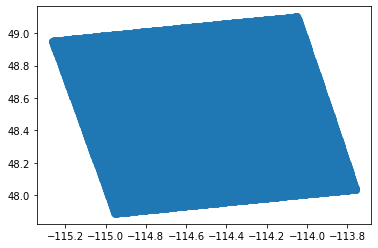

In [44]:
dat = nc.Dataset('/data2/lthapa/2019/FMC/fmc_20190801_20Z.nc')

lat = dat['XLAT_M'][0,:,:]
lon = dat['XLONG_M'][0,:,:]
print(lat.shape, lon.shape)

i0, i1, j0, j1 = bbox2ij(lon, lat, [-115, -114, 48, 49])
print(i0, i1, j0, j1)
plt.scatter(lon[j0:j1, i0:i1], lat[j0:j1, i0:i1])